# Enhanced Binary Classification Model with Summary Score Chart

This notebook preprocesses, trains, and evaluates binary classification models on multiple datasets. Improvements include additional preprocessing, hyperparameter tuning, and a summary score chart at the end.

### early stopping, metric tracking, and processes each dataset

### This version includes additional preprocessing, model adjustments, and cross-validation for more robust performance, along with a summary chart visualizing accuracy, precision, F1 score, and custom score across all datasets.

In [1]:

import warnings
warnings.filterwarnings("ignore")

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

# Base path for datasets
base_path = '../Competition_data'
dataset_folders = [os.path.join(base_path, folder) for folder in os.listdir(base_path)]


In [2]:

def preprocess_data(X, y=None):
    # Handle outliers using RobustScaler
    scaler = RobustScaler()
    X_scaled = scaler.fit_transform(X.fillna(X.mean()))
    
    # Visualize target variable distribution
    if y is not None:
        plt.figure(figsize=(6, 4))
        sns.countplot(x=y.squeeze())
        plt.title('Target Variable Distribution')
        plt.show()
    return X_scaled


In [3]:

def create_and_train_model(X_train, y_train, X_val, y_val, input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        BatchNormalization(),
        Dropout(0.4),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['auc'])
    
    early_stopping = EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True)
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100, batch_size=32, callbacks=[early_stopping])
    
    # Plot training history
    plt.figure(figsize=(8, 5))
    plt.plot(history.history['auc'], label='Train AUC')
    plt.plot(history.history['val_auc'], label='Val AUC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()
    plt.title('Training and Validation AUC')
    plt.show()
    
    return model


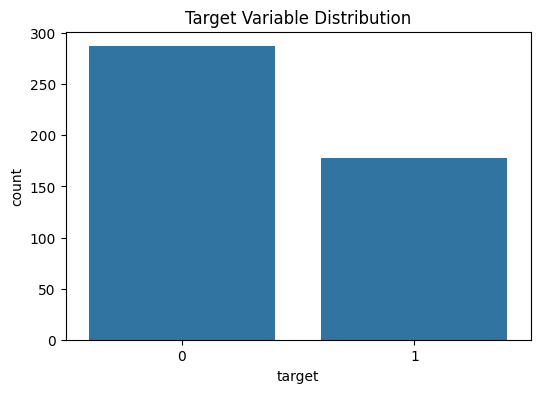

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6155 - loss: 0.7572 - val_auc: 0.9526 - val_loss: 0.5862
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9036 - loss: 0.3848 - val_auc: 0.9856 - val_loss: 0.5065
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9716 - loss: 0.2414 - val_auc: 0.9926 - val_loss: 0.4351
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9734 - loss: 0.2276 - val_auc: 0.9959 - val_loss: 0.3743
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9698 - loss: 0.2272 - val_auc: 0.9976 - val_loss: 0.3214
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9843 - loss: 0.1703 - val_auc: 0.9983 - val_loss: 0.2817
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9785 - loss: 0.1828 - val_auc: 0.9986 - val_loss: 0.2466
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9813 - loss: 0.1853 - val_auc: 0.9986 - val_loss: 0.2280
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.983

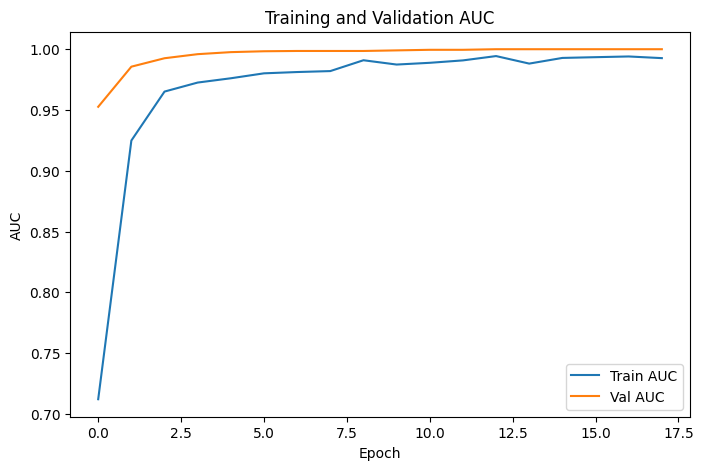

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step 
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - auc: 0.6839 - loss: 0.6420 - val_auc: 0.9559 - val_loss: 0.5926
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9417 - loss: 0.3226 - val_auc: 0.9698 - val_loss: 0.5186
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9623 - loss: 0.2429 - val_auc: 0.9782 - val_loss: 0.4572
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9898 - loss: 0.1541 - val_auc: 0.9818 - val_loss: 0.4037
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9872 - loss: 0.1542 - val_auc: 0.9836 - val_loss: 0.3556
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9939 - loss: 0.1178 - val_auc: 0.9857 - val_loss: 0.3158
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9920 - loss: 0.1242 - val_auc: 0.9854 - val_loss: 0.2813
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9953 - loss: 0.1007 - val_auc: 0.9849 - val_loss: 0.2552
Epoch 9/100
12/12 ━━━━━━

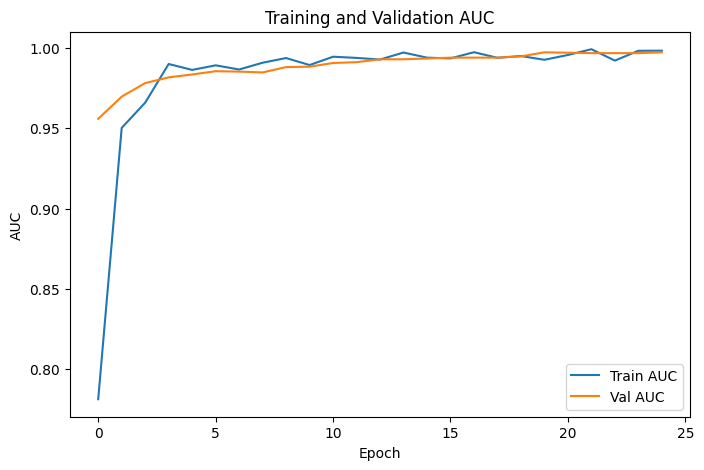

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5361 - loss: 0.8378 - val_auc: 0.9766 - val_loss: 0.5667
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9217 - loss: 0.3547 - val_auc: 0.9926 - val_loss: 0.4803
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9521 - loss: 0.2819 - val_auc: 0.9983 - val_loss: 0.4105
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9847 - loss: 0.1915 - val_auc: 0.9990 - val_loss: 0.3526
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9757 - loss: 0.1989 - val_auc: 0.9990 - val_loss: 0.3028
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9802 - loss: 0.1851 - val_auc: 0.9995 - val_loss: 0.2576
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9846 - loss: 0.1644 - val_auc: 1.0000 - val_loss: 0.2209
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9774 - loss: 0.2051 - val_auc: 1.0000 - val_loss: 0.1900
Epoch 9/100
12/12 ━━━━━━━

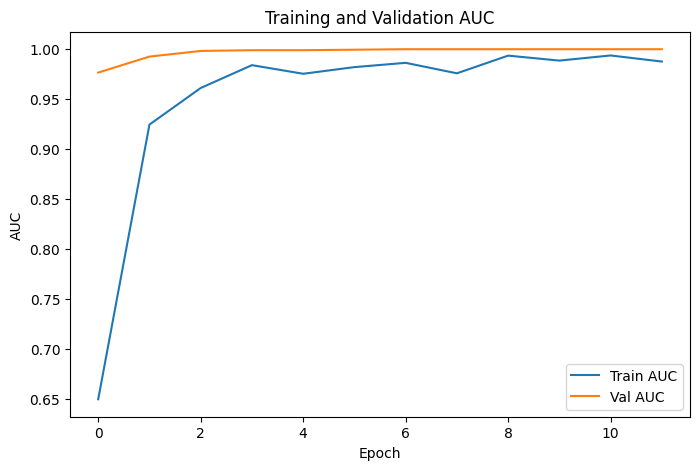

2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/steppWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x177472940> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6049 - loss: 0.7952 - val_auc: 0.9933 - val_loss: 0.5527
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9129 - loss: 0.3901 - val_au

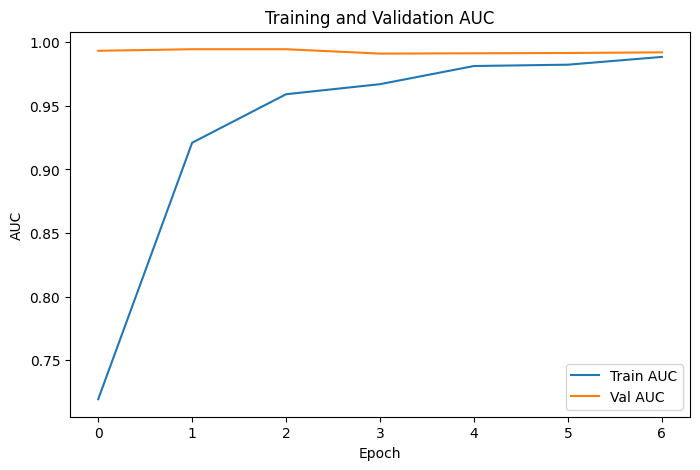

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5895 - loss: 0.9747 - val_auc: 0.9797 - val_loss: 0.6043
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9172 - loss: 0.5038 - val_auc: 0.9833 - val_loss: 0.5077
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9757 - loss: 0.3347 - val_auc: 0.9876 - val_loss: 0.4230
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9685 - loss: 0.3025 - val_auc: 0.9916 - val_loss: 0.3543
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9653 - loss: 0.2509 - val_auc: 0.9923 - val_loss: 0.3035
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9792 - loss: 0.1874 - val_auc: 0.9940 - val_loss: 0.2613
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9950 - loss: 0.1251 - val_auc: 0.9940 - val_loss: 0.2271
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9892 - loss: 0.1348 - val_auc: 0.9952 - val_loss: 0.2058
Epoch 9/100
12/12 ━━━━━━━

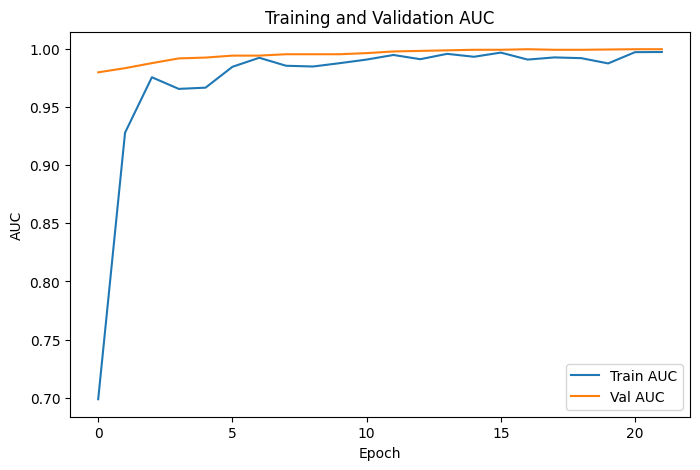

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_2: Accuracy=0.9376, Precision=0.9143, F1 Score=0.9214, Custom Score=0.9234
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step


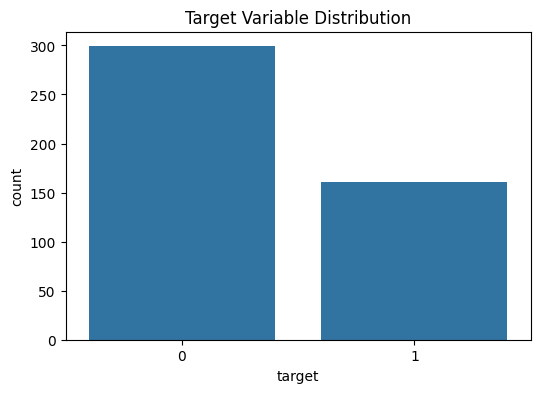

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5027 - loss: 0.8517 - val_auc: 0.7027 - val_loss: 0.6692
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6762 - loss: 0.6554 - val_auc: 0.7476 - val_loss: 0.6504
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8214 - loss: 0.4997 - val_auc: 0.7694 - val_loss: 0.6323
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7695 - loss: 0.5673 - val_auc: 0.7702 - val_loss: 0.6173
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8657 - loss: 0.4341 - val_auc: 0.7793 - val_loss: 0.6027
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8227 - loss: 0.4909 - val_auc: 0.7833 - val_loss: 0.5883
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8166 - loss: 0.5081 - val_auc: 0.7844 - val_loss: 0.5768
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7825 - loss: 0.5541 - val_auc: 0.7790 - val_loss: 0.5683
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.838

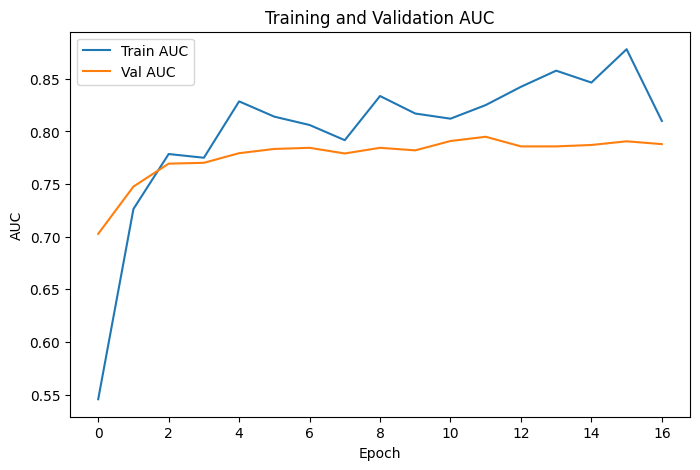

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5333 - loss: 0.7501 - val_auc: 0.7220 - val_loss: 0.6629
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7398 - loss: 0.5813 - val_auc: 0.7525 - val_loss: 0.6388
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7773 - loss: 0.5673 - val_auc: 0.7532 - val_loss: 0.6253
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7819 - loss: 0.5758 - val_auc: 0.7532 - val_loss: 0.6206
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8256 - loss: 0.4899 - val_auc: 0.7473 - val_loss: 0.6215
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8779 - loss: 0.4202 - val_auc: 0.7510 - val_loss: 0.6166
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8073 - loss: 0.4860 - val_auc: 0.7557 - val_loss: 0.6093
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8170 - loss: 0.4891 - val_auc: 0.7582 - val_loss: 0.6060
Epoch 9/100
12/12 ━━━━━━━

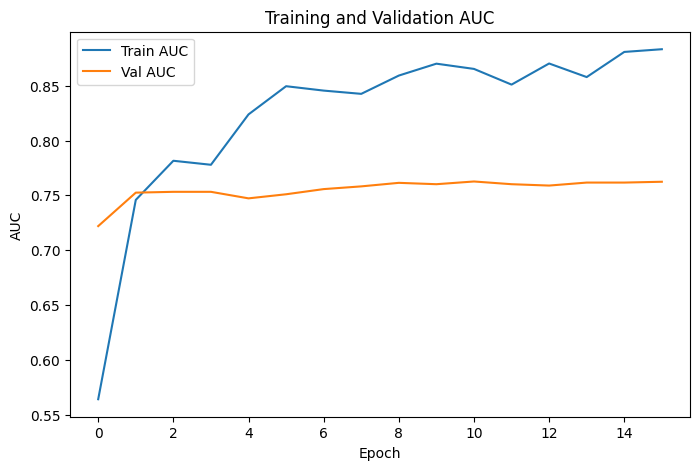

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5860 - loss: 0.7521 - val_auc: 0.8167 - val_loss: 0.6423
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6954 - loss: 0.6380 - val_auc: 0.8299 - val_loss: 0.6120
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8081 - loss: 0.5081 - val_auc: 0.8463 - val_loss: 0.5942
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7708 - loss: 0.5439 - val_auc: 0.8517 - val_loss: 0.5779
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8345 - loss: 0.4803 - val_auc: 0.8519 - val_loss: 0.5618
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7701 - loss: 0.5475 - val_auc: 0.8517 - val_loss: 0.5490
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8131 - loss: 0.5243 - val_auc: 0.8517 - val_loss: 0.5402
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8478 - loss: 0.4673 - val_auc: 0.8545 - val_loss: 0.5334
Epoch 9/100
12/12 ━━━━━━━

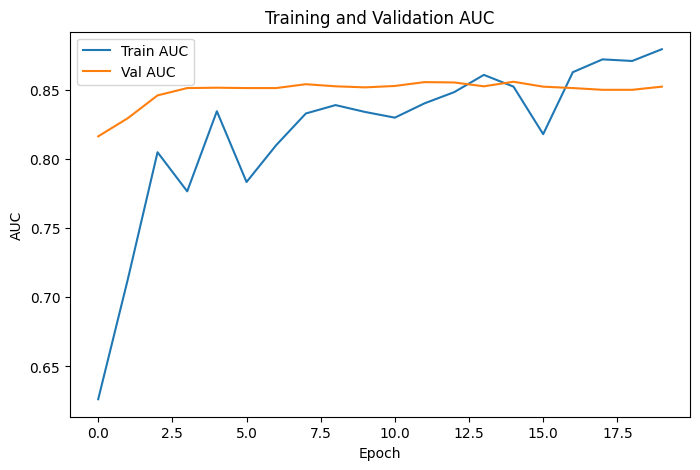

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4755 - loss: 1.1567 - val_auc: 0.6888 - val_loss: 0.6775
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6110 - loss: 0.8942 - val_auc: 0.8200 - val_loss: 0.6248
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7380 - loss: 0.6942 - val_auc: 0.8500 - val_loss: 0.5842
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7999 - loss: 0.5792 - val_auc: 0.8549 - val_loss: 0.5576
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8135 - loss: 0.5080 - val_auc: 0.8595 - val_loss: 0.5389
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7834 - loss: 0.5757 - val_auc: 0.8695 - val_loss: 0.5249
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8262 - loss: 0.5006 - val_auc: 0.8729 - val_loss: 0.5190
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8058 - loss: 0.5201 - val_auc: 0.8767 - val_loss: 0.5104
Epoch 9/100
12/12 ━━━━━━━

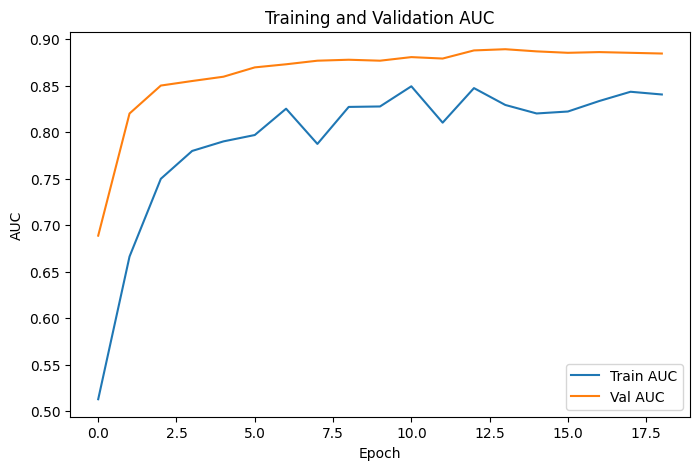

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.6370 - loss: 0.7135 - val_auc: 0.8516 - val_loss: 0.6589
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7462 - loss: 0.5841 - val_auc: 0.8864 - val_loss: 0.6235
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7707 - loss: 0.5970 - val_auc: 0.8750 - val_loss: 0.5929
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8055 - loss: 0.5352 - val_auc: 0.8703 - val_loss: 0.5643
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8233 - loss: 0.4967 - val_auc: 0.8691 - val_loss: 0.5436
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7937 - loss: 0.5751 - val_auc: 0.8641 - val_loss: 0.5306
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8456 - loss: 0.4789 - val_auc: 0.8711 - val_loss: 0.5157


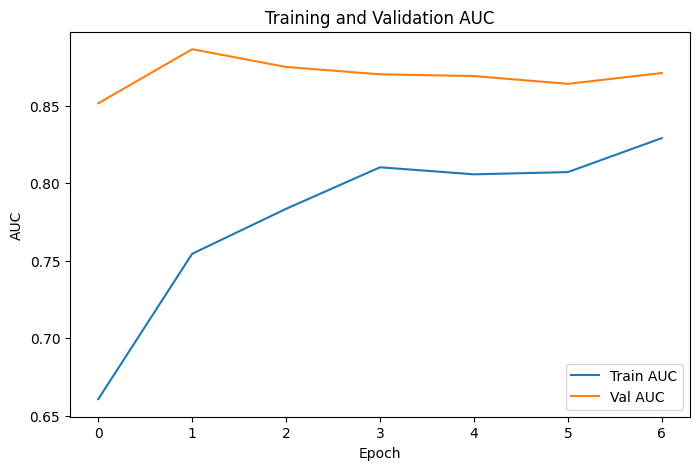

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Dataset_35: Accuracy=0.7674, Precision=0.7919, F1 Score=0.5709, Custom Score=0.7182
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 486us/step


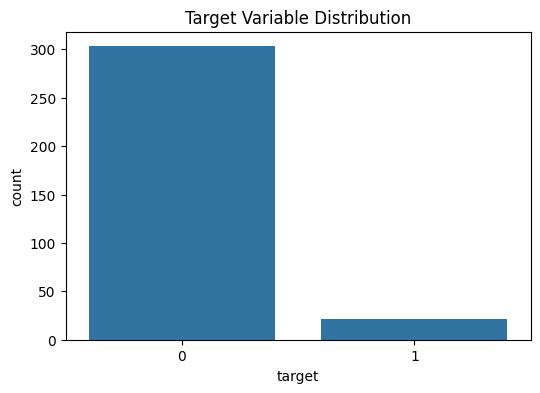

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5855 - loss: 0.8860 - val_auc: 0.7950 - val_loss: 0.6838
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5429 - loss: 0.7991 - val_auc: 0.8283 - val_loss: 0.6072
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5887 - loss: 0.5646 - val_auc: 0.8033 - val_loss: 0.5500
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5904 - loss: 0.4807 - val_auc: 0.7867 - val_loss: 0.5070
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6912 - loss: 0.4005 - val_auc: 0.7367 - val_loss: 0.4732
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6129 - loss: 0.3514 - val_auc: 0.7133 - val_loss: 0.4379
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6796 - loss: 0.3452 - val_auc: 0.6767 - val_loss: 0.4110


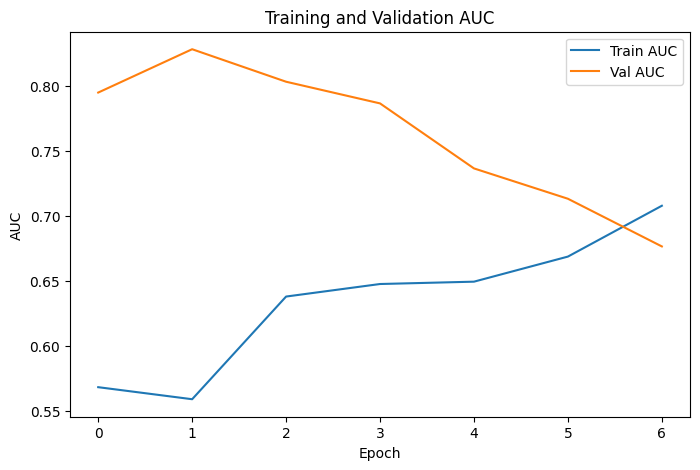

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step 
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.4029 - loss: 0.4460 - val_auc: 0.3658 - val_loss: 0.6068
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5405 - loss: 0.4026 - val_auc: 0.4718 - val_loss: 0.5628
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6572 - loss: 0.3282 - val_auc: 0.5593 - val_loss: 0.5163
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7750 - loss: 0.2779 - val_auc: 0.6370 - val_loss: 0.4721
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4366 - loss: 0.3288 - val_auc: 0.6497 - val_loss: 0.4349
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8500 - loss: 0.2264 - val_auc: 0.6441 - val_loss: 0.4059
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7103 - loss: 0.2504 - val_auc: 0.6511 - val_loss: 0.3784
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6975 - loss: 0.2180 - val_auc: 0.6582 - val_loss: 0.3542
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 

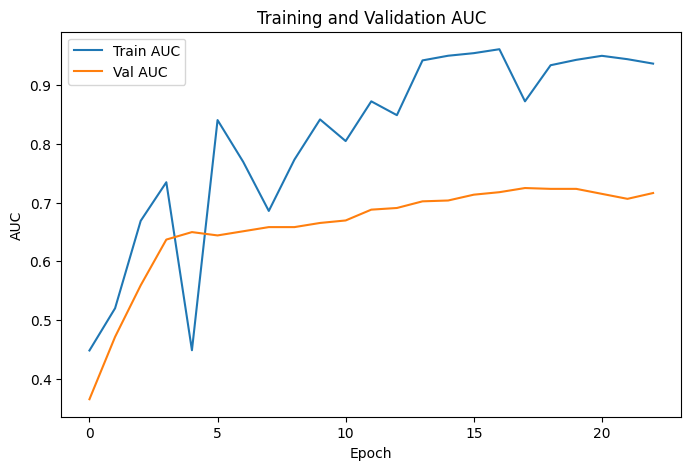

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.6567 - loss: 0.5617 - val_auc: 0.6905 - val_loss: 0.5589
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5255 - loss: 0.4716 - val_auc: 0.8254 - val_loss: 0.5465
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7063 - loss: 0.4189 - val_auc: 0.9127 - val_loss: 0.5295
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7043 - loss: 0.3604 - val_auc: 0.8849 - val_loss: 0.5057
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6504 - loss: 0.3700 - val_auc: 0.9048 - val_loss: 0.4794
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7025 - loss: 0.2756 - val_auc: 0.9206 - val_loss: 0.4508
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6715 - loss: 0.3098 - val_auc: 0.9127 - val_loss: 0.4246
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8194 - loss: 0.2325 - val_auc: 0.9206 - val_loss: 0.3996
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2

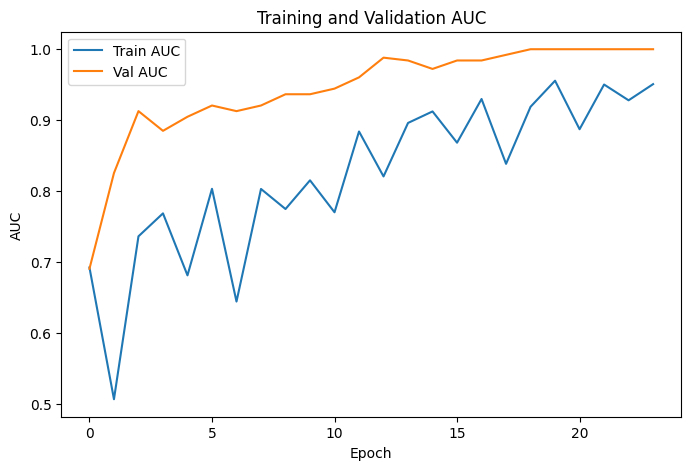

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step 
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.4728 - loss: 1.1445 - val_auc: 0.4746 - val_loss: 0.6442
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6055 - loss: 0.9310 - val_auc: 0.5113 - val_loss: 0.6322
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.4839 - loss: 0.7384 - val_auc: 0.5720 - val_loss: 0.6168
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5711 - loss: 0.6564 - val_auc: 0.5989 - val_loss: 0.5975
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6183 - loss: 0.5652 - val_auc: 0.6342 - val_loss: 0.5739
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5786 - loss: 0.4904 - val_auc: 0.6610 - val_loss: 0.5492
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7725 - loss: 0.3826 - val_auc: 0.6780 - val_loss: 0.5243
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5669 - loss: 0.3922 - val_auc: 0.7218 - val_loss: 0.4980
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 

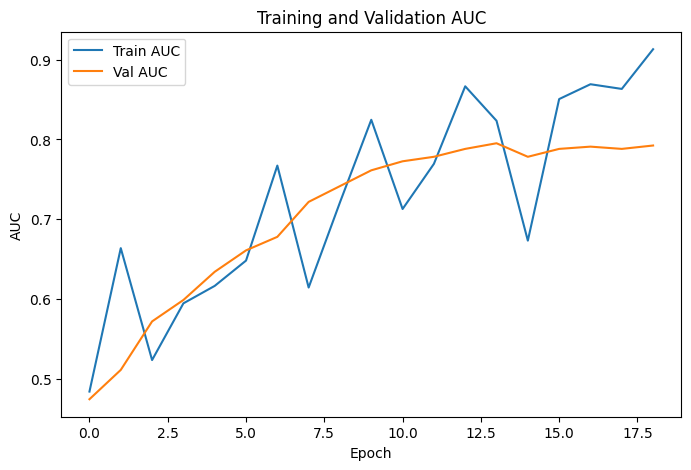

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.5206 - loss: 0.4620 - val_auc: 0.5847 - val_loss: 0.5679
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5876 - loss: 0.3961 - val_auc: 0.7137 - val_loss: 0.5443
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5804 - loss: 0.3508 - val_auc: 0.6532 - val_loss: 0.5102
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7425 - loss: 0.2763 - val_auc: 0.6250 - val_loss: 0.4666
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7030 - loss: 0.2864 - val_auc: 0.6371 - val_loss: 0.4224
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7807 - loss: 0.2356 - val_auc: 0.6532 - val_loss: 0.3810
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7850 - loss: 0.2367 - val_auc: 0.6815 - val_loss: 0.3480


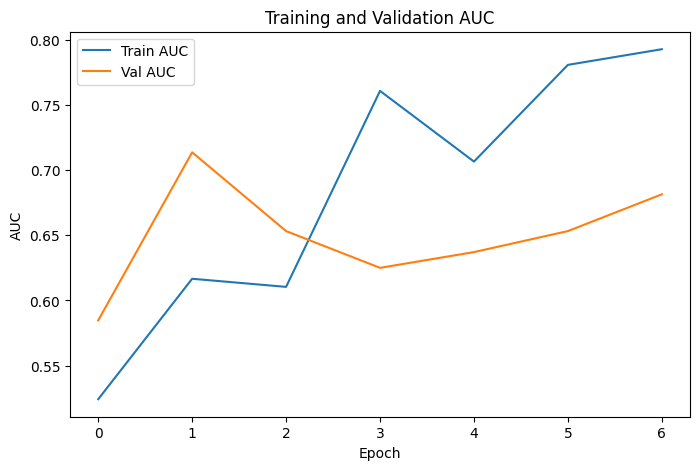

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step
Dataset_5: Accuracy=0.9230, Precision=0.0333, F1 Score=0.0364, Custom Score=0.3011
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


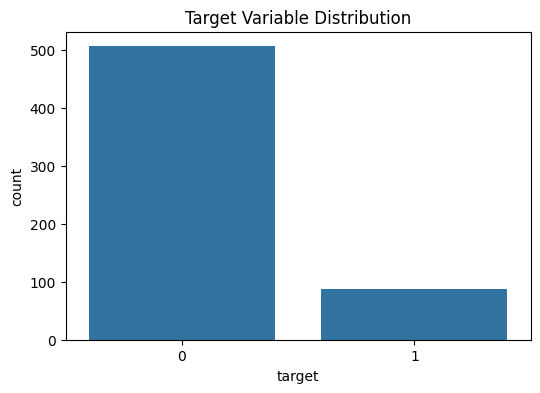

Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.4235 - loss: 0.8413 - val_auc: 0.8229 - val_loss: 0.6041
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6382 - loss: 0.5819 - val_auc: 0.8324 - val_loss: 0.5360
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6913 - loss: 0.4780 - val_auc: 0.8309 - val_loss: 0.4899
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6310 - loss: 0.5140 - val_auc: 0.8240 - val_loss: 0.4599
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7153 - loss: 0.4235 - val_auc: 0.8273 - val_loss: 0.4407
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8003 - loss: 0.3930 - val_auc: 0.8287 - val_loss: 0.4313
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7291 - loss: 0.4176 - val_auc: 0.8269 - val_loss: 0.4151


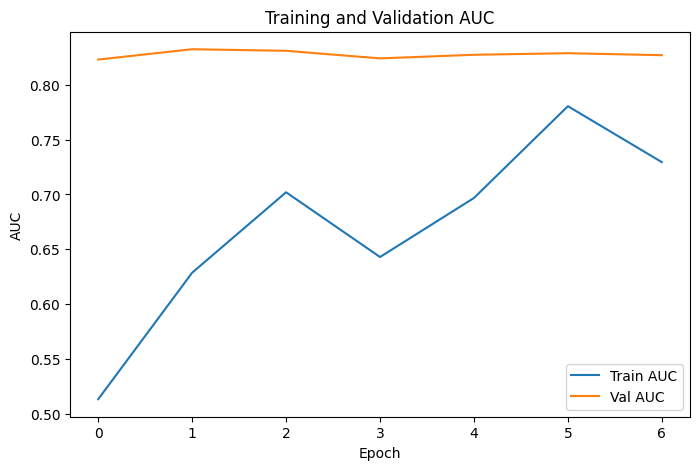

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5160 - loss: 0.9901 - val_auc: 0.6977 - val_loss: 0.6572
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6803 - loss: 0.6453 - val_auc: 0.7092 - val_loss: 0.6195
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6968 - loss: 0.5135 - val_auc: 0.6932 - val_loss: 0.5837
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7301 - loss: 0.4382 - val_auc: 0.7058 - val_loss: 0.5529
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7386 - loss: 0.4056 - val_auc: 0.6950 - val_loss: 0.5308
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6601 - loss: 0.4211 - val_auc: 0.6929 - val_loss: 0.5124
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6867 - loss: 0.4127 - val_auc: 0.6886 - val_loss: 0.4966


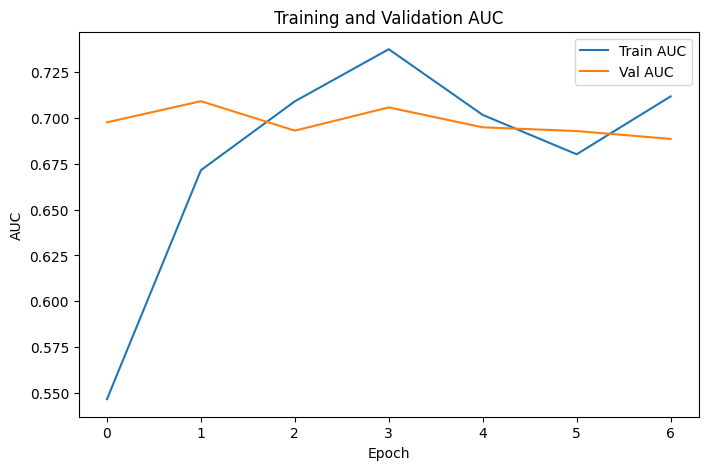

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5337 - loss: 0.6245 - val_auc: 0.7398 - val_loss: 0.5871
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6713 - loss: 0.4907 - val_auc: 0.7788 - val_loss: 0.5330
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6231 - loss: 0.4016 - val_auc: 0.7783 - val_loss: 0.4979
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6893 - loss: 0.4395 - val_auc: 0.7824 - val_loss: 0.4773
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7103 - loss: 0.3682 - val_auc: 0.8059 - val_loss: 0.4612
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7456 - loss: 0.3845 - val_auc: 0.8073 - val_loss: 0.4536
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7180 - loss: 0.3774 - val_auc: 0.8077 - val_loss: 0.4477
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7347 - loss: 0.3695 - val_auc: 0.8107 - val_loss: 0.4456
Epoch 9/100
15/15 ━━━━━━━━

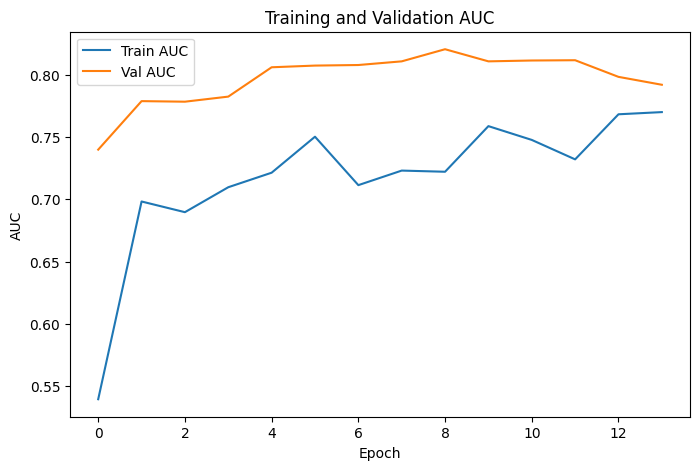

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5074 - loss: 0.5859 - val_auc: 0.7716 - val_loss: 0.5879
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5861 - loss: 0.4883 - val_auc: 0.7417 - val_loss: 0.5351
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7463 - loss: 0.3743 - val_auc: 0.7449 - val_loss: 0.4939
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7933 - loss: 0.3527 - val_auc: 0.7307 - val_loss: 0.4614
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7990 - loss: 0.3703 - val_auc: 0.7315 - val_loss: 0.4334
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7858 - loss: 0.3609 - val_auc: 0.7586 - val_loss: 0.4123


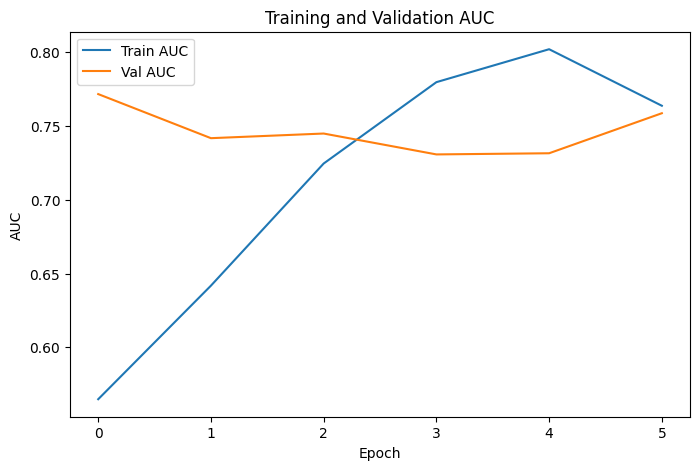

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5316 - loss: 0.6719 - val_auc: 0.6964 - val_loss: 0.6086
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7301 - loss: 0.4799 - val_auc: 0.7393 - val_loss: 0.5617
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7320 - loss: 0.4299 - val_auc: 0.7252 - val_loss: 0.5227
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7742 - loss: 0.3582 - val_auc: 0.7108 - val_loss: 0.4953
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7957 - loss: 0.3543 - val_auc: 0.7065 - val_loss: 0.4772
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7158 - loss: 0.4142 - val_auc: 0.7258 - val_loss: 0.4607
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.7880 - loss: 0.3465 - val_auc: 0.7145 - val_loss: 0.4479


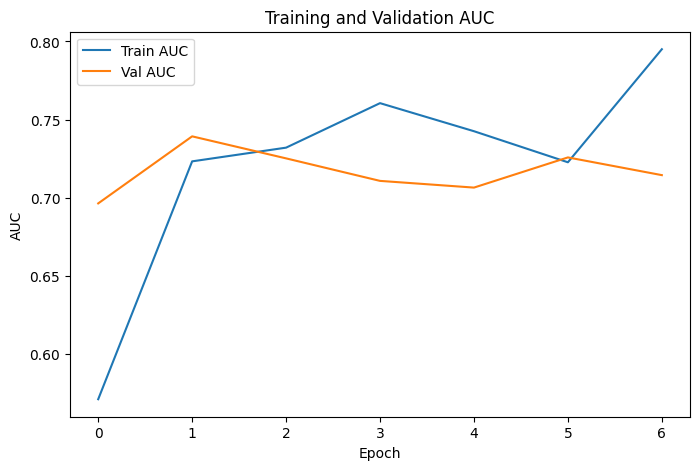

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step 
Dataset_32: Accuracy=0.8534, Precision=0.0000, F1 Score=0.0000, Custom Score=0.2560
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step


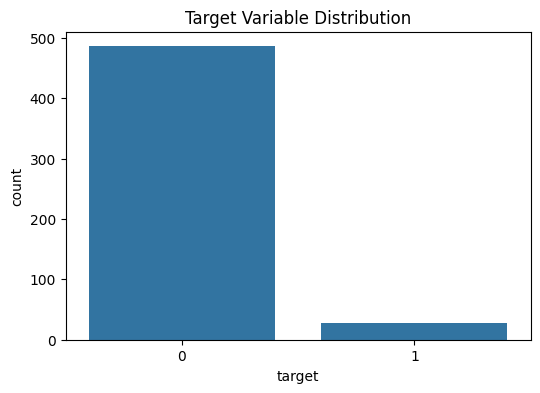

Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.5927 - loss: 1.1371 - val_auc: 0.2724 - val_loss: 0.6829
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5714 - loss: 0.8055 - val_auc: 0.3806 - val_loss: 0.5845
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7747 - loss: 0.5880 - val_auc: 0.3531 - val_loss: 0.4947
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6776 - loss: 0.4588 - val_auc: 0.3786 - val_loss: 0.4140
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4771 - loss: 0.3677 - val_auc: 0.3612 - val_loss: 0.3550
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6670 - loss: 0.3094 - val_auc: 0.3255 - val_loss: 0.3095
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7398 - loss: 0.2661 - val_auc: 0.3143 - val_loss: 0.2761


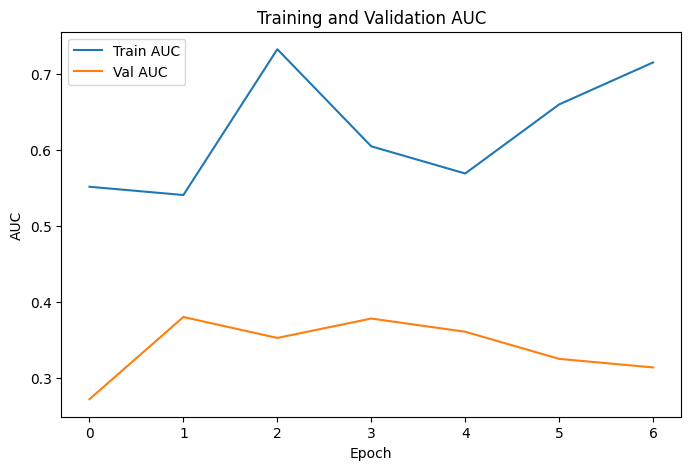

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.5645 - loss: 0.7081 - val_auc: 0.3557 - val_loss: 0.6314
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5456 - loss: 0.5163 - val_auc: 0.3771 - val_loss: 0.5737
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6259 - loss: 0.4155 - val_auc: 0.4149 - val_loss: 0.5214
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4924 - loss: 0.3863 - val_auc: 0.5309 - val_loss: 0.4629
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5781 - loss: 0.3048 - val_auc: 0.5842 - val_loss: 0.4144
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6902 - loss: 0.2453 - val_auc: 0.6469 - val_loss: 0.3747
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6997 - loss: 0.2421 - val_auc: 0.6143 - val_loss: 0.3391
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5312 - loss: 0.2687 - val_auc: 0.6057 - val_loss: 0.3102
Epoch 9/100
13/13 ━━━━━━━━

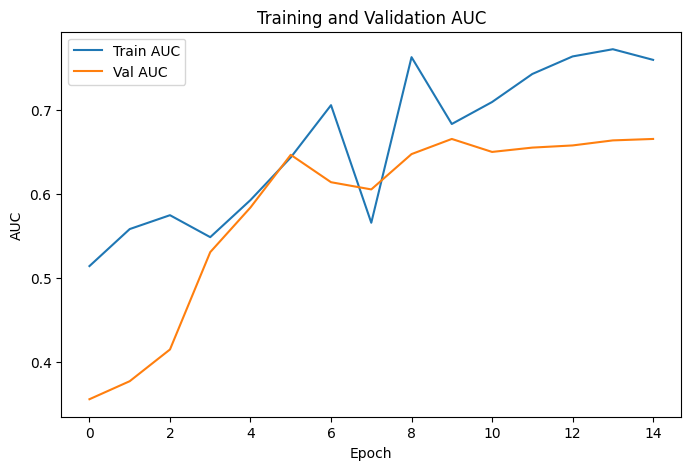

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.7114 - loss: 0.8692 - val_auc: 0.5572 - val_loss: 0.6689
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6277 - loss: 0.6217 - val_auc: 0.4928 - val_loss: 0.5933
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6259 - loss: 0.4841 - val_auc: 0.5230 - val_loss: 0.5340
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5393 - loss: 0.3992 - val_auc: 0.5145 - val_loss: 0.4827
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6954 - loss: 0.3042 - val_auc: 0.5329 - val_loss: 0.4379
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5161 - loss: 0.2717 - val_auc: 0.6033 - val_loss: 0.3972
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7267 - loss: 0.2475 - val_auc: 0.6474 - val_loss: 0.3661
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7109 - loss: 0.2212 - val_auc: 0.6566 - val_loss: 0.3364
Epoch 9/100
13/13 ━━━━━━━━

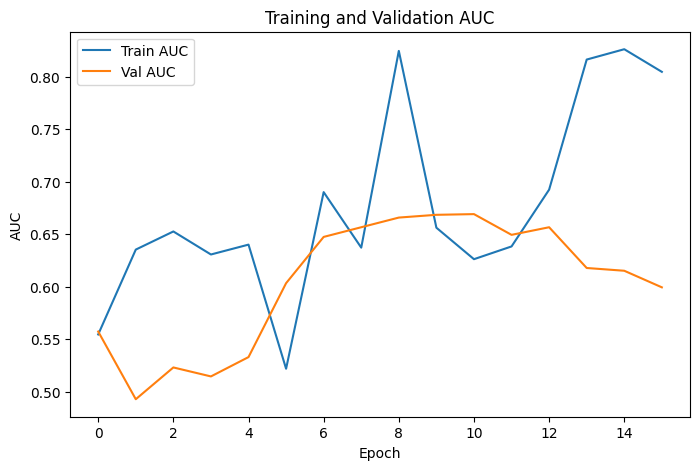

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.3793 - loss: 0.4480 - val_auc: 0.4591 - val_loss: 0.5615
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7317 - loss: 0.2779 - val_auc: 0.4234 - val_loss: 0.5170
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5827 - loss: 0.2619 - val_auc: 0.4613 - val_loss: 0.4605
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6003 - loss: 0.2349 - val_auc: 0.5268 - val_loss: 0.4077
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6943 - loss: 0.2250 - val_auc: 0.6280 - val_loss: 0.3695
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7887 - loss: 0.1904 - val_auc: 0.6644 - val_loss: 0.3387
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4907 - loss: 0.2172 - val_auc: 0.6473 - val_loss: 0.3137
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7454 - loss: 0.1767 - val_auc: 0.6644 - val_loss: 0.2963
Epoch 9/100
13/13 ━━━━━━━

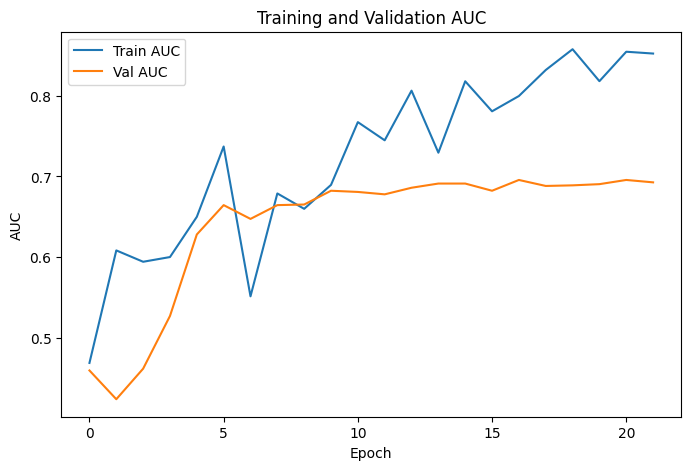

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4075 - loss: 0.8436 - val_auc: 0.9800 - val_loss: 0.6238
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.4060 - loss: 0.5877 - val_auc: 0.9775 - val_loss: 0.5478
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5535 - loss: 0.4352 - val_auc: 0.9700 - val_loss: 0.4640
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4633 - loss: 0.4060 - val_auc: 0.9775 - val_loss: 0.3876
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.3986 - loss: 0.3205 - val_auc: 0.9600 - val_loss: 0.3260
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5512 - loss: 0.3030 - val_auc: 0.9525 - val_loss: 0.2784


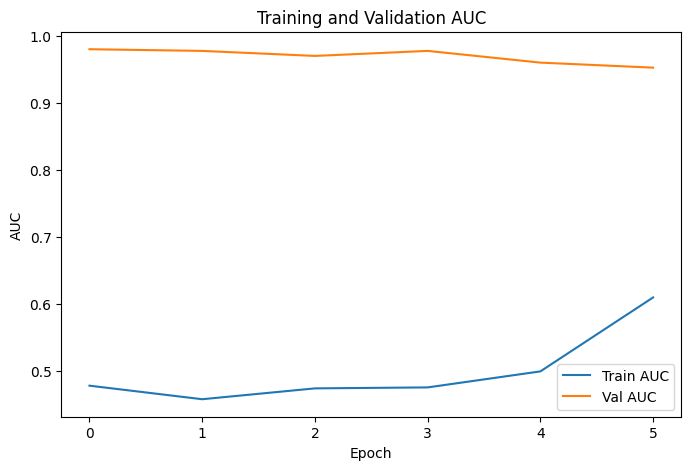

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Dataset_4: Accuracy=0.9378, Precision=0.0667, F1 Score=0.1000, Custom Score=0.3380
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step


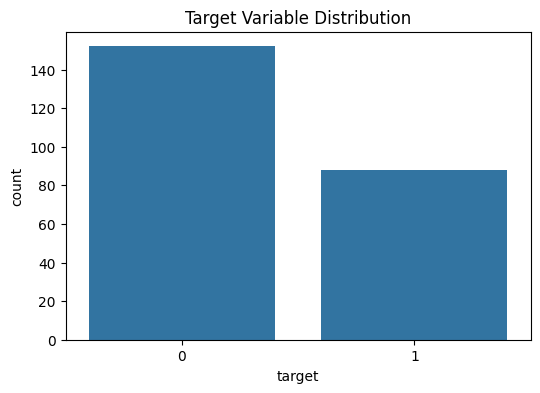

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.4564 - loss: 0.9076 - val_auc: 0.9199 - val_loss: 0.6261
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7699 - loss: 0.6023 - val_auc: 0.9795 - val_loss: 0.5675
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9194 - loss: 0.4158 - val_auc: 0.9951 - val_loss: 0.5233
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9645 - loss: 0.3165 - val_auc: 0.9990 - val_loss: 0.4876
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9582 - loss: 0.2791 - val_auc: 1.0000 - val_loss: 0.4542
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9902 - loss: 0.2346 - val_auc: 1.0000 - val_loss: 0.4275
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9871 - loss: 0.1915 - val_auc: 1.0000 - val_loss: 0.4017
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9943 - loss: 0.1521 - val_auc: 1.0000 - val_loss: 0.3779
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9892 - loss: 0.1601 -

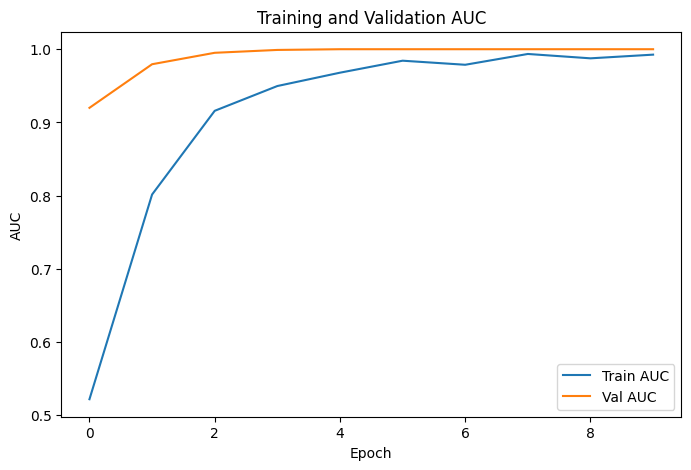

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - auc: 0.5426 - loss: 0.9074 - val_auc: 0.8748 - val_loss: 0.6542
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7531 - loss: 0.5640 - val_auc: 0.9788 - val_loss: 0.5829
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9262 - loss: 0.3702 - val_auc: 0.9894 - val_loss: 0.5206
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9655 - loss: 0.2603 - val_auc: 0.9912 - val_loss: 0.4673
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9608 - loss: 0.2712 - val_auc: 0.9912 - val_loss: 0.4240
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9811 - loss: 0.2078 - val_auc: 0.9903 - val_loss: 0.3919
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9965 - loss: 0.1443 - val_auc: 0.9903 - val_loss: 0.3651
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9942 - loss: 0.1304 - val_auc: 0.9929 - val_loss: 0.3432
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4

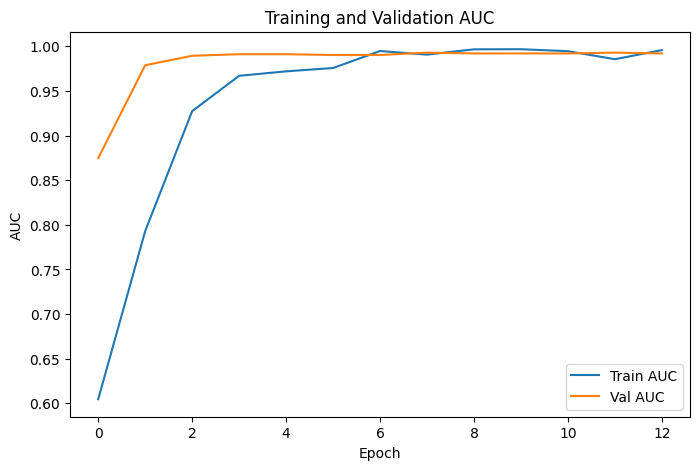

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.5362 - loss: 0.7722 - val_auc: 0.9713 - val_loss: 0.6115
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8038 - loss: 0.5050 - val_auc: 0.9778 - val_loss: 0.5718
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9145 - loss: 0.3923 - val_auc: 0.9852 - val_loss: 0.5391
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9636 - loss: 0.3118 - val_auc: 0.9907 - val_loss: 0.5090
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9832 - loss: 0.2349 - val_auc: 0.9907 - val_loss: 0.4810
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9895 - loss: 0.2129 - val_auc: 0.9926 - val_loss: 0.4561
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9859 - loss: 0.1961 - val_auc: 0.9954 - val_loss: 0.4301
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9982 - loss: 0.1420 - val_auc: 0.9963 - val_loss: 0.4047
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

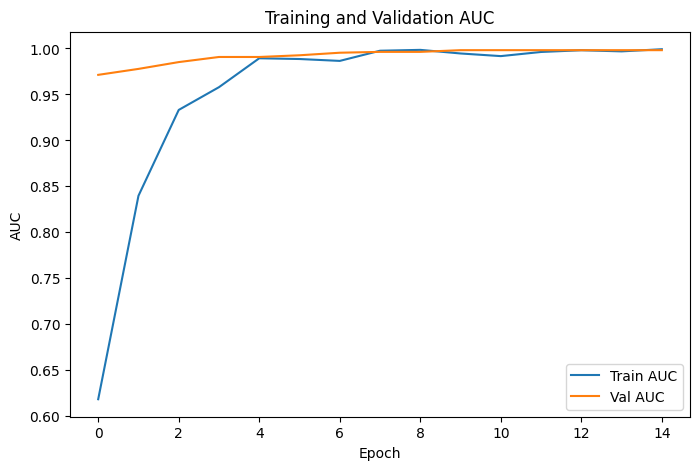

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - auc: 0.4566 - loss: 0.9169 - val_auc: 0.5998 - val_loss: 0.6855
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6786 - loss: 0.7278 - val_auc: 0.9580 - val_loss: 0.6153
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8770 - loss: 0.4517 - val_auc: 0.9937 - val_loss: 0.5585
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9381 - loss: 0.3511 - val_auc: 0.9958 - val_loss: 0.5103
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9639 - loss: 0.2759 - val_auc: 0.9968 - val_loss: 0.4660
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9845 - loss: 0.2279 - val_auc: 0.9979 - val_loss: 0.4261
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9906 - loss: 0.1762 - val_auc: 0.9979 - val_loss: 0.3903
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9905 - loss: 0.1723 - val_auc: 0.9979 - val_loss: 0.3569
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

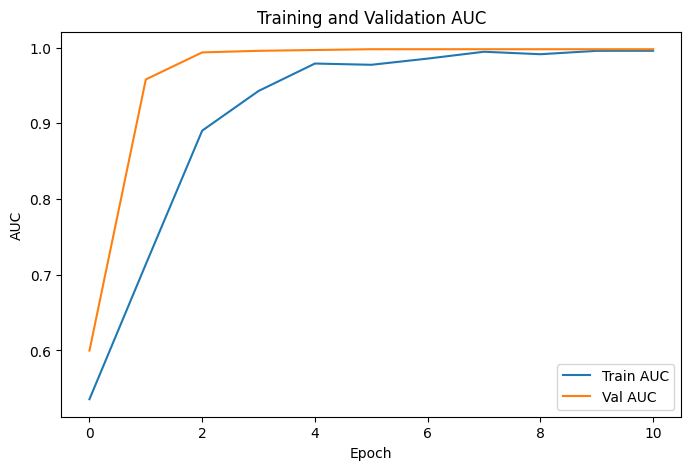

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.5238 - loss: 0.9191 - val_auc: 0.9319 - val_loss: 0.6400
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8071 - loss: 0.6599 - val_auc: 0.9946 - val_loss: 0.5896
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9289 - loss: 0.5095 - val_auc: 0.9973 - val_loss: 0.5494
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9221 - loss: 0.4345 - val_auc: 1.0000 - val_loss: 0.5131
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9789 - loss: 0.3012 - val_auc: 1.0000 - val_loss: 0.4802
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9748 - loss: 0.2533 - val_auc: 1.0000 - val_loss: 0.4515
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9875 - loss: 0.2216 - val_auc: 1.0000 - val_loss: 0.4269
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9729 - loss: 0.2618 - val_auc: 1.0000 - val_loss: 0.4010
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

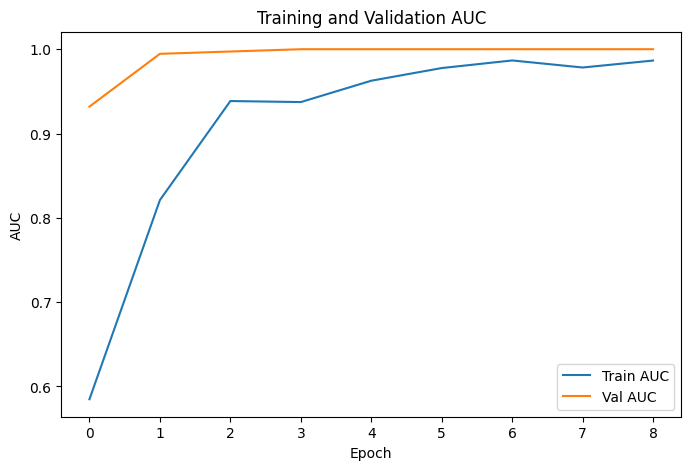

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Dataset_33: Accuracy=0.9417, Precision=0.9628, F1 Score=0.9181, Custom Score=0.9431
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step


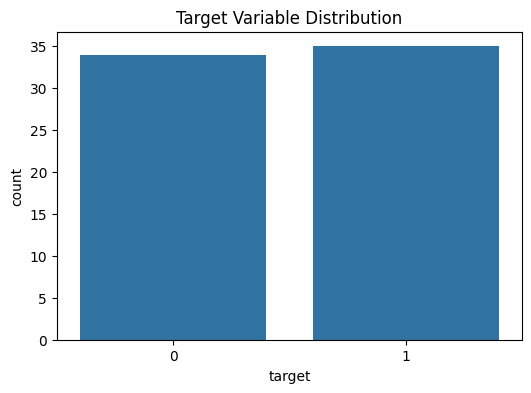

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - auc: 0.4700 - loss: 1.1176 - val_auc: 0.3333 - val_loss: 0.7133
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.3995 - loss: 0.9960 - val_auc: 0.3750 - val_loss: 0.7099
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5980 - loss: 0.8411 - val_auc: 0.4271 - val_loss: 0.7077
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5142 - loss: 0.8061 - val_auc: 0.4479 - val_loss: 0.7055
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.6565 - loss: 0.7266 - val_auc: 0.4167 - val_loss: 0.7031
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.6470 - loss: 0.7396 - val_auc: 0.4792 - val_loss: 0.6996
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6193 - loss: 0.7181 - val_auc: 0.5000 - val_loss: 0.6966
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - auc: 0.7543 - loss: 0.5961 - val_auc: 0.4896 - val_loss: 0.6948
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6432 - loss:

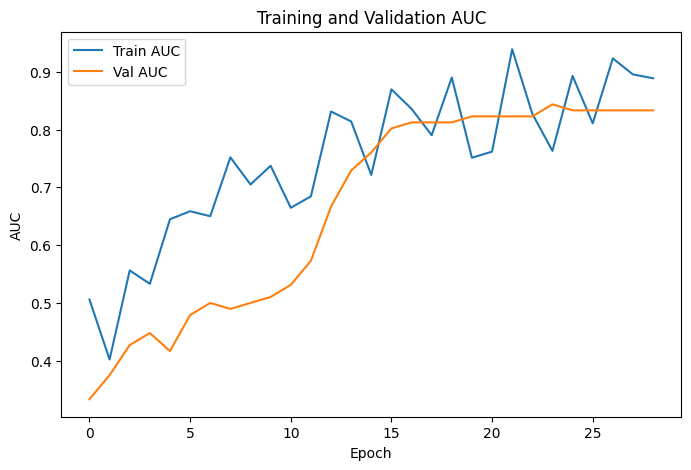

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - auc: 0.6743 - loss: 0.7307 - val_auc: 0.4688 - val_loss: 0.6984
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7334 - loss: 0.6600 - val_auc: 0.4792 - val_loss: 0.6975
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7714 - loss: 0.6192 - val_auc: 0.4896 - val_loss: 0.6956
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6703 - loss: 0.7542 - val_auc: 0.4688 - val_loss: 0.6941
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7837 - loss: 0.5942 - val_auc: 0.4688 - val_loss: 0.6916
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8807 - loss: 0.5008 - val_auc: 0.5104 - val_loss: 0.6898
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8501 - loss: 0.5232 - val_auc: 0.5208 - val_loss: 0.6889
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7700 - loss: 0.6301 - val_auc: 0.4896 - val_loss: 0.6891
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

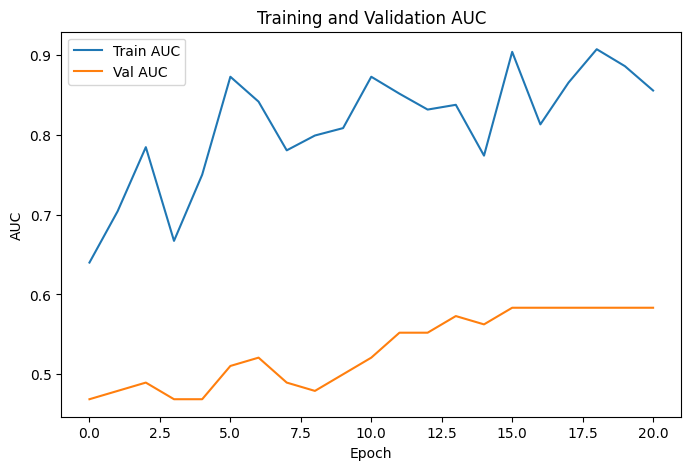

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - auc: 0.5938 - loss: 0.7934 - val_auc: 0.5556 - val_loss: 0.6810
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5939 - loss: 0.7753 - val_auc: 0.5778 - val_loss: 0.6811
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7171 - loss: 0.7244 - val_auc: 0.5889 - val_loss: 0.6788
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.4633 - loss: 0.9352 - val_auc: 0.6333 - val_loss: 0.6776
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.6454 - loss: 0.7293 - val_auc: 0.6778 - val_loss: 0.6764
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - auc: 0.5382 - loss: 0.8364 - val_auc: 0.7111 - val_loss: 0.6759
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6711 - loss: 0.6663 - val_auc: 0.7444 - val_loss: 0.6757
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6371 - loss: 0.7196 - val_auc: 0.7778 - val_loss: 0.6752
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

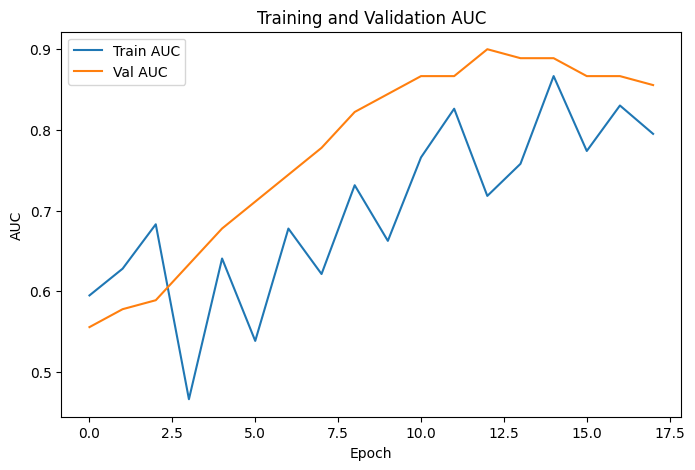

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - auc: 0.4524 - loss: 0.9093 - val_auc: 0.3469 - val_loss: 0.7041
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6217 - loss: 0.7437 - val_auc: 0.3776 - val_loss: 0.7038
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6129 - loss: 0.7514 - val_auc: 0.3776 - val_loss: 0.7049
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6014 - loss: 0.7190 - val_auc: 0.3776 - val_loss: 0.7053
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6247 - loss: 0.7202 - val_auc: 0.3878 - val_loss: 0.7055
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7689 - loss: 0.6010 - val_auc: 0.3776 - val_loss: 0.7060
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.6486 - loss: 0.7627 - val_auc: 0.3878 - val_loss: 0.7068
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6354 - loss: 0.7027 - val_auc: 0.3980 - val_loss: 0.7076
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

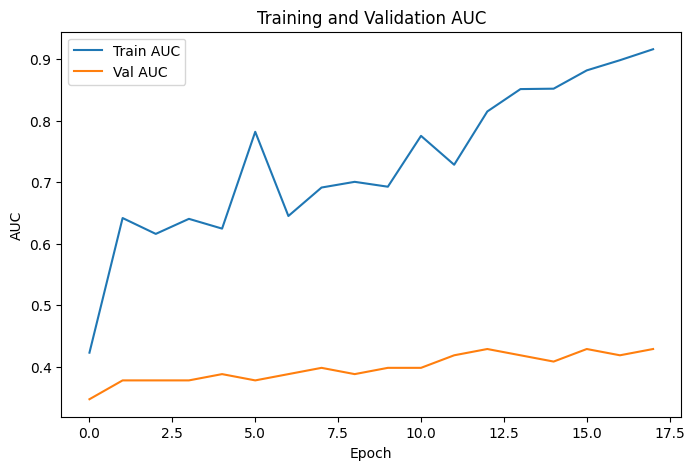

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - auc: 0.5552 - loss: 0.9300 - val_auc: 0.5500 - val_loss: 0.6659
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.3878 - loss: 1.1121 - val_auc: 0.5875 - val_loss: 0.6578
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.4891 - loss: 1.1027 - val_auc: 0.6375 - val_loss: 0.6543
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6590 - loss: 0.8790 - val_auc: 0.6625 - val_loss: 0.6512
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.7600 - loss: 0.7580 - val_auc: 0.6875 - val_loss: 0.6490
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6975 - loss: 0.8552 - val_auc: 0.6750 - val_loss: 0.6484
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7358 - loss: 0.7074 - val_auc: 0.6750 - val_loss: 0.6467
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6756 - loss: 0.7705 - val_auc: 0.6750 - val_loss: 0.6452
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

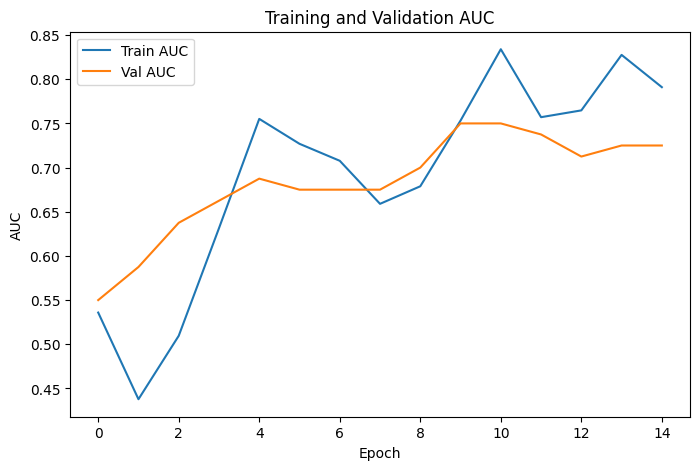

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Dataset_3: Accuracy=0.5934, Precision=0.5804, F1 Score=0.6251, Custom Score=0.5977
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step


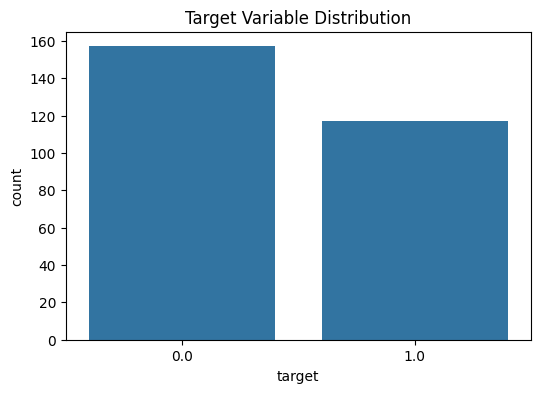

Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.5602 - loss: 0.8078 - val_auc: 0.7657 - val_loss: 0.6552
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6873 - loss: 0.6786 - val_auc: 0.8364 - val_loss: 0.6320
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8009 - loss: 0.5436 - val_auc: 0.8314 - val_loss: 0.6151
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8145 - loss: 0.5604 - val_auc: 0.8271 - val_loss: 0.6056
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8099 - loss: 0.5479 - val_auc: 0.8243 - val_loss: 0.6013
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8652 - loss: 0.4675 - val_auc: 0.8264 - val_loss: 0.5958
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8176 - loss: 0.5386 - val_auc: 0.8200 - val_loss: 0.5907


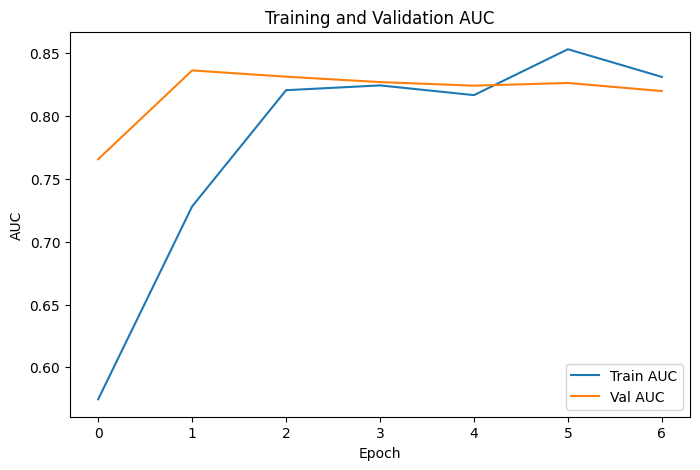

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - auc: 0.6102 - loss: 0.7825 - val_auc: 0.8382 - val_loss: 0.6333
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7709 - loss: 0.5671 - val_auc: 0.8444 - val_loss: 0.6135
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7814 - loss: 0.6008 - val_auc: 0.8512 - val_loss: 0.6000
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8489 - loss: 0.4918 - val_auc: 0.8547 - val_loss: 0.5887
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8304 - loss: 0.5272 - val_auc: 0.8540 - val_loss: 0.5788
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7938 - loss: 0.5875 - val_auc: 0.8561 - val_loss: 0.5742
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8680 - loss: 0.4516 - val_auc: 0.8561 - val_loss: 0.5691
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8930 - loss: 0.4159 - val_auc: 0.8602 - val_loss: 0.5665
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3

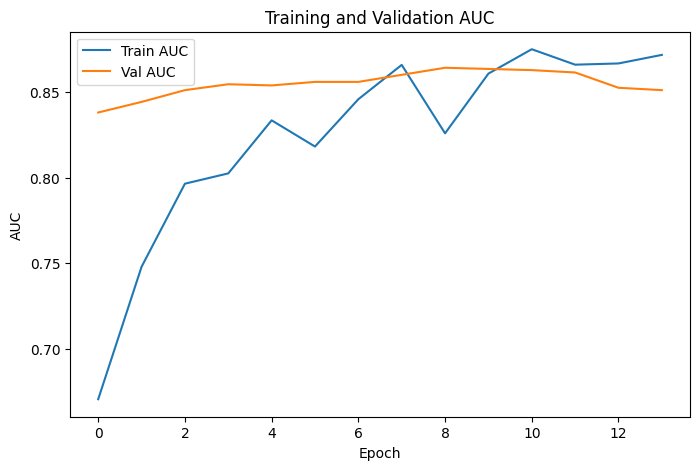

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - auc: 0.4761 - loss: 1.0660 - val_auc: 0.8080 - val_loss: 0.6629
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7238 - loss: 0.7853 - val_auc: 0.8780 - val_loss: 0.6261
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7854 - loss: 0.6488 - val_auc: 0.8833 - val_loss: 0.6034
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8157 - loss: 0.6162 - val_auc: 0.8813 - val_loss: 0.5904
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7647 - loss: 0.6495 - val_auc: 0.8793 - val_loss: 0.5833
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8176 - loss: 0.5529 - val_auc: 0.8780 - val_loss: 0.5776
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8238 - loss: 0.5629 - val_auc: 0.8800 - val_loss: 0.5734
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8339 - loss: 0.5281 - val_auc: 0.8827 - val_loss: 0.5680


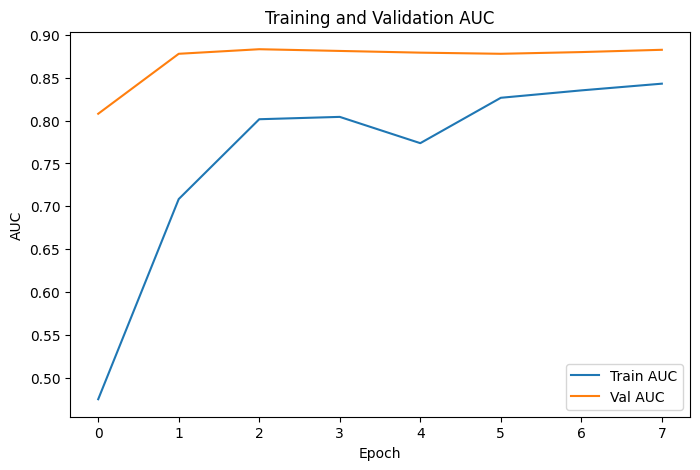

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - auc: 0.6160 - loss: 0.6923 - val_auc: 0.8439 - val_loss: 0.6442
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7393 - loss: 0.5914 - val_auc: 0.8499 - val_loss: 0.6046
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7551 - loss: 0.6811 - val_auc: 0.8565 - val_loss: 0.5866
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8331 - loss: 0.5562 - val_auc: 0.8591 - val_loss: 0.5744
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8767 - loss: 0.4359 - val_auc: 0.8598 - val_loss: 0.5687
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8351 - loss: 0.4815 - val_auc: 0.8611 - val_loss: 0.5662
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8591 - loss: 0.4666 - val_auc: 0.8618 - val_loss: 0.5646
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8643 - loss: 0.4712 - val_auc: 0.8604 - val_loss: 0.5608
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3

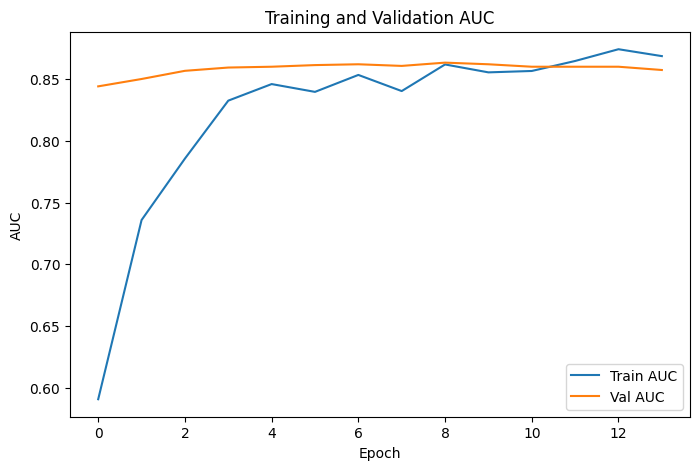

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - auc: 0.5594 - loss: 0.8159 - val_auc: 0.8310 - val_loss: 0.6439
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7531 - loss: 0.6348 - val_auc: 0.8402 - val_loss: 0.6048
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8176 - loss: 0.5502 - val_auc: 0.8402 - val_loss: 0.5802
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7571 - loss: 0.6137 - val_auc: 0.8487 - val_loss: 0.5665
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8448 - loss: 0.5045 - val_auc: 0.8494 - val_loss: 0.5575
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8752 - loss: 0.4371 - val_auc: 0.8480 - val_loss: 0.5541
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8333 - loss: 0.5158 - val_auc: 0.8459 - val_loss: 0.5493
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8296 - loss: 0.5160 - val_auc: 0.8494 - val_loss: 0.5448
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3

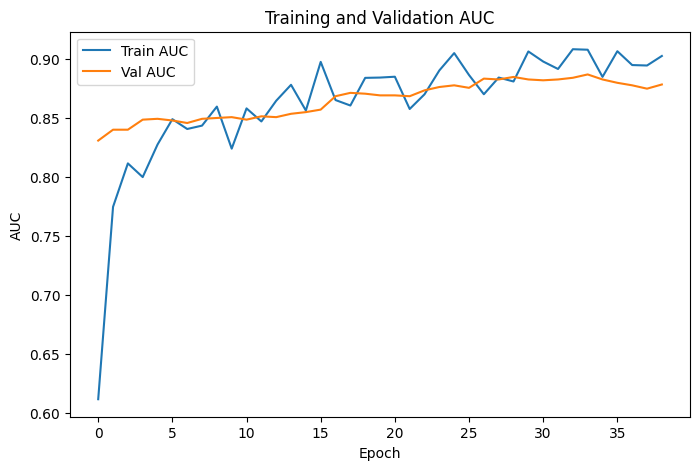

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Dataset_34: Accuracy=0.7702, Precision=0.7641, F1 Score=0.7186, Custom Score=0.7523
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 589us/step


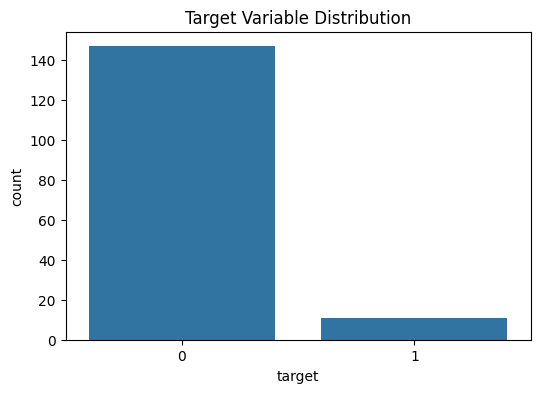

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.4295 - loss: 1.3002 - val_auc: 0.9333 - val_loss: 0.6877
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5938 - loss: 1.0346 - val_auc: 0.9667 - val_loss: 0.6573
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6910 - loss: 0.8701 - val_auc: 1.0000 - val_loss: 0.6300
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6779 - loss: 0.8037 - val_auc: 1.0000 - val_loss: 0.6029
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7252 - loss: 0.7293 - val_auc: 1.0000 - val_loss: 0.5766
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8810 - loss: 0.6190 - val_auc: 1.0000 - val_loss: 0.5495
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7342 - loss: 0.6312 - val_auc: 1.0000 - val_loss: 0.5213
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9262 - loss: 0.4377 - val_auc: 1.0000 - val_loss: 0.4938
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8850 - loss: 0.4108 -

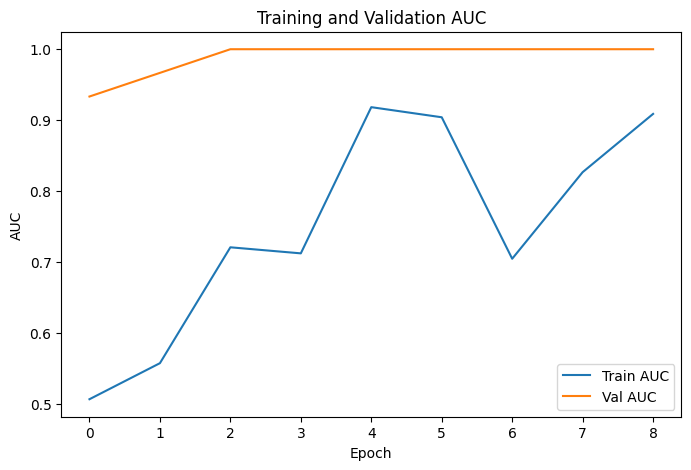

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.6951 - loss: 0.7788 - val_auc: 0.8296 - val_loss: 0.6846
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7259 - loss: 0.7487 - val_auc: 0.9000 - val_loss: 0.6681
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5392 - loss: 0.6960 - val_auc: 0.9333 - val_loss: 0.6500
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6378 - loss: 0.5881 - val_auc: 0.9556 - val_loss: 0.6297
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9181 - loss: 0.5276 - val_auc: 0.9704 - val_loss: 0.6092
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8478 - loss: 0.4019 - val_auc: 0.9556 - val_loss: 0.5890
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7294 - loss: 0.4141 - val_auc: 0.9741 - val_loss: 0.5681
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6831 - loss: 0.3572 - val_auc: 0.9667 - val_loss: 0.5458
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6

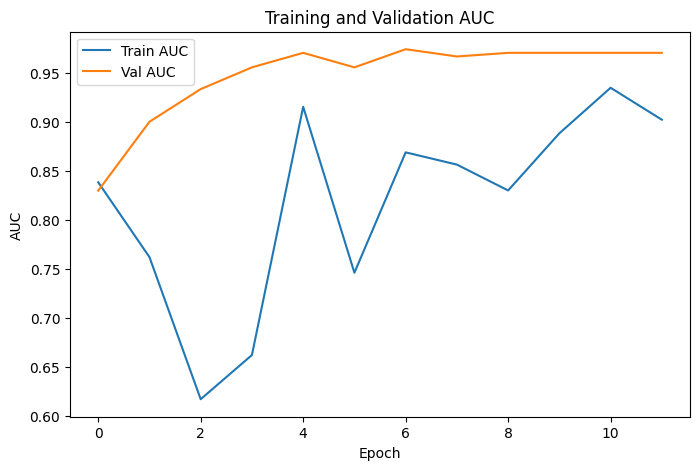

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.2074 - loss: 0.5735 - val_auc: 0.4080 - val_loss: 0.6041
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.3045 - loss: 0.5034 - val_auc: 0.6092 - val_loss: 0.6006
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.4282 - loss: 0.4967 - val_auc: 0.9080 - val_loss: 0.5940
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7514 - loss: 0.3139 - val_auc: 0.9655 - val_loss: 0.5841
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6993 - loss: 0.3124 - val_auc: 0.9655 - val_loss: 0.5676
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8389 - loss: 0.2793 - val_auc: 0.9885 - val_loss: 0.5509
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7001 - loss: 0.2956 - val_auc: 0.9425 - val_loss: 0.5333
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9126 - loss: 0.2093 - val_auc: 0.9310 - val_loss: 0.5143
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

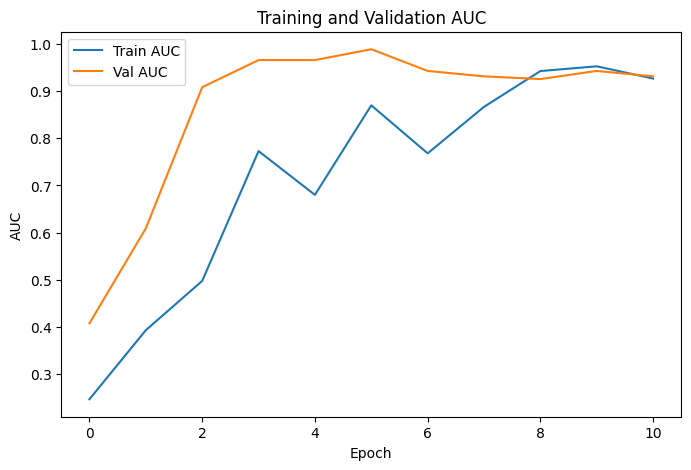

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - auc: 0.6052 - loss: 0.7054 - val_auc: 1.0000 - val_loss: 0.6843
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5857 - loss: 0.6402 - val_auc: 1.0000 - val_loss: 0.6589
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6954 - loss: 0.5656 - val_auc: 1.0000 - val_loss: 0.6290
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8330 - loss: 0.5347 - val_auc: 1.0000 - val_loss: 0.5988
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8801 - loss: 0.4812 - val_auc: 1.0000 - val_loss: 0.5700
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9179 - loss: 0.3881 - val_auc: 1.0000 - val_loss: 0.5428


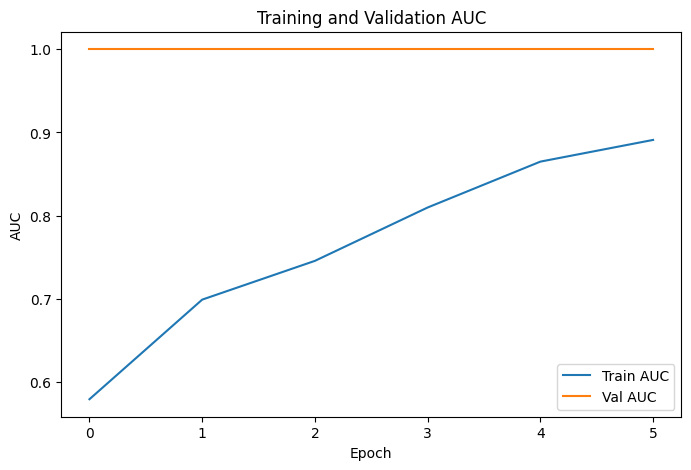

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.4358 - loss: 0.7178 - val_auc: 0.0000e+00 - val_loss: 0.6666
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5822 - loss: 0.6523 - val_auc: 0.0000e+00 - val_loss: 0.6440
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6428 - loss: 0.5656 - val_auc: 0.0000e+00 - val_loss: 0.6207
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7697 - loss: 0.4379 - val_auc: 0.0000e+00 - val_loss: 0.5960
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9400 - loss: 0.3696 - val_auc: 0.0000e+00 - val_loss: 0.5721
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6195 - loss: 0.4238 - val_auc: 0.0000e+00 - val_loss: 0.5473


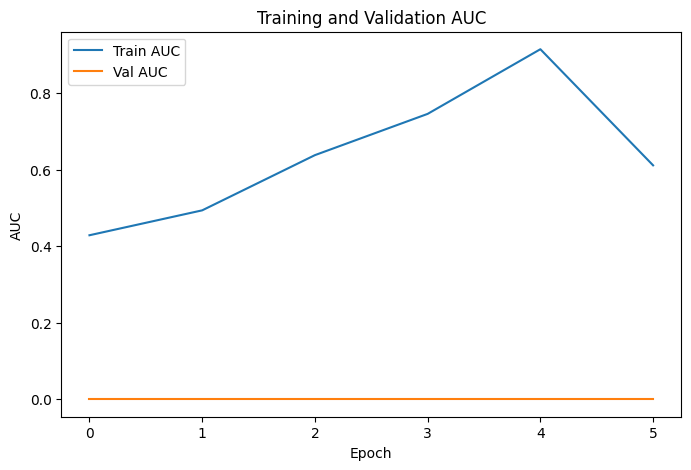

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Dataset_45: Accuracy=0.8659, Precision=0.4182, F1 Score=0.3000, Custom Score=0.5171
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 600us/step


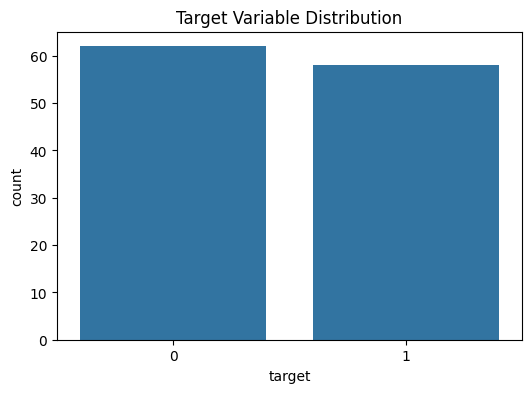

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - auc: 0.4004 - loss: 1.0039 - val_auc: 0.5105 - val_loss: 0.6936
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7133 - loss: 0.7572 - val_auc: 1.0000 - val_loss: 0.6558
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8871 - loss: 0.4685 - val_auc: 1.0000 - val_loss: 0.6218
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9471 - loss: 0.4024 - val_auc: 1.0000 - val_loss: 0.5923
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9648 - loss: 0.2841 - val_auc: 1.0000 - val_loss: 0.5662
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9951 - loss: 0.1944 - val_auc: 1.0000 - val_loss: 0.5429
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9925 - loss: 0.2223 - val_auc: 1.0000 - val_loss: 0.5224


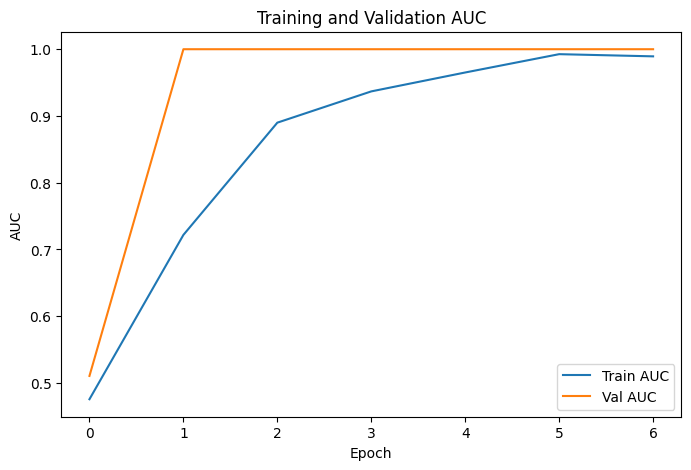

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - auc: 0.7370 - loss: 0.8853 - val_auc: 0.8786 - val_loss: 0.6447
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7835 - loss: 0.8464 - val_auc: 0.9643 - val_loss: 0.6246
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8559 - loss: 0.5916 - val_auc: 0.9929 - val_loss: 0.6041
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9400 - loss: 0.4698 - val_auc: 1.0000 - val_loss: 0.5835
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9554 - loss: 0.3414 - val_auc: 1.0000 - val_loss: 0.5667
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9708 - loss: 0.3069 - val_auc: 1.0000 - val_loss: 0.5508
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9962 - loss: 0.2462 - val_auc: 1.0000 - val_loss: 0.5355
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9927 - loss: 0.1647 - val_auc: 1.0000 - val_loss: 0.5196
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7

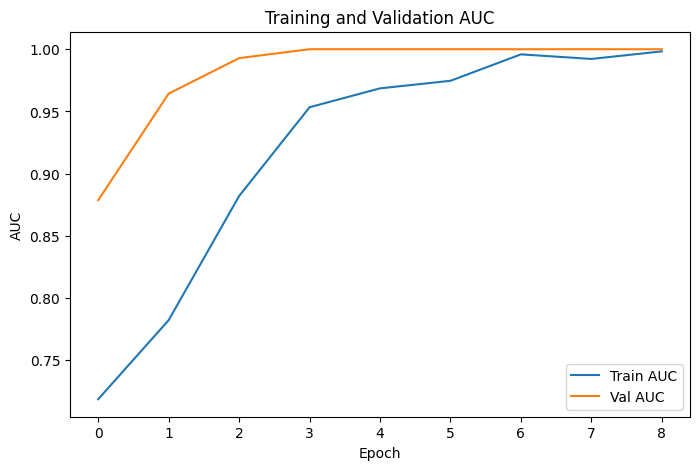

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - auc: 0.6305 - loss: 0.7748 - val_auc: 0.8472 - val_loss: 0.6694
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6506 - loss: 0.7977 - val_auc: 0.9444 - val_loss: 0.6340
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8853 - loss: 0.4354 - val_auc: 1.0000 - val_loss: 0.6001
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9534 - loss: 0.3089 - val_auc: 1.0000 - val_loss: 0.5697
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9275 - loss: 0.3468 - val_auc: 1.0000 - val_loss: 0.5439
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9682 - loss: 0.2245 - val_auc: 1.0000 - val_loss: 0.5214
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9912 - loss: 0.1579 - val_auc: 1.0000 - val_loss: 0.5021
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9857 - loss: 0.1929 - val_auc: 1.0000 - val_loss: 0.4841


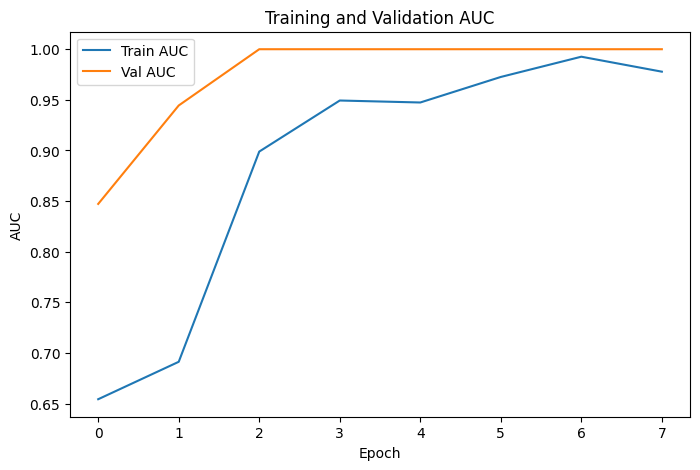

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - auc: 0.4698 - loss: 0.9987 - val_auc: 0.9792 - val_loss: 0.6546
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8165 - loss: 0.6417 - val_auc: 1.0000 - val_loss: 0.6263
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8688 - loss: 0.4728 - val_auc: 1.0000 - val_loss: 0.6048
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9756 - loss: 0.3685 - val_auc: 1.0000 - val_loss: 0.5854
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9482 - loss: 0.3634 - val_auc: 1.0000 - val_loss: 0.5664
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9791 - loss: 0.2622 - val_auc: 1.0000 - val_loss: 0.5477
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.9879 - loss: 0.2098 - val_auc: 1.0000 - val_loss: 0.5308


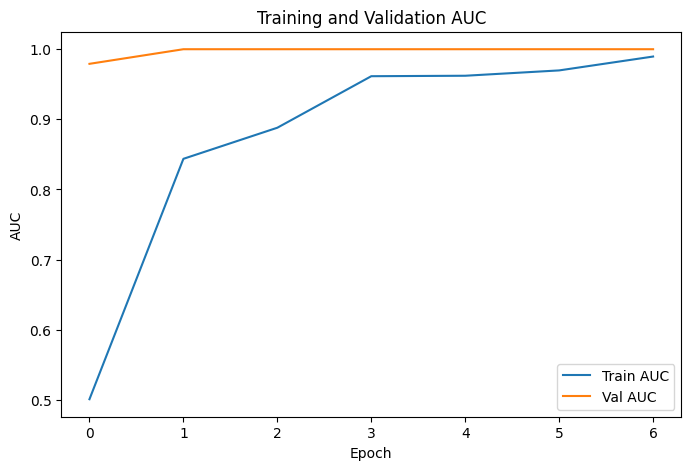

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - auc: 0.4657 - loss: 0.8370 - val_auc: 0.6958 - val_loss: 0.6687
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.6706 - loss: 0.7174 - val_auc: 0.8671 - val_loss: 0.6253
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - auc: 0.8705 - loss: 0.4688 - val_auc: 0.9441 - val_loss: 0.5898
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.9242 - loss: 0.3863 - val_auc: 0.9930 - val_loss: 0.5575
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.9495 - loss: 0.3184 - val_auc: 1.0000 - val_loss: 0.5272
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9760 - loss: 0.2441 - val_auc: 1.0000 - val_loss: 0.5007
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9836 - loss: 0.2190 - val_auc: 1.0000 - val_loss: 0.4771
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9879 - loss: 0.1941 - val_auc: 1.0000 - val_loss: 0.4565
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 

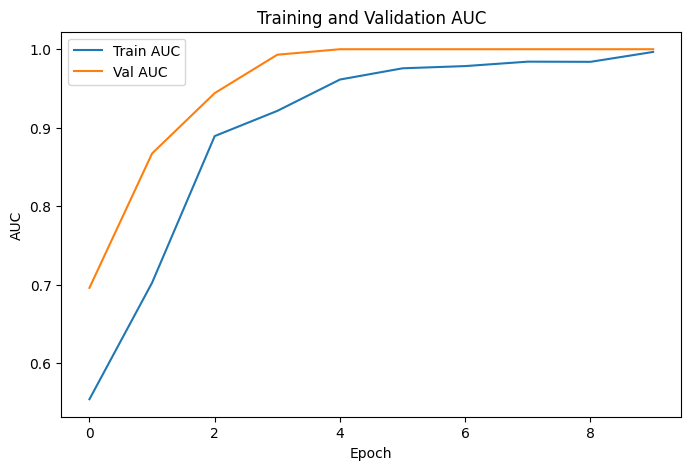

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Dataset_42: Accuracy=0.9083, Precision=0.8606, F1 Score=0.9140, Custom Score=0.8909
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step


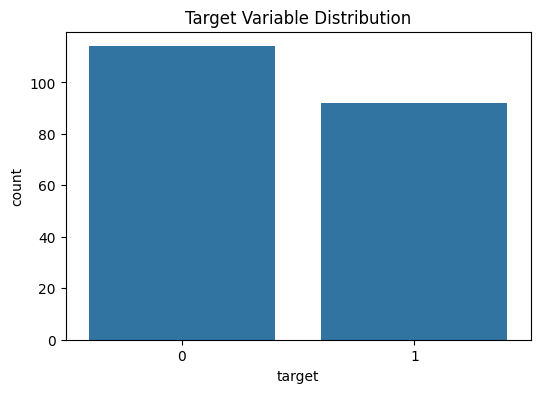

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.5647 - loss: 0.8982 - val_auc: 0.9894 - val_loss: 0.6371
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7899 - loss: 0.5856 - val_auc: 0.9988 - val_loss: 0.5887
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9338 - loss: 0.3574 - val_auc: 1.0000 - val_loss: 0.5525
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9433 - loss: 0.3323 - val_auc: 1.0000 - val_loss: 0.5200
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9744 - loss: 0.2487 - val_auc: 1.0000 - val_loss: 0.4859
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9903 - loss: 0.1777 - val_auc: 1.0000 - val_loss: 0.4555
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9903 - loss: 0.1964 - val_auc: 1.0000 - val_loss: 0.4276
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9849 - loss: 0.1869 - val_auc: 1.0000 - val_loss: 0.4012


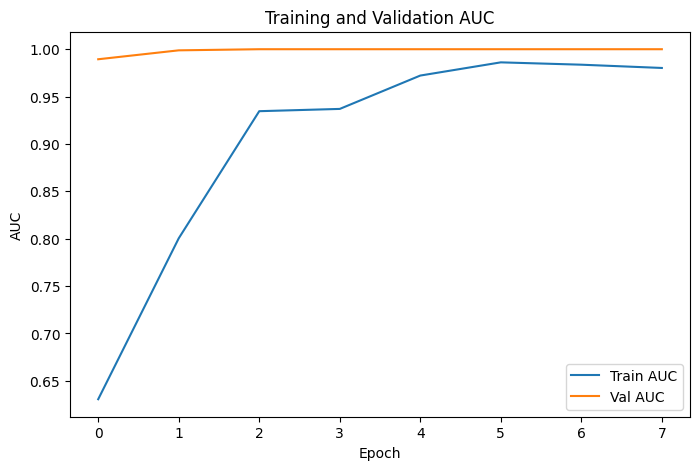

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.5208 - loss: 0.8372 - val_auc: 0.9412 - val_loss: 0.6447
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7780 - loss: 0.5557 - val_auc: 0.9600 - val_loss: 0.6143
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8948 - loss: 0.4407 - val_auc: 0.9687 - val_loss: 0.5897
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9226 - loss: 0.3926 - val_auc: 0.9800 - val_loss: 0.5690
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9590 - loss: 0.3243 - val_auc: 0.9850 - val_loss: 0.5500
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9602 - loss: 0.3104 - val_auc: 0.9850 - val_loss: 0.5322
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9918 - loss: 0.2053 - val_auc: 0.9850 - val_loss: 0.5119
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9938 - loss: 0.1893 - val_auc: 0.9862 - val_loss: 0.4936
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

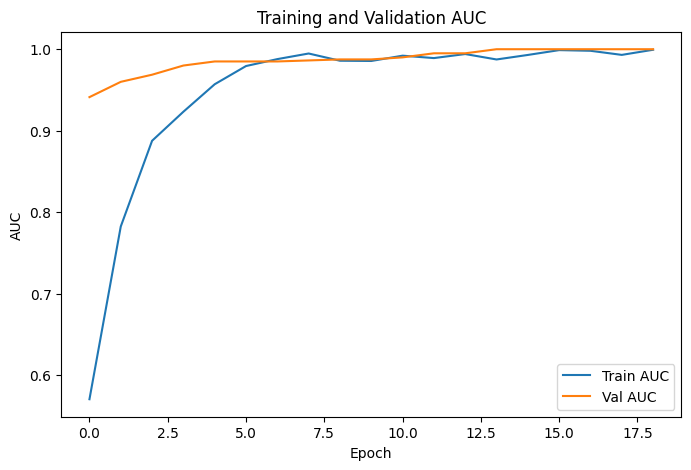

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - auc: 0.4224 - loss: 1.0071 - val_auc: 0.6639 - val_loss: 0.6874
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7781 - loss: 0.5984 - val_auc: 0.9330 - val_loss: 0.6308
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8644 - loss: 0.4668 - val_auc: 0.9725 - val_loss: 0.5824
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9411 - loss: 0.3206 - val_auc: 0.9725 - val_loss: 0.5487
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9449 - loss: 0.3134 - val_auc: 0.9809 - val_loss: 0.5212
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9854 - loss: 0.1924 - val_auc: 0.9821 - val_loss: 0.4979
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9741 - loss: 0.2220 - val_auc: 0.9868 - val_loss: 0.4781
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9911 - loss: 0.1735 - val_auc: 0.9904 - val_loss: 0.4608
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

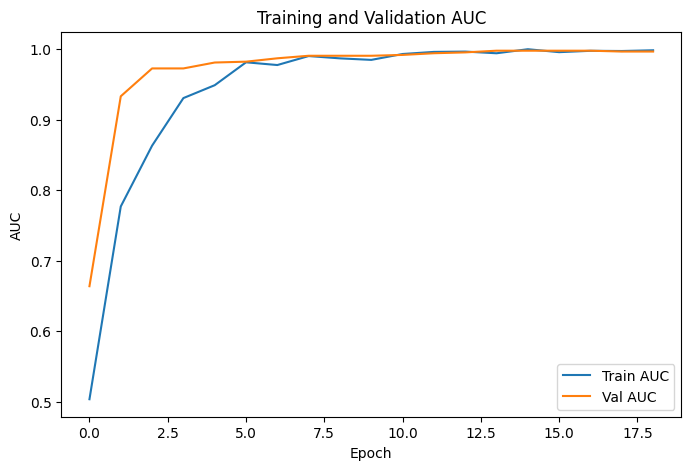

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - auc: 0.6680 - loss: 1.0334 - val_auc: 0.9881 - val_loss: 0.6117
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8886 - loss: 0.6812 - val_auc: 0.9857 - val_loss: 0.5702
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9387 - loss: 0.5013 - val_auc: 0.9881 - val_loss: 0.5412
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9725 - loss: 0.3447 - val_auc: 0.9905 - val_loss: 0.5169
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9864 - loss: 0.2363 - val_auc: 0.9952 - val_loss: 0.4973
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9857 - loss: 0.2106 - val_auc: 0.9976 - val_loss: 0.4822
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9957 - loss: 0.1654 - val_auc: 0.9976 - val_loss: 0.4651
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9965 - loss: 0.1409 - val_auc: 1.0000 - val_loss: 0.4462
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7

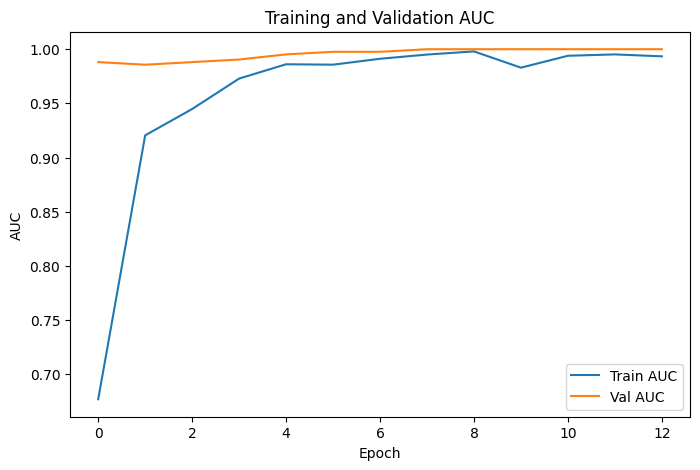

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.5775 - loss: 0.7739 - val_auc: 1.0000 - val_loss: 0.6297
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8585 - loss: 0.4893 - val_auc: 1.0000 - val_loss: 0.5888
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8865 - loss: 0.4300 - val_auc: 1.0000 - val_loss: 0.5539
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9559 - loss: 0.3101 - val_auc: 1.0000 - val_loss: 0.5238
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9719 - loss: 0.2780 - val_auc: 1.0000 - val_loss: 0.4963
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9703 - loss: 0.2752 - val_auc: 1.0000 - val_loss: 0.4722


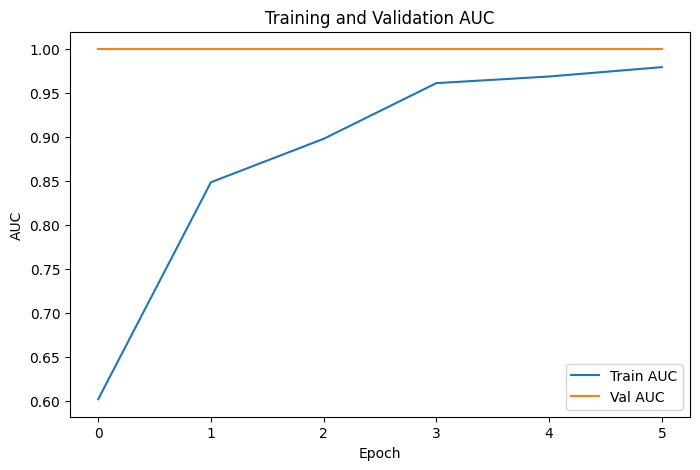

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Dataset_27: Accuracy=0.9612, Precision=0.9491, F1 Score=0.9557, Custom Score=0.9547
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step


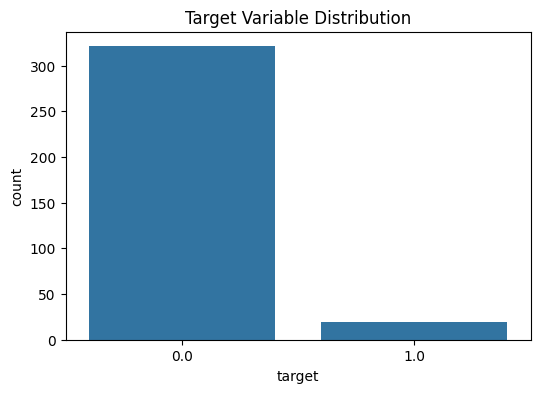

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.5781 - loss: 0.9593 - val_auc: 1.0000 - val_loss: 0.6297
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6379 - loss: 0.6888 - val_auc: 1.0000 - val_loss: 0.5866
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8818 - loss: 0.5279 - val_auc: 1.0000 - val_loss: 0.5352
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8662 - loss: 0.4308 - val_auc: 1.0000 - val_loss: 0.4842
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9476 - loss: 0.3450 - val_auc: 1.0000 - val_loss: 0.4309
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9969 - loss: 0.2248 - val_auc: 1.0000 - val_loss: 0.3782


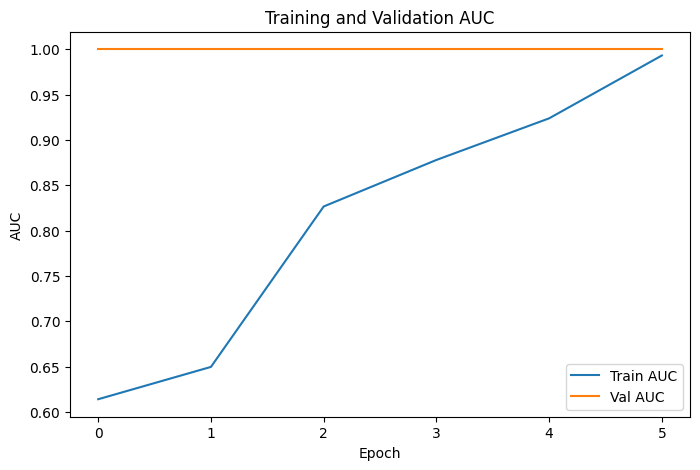

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.4166 - loss: 0.9283 - val_auc: 0.8258 - val_loss: 0.6385
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6780 - loss: 0.7332 - val_auc: 1.0000 - val_loss: 0.5940
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7775 - loss: 0.6319 - val_auc: 1.0000 - val_loss: 0.5406
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9846 - loss: 0.3407 - val_auc: 1.0000 - val_loss: 0.4814
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8610 - loss: 0.3533 - val_auc: 1.0000 - val_loss: 0.4246
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7947 - loss: 0.3260 - val_auc: 1.0000 - val_loss: 0.3677
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9695 - loss: 0.2402 - val_auc: 1.0000 - val_loss: 0.3143


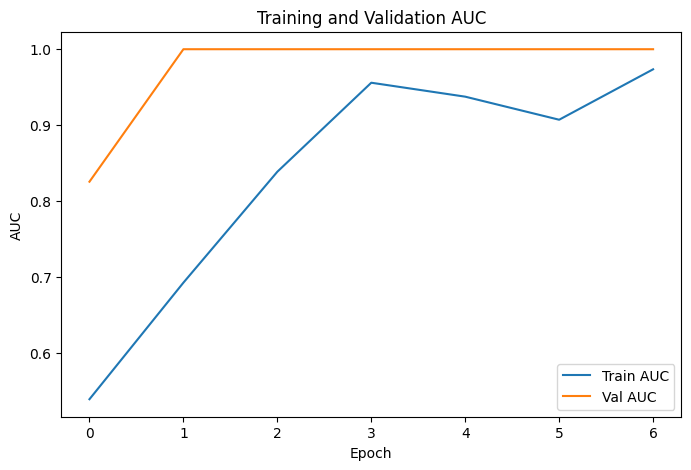

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.6368 - loss: 0.8847 - val_auc: 0.9727 - val_loss: 0.6991
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6991 - loss: 0.6633 - val_auc: 0.9961 - val_loss: 0.6208
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8286 - loss: 0.5843 - val_auc: 1.0000 - val_loss: 0.5371
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9482 - loss: 0.3728 - val_auc: 1.0000 - val_loss: 0.4625
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9631 - loss: 0.3233 - val_auc: 1.0000 - val_loss: 0.3954
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9225 - loss: 0.2583 - val_auc: 1.0000 - val_loss: 0.3334
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9726 - loss: 0.1975 - val_auc: 1.0000 - val_loss: 0.2779
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9955 - loss: 0.1519 - val_auc: 1.0000 - val_loss: 0.2323


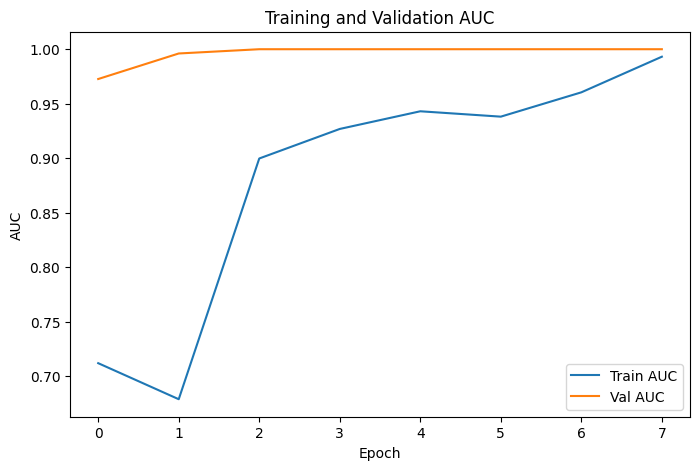

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.6151 - loss: 1.2805 - val_auc: 0.8587 - val_loss: 0.7368
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6402 - loss: 0.9778 - val_auc: 0.9286 - val_loss: 0.6561
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7477 - loss: 0.7367 - val_auc: 0.9460 - val_loss: 0.5873
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8778 - loss: 0.5787 - val_auc: 0.9794 - val_loss: 0.5224
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9568 - loss: 0.4781 - val_auc: 0.9841 - val_loss: 0.4639
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9292 - loss: 0.4165 - val_auc: 0.9873 - val_loss: 0.4086
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9703 - loss: 0.2619 - val_auc: 0.9873 - val_loss: 0.3573
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9918 - loss: 0.2289 - val_auc: 0.9873 - val_loss: 0.3105
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2

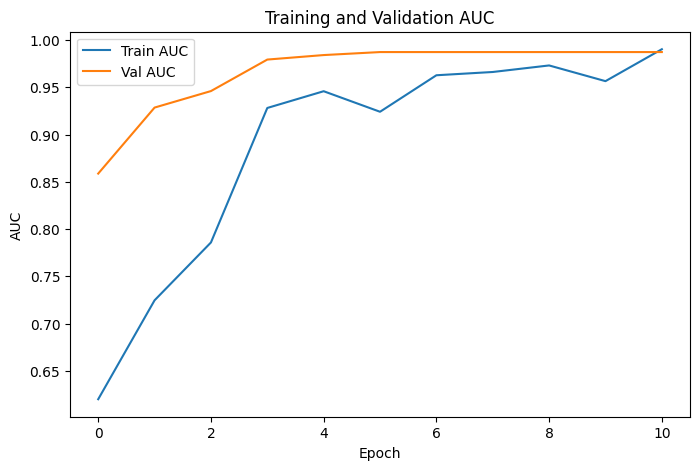

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.3128 - loss: 1.3409 - val_auc: 0.5511 - val_loss: 0.6892
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5183 - loss: 1.0479 - val_auc: 0.7124 - val_loss: 0.6713
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6855 - loss: 0.8341 - val_auc: 0.8548 - val_loss: 0.6461
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8346 - loss: 0.6855 - val_auc: 0.9435 - val_loss: 0.6137
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6872 - loss: 0.5321 - val_auc: 0.9798 - val_loss: 0.5791
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8688 - loss: 0.4192 - val_auc: 0.9839 - val_loss: 0.5387
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9507 - loss: 0.3362 - val_auc: 0.9839 - val_loss: 0.4999
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9820 - loss: 0.2697 - val_auc: 0.9839 - val_loss: 0.4601
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2

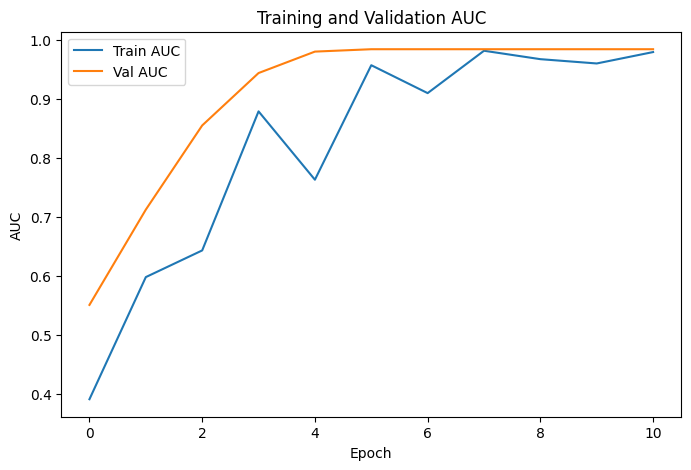

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Dataset_18: Accuracy=0.9647, Precision=0.6667, F1 Score=0.6975, Custom Score=0.7653
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 549us/step


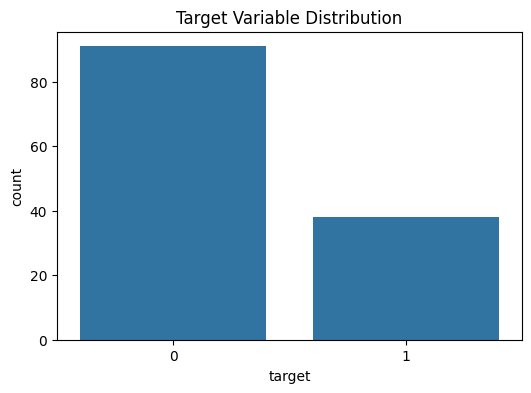

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - auc: 0.4600 - loss: 0.7739 - val_auc: 0.7606 - val_loss: 0.6670
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7402 - loss: 0.5541 - val_auc: 0.8242 - val_loss: 0.6605
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8329 - loss: 0.4819 - val_auc: 0.8455 - val_loss: 0.6551
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7433 - loss: 0.4945 - val_auc: 0.8606 - val_loss: 0.6478
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7653 - loss: 0.4950 - val_auc: 0.8848 - val_loss: 0.6385
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8027 - loss: 0.4410 - val_auc: 0.9030 - val_loss: 0.6290
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8233 - loss: 0.4164 - val_auc: 0.9091 - val_loss: 0.6190
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7785 - loss: 0.4770 - val_auc: 0.9121 - val_loss: 0.6095
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8412 - loss: 0.4439 -

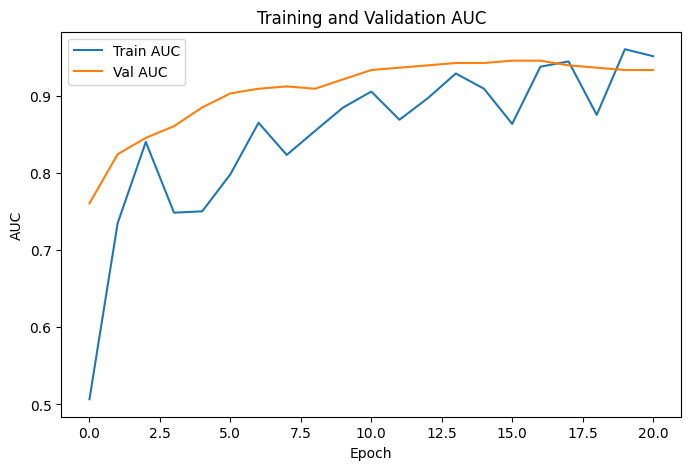

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - auc: 0.6355 - loss: 0.6877 - val_auc: 0.6111 - val_loss: 0.6609
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6894 - loss: 0.6284 - val_auc: 0.6389 - val_loss: 0.6518
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7307 - loss: 0.5741 - val_auc: 0.6632 - val_loss: 0.6422
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7612 - loss: 0.5422 - val_auc: 0.6701 - val_loss: 0.6343
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.8198 - loss: 0.4948 - val_auc: 0.6944 - val_loss: 0.6272
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8153 - loss: 0.5044 - val_auc: 0.7188 - val_loss: 0.6191
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8415 - loss: 0.4719 - val_auc: 0.7257 - val_loss: 0.6117
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8781 - loss: 0.4238 - val_auc: 0.7361 - val_loss: 0.6035
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 

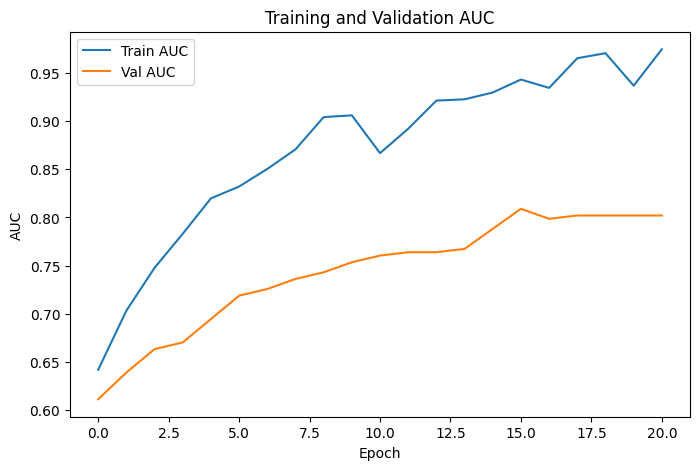

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.5137 - loss: 0.9449 - val_auc: 0.6080 - val_loss: 0.6461
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6447 - loss: 0.7580 - val_auc: 0.6875 - val_loss: 0.6402
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5512 - loss: 0.8110 - val_auc: 0.7273 - val_loss: 0.6331
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7028 - loss: 0.7031 - val_auc: 0.7557 - val_loss: 0.6274
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6911 - loss: 0.6735 - val_auc: 0.8295 - val_loss: 0.6192
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8078 - loss: 0.5595 - val_auc: 0.8409 - val_loss: 0.6118
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7959 - loss: 0.5622 - val_auc: 0.8409 - val_loss: 0.6068
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7812 - loss: 0.5689 - val_auc: 0.8580 - val_loss: 0.6007
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

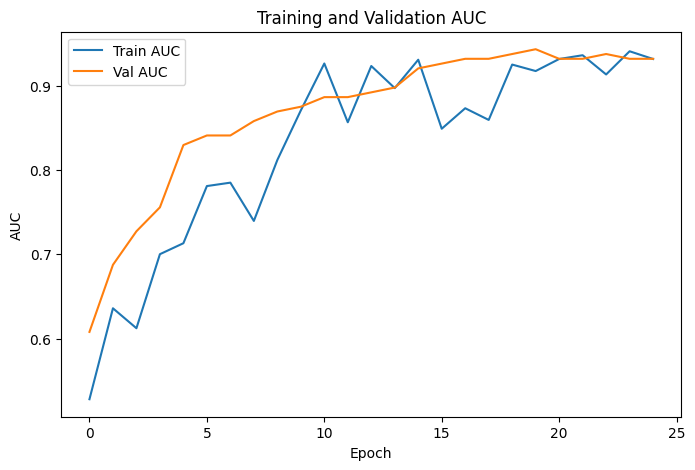

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - auc: 0.3844 - loss: 1.0475 - val_auc: 0.3542 - val_loss: 0.7001
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.4336 - loss: 0.8967 - val_auc: 0.4826 - val_loss: 0.6882
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5299 - loss: 0.8490 - val_auc: 0.5590 - val_loss: 0.6761
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6621 - loss: 0.7655 - val_auc: 0.7118 - val_loss: 0.6639
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7573 - loss: 0.5962 - val_auc: 0.7674 - val_loss: 0.6504
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7468 - loss: 0.6029 - val_auc: 0.8125 - val_loss: 0.6370
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.7445 - loss: 0.5902 - val_auc: 0.8507 - val_loss: 0.6237
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8521 - loss: 0.4854 - val_auc: 0.8889 - val_loss: 0.6111
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7

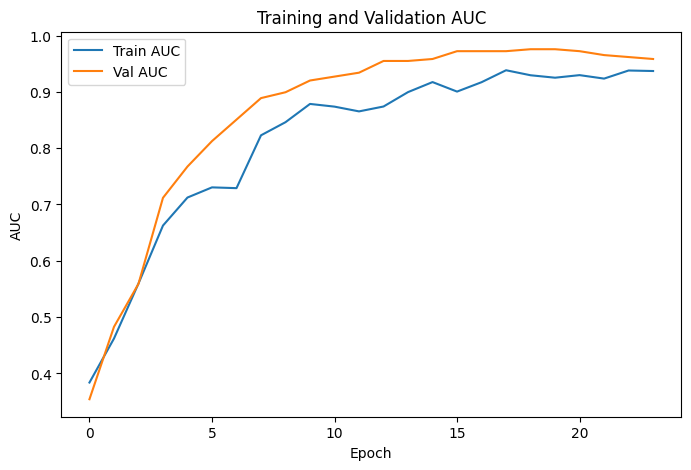

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.6228 - loss: 0.7943 - val_auc: 0.9087 - val_loss: 0.6566
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5512 - loss: 0.8223 - val_auc: 0.9921 - val_loss: 0.6408
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5245 - loss: 0.7256 - val_auc: 1.0000 - val_loss: 0.6233
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7305 - loss: 0.6710 - val_auc: 1.0000 - val_loss: 0.6043
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7691 - loss: 0.5715 - val_auc: 1.0000 - val_loss: 0.5848
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7925 - loss: 0.5673 - val_auc: 0.9960 - val_loss: 0.5675
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8060 - loss: 0.5271 - val_auc: 0.9960 - val_loss: 0.5504
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8879 - loss: 0.4246 - val_auc: 0.9921 - val_loss: 0.5331


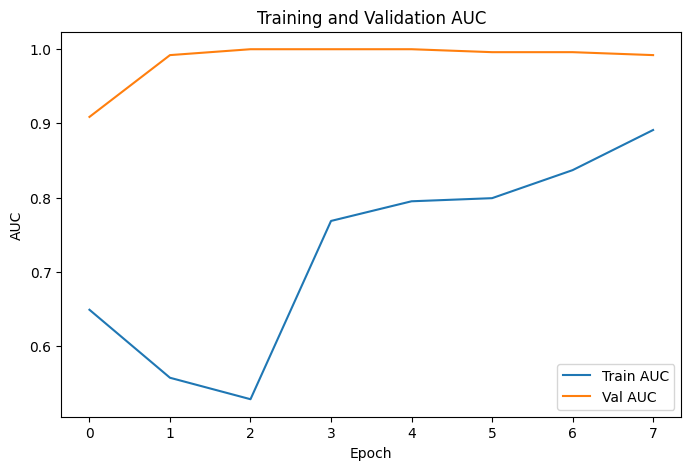

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Dataset_20: Accuracy=0.8305, Precision=0.8150, F1 Score=0.6464, Custom Score=0.7691
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step


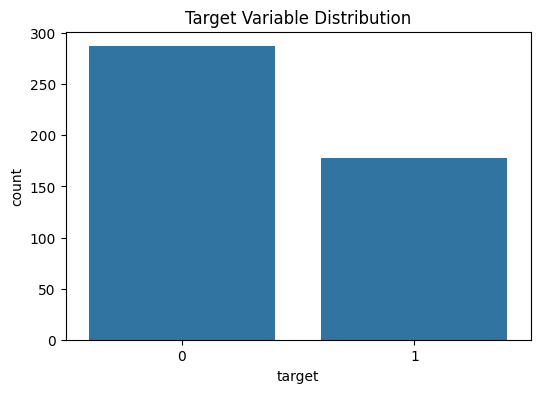

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.7557 - loss: 0.5846 - val_auc: 0.9897 - val_loss: 0.5635
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9405 - loss: 0.3135 - val_auc: 0.9967 - val_loss: 0.4492
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9780 - loss: 0.2022 - val_auc: 0.9983 - val_loss: 0.3550
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9775 - loss: 0.1925 - val_auc: 0.9998 - val_loss: 0.2842
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9796 - loss: 0.1903 - val_auc: 1.0000 - val_loss: 0.2348
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9880 - loss: 0.1434 - val_auc: 1.0000 - val_loss: 0.1997
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9897 - loss: 0.1368 - val_auc: 1.0000 - val_loss: 0.1718
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9926 - loss: 0.1164 - val_auc: 1.0000 - val_loss: 0.1504
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.994

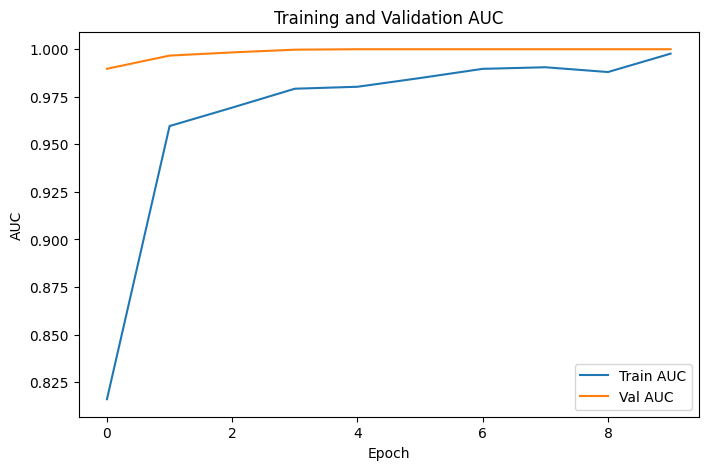

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.7677 - loss: 0.9082 - val_auc: 0.9928 - val_loss: 0.5727
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9664 - loss: 0.4343 - val_auc: 0.9823 - val_loss: 0.4855
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9765 - loss: 0.3142 - val_auc: 0.9836 - val_loss: 0.4148
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9847 - loss: 0.2034 - val_auc: 0.9864 - val_loss: 0.3568
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9875 - loss: 0.1763 - val_auc: 0.9887 - val_loss: 0.3072
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9942 - loss: 0.1226 - val_auc: 0.9905 - val_loss: 0.2695


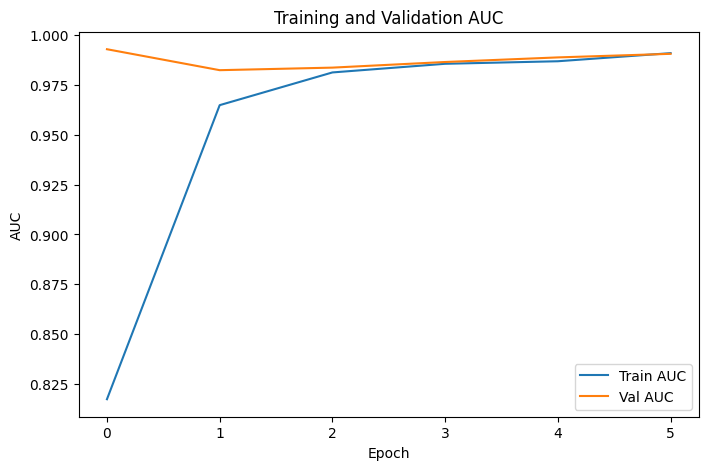

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.7075 - loss: 0.8342 - val_auc: 0.9860 - val_loss: 0.5485
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9300 - loss: 0.4653 - val_auc: 0.9926 - val_loss: 0.4444
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9711 - loss: 0.2851 - val_auc: 0.9946 - val_loss: 0.3597
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9826 - loss: 0.2133 - val_auc: 0.9951 - val_loss: 0.2893
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9831 - loss: 0.1934 - val_auc: 0.9988 - val_loss: 0.2348
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9906 - loss: 0.1377 - val_auc: 0.9995 - val_loss: 0.1944
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9880 - loss: 0.1613 - val_auc: 0.9995 - val_loss: 0.1651
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9904 - loss: 0.1312 - val_auc: 1.0000 - val_loss: 0.1429
Epoch 9/100
12/12 ━━━━━━━

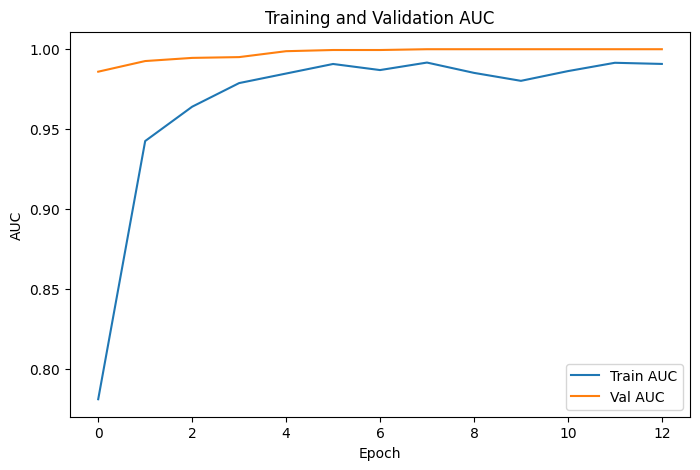

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - auc: 0.6350 - loss: 0.7506 - val_auc: 0.9830 - val_loss: 0.5440
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9154 - loss: 0.3976 - val_auc: 0.9869 - val_loss: 0.4631
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9498 - loss: 0.3097 - val_auc: 0.9889 - val_loss: 0.3945
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9731 - loss: 0.2243 - val_auc: 0.9897 - val_loss: 0.3377
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9763 - loss: 0.1922 - val_auc: 0.9911 - val_loss: 0.2918
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9886 - loss: 0.1497 - val_auc: 0.9911 - val_loss: 0.2586
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9872 - loss: 0.1530 - val_auc: 0.9906 - val_loss: 0.2352
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9943 - loss: 0.1079 - val_auc: 0.9911 - val_loss: 0.2153
Epoch 9/100
12/12 ━━━━━━━

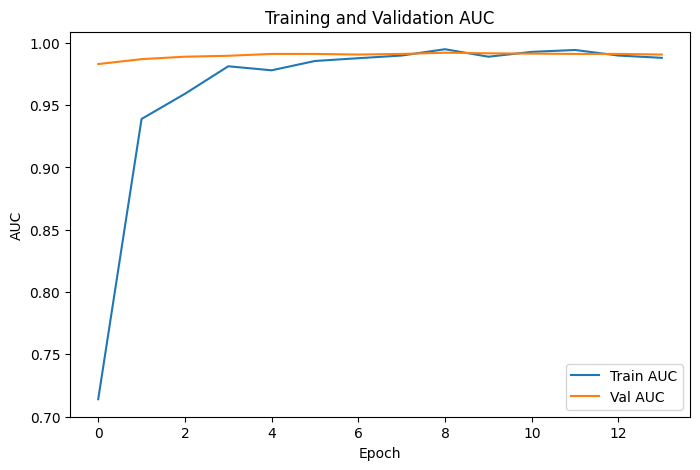

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4899 - loss: 0.8891 - val_auc: 0.9199 - val_loss: 0.6239
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8724 - loss: 0.4490 - val_auc: 0.9806 - val_loss: 0.5524
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9723 - loss: 0.2599 - val_auc: 0.9864 - val_loss: 0.4842
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9776 - loss: 0.2079 - val_auc: 0.9928 - val_loss: 0.4179
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9874 - loss: 0.1592 - val_auc: 0.9938 - val_loss: 0.3591
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9862 - loss: 0.1600 - val_auc: 0.9938 - val_loss: 0.3080
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9773 - loss: 0.1957 - val_auc: 0.9926 - val_loss: 0.2739
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9919 - loss: 0.1259 - val_auc: 0.9943 - val_loss: 0.2372
Epoch 9/100
12/12 ━━━━━━━

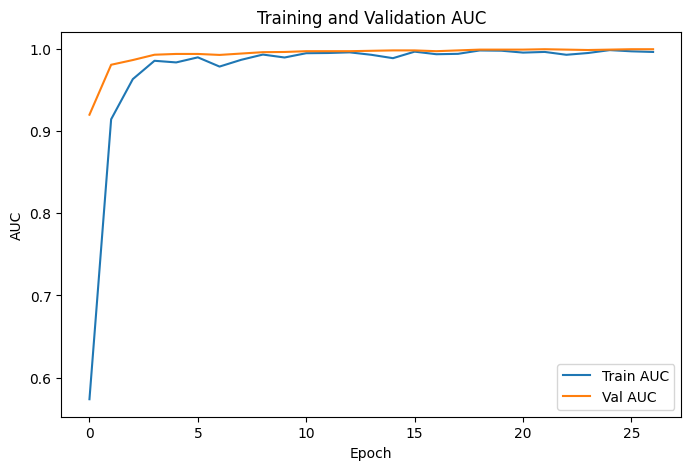

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_16: Accuracy=0.9183, Precision=0.9051, F1 Score=0.9069, Custom Score=0.9096
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step


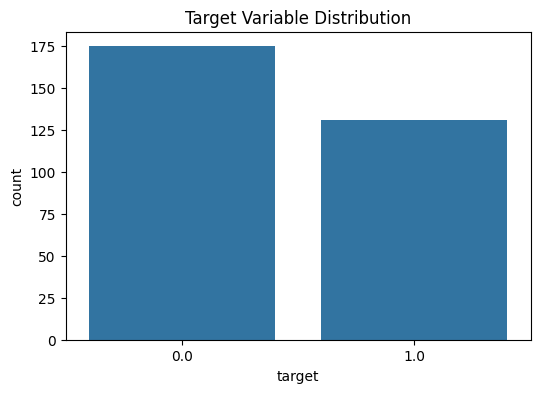

Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.5071 - loss: 0.8253 - val_auc: 0.7276 - val_loss: 0.6669
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7253 - loss: 0.6133 - val_auc: 0.7600 - val_loss: 0.6411
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8571 - loss: 0.4705 - val_auc: 0.7735 - val_loss: 0.6197
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8374 - loss: 0.5066 - val_auc: 0.7892 - val_loss: 0.6012
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8964 - loss: 0.4097 - val_auc: 0.8005 - val_loss: 0.5879
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8960 - loss: 0.4051 - val_auc: 0.8108 - val_loss: 0.5748
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9154 - loss: 0.3688 - val_auc: 0.8243 - val_loss: 0.5625
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8952 - loss: 0.3964 - val_auc: 0.8276 - val_loss: 0.5519
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9313 - loss: 0.3437 -

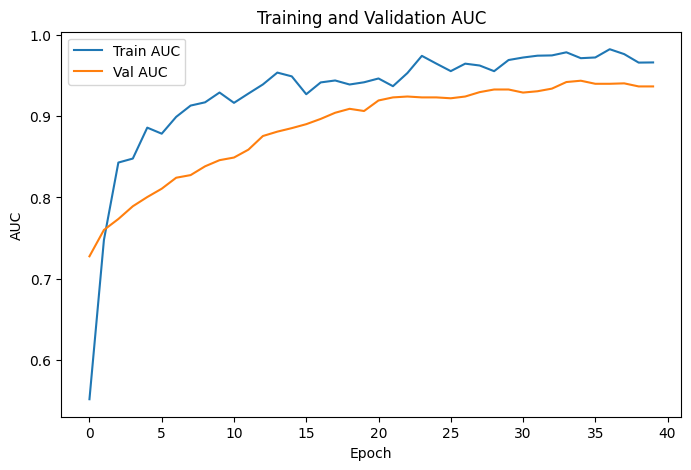

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.4693 - loss: 0.9664 - val_auc: 0.8718 - val_loss: 0.6116
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6549 - loss: 0.7312 - val_auc: 0.9080 - val_loss: 0.5703
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8253 - loss: 0.5151 - val_auc: 0.9291 - val_loss: 0.5522
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7688 - loss: 0.5811 - val_auc: 0.9394 - val_loss: 0.5443
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8346 - loss: 0.5344 - val_auc: 0.9464 - val_loss: 0.5353
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8109 - loss: 0.5790 - val_auc: 0.9486 - val_loss: 0.5256
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8396 - loss: 0.5030 - val_auc: 0.9524 - val_loss: 0.5142
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8806 - loss: 0.4195 - val_auc: 0.9551 - val_loss: 0.5012
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

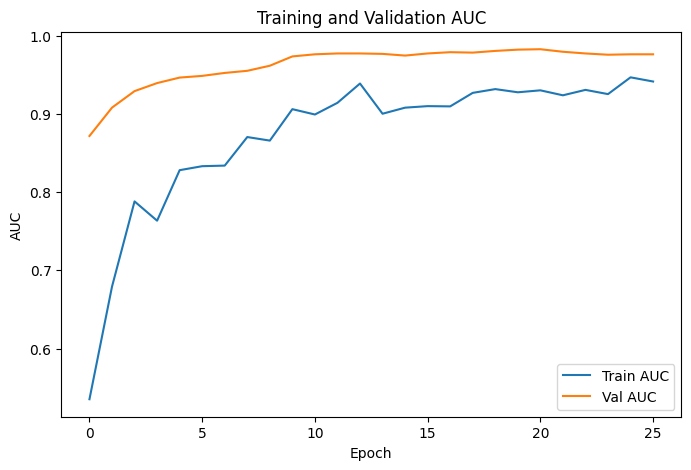

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.5340 - loss: 0.8246 - val_auc: 0.8197 - val_loss: 0.6359
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7776 - loss: 0.5525 - val_auc: 0.9276 - val_loss: 0.5989
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8502 - loss: 0.4849 - val_auc: 0.9341 - val_loss: 0.5731
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8311 - loss: 0.5065 - val_auc: 0.9303 - val_loss: 0.5583
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8722 - loss: 0.4285 - val_auc: 0.9297 - val_loss: 0.5430
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8673 - loss: 0.4493 - val_auc: 0.9254 - val_loss: 0.5288
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8871 - loss: 0.4205 - val_auc: 0.9270 - val_loss: 0.5191
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9273 - loss: 0.3596 - val_auc: 0.9281 - val_loss: 0.5099


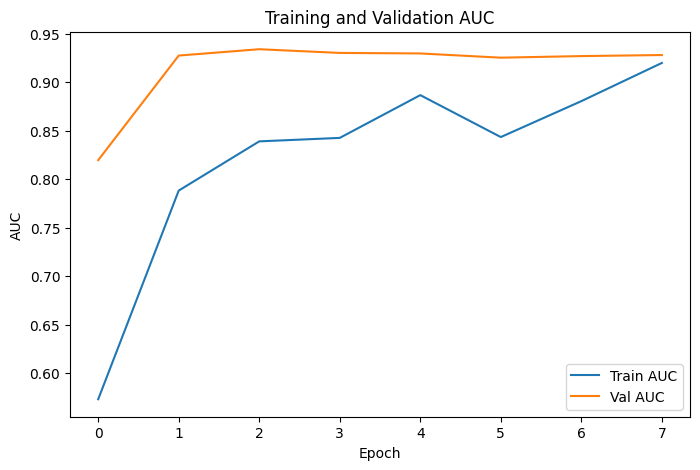

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - auc: 0.5917 - loss: 0.8394 - val_auc: 0.6907 - val_loss: 0.6776
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6861 - loss: 0.7130 - val_auc: 0.8720 - val_loss: 0.6202
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8403 - loss: 0.5189 - val_auc: 0.8868 - val_loss: 0.5745
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8407 - loss: 0.5029 - val_auc: 0.8967 - val_loss: 0.5425
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8518 - loss: 0.4799 - val_auc: 0.9033 - val_loss: 0.5177
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8670 - loss: 0.4493 - val_auc: 0.9060 - val_loss: 0.5008
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8927 - loss: 0.4149 - val_auc: 0.9143 - val_loss: 0.4864
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8923 - loss: 0.4113 - val_auc: 0.9165 - val_loss: 0.4742
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

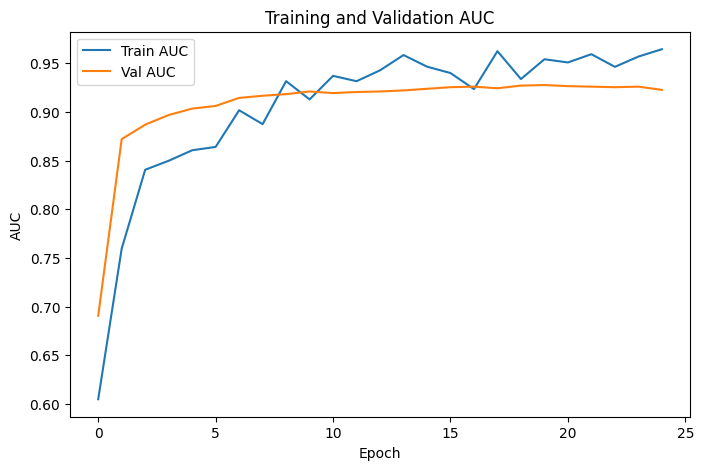

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.4668 - loss: 0.9632 - val_auc: 0.6506 - val_loss: 0.6753
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7541 - loss: 0.6008 - val_auc: 0.8044 - val_loss: 0.6312
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7869 - loss: 0.5622 - val_auc: 0.8372 - val_loss: 0.5977
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8825 - loss: 0.4235 - val_auc: 0.8456 - val_loss: 0.5755
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8839 - loss: 0.4416 - val_auc: 0.8583 - val_loss: 0.5602
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8800 - loss: 0.4187 - val_auc: 0.8656 - val_loss: 0.5446
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8929 - loss: 0.4103 - val_auc: 0.8722 - val_loss: 0.5323
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8859 - loss: 0.4060 - val_auc: 0.8772 - val_loss: 0.5201
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

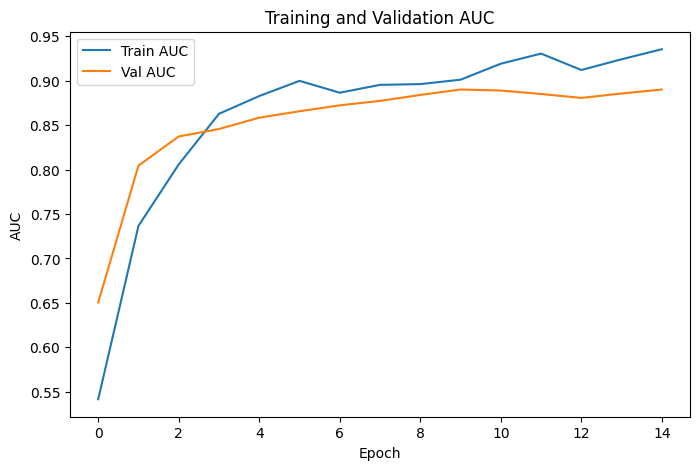

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Dataset_29: Accuracy=0.8299, Precision=0.8597, F1 Score=0.7886, Custom Score=0.8294
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step


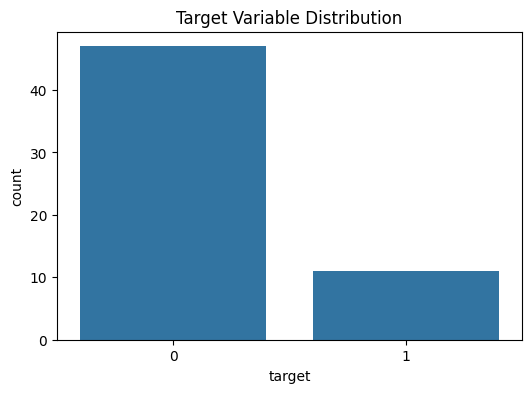

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - auc: 0.8314 - loss: 1.4293 - val_auc: 0.5286 - val_loss: 0.8156
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - auc: 0.6764 - loss: 1.4903 - val_auc: 0.5429 - val_loss: 0.7998
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.8759 - loss: 1.4151 - val_auc: 0.5429 - val_loss: 0.7870
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - auc: 0.7925 - loss: 1.1984 - val_auc: 0.5429 - val_loss: 0.7793
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.6880 - loss: 1.2209 - val_auc: 0.5429 - val_loss: 0.7800
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.8985 - loss: 1.1801 - val_auc: 0.5429 - val_loss: 0.7808
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7996 - loss: 1.0384 - val_auc: 0.5286 - val_loss: 0.7763


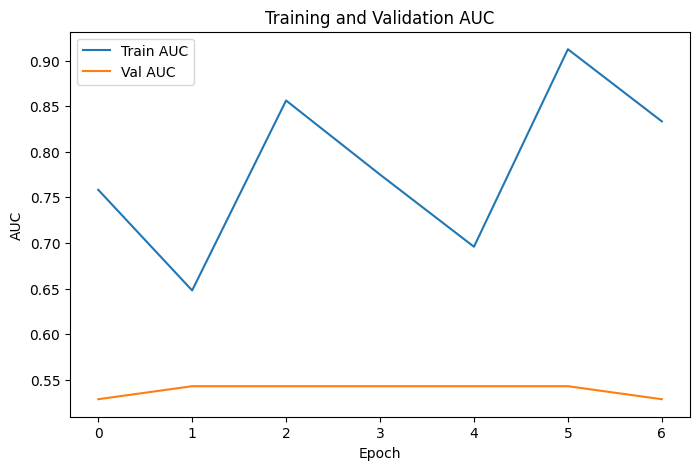

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - auc: 0.3982 - loss: 0.9103 - val_auc: 0.4500 - val_loss: 0.6604
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.4645 - loss: 0.9181 - val_auc: 0.3500 - val_loss: 0.7035
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.5106 - loss: 0.6981 - val_auc: 0.3250 - val_loss: 0.7584
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.4812 - loss: 0.6896 - val_auc: 0.2500 - val_loss: 0.8064
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.5703 - loss: 0.7262 - val_auc: 0.2000 - val_loss: 0.8521
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5798 - loss: 0.6524 - val_auc: 0.1500 - val_loss: 0.9013


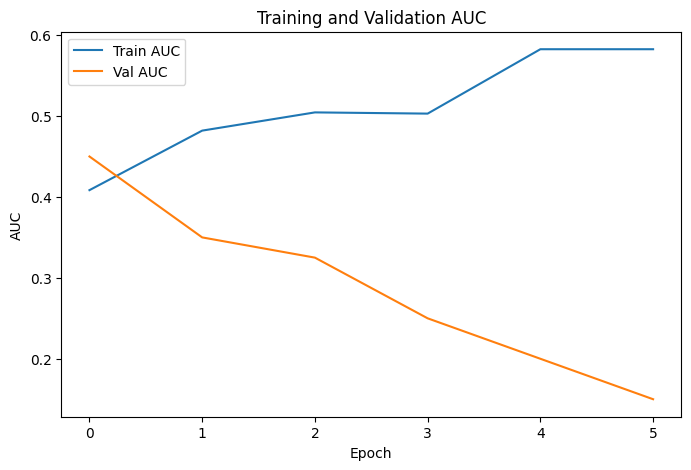

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - auc: 0.4291 - loss: 0.8236 - val_auc: 0.0000e+00 - val_loss: 0.7521
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.5114 - loss: 0.7271 - val_auc: 0.0000e+00 - val_loss: 0.7477
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7106 - loss: 0.5759 - val_auc: 0.0000e+00 - val_loss: 0.7424
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.4355 - loss: 0.7331 - val_auc: 0.0000e+00 - val_loss: 0.7346
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.7272 - loss: 0.5306 - val_auc: 0.0000e+00 - val_loss: 0.7302
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6654 - loss: 0.6372 - val_auc: 0.0000e+00 - val_loss: 0.7239


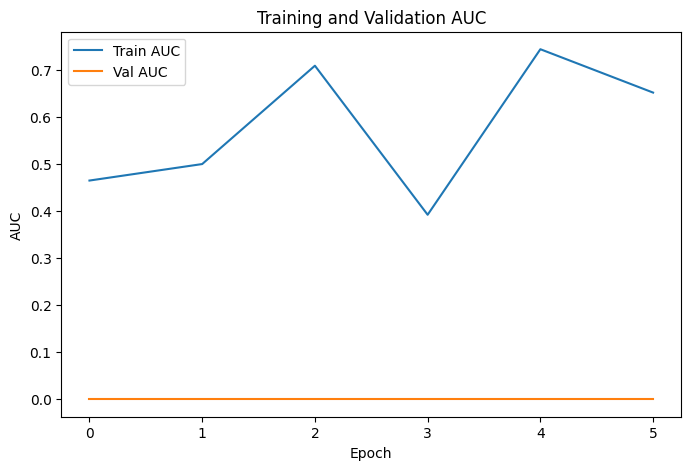

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - auc: 0.5682 - loss: 1.3704 - val_auc: 1.0000 - val_loss: 1.2187
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - auc: 0.6477 - loss: 1.5289 - val_auc: 1.0000 - val_loss: 1.1908
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - auc: 0.7807 - loss: 1.0991 - val_auc: 1.0000 - val_loss: 1.1651
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - auc: 0.5482 - loss: 1.2608 - val_auc: 1.0000 - val_loss: 1.1268
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - auc: 0.5219 - loss: 1.3352 - val_auc: 1.0000 - val_loss: 1.0831
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - auc: 0.5327 - loss: 1.2021 - val_auc: 1.0000 - val_loss: 1.0335


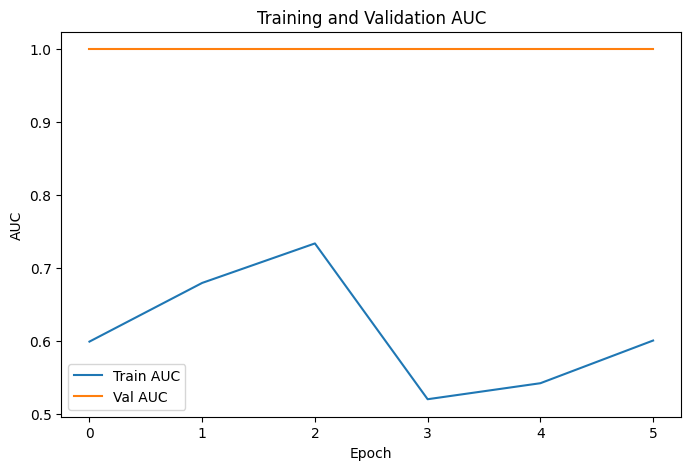

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - auc: 0.3730 - loss: 0.9483 - val_auc: 0.2222 - val_loss: 0.7029
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.6092 - loss: 0.7563 - val_auc: 0.3333 - val_loss: 0.7014
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.5198 - loss: 0.7429 - val_auc: 0.3333 - val_loss: 0.7092
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.4578 - loss: 0.7580 - val_auc: 0.3611 - val_loss: 0.7050
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6346 - loss: 0.6675 - val_auc: 0.3889 - val_loss: 0.7009
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.5645 - loss: 0.7161 - val_auc: 0.4722 - val_loss: 0.6967
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7561 - loss: 0.6052 - val_auc: 0.5000 - val_loss: 0.6907
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8014 - loss: 0.5469 - val_auc: 0.5000 - val_loss: 0.6839
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

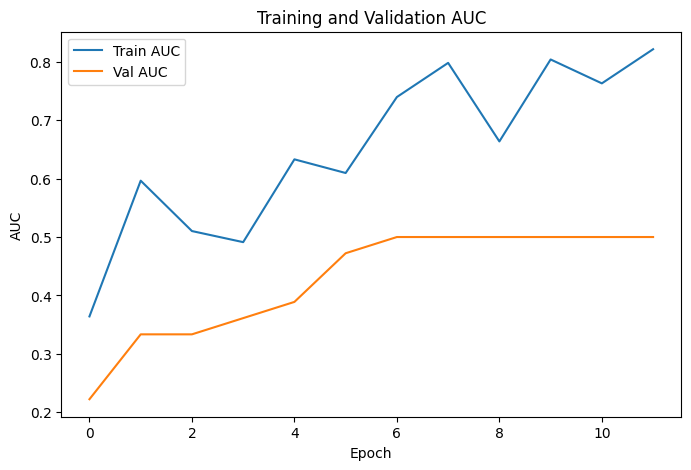

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Dataset_11: Accuracy=0.3758, Precision=0.1983, F1 Score=0.2717, Custom Score=0.2735
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step


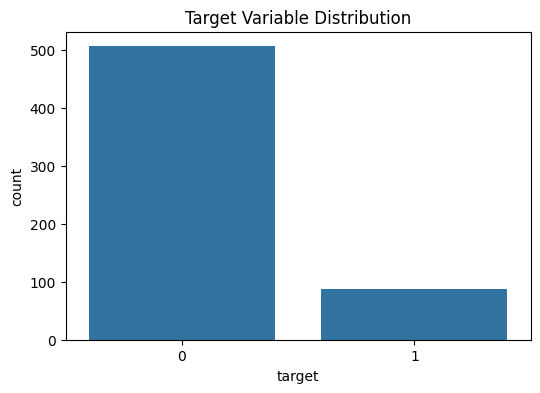

Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.4934 - loss: 0.7999 - val_auc: 0.6274 - val_loss: 0.6297
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6021 - loss: 0.6134 - val_auc: 0.6858 - val_loss: 0.5416
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6980 - loss: 0.4697 - val_auc: 0.7188 - val_loss: 0.4669
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7178 - loss: 0.4317 - val_auc: 0.7427 - val_loss: 0.4127
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7273 - loss: 0.4156 - val_auc: 0.7529 - val_loss: 0.3785
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7634 - loss: 0.3744 - val_auc: 0.7685 - val_loss: 0.3525
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7003 - loss: 0.4311 - val_auc: 0.7896 - val_loss: 0.3352
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7282 - loss: 0.4029 - val_auc: 0.7906 - val_loss: 0.3236
Epoch 9/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7396

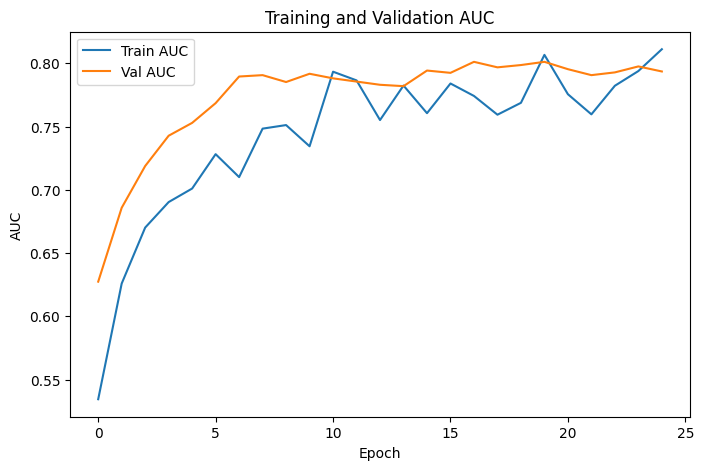

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4170 - loss: 0.8099 - val_auc: 0.7661 - val_loss: 0.6223
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6542 - loss: 0.5307 - val_auc: 0.7690 - val_loss: 0.5735
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7080 - loss: 0.4288 - val_auc: 0.7765 - val_loss: 0.5354
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6840 - loss: 0.4073 - val_auc: 0.7819 - val_loss: 0.5108
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7158 - loss: 0.4091 - val_auc: 0.7892 - val_loss: 0.4919
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6366 - loss: 0.4059 - val_auc: 0.7917 - val_loss: 0.4739
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7968 - loss: 0.3648 - val_auc: 0.7797 - val_loss: 0.4604
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7460 - loss: 0.3544 - val_auc: 0.7810 - val_loss: 0.4529
Epoch 9/100
15/15 ━━━━━━━━

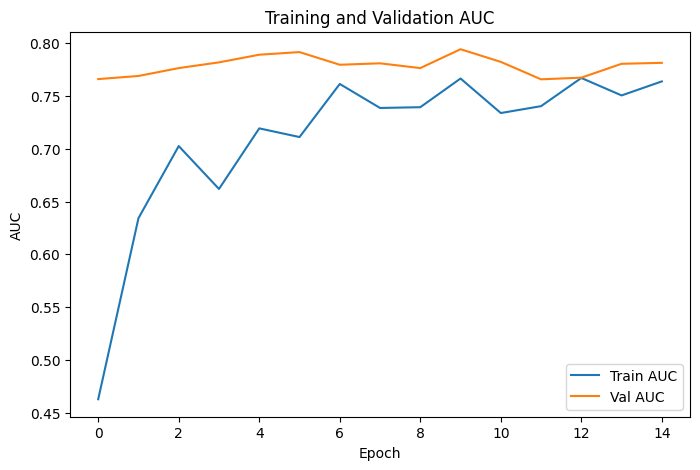

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5567 - loss: 0.7463 - val_auc: 0.6644 - val_loss: 0.6284
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5891 - loss: 0.5843 - val_auc: 0.6755 - val_loss: 0.5765
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6206 - loss: 0.4911 - val_auc: 0.6365 - val_loss: 0.5380
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7182 - loss: 0.4177 - val_auc: 0.6255 - val_loss: 0.5098
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7184 - loss: 0.3812 - val_auc: 0.6370 - val_loss: 0.4935
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7733 - loss: 0.3477 - val_auc: 0.6264 - val_loss: 0.4858
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7240 - loss: 0.3505 - val_auc: 0.6284 - val_loss: 0.4801


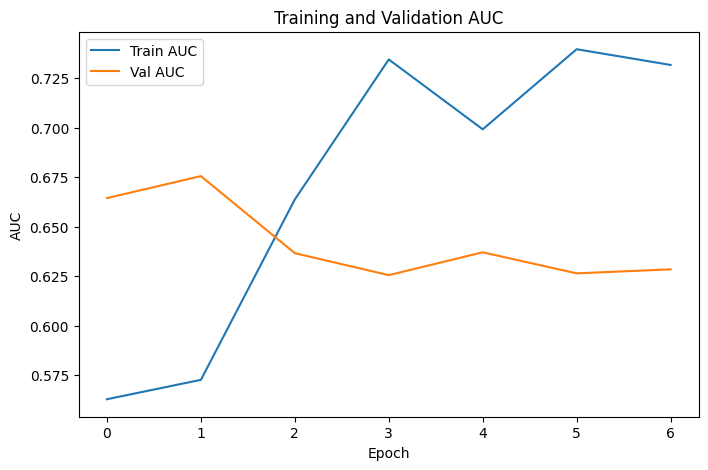

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5388 - loss: 0.8731 - val_auc: 0.7453 - val_loss: 0.6333
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6472 - loss: 0.6310 - val_auc: 0.7457 - val_loss: 0.5675
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7167 - loss: 0.4631 - val_auc: 0.7531 - val_loss: 0.5080
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6834 - loss: 0.4659 - val_auc: 0.7783 - val_loss: 0.4625
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7376 - loss: 0.4032 - val_auc: 0.7921 - val_loss: 0.4320
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7399 - loss: 0.4336 - val_auc: 0.7983 - val_loss: 0.4109
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7129 - loss: 0.3989 - val_auc: 0.7893 - val_loss: 0.3892
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7938 - loss: 0.3661 - val_auc: 0.7925 - val_loss: 0.3708
Epoch 9/100
15/15 ━━━━━━━━

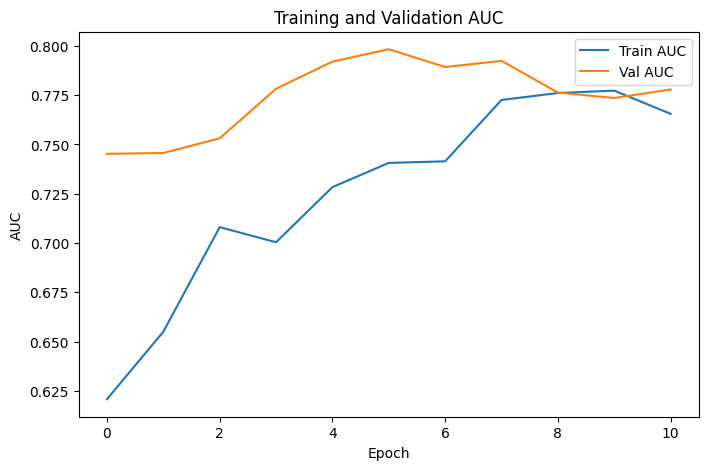

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5297 - loss: 0.7917 - val_auc: 0.6896 - val_loss: 0.6309
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5783 - loss: 0.5929 - val_auc: 0.6403 - val_loss: 0.5754
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6653 - loss: 0.4602 - val_auc: 0.6562 - val_loss: 0.5250
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6818 - loss: 0.4322 - val_auc: 0.6906 - val_loss: 0.4905
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7324 - loss: 0.4267 - val_auc: 0.6872 - val_loss: 0.4686
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7608 - loss: 0.3797 - val_auc: 0.6749 - val_loss: 0.4479
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7907 - loss: 0.3518 - val_auc: 0.6768 - val_loss: 0.4367
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8065 - loss: 0.3305 - val_auc: 0.6667 - val_loss: 0.4273
Epoch 9/100
15/15 ━━━━━━━━

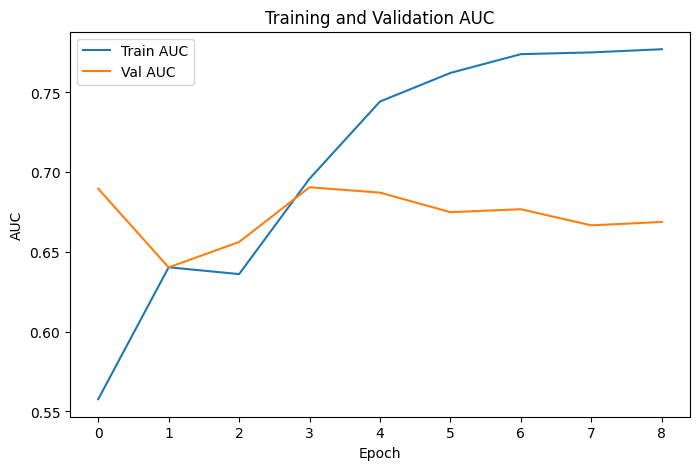

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Dataset_43: Accuracy=0.8534, Precision=0.0000, F1 Score=0.0000, Custom Score=0.2560
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step


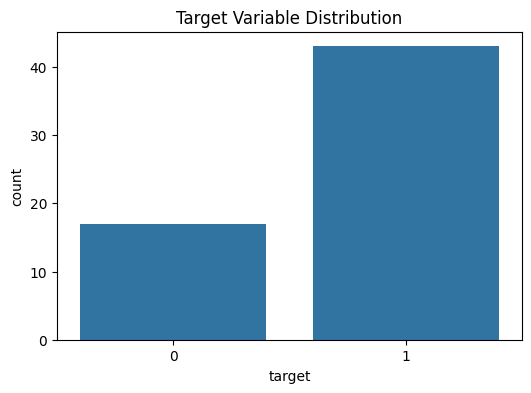

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - auc: 0.5886 - loss: 0.6981 - val_auc: 0.5625 - val_loss: 0.6957
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.3994 - loss: 0.7541 - val_auc: 0.7031 - val_loss: 0.6888
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5710 - loss: 0.6795 - val_auc: 0.7656 - val_loss: 0.6833
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.5242 - loss: 0.6939 - val_auc: 0.8438 - val_loss: 0.6765
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7906 - loss: 0.5143 - val_auc: 0.9062 - val_loss: 0.6702
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7916 - loss: 0.5155 - val_auc: 0.9375 - val_loss: 0.6640
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8379 - loss: 0.4802 - val_auc: 0.9531 - val_loss: 0.6577
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.7027 - loss: 0.5380 - val_auc: 1.0000 - val_loss: 0.6518
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8982 - loss:

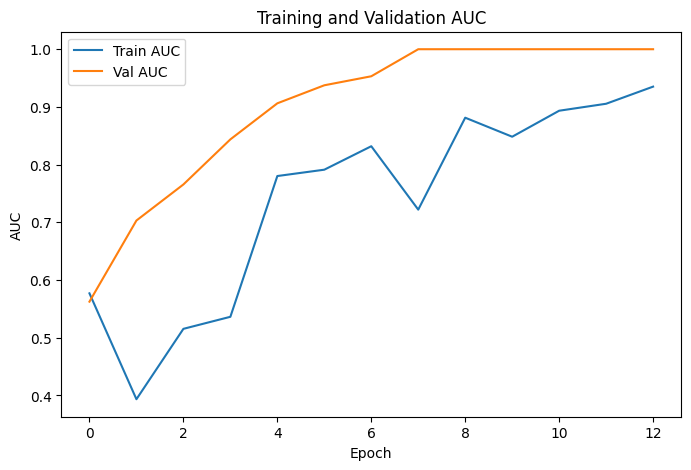

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - auc: 0.3426 - loss: 0.6941 - val_auc: 0.2286 - val_loss: 0.7318
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.4957 - loss: 0.6147 - val_auc: 0.3286 - val_loss: 0.7243
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6515 - loss: 0.4934 - val_auc: 0.3857 - val_loss: 0.7173
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.7369 - loss: 0.4621 - val_auc: 0.4571 - val_loss: 0.7107
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.6521 - loss: 0.5019 - val_auc: 0.5286 - val_loss: 0.7041
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8776 - loss: 0.3658 - val_auc: 0.5857 - val_loss: 0.6985
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.9092 - loss: 0.3094 - val_auc: 0.6857 - val_loss: 0.6934
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8845 - loss: 0.3389 - val_auc: 0.7286 - val_loss: 0.6896
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

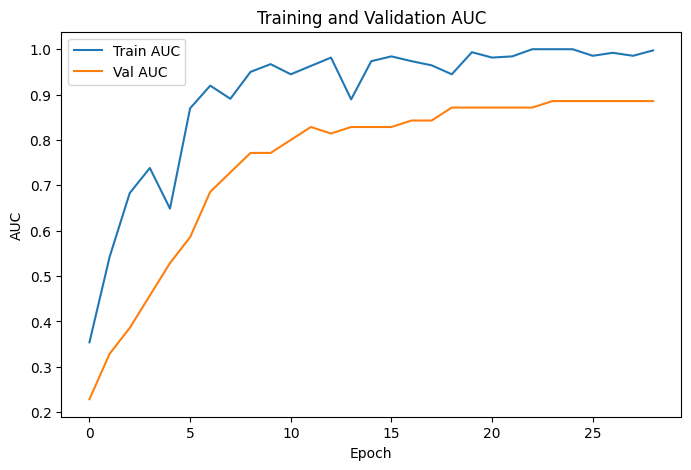

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - auc: 0.3511 - loss: 0.8431 - val_auc: 1.0000 - val_loss: 0.6451
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5591 - loss: 0.7238 - val_auc: 1.0000 - val_loss: 0.6455
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.5636 - loss: 0.6578 - val_auc: 1.0000 - val_loss: 0.6438
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.8108 - loss: 0.4736 - val_auc: 1.0000 - val_loss: 0.6434
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8305 - loss: 0.4856 - val_auc: 1.0000 - val_loss: 0.6434
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7889 - loss: 0.5317 - val_auc: 1.0000 - val_loss: 0.6385


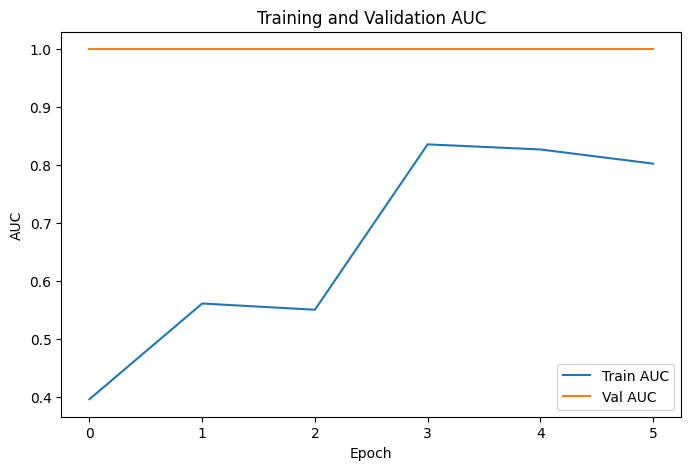

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - auc: 0.5904 - loss: 0.9517 - val_auc: 0.8333 - val_loss: 0.7159
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - auc: 0.4558 - loss: 1.1456 - val_auc: 0.8333 - val_loss: 0.6995
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.5602 - loss: 1.0096 - val_auc: 0.8889 - val_loss: 0.6858
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.7126 - loss: 0.7966 - val_auc: 0.8889 - val_loss: 0.6726
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.6676 - loss: 0.7952 - val_auc: 0.8889 - val_loss: 0.6598
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.9122 - loss: 0.5451 - val_auc: 0.9444 - val_loss: 0.6475
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7992 - loss: 0.6775 - val_auc: 0.9630 - val_loss: 0.6359
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - auc: 0.7330 - loss: 0.6698 - val_auc: 0.9630 - val_loss: 0.6263
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━

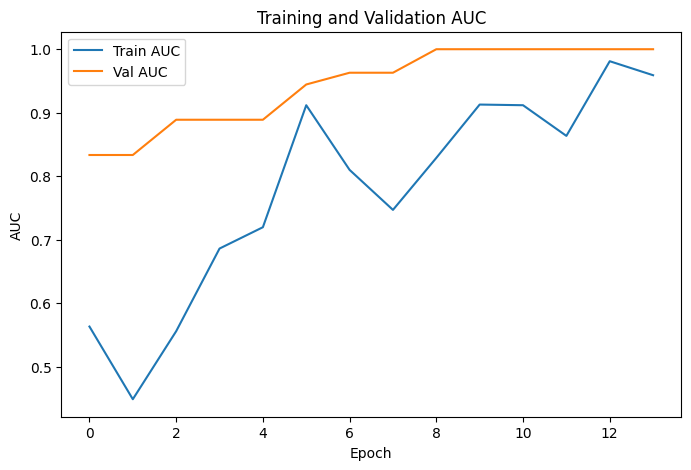

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - auc: 0.5965 - loss: 0.8495 - val_auc: 0.9750 - val_loss: 0.6593
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.6877 - loss: 0.7943 - val_auc: 0.9750 - val_loss: 0.6514
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8411 - loss: 0.5572 - val_auc: 1.0000 - val_loss: 0.6419
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - auc: 0.7911 - loss: 0.5763 - val_auc: 1.0000 - val_loss: 0.6316
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.9208 - loss: 0.4015 - val_auc: 1.0000 - val_loss: 0.6218
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.9573 - loss: 0.3676 - val_auc: 1.0000 - val_loss: 0.6099
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8608 - loss: 0.5479 - val_auc: 1.0000 - val_loss: 0.5988
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.8666 - loss: 0.4640 - val_auc: 1.0000 - val_loss: 0.5883


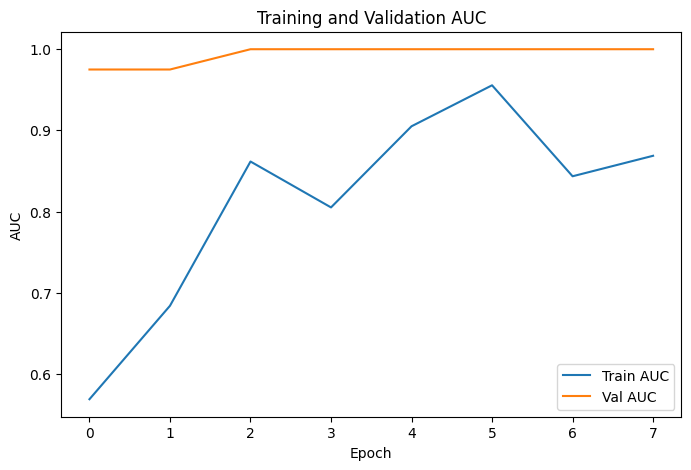

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Dataset_44: Accuracy=0.7667, Precision=0.8242, F1 Score=0.8427, Custom Score=0.8125
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


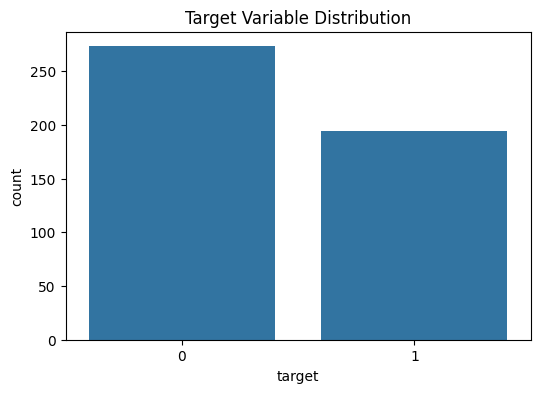

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5963 - loss: 0.7659 - val_auc: 0.6876 - val_loss: 0.6691
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6877 - loss: 0.6572 - val_auc: 0.7249 - val_loss: 0.6571
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6845 - loss: 0.6421 - val_auc: 0.7438 - val_loss: 0.6485
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6977 - loss: 0.6360 - val_auc: 0.7578 - val_loss: 0.6413
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7520 - loss: 0.5827 - val_auc: 0.7627 - val_loss: 0.6349
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6860 - loss: 0.6440 - val_auc: 0.7650 - val_loss: 0.6302
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7164 - loss: 0.6381 - val_auc: 0.7660 - val_loss: 0.6282
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7665 - loss: 0.5786 - val_auc: 0.7627 - val_loss: 0.6260
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.778

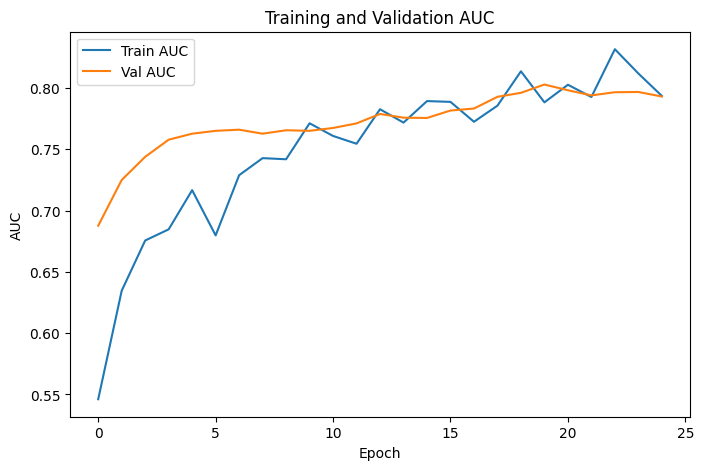

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4741 - loss: 1.1823 - val_auc: 0.5655 - val_loss: 0.6905
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5102 - loss: 0.9504 - val_auc: 0.6465 - val_loss: 0.6899
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6340 - loss: 0.7797 - val_auc: 0.6669 - val_loss: 0.6947
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6840 - loss: 0.6875 - val_auc: 0.6714 - val_loss: 0.7036
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7138 - loss: 0.6284 - val_auc: 0.6823 - val_loss: 0.7152
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6936 - loss: 0.6487 - val_auc: 0.6841 - val_loss: 0.7234
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6840 - loss: 0.6656 - val_auc: 0.6966 - val_loss: 0.7291
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7144 - loss: 0.6199 - val_auc: 0.6916 - val_loss: 0.7333
Epoch 9/100
12/12 ━━━━━━━

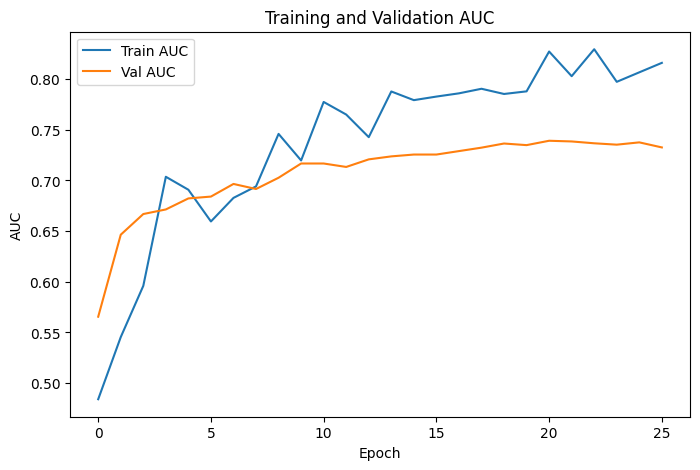

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5401 - loss: 0.8035 - val_auc: 0.6234 - val_loss: 0.6773
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6416 - loss: 0.6790 - val_auc: 0.6695 - val_loss: 0.6694
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6627 - loss: 0.6646 - val_auc: 0.6827 - val_loss: 0.6658
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7134 - loss: 0.6300 - val_auc: 0.7171 - val_loss: 0.6613
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7279 - loss: 0.6163 - val_auc: 0.7186 - val_loss: 0.6567
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7110 - loss: 0.6335 - val_auc: 0.7116 - val_loss: 0.6512
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7204 - loss: 0.6399 - val_auc: 0.7203 - val_loss: 0.6418
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6576 - loss: 0.7072 - val_auc: 0.7298 - val_loss: 0.6360
Epoch 9/100
12/12 ━━━━━━━

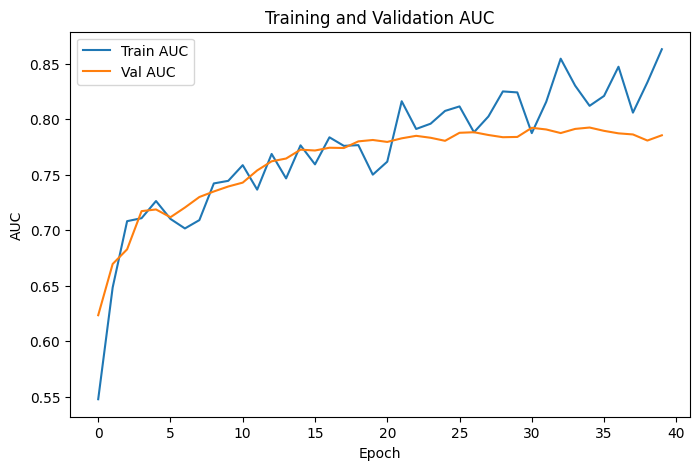

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - auc: 0.5185 - loss: 0.9240 - val_auc: 0.6232 - val_loss: 0.6714
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6434 - loss: 0.7617 - val_auc: 0.6533 - val_loss: 0.6662
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6442 - loss: 0.7396 - val_auc: 0.6859 - val_loss: 0.6646
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6130 - loss: 0.7579 - val_auc: 0.6926 - val_loss: 0.6615
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6432 - loss: 0.7190 - val_auc: 0.7048 - val_loss: 0.6561
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7190 - loss: 0.6219 - val_auc: 0.7153 - val_loss: 0.6532
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6611 - loss: 0.7043 - val_auc: 0.7017 - val_loss: 0.6532
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7317 - loss: 0.6146 - val_auc: 0.7256 - val_loss: 0.6468
Epoch 9/100
12/12 ━━━━━━━

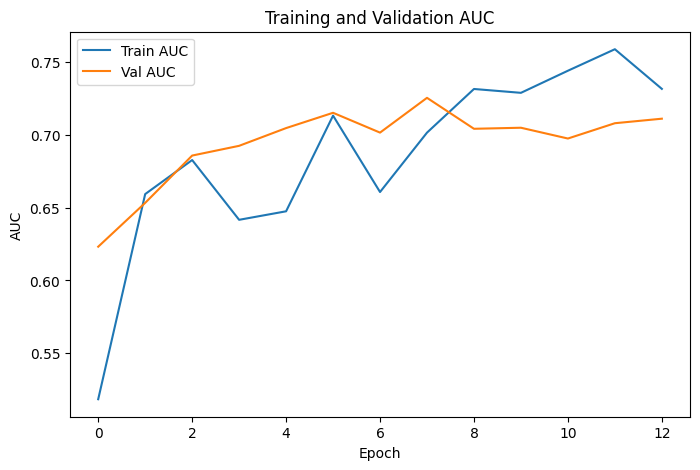

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5742 - loss: 0.9067 - val_auc: 0.7074 - val_loss: 0.6657
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7018 - loss: 0.6874 - val_auc: 0.7069 - val_loss: 0.6451
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6394 - loss: 0.7534 - val_auc: 0.7119 - val_loss: 0.6334
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6814 - loss: 0.6798 - val_auc: 0.7099 - val_loss: 0.6250
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7038 - loss: 0.6527 - val_auc: 0.7154 - val_loss: 0.6206
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7348 - loss: 0.6178 - val_auc: 0.7124 - val_loss: 0.6175
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7182 - loss: 0.6460 - val_auc: 0.7134 - val_loss: 0.6177
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7100 - loss: 0.6472 - val_auc: 0.7096 - val_loss: 0.6169
Epoch 9/100
12/12 ━━━━━━━

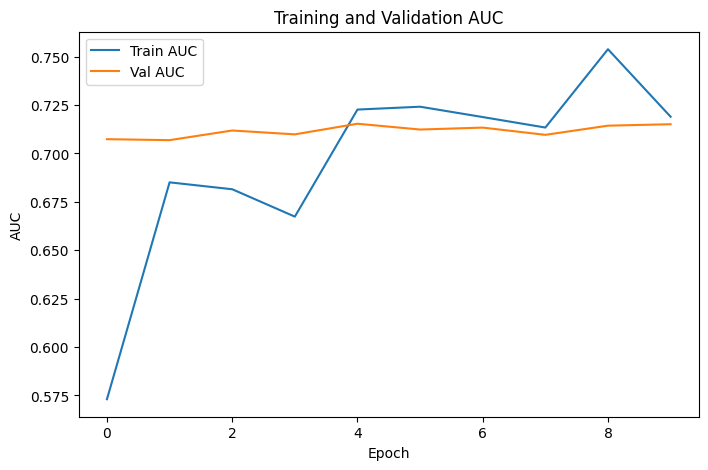

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_10: Accuracy=0.6575, Precision=0.9308, F1 Score=0.3112, Custom Score=0.6629
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step


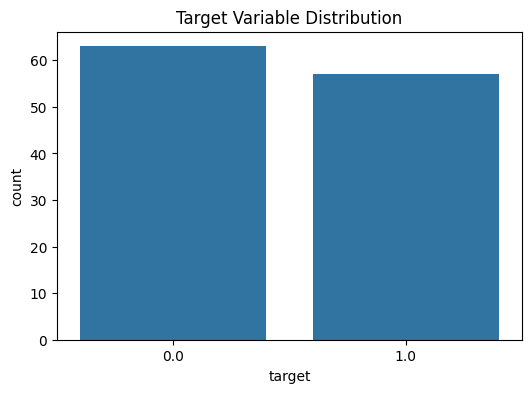

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - auc: 0.4220 - loss: 1.3851 - val_auc: 0.3778 - val_loss: 0.7206
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5174 - loss: 1.0946 - val_auc: 0.5185 - val_loss: 0.6686
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6234 - loss: 1.0452 - val_auc: 0.6444 - val_loss: 0.6329
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7441 - loss: 0.7720 - val_auc: 0.7444 - val_loss: 0.6051
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8480 - loss: 0.6132 - val_auc: 0.8370 - val_loss: 0.5795
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8935 - loss: 0.5647 - val_auc: 0.8815 - val_loss: 0.5569
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9476 - loss: 0.4017 - val_auc: 0.9259 - val_loss: 0.5387
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.9626 - loss: 0.4049 - val_auc: 0.9519 - val_loss: 0.5223
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8734 - loss: 0.5051 -

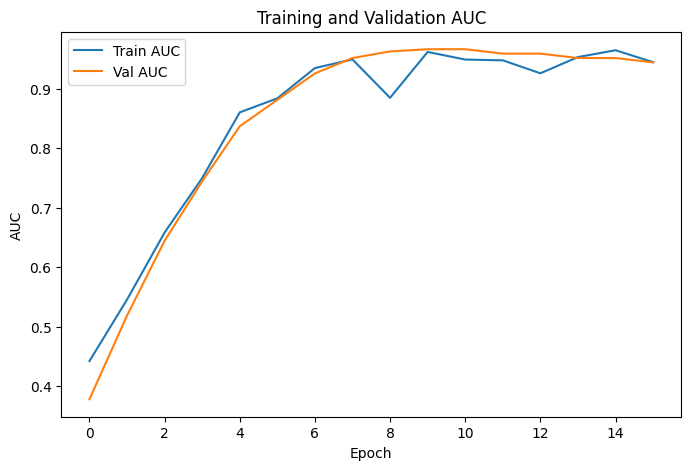

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - auc: 0.5367 - loss: 0.7965 - val_auc: 0.7762 - val_loss: 0.6551
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6826 - loss: 0.6840 - val_auc: 0.9091 - val_loss: 0.6295
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8637 - loss: 0.4714 - val_auc: 0.9266 - val_loss: 0.6072
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8272 - loss: 0.5428 - val_auc: 0.9545 - val_loss: 0.5875
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.7784 - loss: 0.5625 - val_auc: 0.9615 - val_loss: 0.5673
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8659 - loss: 0.4758 - val_auc: 0.9755 - val_loss: 0.5485
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8745 - loss: 0.4495 - val_auc: 0.9790 - val_loss: 0.5310
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.9092 - loss: 0.3974 - val_auc: 0.9790 - val_loss: 0.5142
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8

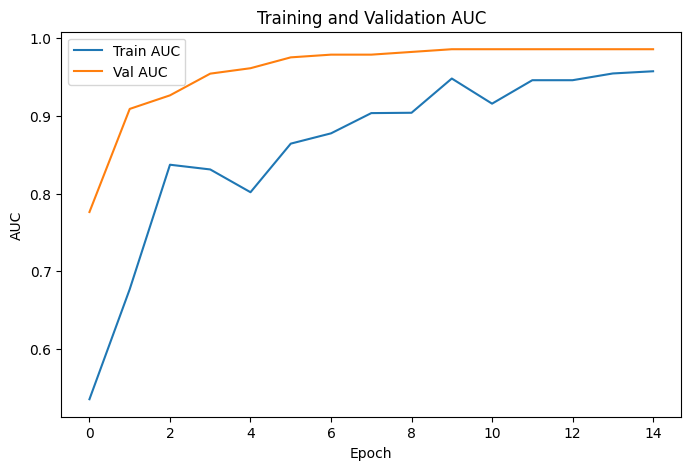

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - auc: 0.4414 - loss: 0.8594 - val_auc: 0.4706 - val_loss: 0.6819
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6984 - loss: 0.6872 - val_auc: 0.6639 - val_loss: 0.6580
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8447 - loss: 0.5300 - val_auc: 0.8067 - val_loss: 0.6336
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6983 - loss: 0.6705 - val_auc: 0.8613 - val_loss: 0.6079
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8806 - loss: 0.4686 - val_auc: 0.8782 - val_loss: 0.5861
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9466 - loss: 0.3688 - val_auc: 0.8992 - val_loss: 0.5686
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8851 - loss: 0.4312 - val_auc: 0.9118 - val_loss: 0.5519
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9784 - loss: 0.2652 - val_auc: 0.9202 - val_loss: 0.5371
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8

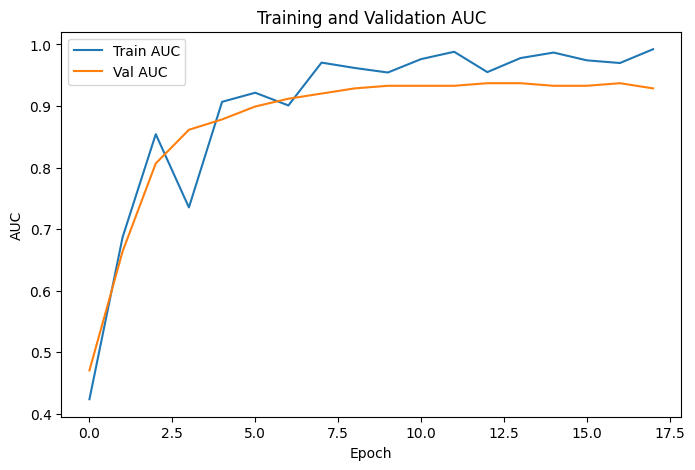

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - auc: 0.4689 - loss: 1.0121 - val_auc: 0.5393 - val_loss: 0.7175
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7191 - loss: 0.6242 - val_auc: 0.7071 - val_loss: 0.6882
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6928 - loss: 0.7195 - val_auc: 0.8214 - val_loss: 0.6613
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8279 - loss: 0.5036 - val_auc: 0.8857 - val_loss: 0.6381
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8631 - loss: 0.4582 - val_auc: 0.9286 - val_loss: 0.6147
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9078 - loss: 0.3762 - val_auc: 0.9250 - val_loss: 0.5922
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8738 - loss: 0.4250 - val_auc: 0.9179 - val_loss: 0.5701
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.9626 - loss: 0.2828 - val_auc: 0.9357 - val_loss: 0.5497
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8

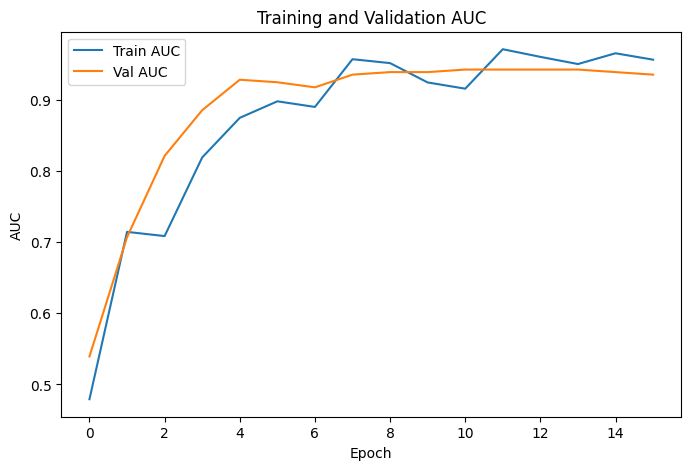

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - auc: 0.4239 - loss: 0.9111 - val_auc: 0.3250 - val_loss: 0.7046
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.6933 - loss: 0.6409 - val_auc: 0.7321 - val_loss: 0.6622
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - auc: 0.6061 - loss: 0.7660 - val_auc: 0.9821 - val_loss: 0.6202
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8108 - loss: 0.5258 - val_auc: 1.0000 - val_loss: 0.5814
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - auc: 0.8064 - loss: 0.5418 - val_auc: 1.0000 - val_loss: 0.5468
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8664 - loss: 0.4535 - val_auc: 1.0000 - val_loss: 0.5159
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8865 - loss: 0.4286 - val_auc: 1.0000 - val_loss: 0.4884
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.9309 - loss: 0.3366 - val_auc: 1.0000 - val_loss: 0.4628
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s

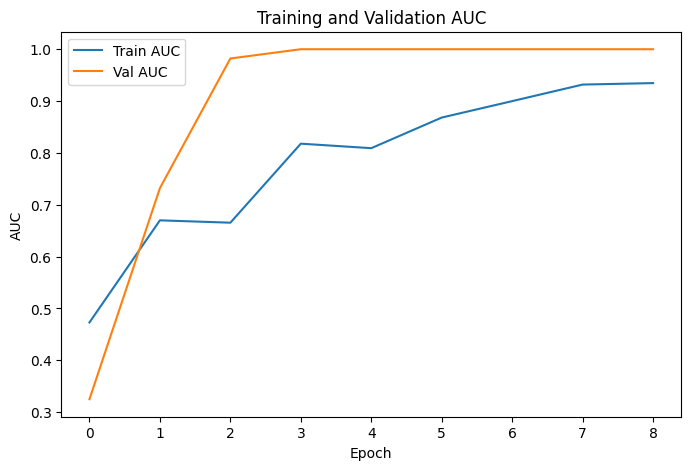

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Dataset_17: Accuracy=0.8417, Precision=0.8587, F1 Score=0.8348, Custom Score=0.8464
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step


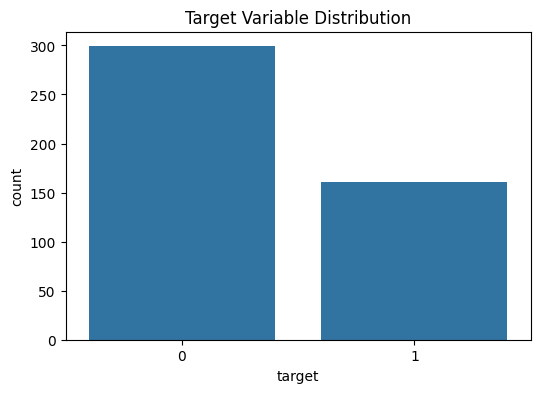

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5139 - loss: 0.9058 - val_auc: 0.6957 - val_loss: 0.6520
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6780 - loss: 0.7016 - val_auc: 0.7804 - val_loss: 0.6205
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8040 - loss: 0.5368 - val_auc: 0.7849 - val_loss: 0.6011
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8428 - loss: 0.4533 - val_auc: 0.7849 - val_loss: 0.5877
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8105 - loss: 0.4967 - val_auc: 0.7914 - val_loss: 0.5748
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8609 - loss: 0.4311 - val_auc: 0.7944 - val_loss: 0.5641
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8508 - loss: 0.4676 - val_auc: 0.7989 - val_loss: 0.5546
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8505 - loss: 0.4508 - val_auc: 0.8013 - val_loss: 0.5491
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.847

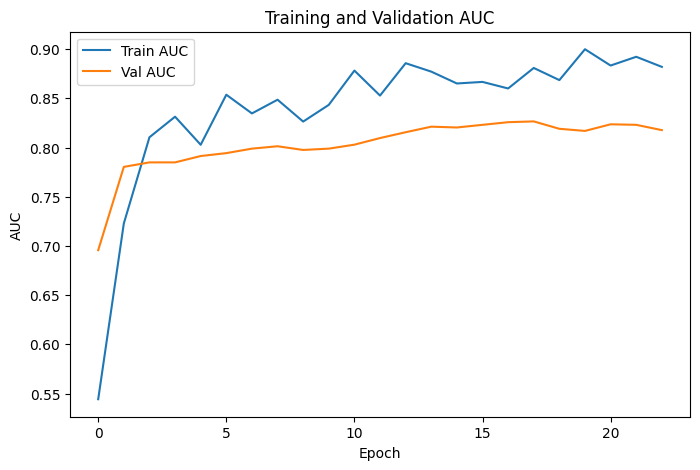

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4955 - loss: 0.8651 - val_auc: 0.6813 - val_loss: 0.6662
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7340 - loss: 0.5906 - val_auc: 0.7790 - val_loss: 0.6498
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7670 - loss: 0.5536 - val_auc: 0.7961 - val_loss: 0.6405
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8233 - loss: 0.4928 - val_auc: 0.7999 - val_loss: 0.6336
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8208 - loss: 0.5016 - val_auc: 0.8006 - val_loss: 0.6276
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8460 - loss: 0.4439 - val_auc: 0.7924 - val_loss: 0.6187
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8383 - loss: 0.4601 - val_auc: 0.7937 - val_loss: 0.6122
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8878 - loss: 0.3930 - val_auc: 0.7919 - val_loss: 0.6022
Epoch 9/100
12/12 ━━━━━━━

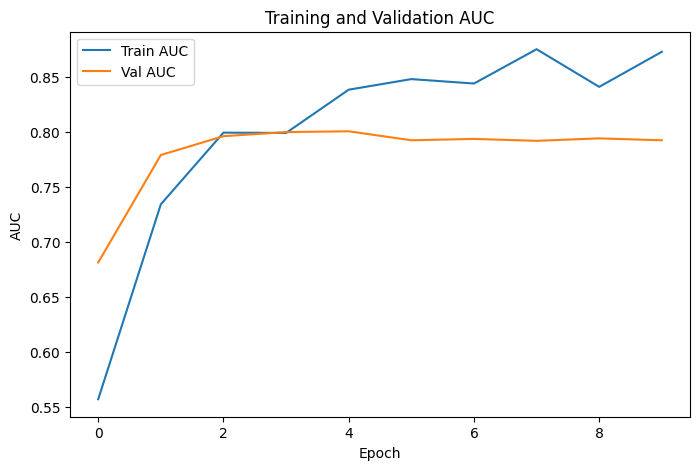

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5021 - loss: 0.9021 - val_auc: 0.6699 - val_loss: 0.6740
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6563 - loss: 0.7259 - val_auc: 0.7736 - val_loss: 0.6435
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7539 - loss: 0.6039 - val_auc: 0.8048 - val_loss: 0.6183
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7899 - loss: 0.5414 - val_auc: 0.8109 - val_loss: 0.5965
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7950 - loss: 0.5309 - val_auc: 0.8212 - val_loss: 0.5774
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8101 - loss: 0.5060 - val_auc: 0.8225 - val_loss: 0.5610
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8212 - loss: 0.5099 - val_auc: 0.8332 - val_loss: 0.5450
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8421 - loss: 0.4667 - val_auc: 0.8400 - val_loss: 0.5310
Epoch 9/100
12/12 ━━━━━━━

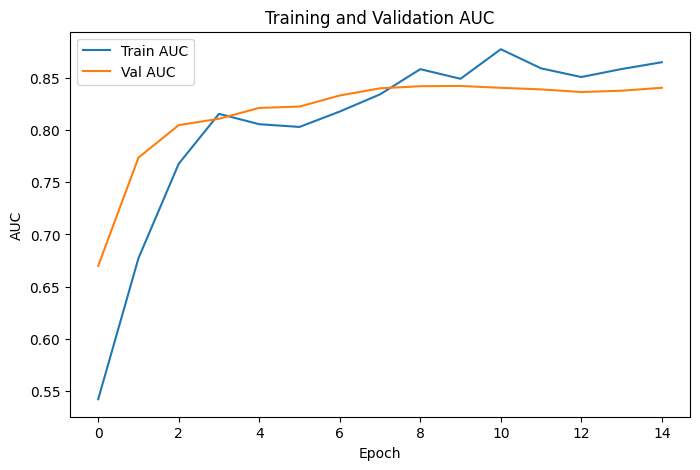

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5850 - loss: 0.8177 - val_auc: 0.7830 - val_loss: 0.6529
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6792 - loss: 0.6815 - val_auc: 0.8331 - val_loss: 0.6321
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7879 - loss: 0.5541 - val_auc: 0.8431 - val_loss: 0.6131
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7949 - loss: 0.5490 - val_auc: 0.8534 - val_loss: 0.5968
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8066 - loss: 0.5263 - val_auc: 0.8606 - val_loss: 0.5779
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8001 - loss: 0.5349 - val_auc: 0.8680 - val_loss: 0.5637
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8345 - loss: 0.4792 - val_auc: 0.8772 - val_loss: 0.5539
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8609 - loss: 0.4335 - val_auc: 0.8821 - val_loss: 0.5404
Epoch 9/100
12/12 ━━━━━━━

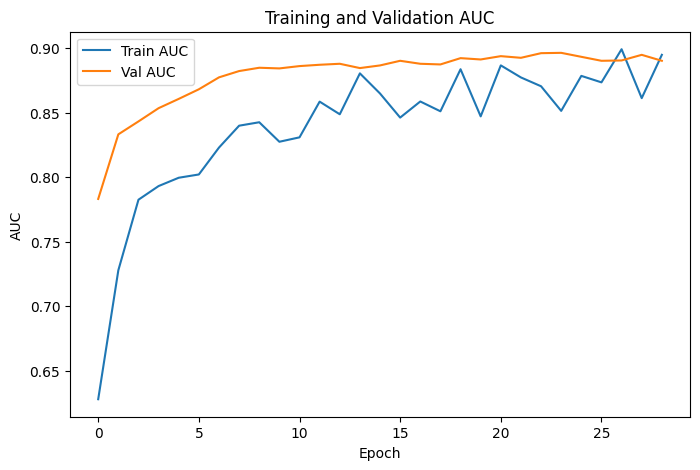

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5633 - loss: 0.7385 - val_auc: 0.8432 - val_loss: 0.6316
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7177 - loss: 0.6379 - val_auc: 0.8887 - val_loss: 0.6041
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7668 - loss: 0.5847 - val_auc: 0.9021 - val_loss: 0.5791
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7813 - loss: 0.5496 - val_auc: 0.9099 - val_loss: 0.5574
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8164 - loss: 0.5131 - val_auc: 0.9160 - val_loss: 0.5421
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8398 - loss: 0.4746 - val_auc: 0.9138 - val_loss: 0.5258
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7941 - loss: 0.5478 - val_auc: 0.9107 - val_loss: 0.5139
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8345 - loss: 0.4772 - val_auc: 0.9110 - val_loss: 0.4988
Epoch 9/100
12/12 ━━━━━━━

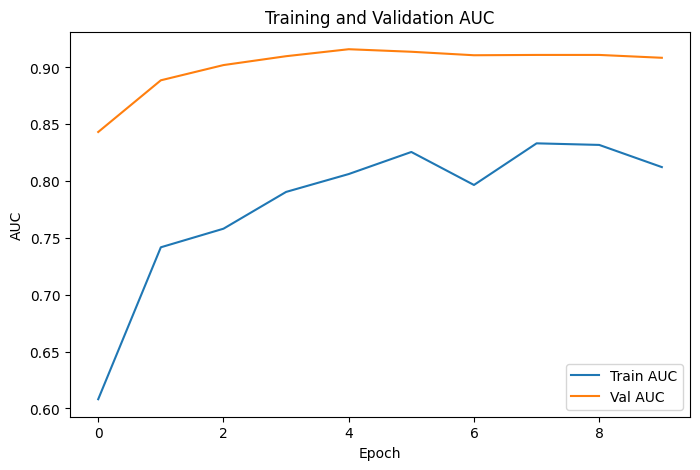

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_28: Accuracy=0.7630, Precision=0.7109, F1 Score=0.6386, Custom Score=0.7048
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 492us/step


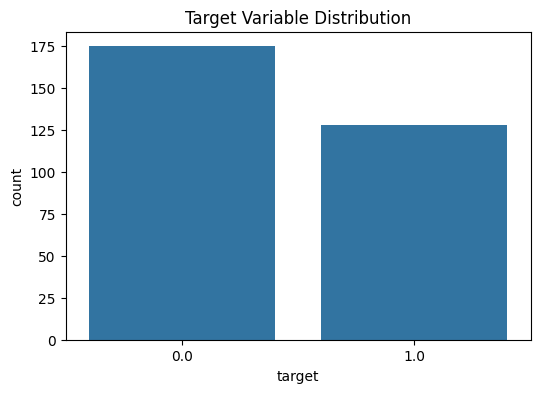

Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - auc: 0.5231 - loss: 0.8097 - val_auc: 0.7727 - val_loss: 0.6666
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7464 - loss: 0.6166 - val_auc: 0.8246 - val_loss: 0.6191
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8771 - loss: 0.4447 - val_auc: 0.8322 - val_loss: 0.5843
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8662 - loss: 0.4521 - val_auc: 0.8479 - val_loss: 0.5573
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9201 - loss: 0.3695 - val_auc: 0.8660 - val_loss: 0.5365
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9052 - loss: 0.3834 - val_auc: 0.8817 - val_loss: 0.5173
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9312 - loss: 0.3379 - val_auc: 0.8893 - val_loss: 0.4955
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9149 - loss: 0.3621 - val_auc: 0.8992 - val_loss: 0.4806
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9065 - loss: 0.3833 -

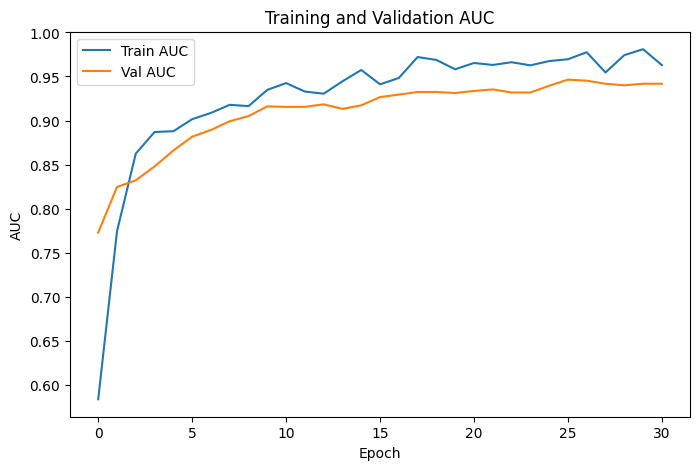

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.6005 - loss: 0.7034 - val_auc: 0.8852 - val_loss: 0.6531
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7307 - loss: 0.6216 - val_auc: 0.9190 - val_loss: 0.6204
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7764 - loss: 0.5766 - val_auc: 0.9161 - val_loss: 0.5941
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8090 - loss: 0.5472 - val_auc: 0.9231 - val_loss: 0.5701
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8689 - loss: 0.4708 - val_auc: 0.9307 - val_loss: 0.5482
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8728 - loss: 0.4532 - val_auc: 0.9324 - val_loss: 0.5251
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9163 - loss: 0.3929 - val_auc: 0.9406 - val_loss: 0.5040
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9255 - loss: 0.3640 - val_auc: 0.9476 - val_loss: 0.4833
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

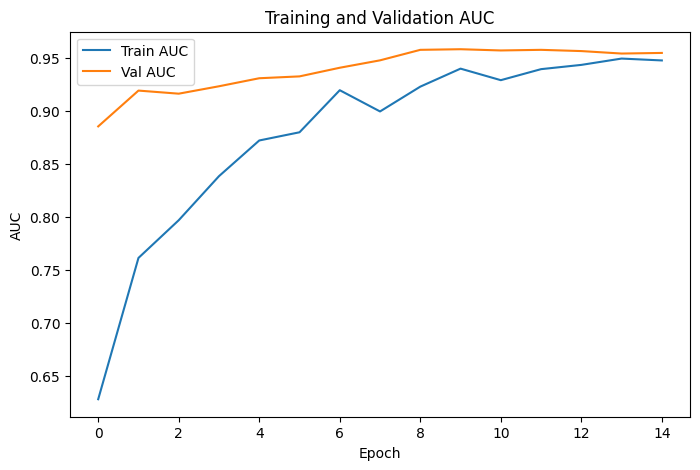

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.6076 - loss: 0.8352 - val_auc: 0.7896 - val_loss: 0.6322
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7412 - loss: 0.6640 - val_auc: 0.8011 - val_loss: 0.6052
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8361 - loss: 0.5666 - val_auc: 0.8159 - val_loss: 0.5842
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8524 - loss: 0.5285 - val_auc: 0.8313 - val_loss: 0.5666
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8835 - loss: 0.4530 - val_auc: 0.8527 - val_loss: 0.5523
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8424 - loss: 0.5078 - val_auc: 0.8555 - val_loss: 0.5406
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8925 - loss: 0.4106 - val_auc: 0.8637 - val_loss: 0.5252
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9053 - loss: 0.3925 - val_auc: 0.8720 - val_loss: 0.5142
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

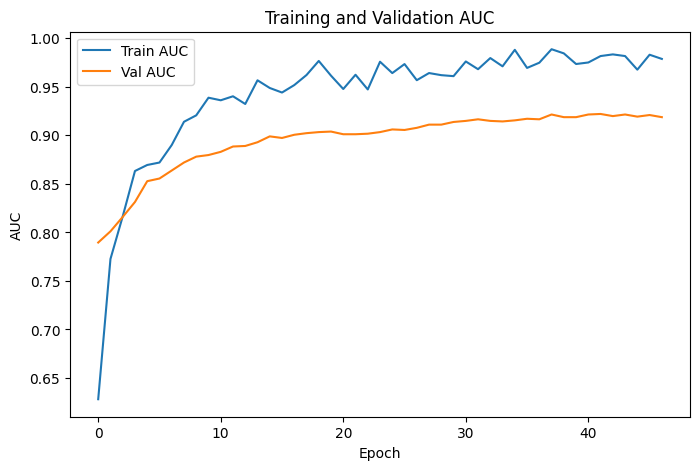

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.5003 - loss: 0.8006 - val_auc: 0.7809 - val_loss: 0.6765
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6696 - loss: 0.6722 - val_auc: 0.8910 - val_loss: 0.6440
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8164 - loss: 0.5430 - val_auc: 0.9121 - val_loss: 0.6181
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8341 - loss: 0.5010 - val_auc: 0.9321 - val_loss: 0.5960
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8421 - loss: 0.4868 - val_auc: 0.9355 - val_loss: 0.5775
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8944 - loss: 0.4233 - val_auc: 0.9449 - val_loss: 0.5615
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8724 - loss: 0.4469 - val_auc: 0.9516 - val_loss: 0.5457
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9165 - loss: 0.3730 - val_auc: 0.9555 - val_loss: 0.5240
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

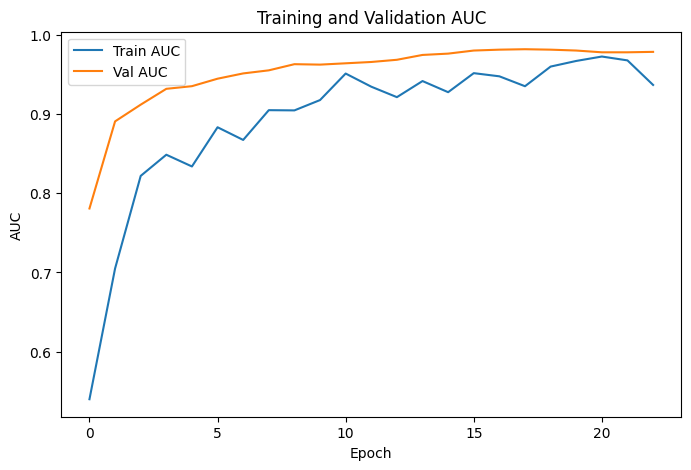

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.5131 - loss: 0.8901 - val_auc: 0.8409 - val_loss: 0.6442
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6701 - loss: 0.7048 - val_auc: 0.8877 - val_loss: 0.6085
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8401 - loss: 0.5595 - val_auc: 0.9004 - val_loss: 0.5814
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8333 - loss: 0.5608 - val_auc: 0.9071 - val_loss: 0.5620
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8656 - loss: 0.4686 - val_auc: 0.9127 - val_loss: 0.5454
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8699 - loss: 0.4681 - val_auc: 0.9149 - val_loss: 0.5295
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8937 - loss: 0.4237 - val_auc: 0.9149 - val_loss: 0.5142
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9274 - loss: 0.3816 - val_auc: 0.9177 - val_loss: 0.4998
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

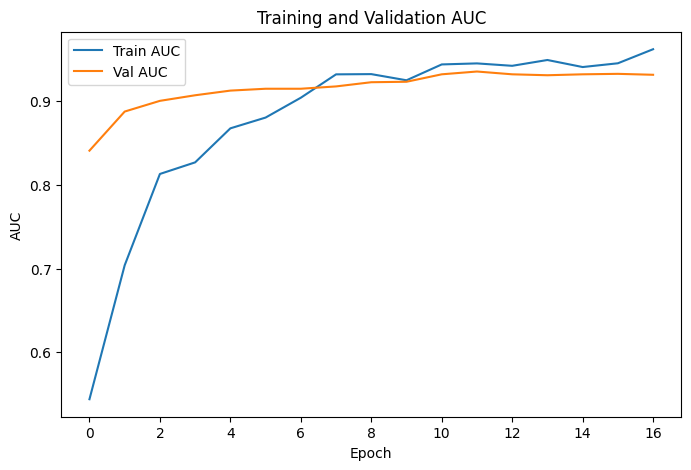

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Dataset_21: Accuracy=0.8680, Precision=0.8388, F1 Score=0.8412, Custom Score=0.8483
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 616us/step


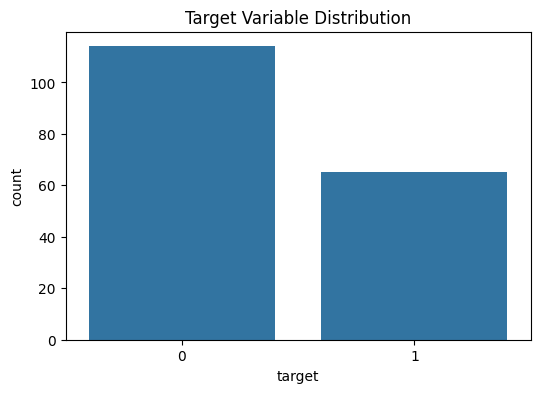

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.5170 - loss: 1.0236 - val_auc: 0.3923 - val_loss: 0.8111
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5705 - loss: 0.9427 - val_auc: 0.4827 - val_loss: 0.7804
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5986 - loss: 0.8505 - val_auc: 0.5404 - val_loss: 0.7481
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7021 - loss: 0.7236 - val_auc: 0.6019 - val_loss: 0.7164
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7636 - loss: 0.7112 - val_auc: 0.6346 - val_loss: 0.6874
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8400 - loss: 0.5312 - val_auc: 0.6673 - val_loss: 0.6621
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8060 - loss: 0.5570 - val_auc: 0.6865 - val_loss: 0.6386
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8480 - loss: 0.5252 - val_auc: 0.6923 - val_loss: 0.6187
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8391 - loss: 0.4982 -

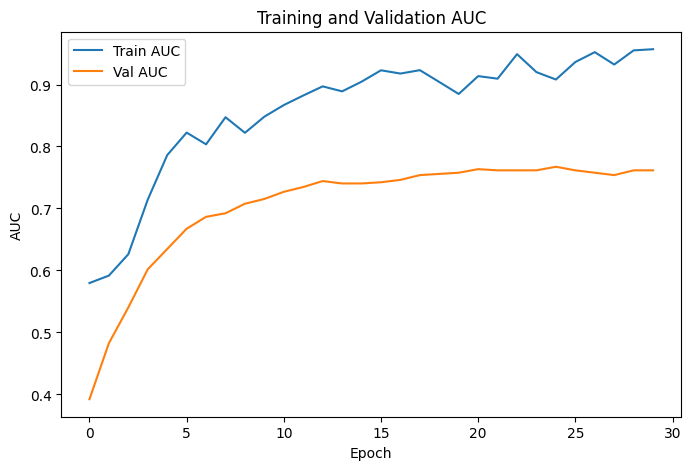

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - auc: 0.5148 - loss: 0.7867 - val_auc: 0.5206 - val_loss: 0.6852
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6649 - loss: 0.6726 - val_auc: 0.6079 - val_loss: 0.6698
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7000 - loss: 0.6541 - val_auc: 0.6540 - val_loss: 0.6556
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7057 - loss: 0.6494 - val_auc: 0.6952 - val_loss: 0.6428
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7666 - loss: 0.5530 - val_auc: 0.7127 - val_loss: 0.6330
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7968 - loss: 0.5127 - val_auc: 0.7143 - val_loss: 0.6260
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7772 - loss: 0.5802 - val_auc: 0.7190 - val_loss: 0.6183
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8233 - loss: 0.4767 - val_auc: 0.7222 - val_loss: 0.6114
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

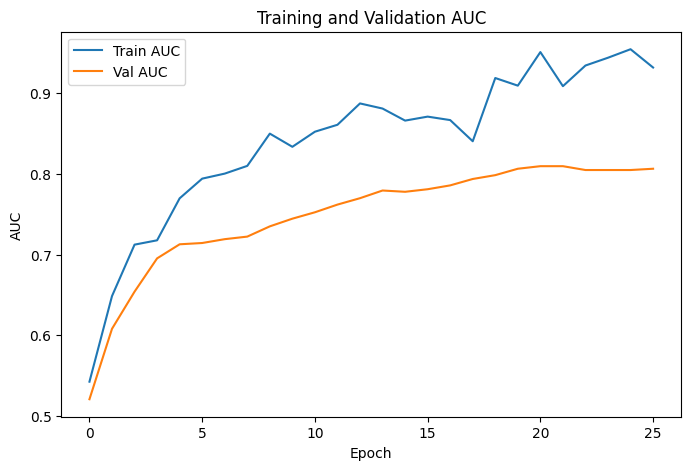

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - auc: 0.4340 - loss: 0.9947 - val_auc: 0.8110 - val_loss: 0.6585
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.4299 - loss: 1.0549 - val_auc: 0.8445 - val_loss: 0.6376
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6731 - loss: 0.7557 - val_auc: 0.8595 - val_loss: 0.6185
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6572 - loss: 0.7103 - val_auc: 0.8829 - val_loss: 0.6019
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7270 - loss: 0.6676 - val_auc: 0.8813 - val_loss: 0.5850
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7416 - loss: 0.6023 - val_auc: 0.8763 - val_loss: 0.5716
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7946 - loss: 0.5747 - val_auc: 0.8796 - val_loss: 0.5614
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8158 - loss: 0.5276 - val_auc: 0.8746 - val_loss: 0.5546
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

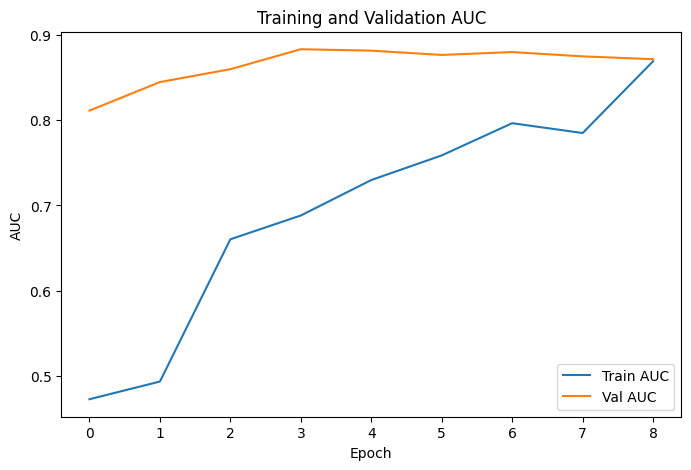

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.5618 - loss: 0.8438 - val_auc: 0.7095 - val_loss: 0.6733
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6293 - loss: 0.7023 - val_auc: 0.7127 - val_loss: 0.6661
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7250 - loss: 0.6159 - val_auc: 0.7095 - val_loss: 0.6596
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7204 - loss: 0.6180 - val_auc: 0.7254 - val_loss: 0.6506
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8023 - loss: 0.5304 - val_auc: 0.7381 - val_loss: 0.6406
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7586 - loss: 0.5665 - val_auc: 0.7556 - val_loss: 0.6315
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8154 - loss: 0.5322 - val_auc: 0.7667 - val_loss: 0.6225
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8584 - loss: 0.4412 - val_auc: 0.7746 - val_loss: 0.6131
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

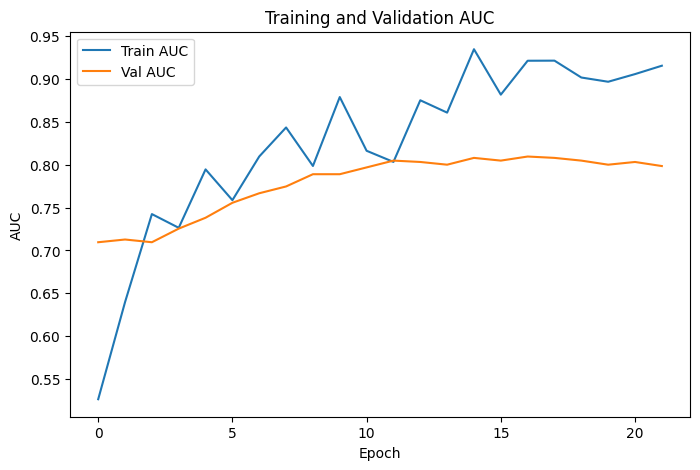

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.5777 - loss: 0.7068 - val_auc: 0.5743 - val_loss: 0.6876
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6428 - loss: 0.6753 - val_auc: 0.5870 - val_loss: 0.6784
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7194 - loss: 0.5961 - val_auc: 0.6304 - val_loss: 0.6688
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7368 - loss: 0.5967 - val_auc: 0.6649 - val_loss: 0.6606
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8167 - loss: 0.5004 - val_auc: 0.6848 - val_loss: 0.6507
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8208 - loss: 0.5046 - val_auc: 0.7192 - val_loss: 0.6406
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8216 - loss: 0.4985 - val_auc: 0.7301 - val_loss: 0.6322
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9156 - loss: 0.3769 - val_auc: 0.7409 - val_loss: 0.6237
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

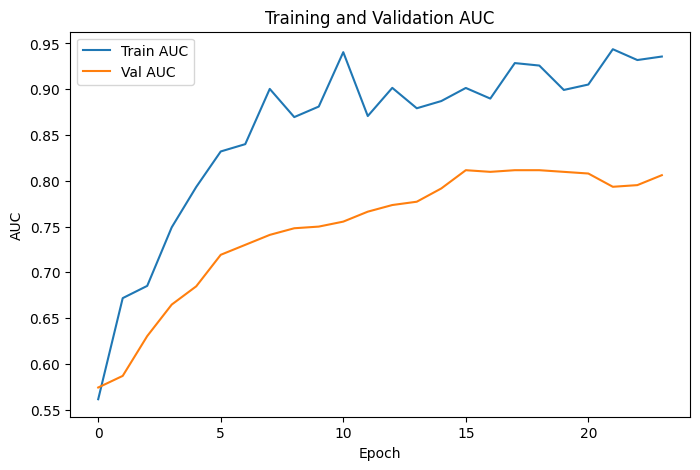

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Dataset_26: Accuracy=0.7541, Precision=0.7202, F1 Score=0.5876, Custom Score=0.6906
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step


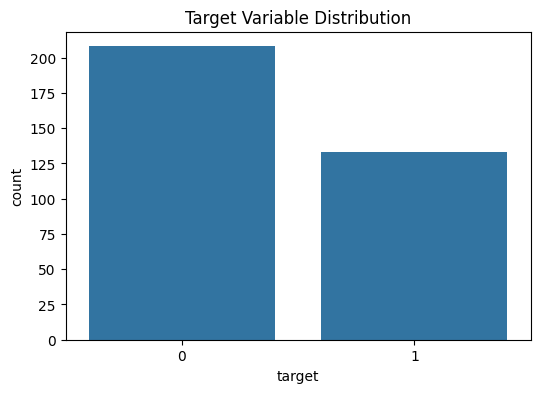

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.6737 - loss: 0.6785 - val_auc: 0.9559 - val_loss: 0.5602
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9083 - loss: 0.3904 - val_auc: 0.9735 - val_loss: 0.4428
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9270 - loss: 0.3349 - val_auc: 0.9757 - val_loss: 0.3772
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9611 - loss: 0.2629 - val_auc: 0.9775 - val_loss: 0.3322
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9801 - loss: 0.2003 - val_auc: 0.9780 - val_loss: 0.3035
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9695 - loss: 0.2221 - val_auc: 0.9806 - val_loss: 0.2755
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9898 - loss: 0.1532 - val_auc: 0.9806 - val_loss: 0.2535
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9812 - loss: 0.1767 - val_auc: 0.9806 - val_loss: 0.2336
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9948 - loss: 0.1170 -

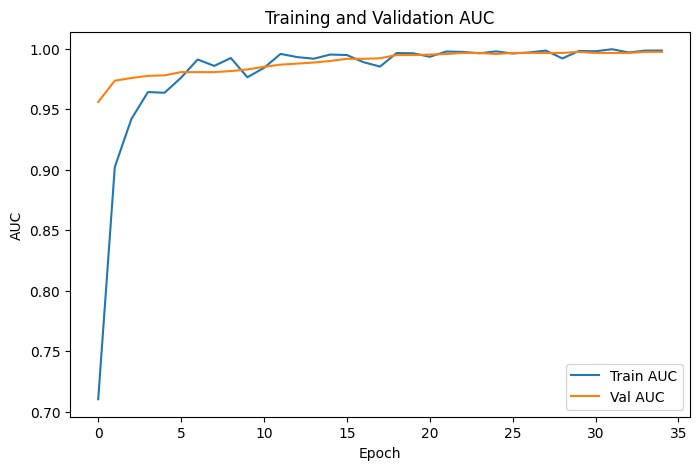

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.4336 - loss: 0.8846 - val_auc: 0.9371 - val_loss: 0.6124
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8661 - loss: 0.4747 - val_auc: 0.9933 - val_loss: 0.5288
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9414 - loss: 0.3136 - val_auc: 0.9955 - val_loss: 0.4533
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9662 - loss: 0.2657 - val_auc: 0.9964 - val_loss: 0.3952
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9647 - loss: 0.2393 - val_auc: 1.0000 - val_loss: 0.3476
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9817 - loss: 0.1902 - val_auc: 1.0000 - val_loss: 0.3061
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9930 - loss: 0.1384 - val_auc: 1.0000 - val_loss: 0.2715
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9794 - loss: 0.1909 - val_auc: 1.0000 - val_loss: 0.2379
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

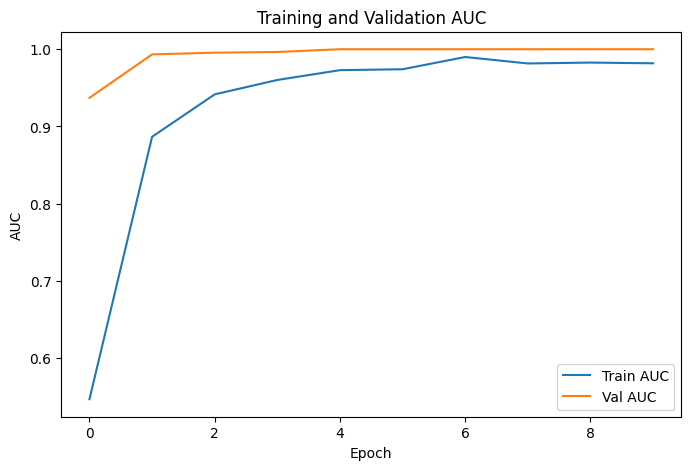

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5328 - loss: 0.7814 - val_auc: 0.9757 - val_loss: 0.5576
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8973 - loss: 0.4110 - val_auc: 0.9978 - val_loss: 0.4497
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9556 - loss: 0.3108 - val_auc: 0.9965 - val_loss: 0.3759
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9743 - loss: 0.2519 - val_auc: 0.9969 - val_loss: 0.3213
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9746 - loss: 0.2252 - val_auc: 0.9965 - val_loss: 0.2793
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9772 - loss: 0.1920 - val_auc: 0.9965 - val_loss: 0.2485
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9973 - loss: 0.1178 - val_auc: 0.9965 - val_loss: 0.2196


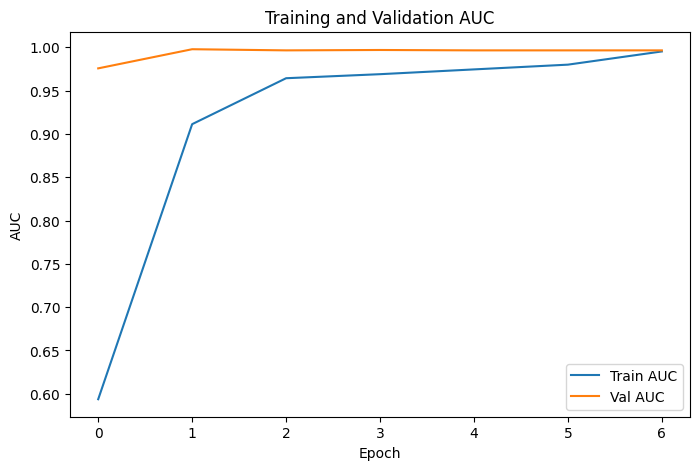

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - auc: 0.5484 - loss: 0.8323 - val_auc: 0.9034 - val_loss: 0.6124
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8872 - loss: 0.4453 - val_auc: 0.9874 - val_loss: 0.5207
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9326 - loss: 0.3351 - val_auc: 0.9976 - val_loss: 0.4399
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9749 - loss: 0.2653 - val_auc: 1.0000 - val_loss: 0.3771
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9620 - loss: 0.2533 - val_auc: 0.9995 - val_loss: 0.3277
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9840 - loss: 0.1895 - val_auc: 1.0000 - val_loss: 0.2837
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9776 - loss: 0.1928 - val_auc: 1.0000 - val_loss: 0.2503
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9917 - loss: 0.1457 - val_auc: 1.0000 - val_loss: 0.2217
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

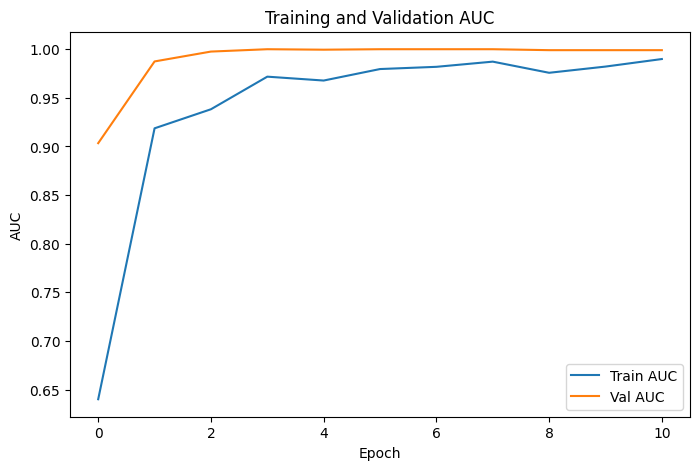

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.6944 - loss: 0.8692 - val_auc: 0.9826 - val_loss: 0.5486
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9193 - loss: 0.4868 - val_auc: 0.9913 - val_loss: 0.4640
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9502 - loss: 0.3829 - val_auc: 0.9913 - val_loss: 0.3987
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9743 - loss: 0.2474 - val_auc: 0.9927 - val_loss: 0.3518
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9798 - loss: 0.2187 - val_auc: 0.9927 - val_loss: 0.3155
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9844 - loss: 0.1804 - val_auc: 0.9927 - val_loss: 0.2822
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9895 - loss: 0.1605 - val_auc: 0.9927 - val_loss: 0.2514
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9828 - loss: 0.1698 - val_auc: 0.9927 - val_loss: 0.2249
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

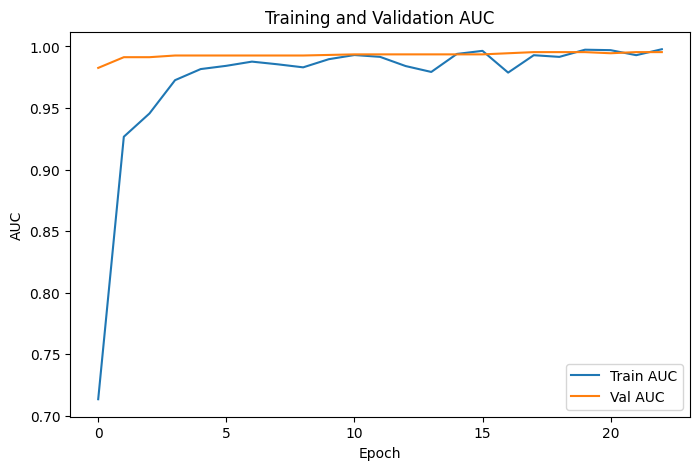

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Dataset_19: Accuracy=0.9795, Precision=0.9854, F1 Score=0.9741, Custom Score=0.9802
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


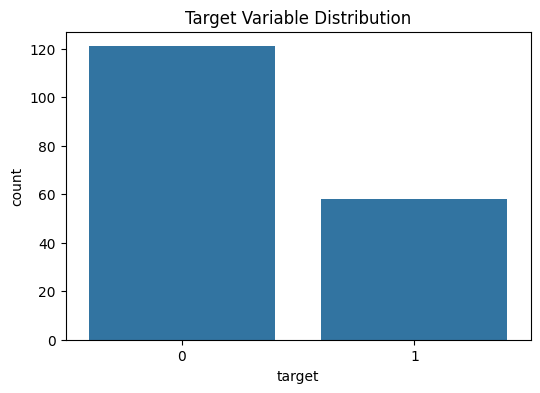

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.4608 - loss: 0.8558 - val_auc: 0.6364 - val_loss: 0.6882
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5594 - loss: 0.7327 - val_auc: 0.7436 - val_loss: 0.6773
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6488 - loss: 0.6344 - val_auc: 0.7727 - val_loss: 0.6715
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6856 - loss: 0.6164 - val_auc: 0.8073 - val_loss: 0.6647
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6379 - loss: 0.6492 - val_auc: 0.8164 - val_loss: 0.6582
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7268 - loss: 0.5660 - val_auc: 0.8255 - val_loss: 0.6525
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8072 - loss: 0.5187 - val_auc: 0.8327 - val_loss: 0.6451
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8261 - loss: 0.4710 - val_auc: 0.8473 - val_loss: 0.6349
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8587 - loss: 0.4238 -

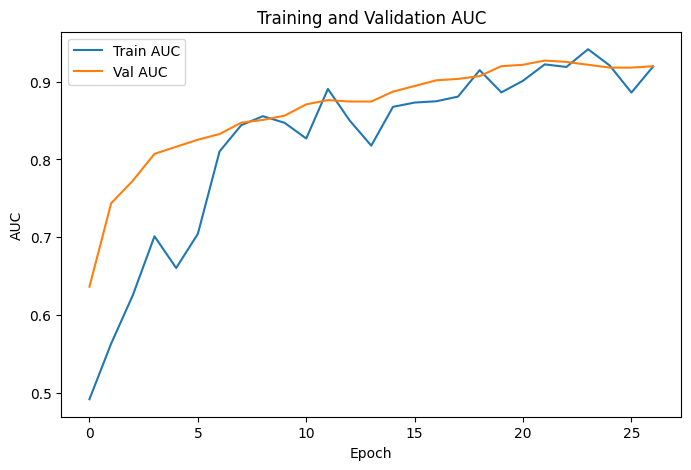

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5003 - loss: 0.9340 - val_auc: 0.7207 - val_loss: 0.6825
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6052 - loss: 0.8241 - val_auc: 0.7508 - val_loss: 0.6668
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7915 - loss: 0.5690 - val_auc: 0.7542 - val_loss: 0.6579
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6872 - loss: 0.6703 - val_auc: 0.7425 - val_loss: 0.6507
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7808 - loss: 0.5622 - val_auc: 0.7441 - val_loss: 0.6447
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7949 - loss: 0.5226 - val_auc: 0.7492 - val_loss: 0.6381
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7857 - loss: 0.5236 - val_auc: 0.7559 - val_loss: 0.6320
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9099 - loss: 0.3989 - val_auc: 0.7575 - val_loss: 0.6241
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

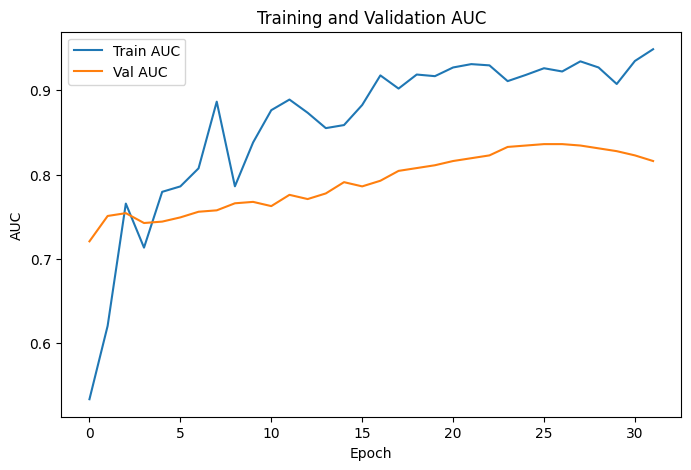

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - auc: 0.5462 - loss: 1.1106 - val_auc: 0.5031 - val_loss: 0.6841
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6419 - loss: 1.0255 - val_auc: 0.6084 - val_loss: 0.6662
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5981 - loss: 0.9776 - val_auc: 0.6672 - val_loss: 0.6510
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7980 - loss: 0.7262 - val_auc: 0.7693 - val_loss: 0.6402
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8330 - loss: 0.7290 - val_auc: 0.8173 - val_loss: 0.6319
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8676 - loss: 0.5899 - val_auc: 0.8390 - val_loss: 0.6244
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8303 - loss: 0.5763 - val_auc: 0.8189 - val_loss: 0.6201
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8991 - loss: 0.4758 - val_auc: 0.8235 - val_loss: 0.6177
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

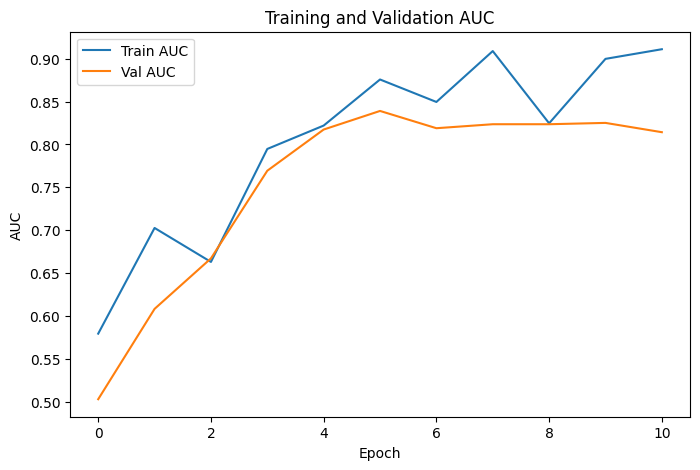

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.4611 - loss: 0.7787 - val_auc: 0.2205 - val_loss: 0.7070
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.4290 - loss: 0.7742 - val_auc: 0.3628 - val_loss: 0.6910
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5698 - loss: 0.6970 - val_auc: 0.5069 - val_loss: 0.6718
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6951 - loss: 0.5964 - val_auc: 0.6181 - val_loss: 0.6547
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7529 - loss: 0.5288 - val_auc: 0.6667 - val_loss: 0.6385
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7820 - loss: 0.5268 - val_auc: 0.7309 - val_loss: 0.6233
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7575 - loss: 0.5160 - val_auc: 0.7569 - val_loss: 0.6096
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6841 - loss: 0.6058 - val_auc: 0.7830 - val_loss: 0.5967
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

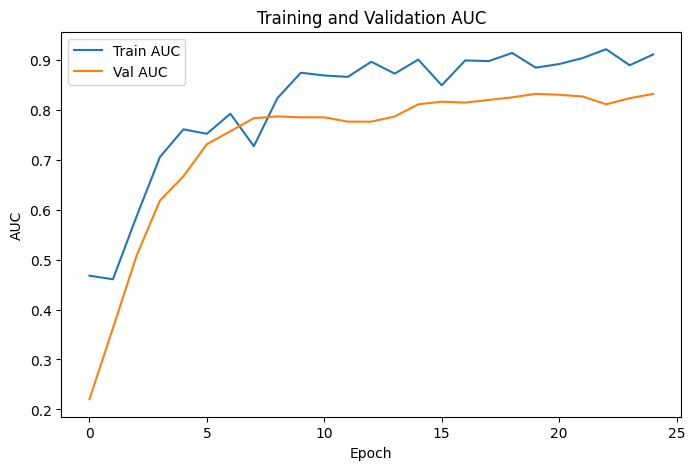

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - auc: 0.5704 - loss: 0.7301 - val_auc: 0.3867 - val_loss: 0.7215
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6188 - loss: 0.7480 - val_auc: 0.4800 - val_loss: 0.7015
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6720 - loss: 0.6723 - val_auc: 0.5200 - val_loss: 0.6840
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7182 - loss: 0.6240 - val_auc: 0.5600 - val_loss: 0.6632
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8056 - loss: 0.5222 - val_auc: 0.6233 - val_loss: 0.6433
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8210 - loss: 0.5034 - val_auc: 0.6267 - val_loss: 0.6276
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8110 - loss: 0.5188 - val_auc: 0.6500 - val_loss: 0.6103
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8534 - loss: 0.4665 - val_auc: 0.6567 - val_loss: 0.5968
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

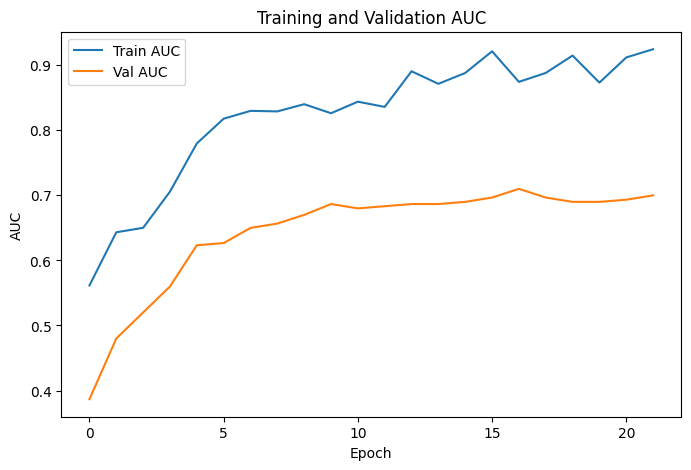

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Dataset_8: Accuracy=0.7490, Precision=0.7619, F1 Score=0.4322, Custom Score=0.6591
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step


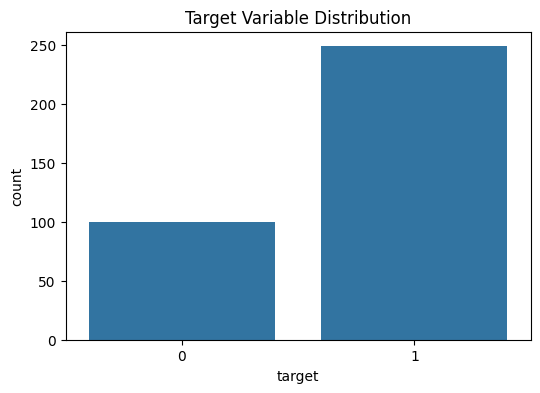

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5864 - loss: 0.8521 - val_auc: 0.6680 - val_loss: 0.6471
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6076 - loss: 0.7706 - val_auc: 0.7545 - val_loss: 0.6177
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6949 - loss: 0.6517 - val_auc: 0.7650 - val_loss: 0.5939
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6193 - loss: 0.6960 - val_auc: 0.7810 - val_loss: 0.5738
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7143 - loss: 0.5916 - val_auc: 0.7780 - val_loss: 0.5606
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6738 - loss: 0.5914 - val_auc: 0.7850 - val_loss: 0.5528
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7495 - loss: 0.5484 - val_auc: 0.7895 - val_loss: 0.5453
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6760 - loss: 0.5832 - val_auc: 0.7880 - val_loss: 0.5383
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6861 - loss: 0.6010 -

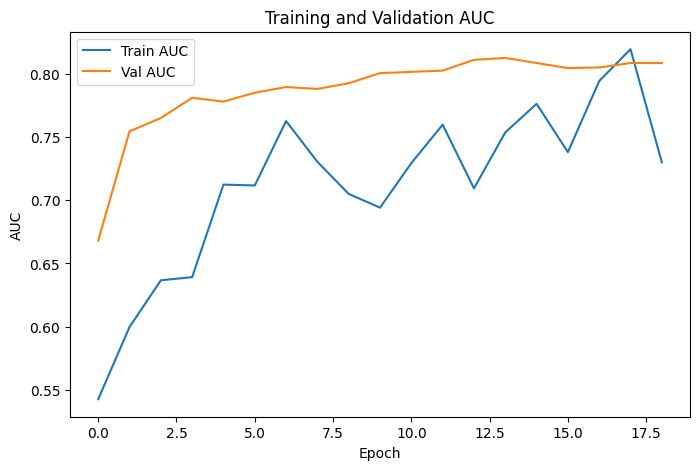

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5859 - loss: 0.6923 - val_auc: 0.6649 - val_loss: 0.6649
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6303 - loss: 0.6406 - val_auc: 0.6788 - val_loss: 0.6434
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6329 - loss: 0.6220 - val_auc: 0.6834 - val_loss: 0.6243
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7470 - loss: 0.5428 - val_auc: 0.6869 - val_loss: 0.6116
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7223 - loss: 0.5776 - val_auc: 0.6898 - val_loss: 0.6007
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7606 - loss: 0.5240 - val_auc: 0.6985 - val_loss: 0.5905
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7264 - loss: 0.5587 - val_auc: 0.7002 - val_loss: 0.5816
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7551 - loss: 0.5286 - val_auc: 0.7060 - val_loss: 0.5738
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

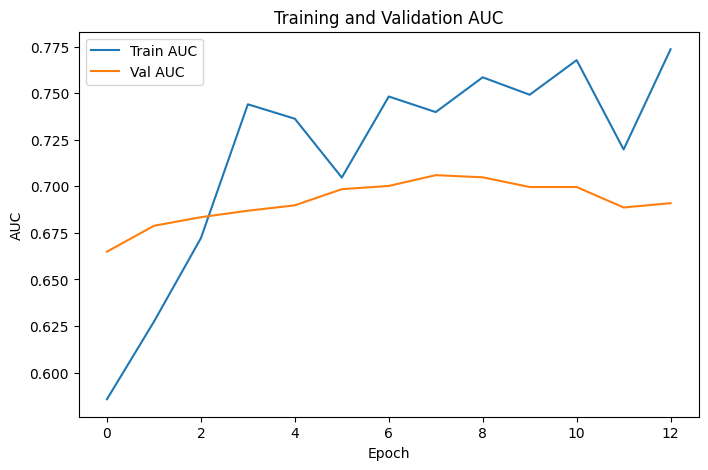

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5780 - loss: 0.7675 - val_auc: 0.6776 - val_loss: 0.6532
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6414 - loss: 0.6642 - val_auc: 0.7761 - val_loss: 0.6298
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6071 - loss: 0.6629 - val_auc: 0.7572 - val_loss: 0.6127
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6796 - loss: 0.6262 - val_auc: 0.7387 - val_loss: 0.6018
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7282 - loss: 0.5410 - val_auc: 0.7257 - val_loss: 0.5948
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7566 - loss: 0.5599 - val_auc: 0.7081 - val_loss: 0.5912
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7369 - loss: 0.5537 - val_auc: 0.6957 - val_loss: 0.5889


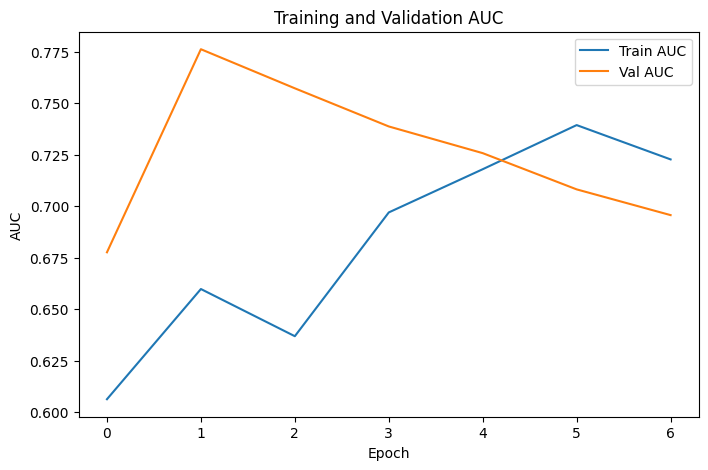

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5581 - loss: 0.7267 - val_auc: 0.6058 - val_loss: 0.6318
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6903 - loss: 0.6136 - val_auc: 0.6661 - val_loss: 0.6200
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6281 - loss: 0.6616 - val_auc: 0.6768 - val_loss: 0.6063
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6951 - loss: 0.5787 - val_auc: 0.6880 - val_loss: 0.5957
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7431 - loss: 0.5585 - val_auc: 0.7062 - val_loss: 0.5864
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7525 - loss: 0.5433 - val_auc: 0.7073 - val_loss: 0.5785
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6874 - loss: 0.5974 - val_auc: 0.7014 - val_loss: 0.5710
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6800 - loss: 0.6002 - val_auc: 0.7014 - val_loss: 0.5664
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5

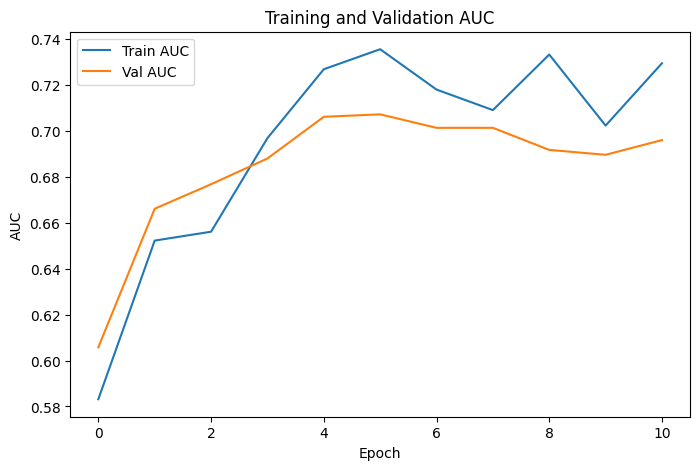

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.3384 - loss: 0.9294 - val_auc: 0.5676 - val_loss: 0.6662
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5508 - loss: 0.6808 - val_auc: 0.6290 - val_loss: 0.6584
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6659 - loss: 0.6123 - val_auc: 0.6441 - val_loss: 0.6501
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7029 - loss: 0.6110 - val_auc: 0.6649 - val_loss: 0.6414
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6831 - loss: 0.5879 - val_auc: 0.6810 - val_loss: 0.6336
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7270 - loss: 0.5532 - val_auc: 0.6701 - val_loss: 0.6281
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7591 - loss: 0.4992 - val_auc: 0.6654 - val_loss: 0.6226
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7217 - loss: 0.5377 - val_auc: 0.6673 - val_loss: 0.6173
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2

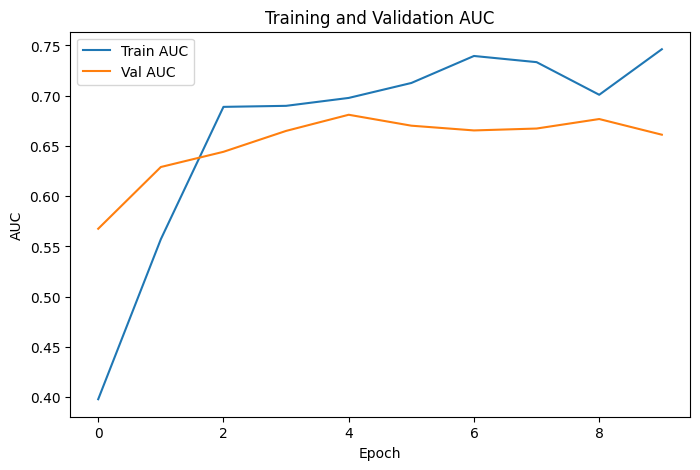

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_38: Accuracy=0.6990, Precision=0.7261, F1 Score=0.8159, Custom Score=0.7449
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step


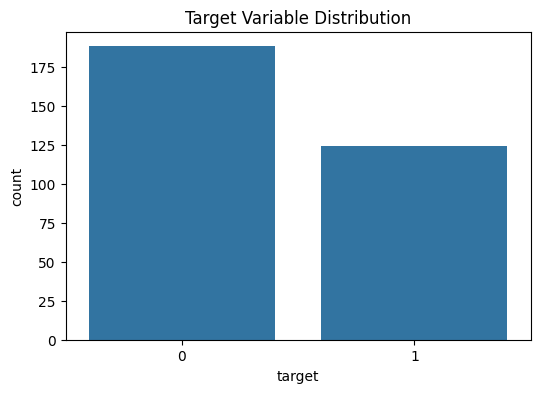

Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - auc: 0.4253 - loss: 0.9711 - val_auc: 0.8235 - val_loss: 0.6662
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7705 - loss: 0.5603 - val_auc: 0.8939 - val_loss: 0.6303
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8747 - loss: 0.4600 - val_auc: 0.9097 - val_loss: 0.5987
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8766 - loss: 0.4408 - val_auc: 0.9173 - val_loss: 0.5712
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8966 - loss: 0.4003 - val_auc: 0.9306 - val_loss: 0.5475
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9472 - loss: 0.2988 - val_auc: 0.9306 - val_loss: 0.5262
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9569 - loss: 0.2711 - val_auc: 0.9286 - val_loss: 0.5062
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9673 - loss: 0.2327 - val_auc: 0.9250 - val_loss: 0.4848
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9719 - loss: 0.2263 -

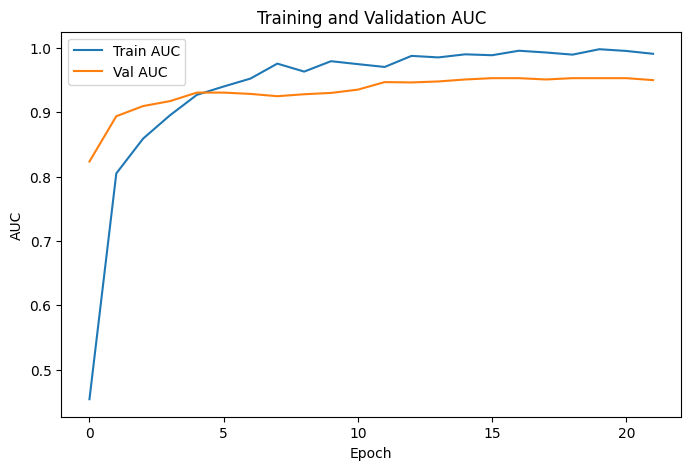

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.4993 - loss: 0.9289 - val_auc: 0.7458 - val_loss: 0.6552
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7689 - loss: 0.6335 - val_auc: 0.8679 - val_loss: 0.6145
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8391 - loss: 0.5179 - val_auc: 0.9100 - val_loss: 0.5872
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8882 - loss: 0.4232 - val_auc: 0.9284 - val_loss: 0.5683
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9605 - loss: 0.2824 - val_auc: 0.9384 - val_loss: 0.5523
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9400 - loss: 0.3148 - val_auc: 0.9489 - val_loss: 0.5366
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9553 - loss: 0.2824 - val_auc: 0.9516 - val_loss: 0.5206
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9444 - loss: 0.2919 - val_auc: 0.9595 - val_loss: 0.5027
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

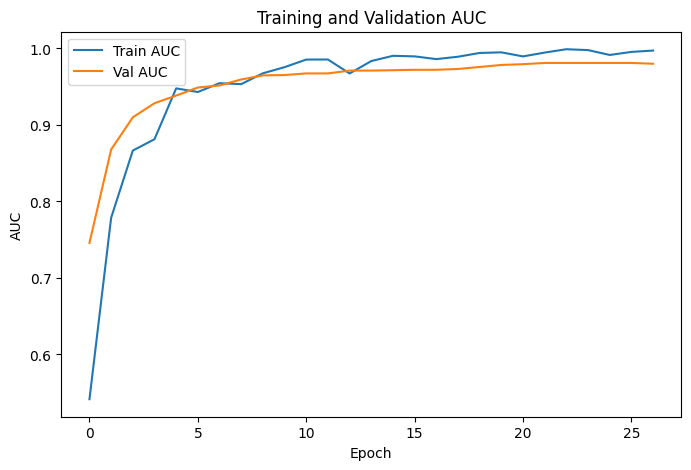

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - auc: 0.5538 - loss: 0.8338 - val_auc: 0.8640 - val_loss: 0.6555
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8456 - loss: 0.4736 - val_auc: 0.9716 - val_loss: 0.6026
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9034 - loss: 0.3869 - val_auc: 0.9874 - val_loss: 0.5533
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9267 - loss: 0.3465 - val_auc: 0.9884 - val_loss: 0.5135
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9550 - loss: 0.2815 - val_auc: 0.9879 - val_loss: 0.4826
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9519 - loss: 0.2738 - val_auc: 0.9879 - val_loss: 0.4642
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9610 - loss: 0.2449 - val_auc: 0.9911 - val_loss: 0.4527
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9593 - loss: 0.2542 - val_auc: 0.9905 - val_loss: 0.4448
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

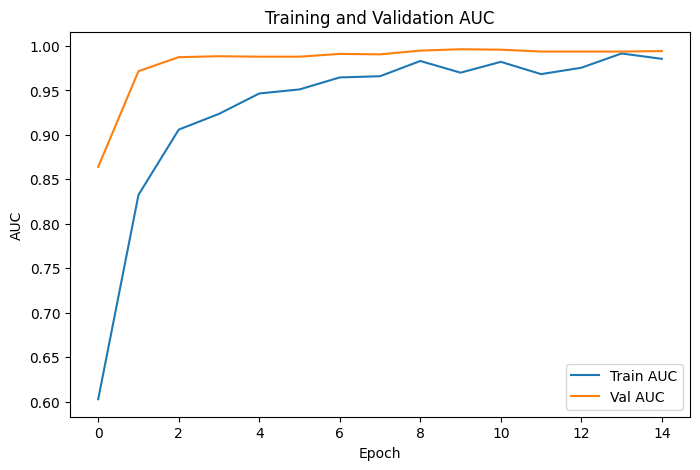

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - auc: 0.5383 - loss: 0.9204 - val_auc: 0.6832 - val_loss: 0.6719
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7771 - loss: 0.6579 - val_auc: 0.9476 - val_loss: 0.6285
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8876 - loss: 0.4599 - val_auc: 0.9757 - val_loss: 0.5907
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8676 - loss: 0.4928 - val_auc: 0.9838 - val_loss: 0.5597
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9271 - loss: 0.3629 - val_auc: 0.9881 - val_loss: 0.5340
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9460 - loss: 0.3151 - val_auc: 0.9876 - val_loss: 0.5120
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9674 - loss: 0.2673 - val_auc: 0.9865 - val_loss: 0.4928
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9714 - loss: 0.2301 - val_auc: 0.9870 - val_loss: 0.4739
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

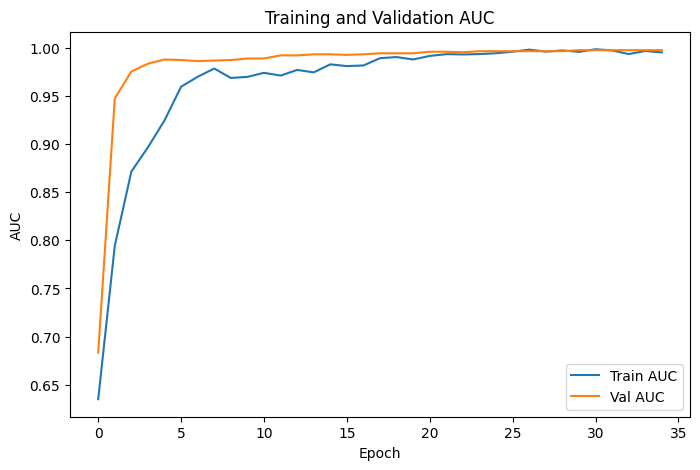

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - auc: 0.5869 - loss: 0.7598 - val_auc: 0.9539 - val_loss: 0.5997
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8224 - loss: 0.5133 - val_auc: 0.9766 - val_loss: 0.5445
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9491 - loss: 0.3250 - val_auc: 0.9855 - val_loss: 0.5053
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9441 - loss: 0.3163 - val_auc: 0.9899 - val_loss: 0.4689
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9339 - loss: 0.3221 - val_auc: 0.9899 - val_loss: 0.4378
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9645 - loss: 0.2517 - val_auc: 0.9912 - val_loss: 0.4101
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9659 - loss: 0.2385 - val_auc: 0.9924 - val_loss: 0.3832
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9700 - loss: 0.2301 - val_auc: 0.9924 - val_loss: 0.3617
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3

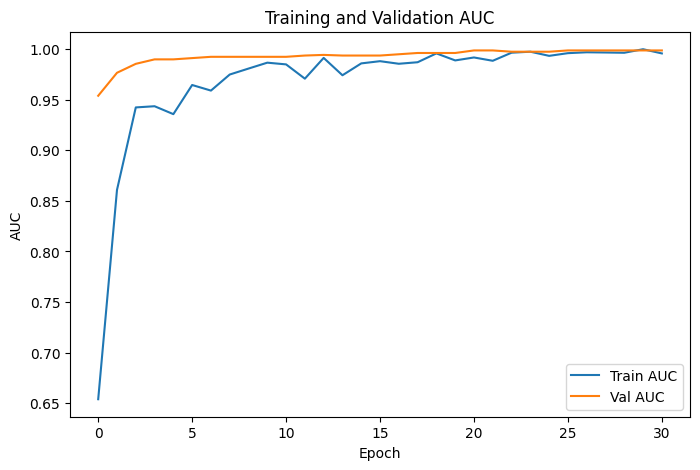

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Dataset_6: Accuracy=0.9071, Precision=0.9227, F1 Score=0.8823, Custom Score=0.9059
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 593us/step


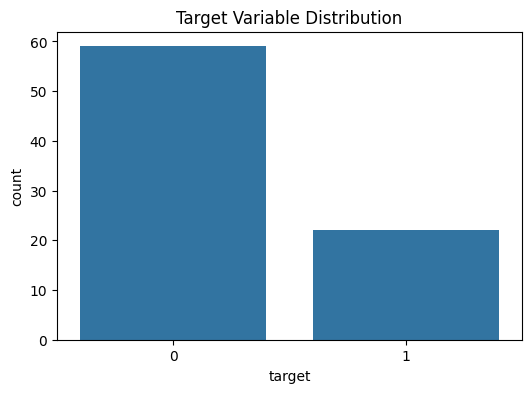

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - auc: 0.5812 - loss: 0.6161 - val_auc: 0.2348 - val_loss: 0.6920
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - auc: 0.6231 - loss: 0.5673 - val_auc: 0.3030 - val_loss: 0.6879
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.4796 - loss: 0.7177 - val_auc: 0.3561 - val_loss: 0.6843
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - auc: 0.6286 - loss: 0.5569 - val_auc: 0.3712 - val_loss: 0.6815
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.8262 - loss: 0.4517 - val_auc: 0.3712 - val_loss: 0.6785
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - auc: 0.7266 - loss: 0.5730 - val_auc: 0.3788 - val_loss: 0.6753
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7469 - loss: 0.4522 - val_auc: 0.3864 - val_loss: 0.6718
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.6619 - loss: 0.5809 - val_auc: 0.4015 - val_loss: 0.6685
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.7477 - loss:

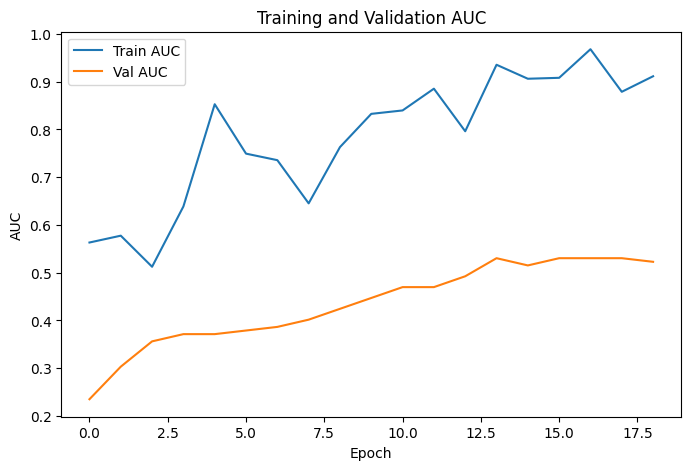

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - auc: 0.5378 - loss: 0.9389 - val_auc: 0.3077 - val_loss: 0.6243
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.4927 - loss: 0.8842 - val_auc: 0.3077 - val_loss: 0.6283
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5673 - loss: 0.8104 - val_auc: 0.3974 - val_loss: 0.6318
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - auc: 0.6130 - loss: 0.6981 - val_auc: 0.4487 - val_loss: 0.6377
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5005 - loss: 0.7691 - val_auc: 0.5000 - val_loss: 0.6418
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.4976 - loss: 0.7402 - val_auc: 0.6282 - val_loss: 0.6455
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6209 - loss: 0.6591 - val_auc: 0.7051 - val_loss: 0.6482
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6034 - loss: 0.7090 - val_auc: 0.7051 - val_loss: 0.6506
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 

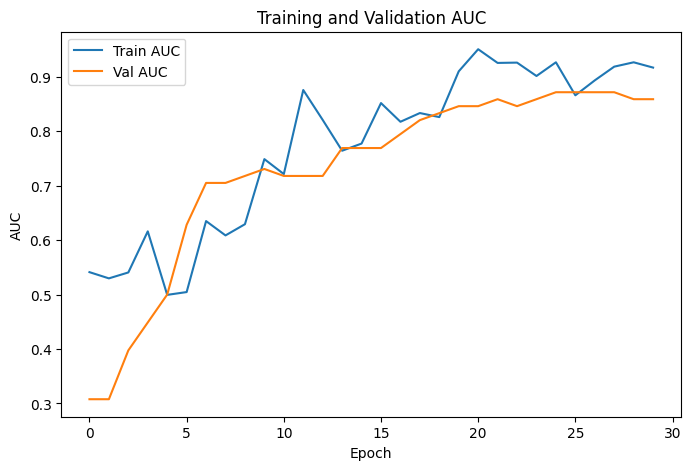

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - auc: 0.5971 - loss: 0.7551 - val_auc: 0.6667 - val_loss: 0.6910
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - auc: 0.3907 - loss: 0.9913 - val_auc: 0.6795 - val_loss: 0.6965
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6111 - loss: 0.7837 - val_auc: 0.7564 - val_loss: 0.6997
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6050 - loss: 0.7909 - val_auc: 0.7308 - val_loss: 0.6961
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7508 - loss: 0.5946 - val_auc: 0.7308 - val_loss: 0.6964
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7989 - loss: 0.5254 - val_auc: 0.7436 - val_loss: 0.6948
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8174 - loss: 0.5704 - val_auc: 0.6923 - val_loss: 0.6944
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.7801 - loss: 0.5276 - val_auc: 0.6667 - val_loss: 0.6962


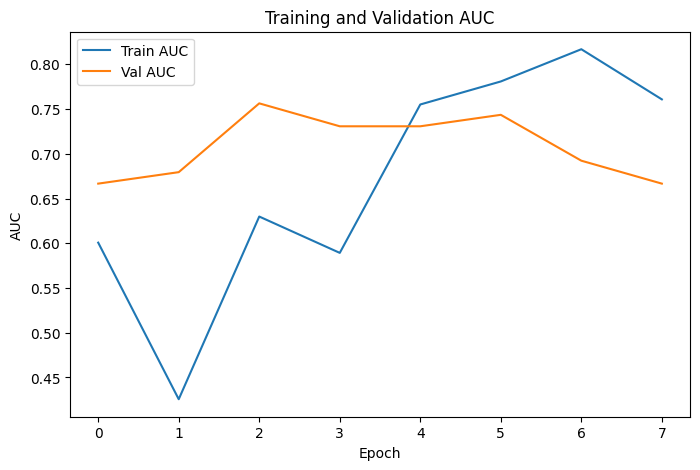

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - auc: 0.5166 - loss: 0.8340 - val_auc: 0.6410 - val_loss: 0.6913
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - auc: 0.5111 - loss: 0.7868 - val_auc: 0.6667 - val_loss: 0.6863
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - auc: 0.5357 - loss: 0.8018 - val_auc: 0.6026 - val_loss: 0.6823
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - auc: 0.4821 - loss: 0.7677 - val_auc: 0.6154 - val_loss: 0.6772
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - auc: 0.6497 - loss: 0.6652 - val_auc: 0.6154 - val_loss: 0.6749
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - auc: 0.6509 - loss: 0.6310 - val_auc: 0.6154 - val_loss: 0.6705
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - auc: 0.8083 - loss: 0.4754 - val_auc: 0.6282 - val_loss: 0.6659


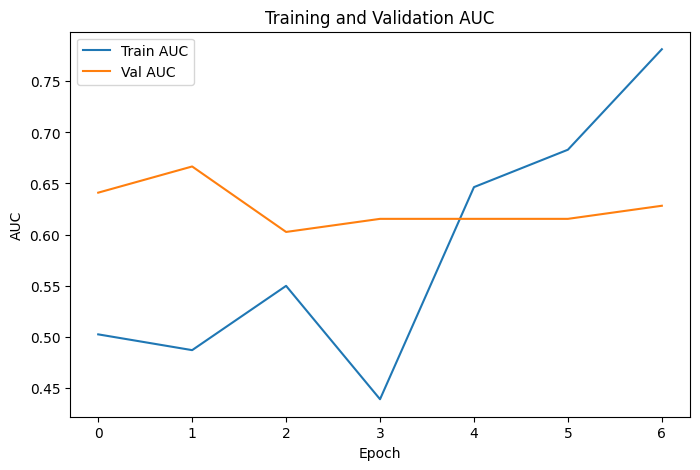

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - auc: 0.4492 - loss: 0.9443 - val_auc: 0.6825 - val_loss: 0.6919
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5916 - loss: 0.8514 - val_auc: 0.7143 - val_loss: 0.6857
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.5678 - loss: 0.7589 - val_auc: 0.7381 - val_loss: 0.6805
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5315 - loss: 0.7356 - val_auc: 0.7540 - val_loss: 0.6756
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6052 - loss: 0.6631 - val_auc: 0.7302 - val_loss: 0.6738
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6132 - loss: 0.6271 - val_auc: 0.7460 - val_loss: 0.6713
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5758 - loss: 0.6693 - val_auc: 0.7698 - val_loss: 0.6663
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8088 - loss: 0.5224 - val_auc: 0.7698 - val_loss: 0.6628
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7

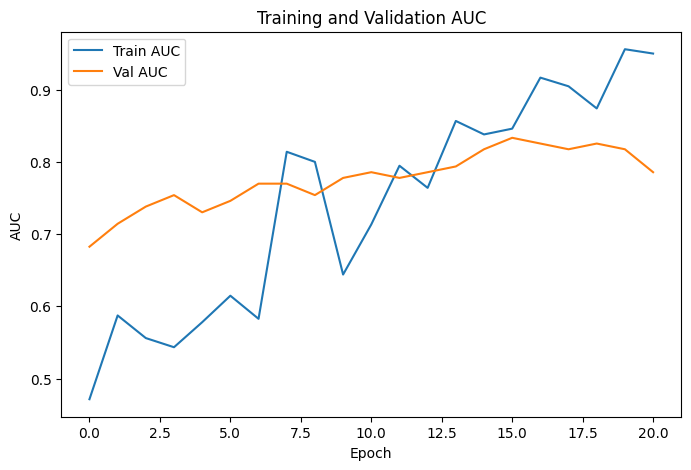

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Dataset_31: Accuracy=0.6544, Precision=0.5450, F1 Score=0.3990, Custom Score=0.5340
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


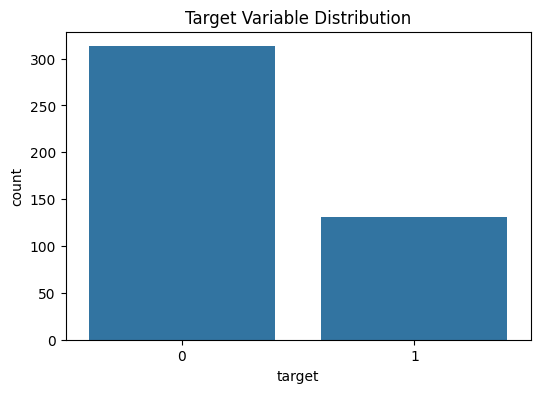

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5502 - loss: 0.7374 - val_auc: 0.5719 - val_loss: 0.6531
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6547 - loss: 0.6242 - val_auc: 0.6398 - val_loss: 0.6138
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7009 - loss: 0.6055 - val_auc: 0.7035 - val_loss: 0.5818
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7766 - loss: 0.5070 - val_auc: 0.7354 - val_loss: 0.5648
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7118 - loss: 0.6163 - val_auc: 0.7449 - val_loss: 0.5515
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6836 - loss: 0.6156 - val_auc: 0.7527 - val_loss: 0.5424
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7361 - loss: 0.5467 - val_auc: 0.7575 - val_loss: 0.5343
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7489 - loss: 0.5242 - val_auc: 0.7653 - val_loss: 0.5284
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.817

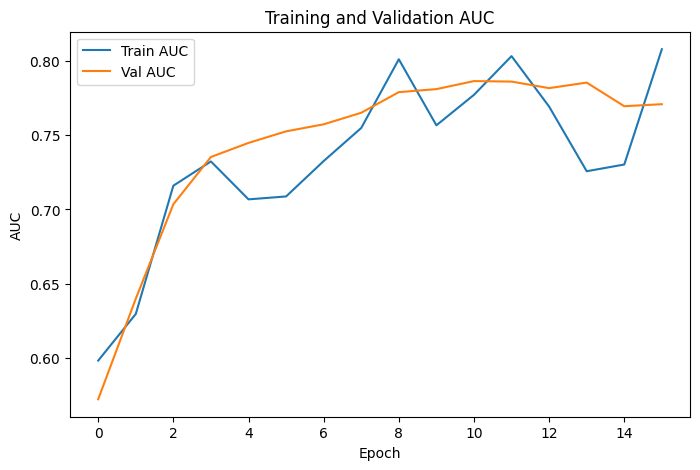

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.4914 - loss: 0.7035 - val_auc: 0.7348 - val_loss: 0.6219
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5902 - loss: 0.6545 - val_auc: 0.7489 - val_loss: 0.6257
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6787 - loss: 0.5548 - val_auc: 0.7641 - val_loss: 0.6227
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7056 - loss: 0.5859 - val_auc: 0.7647 - val_loss: 0.6225
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6582 - loss: 0.5697 - val_auc: 0.7761 - val_loss: 0.6130
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7600 - loss: 0.5077 - val_auc: 0.7836 - val_loss: 0.6069
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7572 - loss: 0.5091 - val_auc: 0.7805 - val_loss: 0.6002
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7798 - loss: 0.5027 - val_auc: 0.7917 - val_loss: 0.5875
Epoch 9/100
12/12 ━━━━━━━

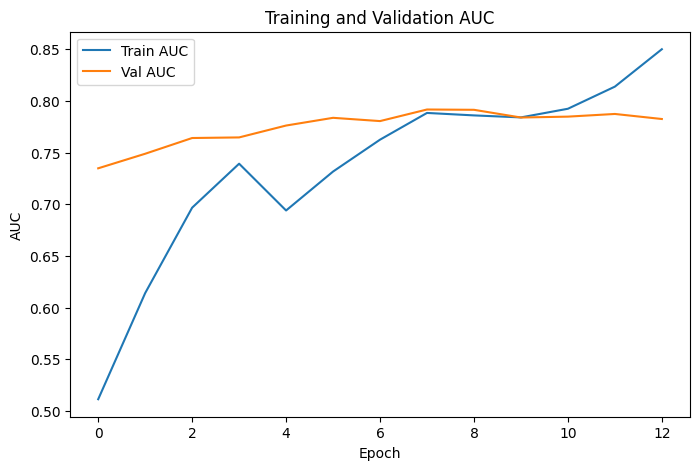

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step 
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6172 - loss: 0.8725 - val_auc: 0.5249 - val_loss: 0.6344
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6621 - loss: 0.7618 - val_auc: 0.5557 - val_loss: 0.6075
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7239 - loss: 0.6118 - val_auc: 0.5630 - val_loss: 0.5875
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7421 - loss: 0.5804 - val_auc: 0.5704 - val_loss: 0.5732
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7518 - loss: 0.5476 - val_auc: 0.5907 - val_loss: 0.5611
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7310 - loss: 0.5917 - val_auc: 0.5900 - val_loss: 0.5572
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7534 - loss: 0.5299 - val_auc: 0.5998 - val_loss: 0.5530
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7909 - loss: 0.5118 - val_auc: 0.6096 - val_loss: 0.5475
Epoch 9/100
12/12 ━━━━━━

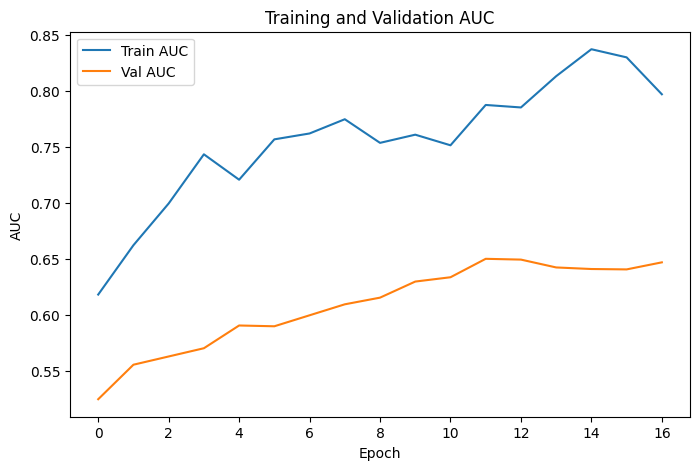

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.4935 - loss: 1.0220 - val_auc: 0.5723 - val_loss: 0.7152
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5684 - loss: 0.8486 - val_auc: 0.6437 - val_loss: 0.6606
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6416 - loss: 0.7290 - val_auc: 0.7219 - val_loss: 0.6294
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6669 - loss: 0.6609 - val_auc: 0.7482 - val_loss: 0.6123
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6983 - loss: 0.6089 - val_auc: 0.7474 - val_loss: 0.5976
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6947 - loss: 0.5870 - val_auc: 0.7547 - val_loss: 0.5876
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7200 - loss: 0.5510 - val_auc: 0.7553 - val_loss: 0.5786
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7002 - loss: 0.5596 - val_auc: 0.7661 - val_loss: 0.5701
Epoch 9/100
12/12 ━━━━━━━

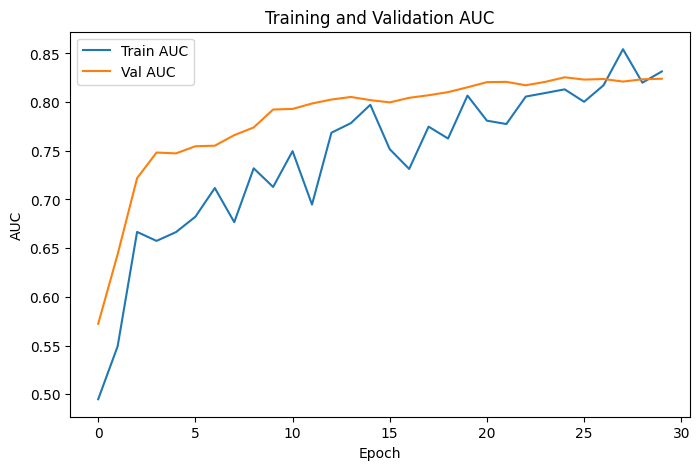

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5075 - loss: 0.7737 - val_auc: 0.6358 - val_loss: 0.6598
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5979 - loss: 0.6534 - val_auc: 0.7068 - val_loss: 0.6446
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6322 - loss: 0.6321 - val_auc: 0.7773 - val_loss: 0.6281
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5839 - loss: 0.6413 - val_auc: 0.7968 - val_loss: 0.6170
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6067 - loss: 0.6445 - val_auc: 0.7773 - val_loss: 0.6109
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7079 - loss: 0.5500 - val_auc: 0.7683 - val_loss: 0.6058
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7171 - loss: 0.5353 - val_auc: 0.7756 - val_loss: 0.5996
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7011 - loss: 0.5504 - val_auc: 0.7719 - val_loss: 0.5958
Epoch 9/100
12/12 ━━━━━━━

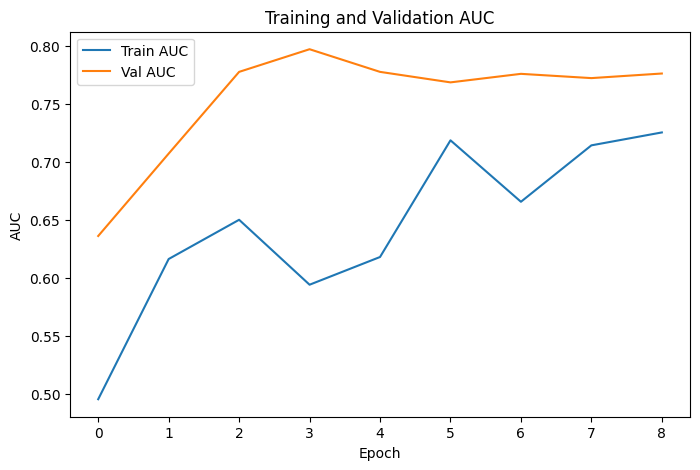

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step 
Dataset_1: Accuracy=0.7342, Precision=0.5842, F1 Score=0.3678, Custom Score=0.5643
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step


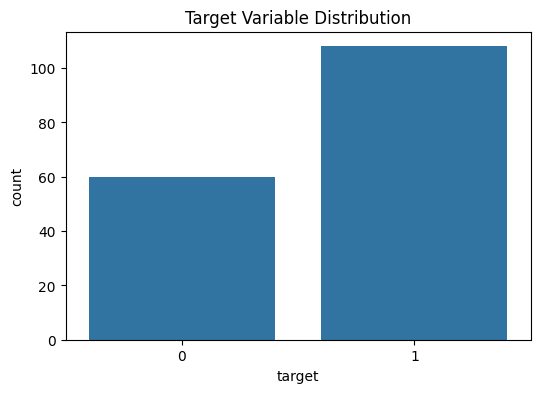

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5764 - loss: 0.7032 - val_auc: 0.5714 - val_loss: 0.6720
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6190 - loss: 0.6832 - val_auc: 0.6264 - val_loss: 0.6614
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7044 - loss: 0.6052 - val_auc: 0.7051 - val_loss: 0.6467
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7717 - loss: 0.5377 - val_auc: 0.7601 - val_loss: 0.6289
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8581 - loss: 0.4486 - val_auc: 0.8077 - val_loss: 0.6110
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7824 - loss: 0.5315 - val_auc: 0.8370 - val_loss: 0.5966
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8529 - loss: 0.4587 - val_auc: 0.8645 - val_loss: 0.5829
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9157 - loss: 0.3868 - val_auc: 0.8883 - val_loss: 0.5692
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8810 - loss: 0.4002 -

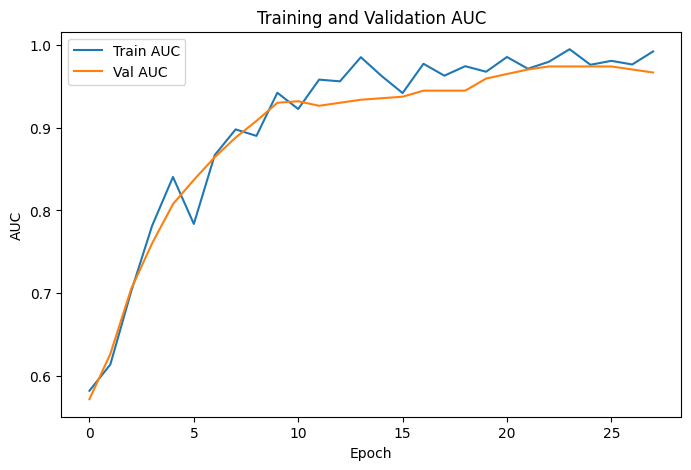

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.5068 - loss: 0.9282 - val_auc: 0.4982 - val_loss: 0.7102
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5180 - loss: 0.8556 - val_auc: 0.6193 - val_loss: 0.6923
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6923 - loss: 0.7014 - val_auc: 0.7035 - val_loss: 0.6762
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7865 - loss: 0.5655 - val_auc: 0.7632 - val_loss: 0.6595
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8351 - loss: 0.5344 - val_auc: 0.8070 - val_loss: 0.6435
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7551 - loss: 0.5996 - val_auc: 0.8579 - val_loss: 0.6263
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8545 - loss: 0.4995 - val_auc: 0.8842 - val_loss: 0.6102
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8524 - loss: 0.4747 - val_auc: 0.9140 - val_loss: 0.5946
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

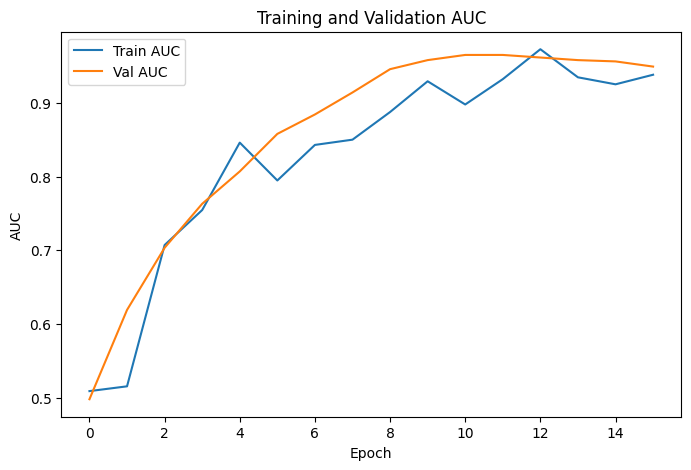

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4799 - loss: 0.9099 - val_auc: 0.5500 - val_loss: 0.6972
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6181 - loss: 0.7659 - val_auc: 0.6417 - val_loss: 0.6708
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7065 - loss: 0.6294 - val_auc: 0.7250 - val_loss: 0.6547
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8015 - loss: 0.5463 - val_auc: 0.8229 - val_loss: 0.6390
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7812 - loss: 0.5471 - val_auc: 0.8479 - val_loss: 0.6239
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8437 - loss: 0.4915 - val_auc: 0.8729 - val_loss: 0.6058
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9163 - loss: 0.3971 - val_auc: 0.8792 - val_loss: 0.5909
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8748 - loss: 0.4420 - val_auc: 0.8854 - val_loss: 0.5728
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

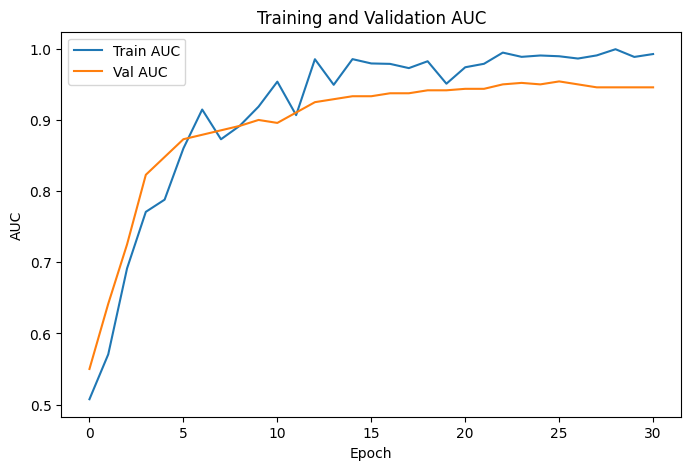

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - auc: 0.6005 - loss: 0.7588 - val_auc: 0.4826 - val_loss: 0.6998
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6649 - loss: 0.7348 - val_auc: 0.5848 - val_loss: 0.6802
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6254 - loss: 0.7240 - val_auc: 0.6413 - val_loss: 0.6644
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7999 - loss: 0.5236 - val_auc: 0.6891 - val_loss: 0.6533
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8008 - loss: 0.5395 - val_auc: 0.7457 - val_loss: 0.6441
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8595 - loss: 0.4554 - val_auc: 0.7478 - val_loss: 0.6348
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7964 - loss: 0.5430 - val_auc: 0.7739 - val_loss: 0.6231
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9126 - loss: 0.3999 - val_auc: 0.8109 - val_loss: 0.6117
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

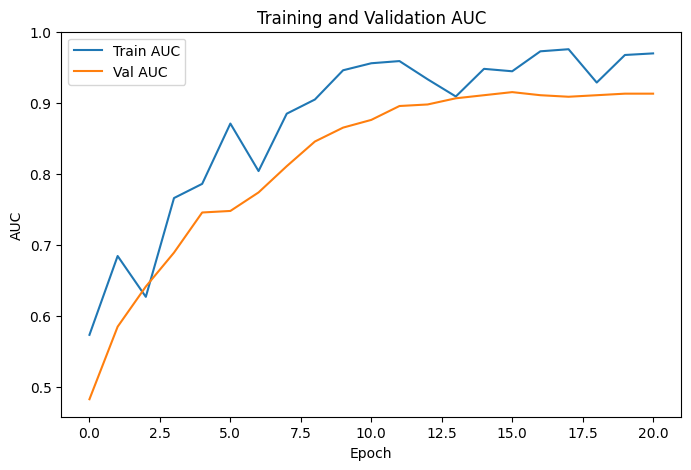

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4536 - loss: 0.8476 - val_auc: 0.5099 - val_loss: 0.6679
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6467 - loss: 0.6685 - val_auc: 0.5813 - val_loss: 0.6538
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7359 - loss: 0.5738 - val_auc: 0.6746 - val_loss: 0.6425
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7757 - loss: 0.5443 - val_auc: 0.7183 - val_loss: 0.6305
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8132 - loss: 0.5081 - val_auc: 0.7302 - val_loss: 0.6208
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8891 - loss: 0.4299 - val_auc: 0.7540 - val_loss: 0.6096
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8634 - loss: 0.4369 - val_auc: 0.7778 - val_loss: 0.5968
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9106 - loss: 0.3969 - val_auc: 0.7857 - val_loss: 0.5847
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

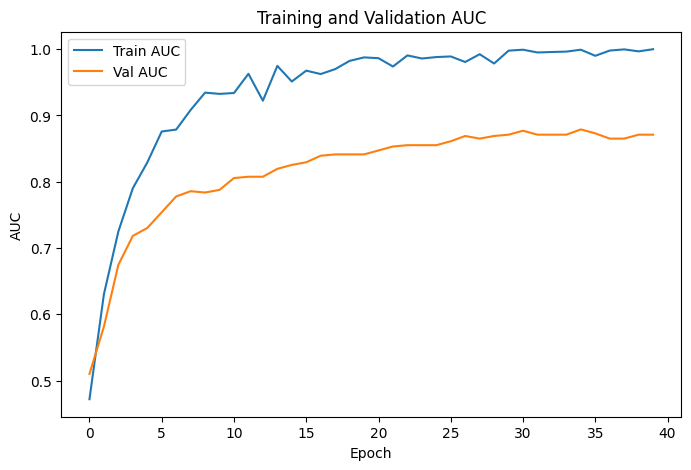

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Dataset_36: Accuracy=0.8747, Precision=0.8884, F1 Score=0.9033, Custom Score=0.8888
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step


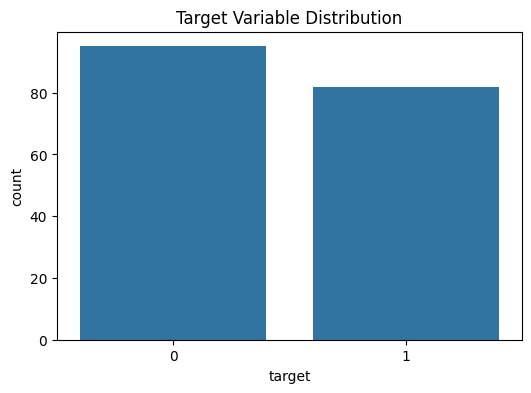

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - auc: 0.5346 - loss: 0.7969 - val_auc: 0.2577 - val_loss: 0.7140
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5849 - loss: 0.7423 - val_auc: 0.5463 - val_loss: 0.6891
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8483 - loss: 0.4982 - val_auc: 0.6296 - val_loss: 0.6708
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7428 - loss: 0.6239 - val_auc: 0.6991 - val_loss: 0.6566
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8749 - loss: 0.4276 - val_auc: 0.7315 - val_loss: 0.6424
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8584 - loss: 0.4694 - val_auc: 0.7562 - val_loss: 0.6298
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8434 - loss: 0.5075 - val_auc: 0.7639 - val_loss: 0.6202
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8864 - loss: 0.4309 - val_auc: 0.7716 - val_loss: 0.6108
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9042 - loss: 0.4196 -

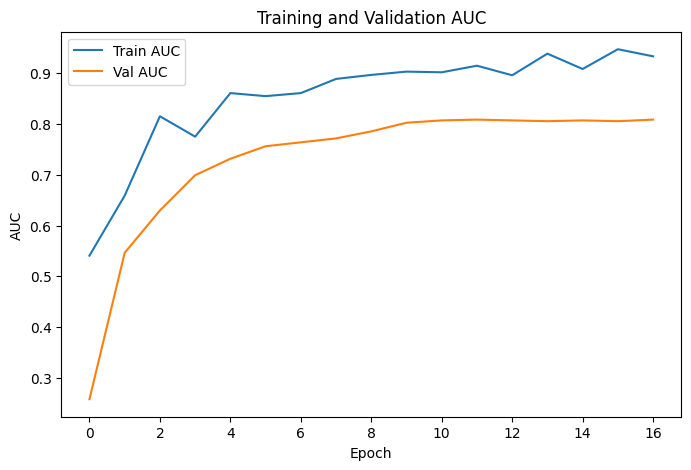

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.6525 - loss: 0.6745 - val_auc: 0.8117 - val_loss: 0.6433
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7551 - loss: 0.6241 - val_auc: 0.8611 - val_loss: 0.6176
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7902 - loss: 0.5472 - val_auc: 0.8719 - val_loss: 0.5961
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8254 - loss: 0.5042 - val_auc: 0.8719 - val_loss: 0.5769
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9072 - loss: 0.3992 - val_auc: 0.8596 - val_loss: 0.5606
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9006 - loss: 0.4101 - val_auc: 0.8688 - val_loss: 0.5465
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8910 - loss: 0.4064 - val_auc: 0.8673 - val_loss: 0.5348
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9088 - loss: 0.3633 - val_auc: 0.8642 - val_loss: 0.5235


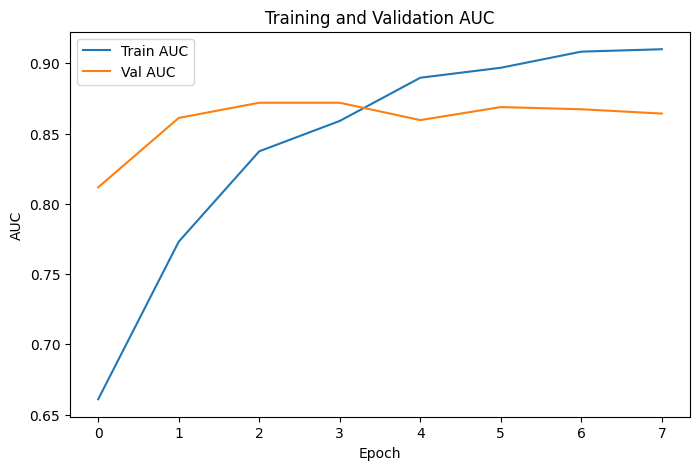

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - auc: 0.3879 - loss: 1.0330 - val_auc: 0.7974 - val_loss: 0.6679
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.4150 - loss: 0.9499 - val_auc: 0.8611 - val_loss: 0.6525
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6993 - loss: 0.6557 - val_auc: 0.8889 - val_loss: 0.6373
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8098 - loss: 0.5497 - val_auc: 0.8938 - val_loss: 0.6231
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8273 - loss: 0.5627 - val_auc: 0.8954 - val_loss: 0.6109
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8073 - loss: 0.5232 - val_auc: 0.8954 - val_loss: 0.5997
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8914 - loss: 0.4309 - val_auc: 0.8954 - val_loss: 0.5891
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8907 - loss: 0.4233 - val_auc: 0.9003 - val_loss: 0.5787
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

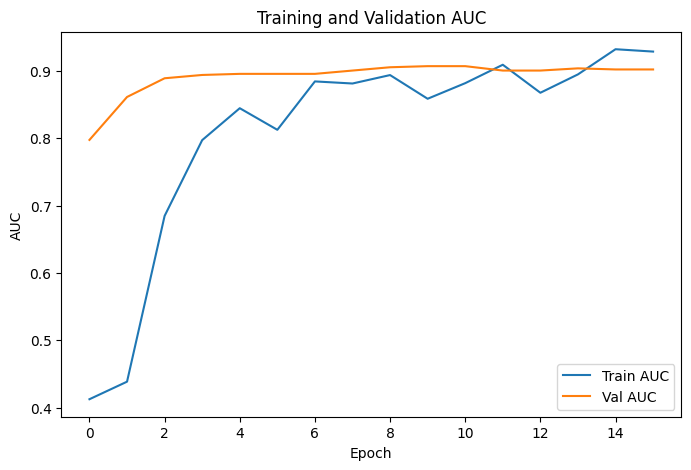

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.5823 - loss: 0.7409 - val_auc: 0.8426 - val_loss: 0.7059
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6931 - loss: 0.6420 - val_auc: 0.8657 - val_loss: 0.6926
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7728 - loss: 0.5904 - val_auc: 0.8981 - val_loss: 0.6771
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8287 - loss: 0.5097 - val_auc: 0.9120 - val_loss: 0.6648
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8238 - loss: 0.5258 - val_auc: 0.9213 - val_loss: 0.6563
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8597 - loss: 0.4941 - val_auc: 0.9213 - val_loss: 0.6484
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8445 - loss: 0.4872 - val_auc: 0.9190 - val_loss: 0.6409
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8622 - loss: 0.4504 - val_auc: 0.9213 - val_loss: 0.6369
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

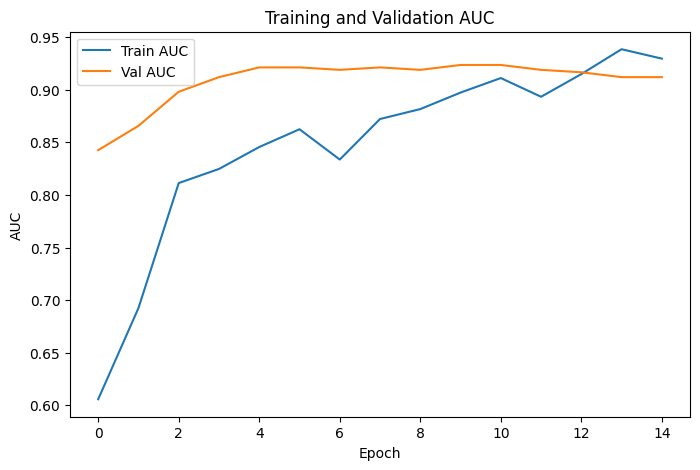

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4594 - loss: 0.9143 - val_auc: 0.8133 - val_loss: 0.6588
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6933 - loss: 0.7239 - val_auc: 0.9383 - val_loss: 0.6234
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6811 - loss: 0.6478 - val_auc: 0.9550 - val_loss: 0.5944
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8147 - loss: 0.5291 - val_auc: 0.9583 - val_loss: 0.5706
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8031 - loss: 0.5408 - val_auc: 0.9567 - val_loss: 0.5468
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8046 - loss: 0.5402 - val_auc: 0.9533 - val_loss: 0.5250
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8966 - loss: 0.4081 - val_auc: 0.9533 - val_loss: 0.5038
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8723 - loss: 0.4351 - val_auc: 0.9533 - val_loss: 0.4852
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

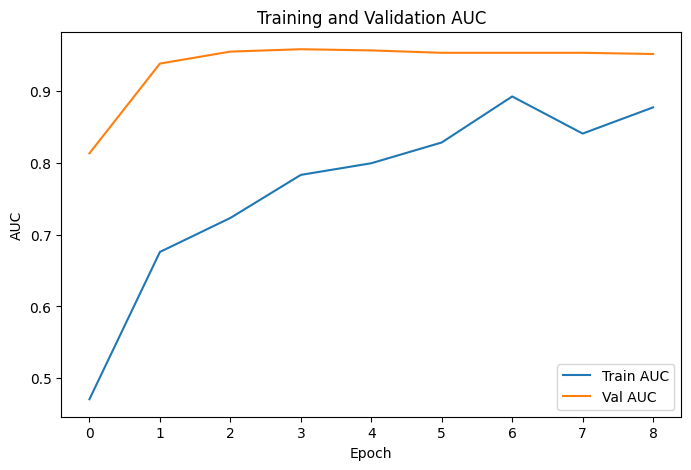

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Dataset_37: Accuracy=0.7683, Precision=0.7158, F1 Score=0.7584, Custom Score=0.7443
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step


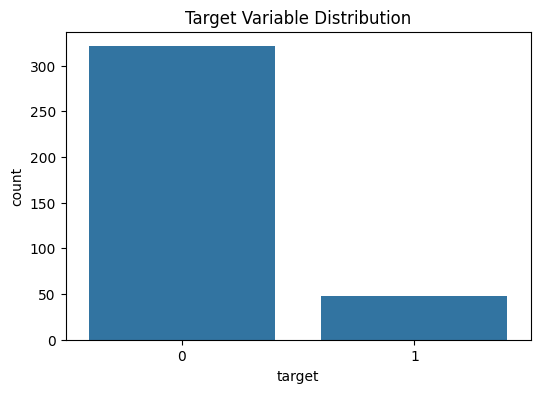

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - auc: 0.6647 - loss: 0.6494 - val_auc: 0.8433 - val_loss: 0.6672
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7369 - loss: 0.5081 - val_auc: 0.9094 - val_loss: 0.5977
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8840 - loss: 0.3871 - val_auc: 0.9179 - val_loss: 0.5236
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9528 - loss: 0.2769 - val_auc: 0.9115 - val_loss: 0.4539
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9235 - loss: 0.2580 - val_auc: 0.9126 - val_loss: 0.3904
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9451 - loss: 0.2144 - val_auc: 0.9296 - val_loss: 0.3350
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9542 - loss: 0.2022 - val_auc: 0.9350 - val_loss: 0.2919
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9015 - loss: 0.2436 - val_auc: 0.9467 - val_loss: 0.2565
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.953

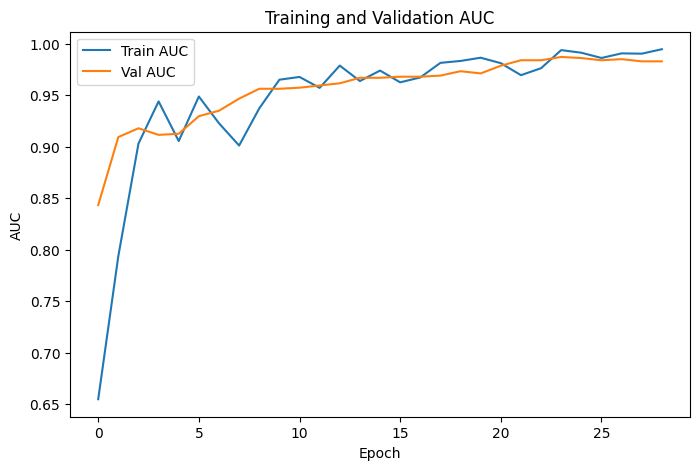

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - auc: 0.4583 - loss: 0.9517 - val_auc: 0.6299 - val_loss: 0.6858
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6876 - loss: 0.6592 - val_auc: 0.8410 - val_loss: 0.6192
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7970 - loss: 0.5211 - val_auc: 0.9154 - val_loss: 0.5504
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8235 - loss: 0.4295 - val_auc: 0.9521 - val_loss: 0.4849
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8880 - loss: 0.3485 - val_auc: 0.9513 - val_loss: 0.4255
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9109 - loss: 0.2603 - val_auc: 0.9521 - val_loss: 0.3735
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9463 - loss: 0.2474 - val_auc: 0.9735 - val_loss: 0.3252
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9336 - loss: 0.2317 - val_auc: 0.9829 - val_loss: 0.2866
Epoch 9/100
10/10 ━━━━━━━

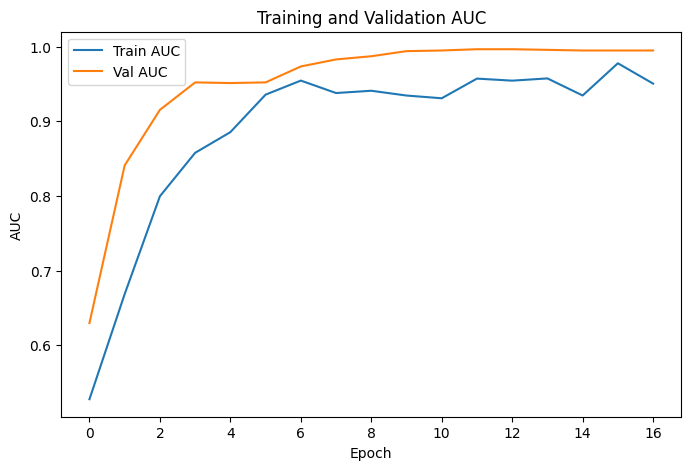

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - auc: 0.5806 - loss: 0.5677 - val_auc: 0.8226 - val_loss: 0.6528
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6796 - loss: 0.4299 - val_auc: 0.8839 - val_loss: 0.6252
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7808 - loss: 0.3586 - val_auc: 0.9077 - val_loss: 0.5891
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8676 - loss: 0.2728 - val_auc: 0.9149 - val_loss: 0.5472
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8924 - loss: 0.2542 - val_auc: 0.9155 - val_loss: 0.5047
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9217 - loss: 0.2306 - val_auc: 0.9196 - val_loss: 0.4660
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9186 - loss: 0.2377 - val_auc: 0.9196 - val_loss: 0.4283
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9578 - loss: 0.1805 - val_auc: 0.9214 - val_loss: 0.3979
Epoch 9/100
10/10 ━━━━━━━

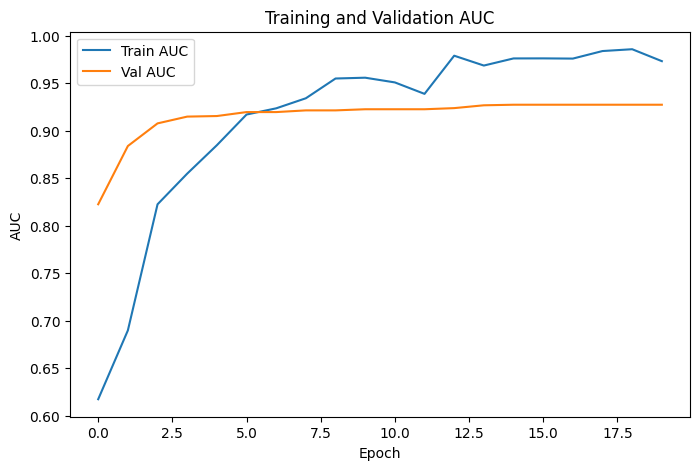

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - auc: 0.4908 - loss: 1.1512 - val_auc: 0.8658 - val_loss: 0.6678
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7434 - loss: 0.7026 - val_auc: 0.9726 - val_loss: 0.6220
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8131 - loss: 0.6310 - val_auc: 0.9838 - val_loss: 0.5705
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9011 - loss: 0.4520 - val_auc: 0.9966 - val_loss: 0.5100
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9006 - loss: 0.3766 - val_auc: 0.9983 - val_loss: 0.4516
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8938 - loss: 0.3061 - val_auc: 0.9983 - val_loss: 0.3968
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8840 - loss: 0.2943 - val_auc: 0.9991 - val_loss: 0.3463
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9498 - loss: 0.2366 - val_auc: 1.0000 - val_loss: 0.3023
Epoch 9/100
10/10 ━━━━━━━

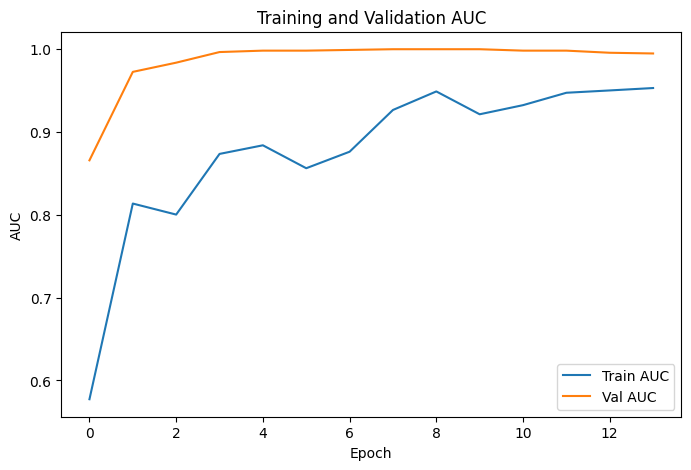

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.4072 - loss: 0.9682 - val_auc: 0.8073 - val_loss: 0.6398
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7296 - loss: 0.6267 - val_auc: 0.9332 - val_loss: 0.5856
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7999 - loss: 0.5251 - val_auc: 0.9557 - val_loss: 0.5228
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8891 - loss: 0.4163 - val_auc: 0.9783 - val_loss: 0.4575
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9146 - loss: 0.3272 - val_auc: 0.9931 - val_loss: 0.3997
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9129 - loss: 0.3104 - val_auc: 0.9939 - val_loss: 0.3458
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8790 - loss: 0.2834 - val_auc: 0.9939 - val_loss: 0.3007
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8745 - loss: 0.2792 - val_auc: 0.9948 - val_loss: 0.2627
Epoch 9/100
10/10 ━━━━━━━

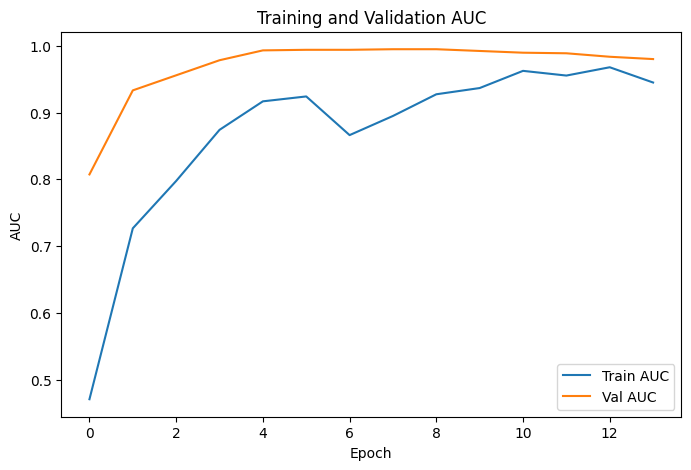

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Dataset_7: Accuracy=0.9377, Precision=1.0000, F1 Score=0.6386, Custom Score=0.8729
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 508us/step


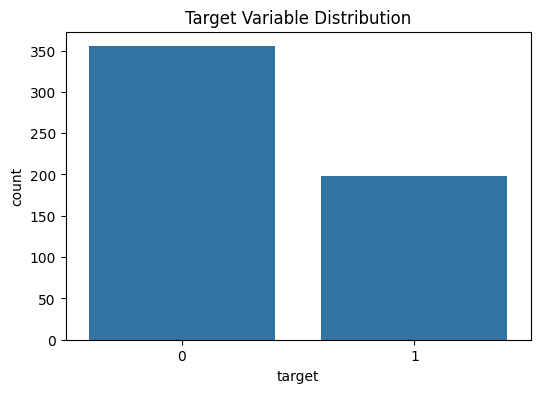

Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4900 - loss: 1.1679 - val_auc: 0.7446 - val_loss: 0.6617
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6240 - loss: 0.8834 - val_auc: 0.7783 - val_loss: 0.6098
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7512 - loss: 0.6313 - val_auc: 0.7873 - val_loss: 0.5757
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7265 - loss: 0.6488 - val_auc: 0.7888 - val_loss: 0.5608
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7532 - loss: 0.5978 - val_auc: 0.7887 - val_loss: 0.5550
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7562 - loss: 0.5966 - val_auc: 0.7927 - val_loss: 0.5467
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7609 - loss: 0.5637 - val_auc: 0.7953 - val_loss: 0.5381
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7720 - loss: 0.5383 - val_auc: 0.8007 - val_loss: 0.5326
Epoch 9/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7308

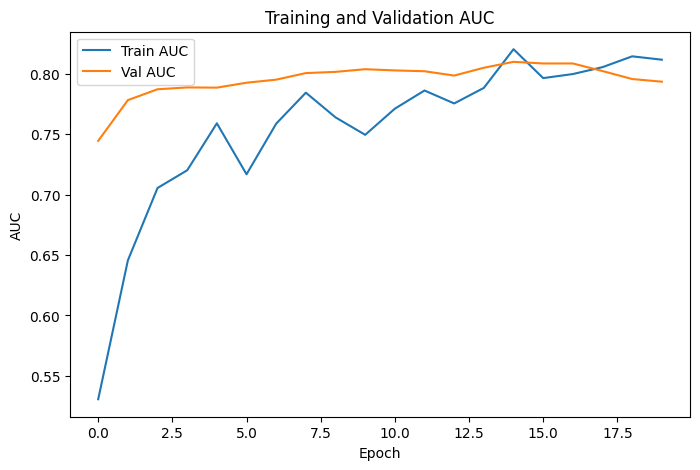

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4435 - loss: 0.8544 - val_auc: 0.7374 - val_loss: 0.6504
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6305 - loss: 0.6749 - val_auc: 0.7739 - val_loss: 0.6416
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7126 - loss: 0.5996 - val_auc: 0.7870 - val_loss: 0.6285
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6451 - loss: 0.6547 - val_auc: 0.7804 - val_loss: 0.6163
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7385 - loss: 0.5819 - val_auc: 0.7767 - val_loss: 0.6039
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8191 - loss: 0.4849 - val_auc: 0.7804 - val_loss: 0.5896
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7224 - loss: 0.6064 - val_auc: 0.7806 - val_loss: 0.5800
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7557 - loss: 0.5579 - val_auc: 0.7843 - val_loss: 0.5710


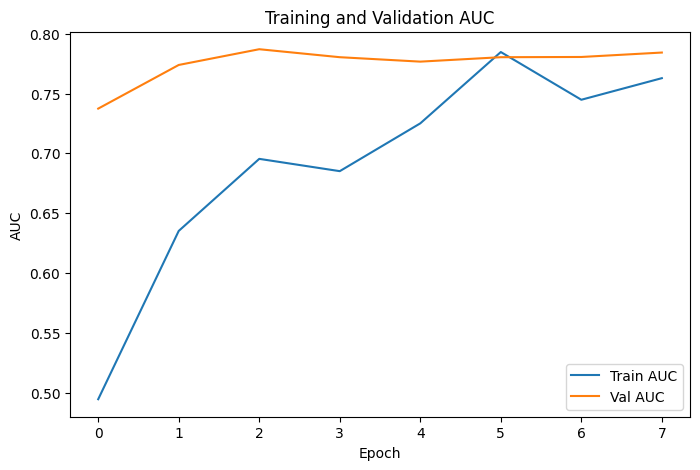

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4581 - loss: 0.8708 - val_auc: 0.6735 - val_loss: 0.6748
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6566 - loss: 0.6622 - val_auc: 0.7241 - val_loss: 0.6592
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6610 - loss: 0.6534 - val_auc: 0.7415 - val_loss: 0.6456
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7232 - loss: 0.5986 - val_auc: 0.7506 - val_loss: 0.6307
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7376 - loss: 0.6014 - val_auc: 0.7517 - val_loss: 0.6186
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7566 - loss: 0.5698 - val_auc: 0.7613 - val_loss: 0.6077
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7894 - loss: 0.5212 - val_auc: 0.7639 - val_loss: 0.5990
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7781 - loss: 0.5474 - val_auc: 0.7547 - val_loss: 0.5911
Epoch 9/100
14/14 ━━━━━━━━

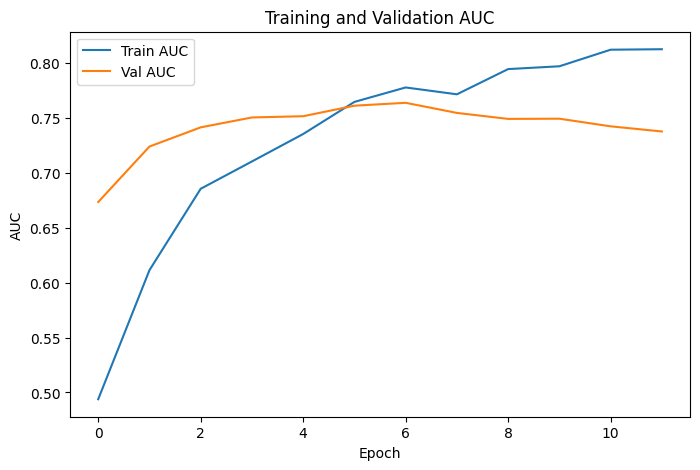

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5779 - loss: 0.7256 - val_auc: 0.7717 - val_loss: 0.6570
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6839 - loss: 0.6008 - val_auc: 0.7692 - val_loss: 0.6493
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6667 - loss: 0.6641 - val_auc: 0.7632 - val_loss: 0.6371
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7408 - loss: 0.5803 - val_auc: 0.7776 - val_loss: 0.6242
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7600 - loss: 0.5694 - val_auc: 0.7827 - val_loss: 0.6130
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7513 - loss: 0.5806 - val_auc: 0.7778 - val_loss: 0.6050
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7712 - loss: 0.5490 - val_auc: 0.7862 - val_loss: 0.5981
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7521 - loss: 0.5755 - val_auc: 0.7924 - val_loss: 0.5898
Epoch 9/100
14/14 ━━━━━━━

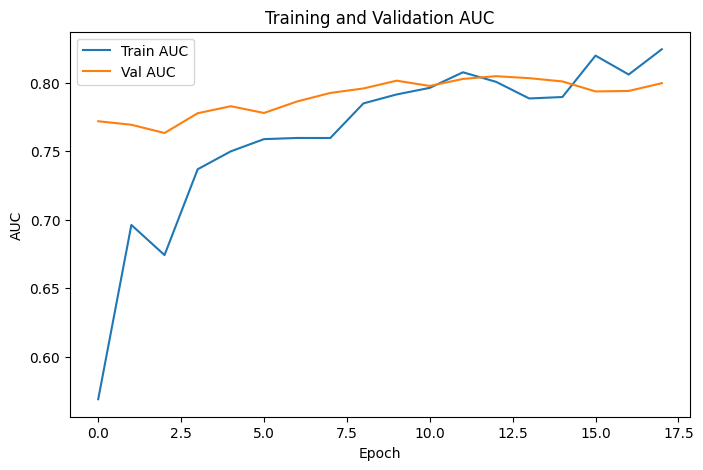

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4496 - loss: 0.8339 - val_auc: 0.6156 - val_loss: 0.6673
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5796 - loss: 0.7390 - val_auc: 0.6523 - val_loss: 0.6554
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7117 - loss: 0.6246 - val_auc: 0.6614 - val_loss: 0.6463
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7587 - loss: 0.5734 - val_auc: 0.6660 - val_loss: 0.6370
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7821 - loss: 0.5569 - val_auc: 0.6725 - val_loss: 0.6282
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7680 - loss: 0.5394 - val_auc: 0.6776 - val_loss: 0.6198
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7647 - loss: 0.5565 - val_auc: 0.6803 - val_loss: 0.6136
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7769 - loss: 0.5432 - val_auc: 0.6867 - val_loss: 0.6065
Epoch 9/100
14/14 ━━━━━━━━

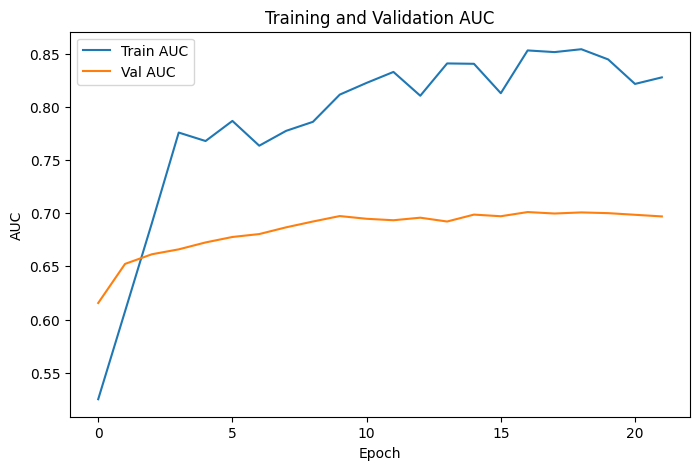

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Dataset_30: Accuracy=0.7558, Precision=0.7748, F1 Score=0.5728, Custom Score=0.7085
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step


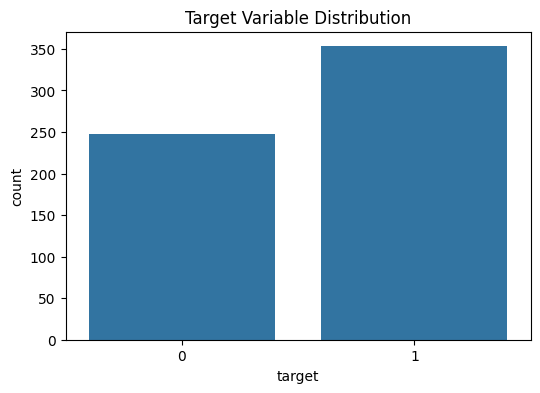

Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.6305 - loss: 0.7216 - val_auc: 0.9517 - val_loss: 0.6014
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8816 - loss: 0.4308 - val_auc: 0.9751 - val_loss: 0.5231
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9369 - loss: 0.3262 - val_auc: 0.9779 - val_loss: 0.4525
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9688 - loss: 0.2429 - val_auc: 0.9822 - val_loss: 0.3846
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9720 - loss: 0.2197 - val_auc: 0.9847 - val_loss: 0.3254
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9742 - loss: 0.2121 - val_auc: 0.9868 - val_loss: 0.2800
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9912 - loss: 0.1372 - val_auc: 0.9881 - val_loss: 0.2441
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9849 - loss: 0.1631 - val_auc: 0.9889 - val_loss: 0.2163
Epoch 9/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.984

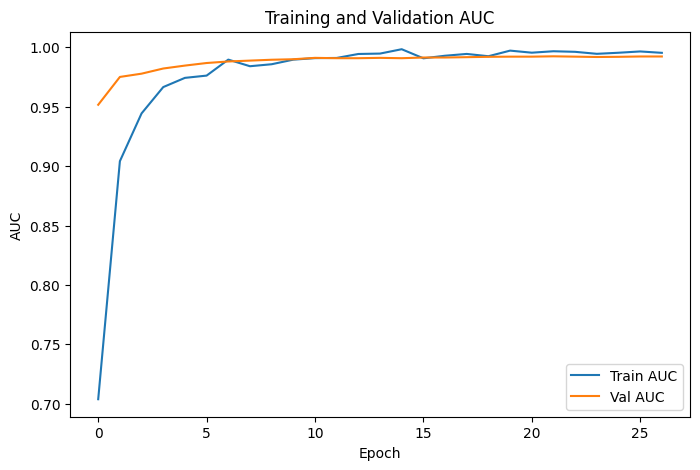

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.6262 - loss: 0.8532 - val_auc: 0.9360 - val_loss: 0.5973
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9001 - loss: 0.4483 - val_auc: 0.9836 - val_loss: 0.4932
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9628 - loss: 0.2813 - val_auc: 0.9907 - val_loss: 0.4178
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9600 - loss: 0.2615 - val_auc: 0.9931 - val_loss: 0.3626
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9804 - loss: 0.1927 - val_auc: 0.9947 - val_loss: 0.3158
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9764 - loss: 0.1861 - val_auc: 0.9948 - val_loss: 0.2830
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9859 - loss: 0.1586 - val_auc: 0.9964 - val_loss: 0.2577
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9939 - loss: 0.1147 - val_auc: 0.9965 - val_loss: 0.2342
Epoch 9/100
15/15 ━━━━━━━━

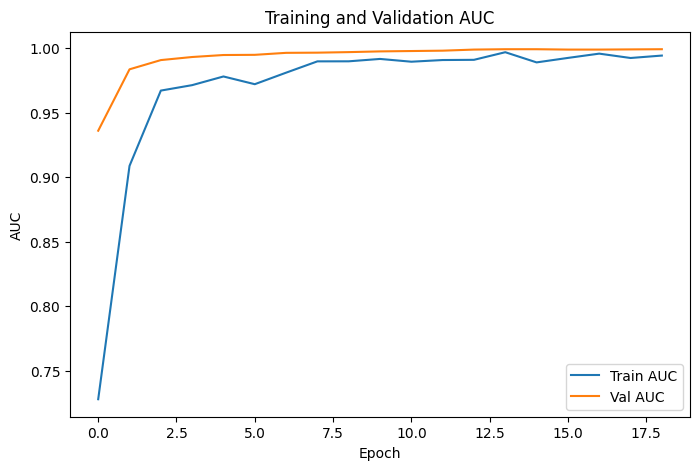

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.6667 - loss: 0.6745 - val_auc: 0.9704 - val_loss: 0.6006
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9161 - loss: 0.3793 - val_auc: 0.9846 - val_loss: 0.5041
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9597 - loss: 0.2818 - val_auc: 0.9891 - val_loss: 0.4206
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9695 - loss: 0.2394 - val_auc: 0.9914 - val_loss: 0.3433
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9637 - loss: 0.2422 - val_auc: 0.9939 - val_loss: 0.2801
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9840 - loss: 0.1742 - val_auc: 0.9956 - val_loss: 0.2291
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9830 - loss: 0.1774 - val_auc: 0.9962 - val_loss: 0.1952
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9875 - loss: 0.1552 - val_auc: 0.9959 - val_loss: 0.1669
Epoch 9/100
15/15 ━━━━━━━━

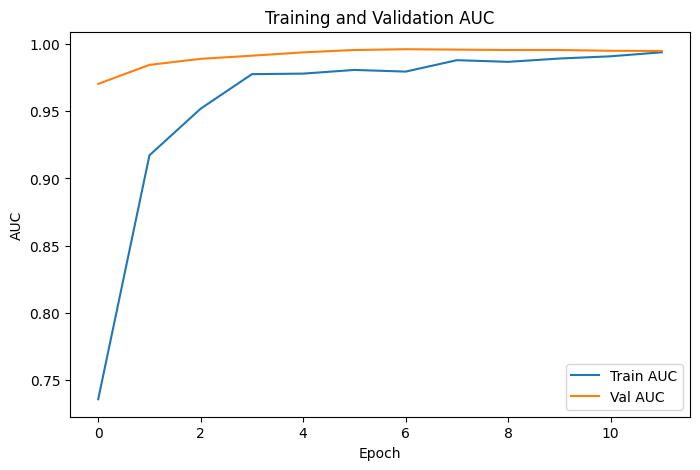

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6218 - loss: 0.7402 - val_auc: 0.9618 - val_loss: 0.5937
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9036 - loss: 0.4001 - val_auc: 0.9788 - val_loss: 0.4738
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9474 - loss: 0.2937 - val_auc: 0.9815 - val_loss: 0.3855
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9600 - loss: 0.2595 - val_auc: 0.9843 - val_loss: 0.3312
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9738 - loss: 0.2179 - val_auc: 0.9847 - val_loss: 0.2959
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9677 - loss: 0.2242 - val_auc: 0.9868 - val_loss: 0.2634
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9880 - loss: 0.1520 - val_auc: 0.9888 - val_loss: 0.2378
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9837 - loss: 0.1612 - val_auc: 0.9905 - val_loss: 0.2124
Epoch 9/100
15/15 ━━━━━━━

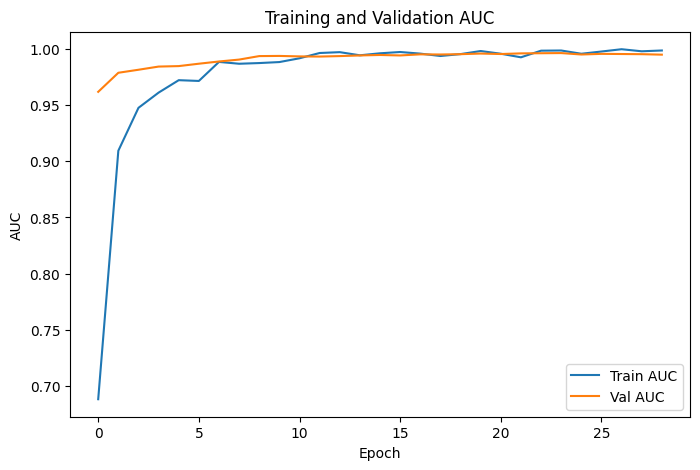

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.5872 - loss: 0.7028 - val_auc: 0.8882 - val_loss: 0.6328
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8804 - loss: 0.4604 - val_auc: 0.9799 - val_loss: 0.5463
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9384 - loss: 0.3547 - val_auc: 0.9862 - val_loss: 0.4566
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9703 - loss: 0.2544 - val_auc: 0.9888 - val_loss: 0.3693
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9866 - loss: 0.1898 - val_auc: 0.9909 - val_loss: 0.3003
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9748 - loss: 0.2078 - val_auc: 0.9919 - val_loss: 0.2482
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9842 - loss: 0.1764 - val_auc: 0.9938 - val_loss: 0.2070
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9817 - loss: 0.1841 - val_auc: 0.9946 - val_loss: 0.1782
Epoch 9/100
15/15 ━━━━━━━━

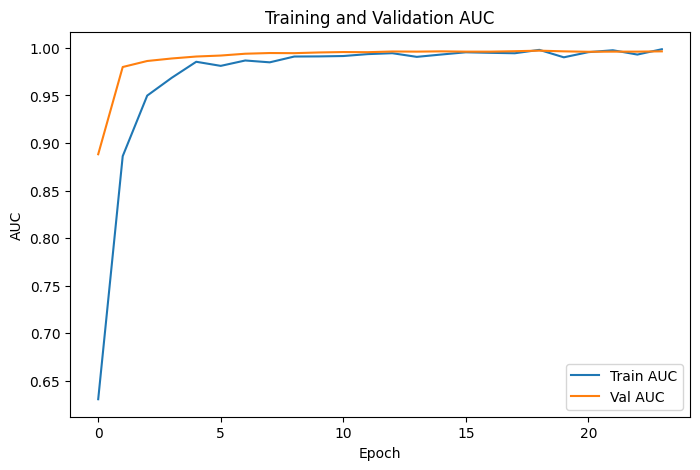

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Dataset_39: Accuracy=0.9617, Precision=0.9557, F1 Score=0.9677, Custom Score=0.9611
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step


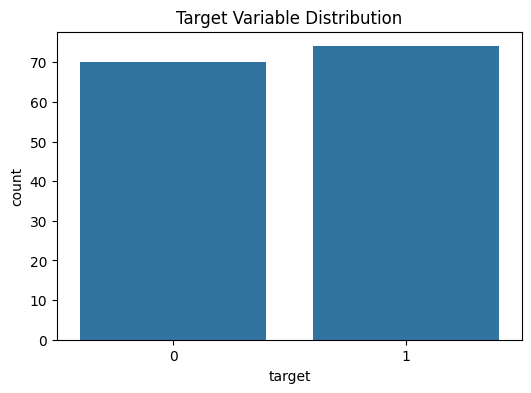

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - auc: 0.5901 - loss: 0.7608 - val_auc: 0.7740 - val_loss: 0.6332
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6679 - loss: 0.7185 - val_auc: 0.8510 - val_loss: 0.5971
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7058 - loss: 0.6112 - val_auc: 0.8774 - val_loss: 0.5700
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8345 - loss: 0.4933 - val_auc: 0.8846 - val_loss: 0.5488
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8176 - loss: 0.5344 - val_auc: 0.8750 - val_loss: 0.5325
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8246 - loss: 0.5274 - val_auc: 0.8750 - val_loss: 0.5215
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8201 - loss: 0.5392 - val_auc: 0.8678 - val_loss: 0.5142
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8980 - loss: 0.4078 - val_auc: 0.8654 - val_loss: 0.5059
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7969 - loss: 0.5268 -

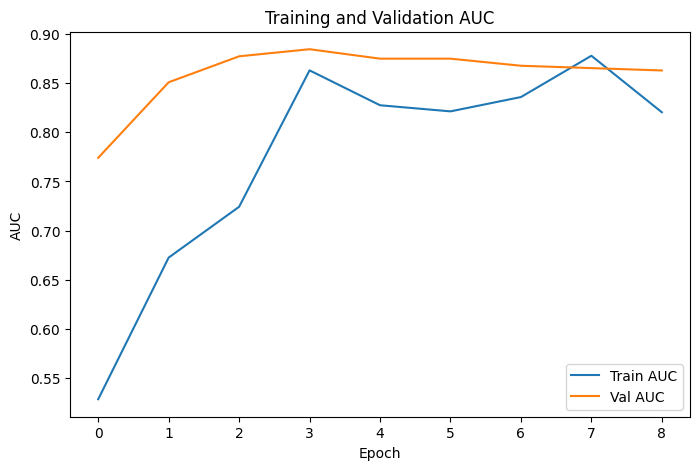

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.6049 - loss: 0.8143 - val_auc: 0.5841 - val_loss: 0.6912
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6652 - loss: 0.7117 - val_auc: 0.8101 - val_loss: 0.6315
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8060 - loss: 0.5296 - val_auc: 0.8365 - val_loss: 0.5825
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8251 - loss: 0.5198 - val_auc: 0.8558 - val_loss: 0.5494
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7647 - loss: 0.6269 - val_auc: 0.8582 - val_loss: 0.5245
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8114 - loss: 0.5296 - val_auc: 0.8558 - val_loss: 0.5052
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8449 - loss: 0.5317 - val_auc: 0.8606 - val_loss: 0.4910
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8778 - loss: 0.4428 - val_auc: 0.8702 - val_loss: 0.4824
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

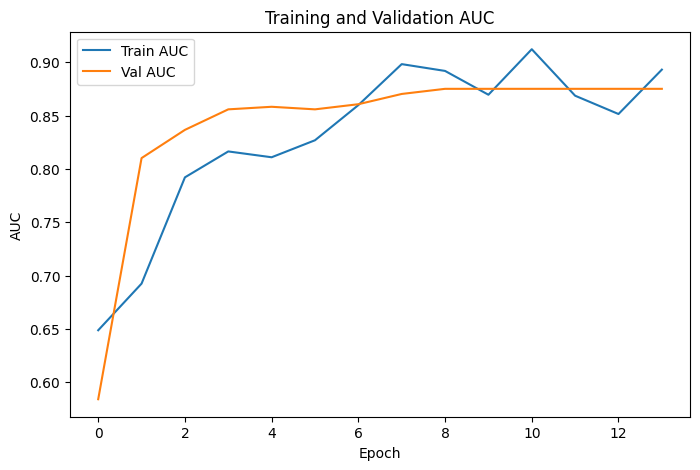

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - auc: 0.5643 - loss: 1.1645 - val_auc: 0.7020 - val_loss: 0.7344
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5393 - loss: 1.0325 - val_auc: 0.8131 - val_loss: 0.6710
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7821 - loss: 0.8044 - val_auc: 0.8914 - val_loss: 0.6157
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7292 - loss: 0.7672 - val_auc: 0.9192 - val_loss: 0.5758
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8407 - loss: 0.5653 - val_auc: 0.9242 - val_loss: 0.5456
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8295 - loss: 0.5596 - val_auc: 0.9217 - val_loss: 0.5249
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8644 - loss: 0.5651 - val_auc: 0.9141 - val_loss: 0.5077
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8086 - loss: 0.5806 - val_auc: 0.9091 - val_loss: 0.4958
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6

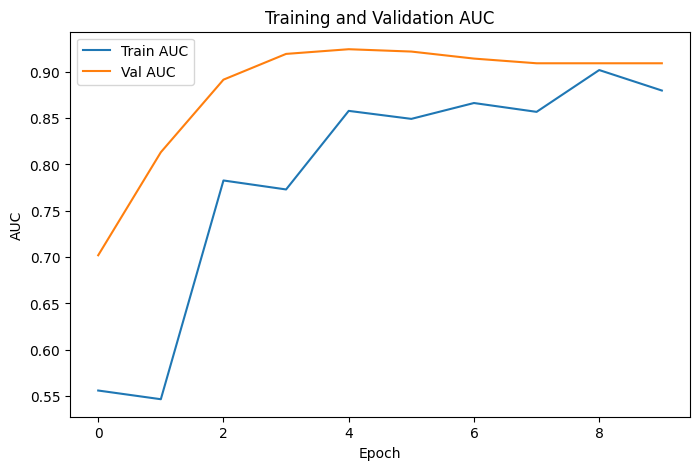

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - auc: 0.5455 - loss: 0.9274 - val_auc: 0.7763 - val_loss: 0.6082
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6992 - loss: 0.6736 - val_auc: 0.7816 - val_loss: 0.5887
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.6465 - loss: 0.7583 - val_auc: 0.7868 - val_loss: 0.5769
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8105 - loss: 0.6268 - val_auc: 0.7895 - val_loss: 0.5649
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8805 - loss: 0.4648 - val_auc: 0.7921 - val_loss: 0.5559
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9070 - loss: 0.3981 - val_auc: 0.8000 - val_loss: 0.5511
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8690 - loss: 0.4536 - val_auc: 0.8053 - val_loss: 0.5492
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.9108 - loss: 0.3894 - val_auc: 0.8026 - val_loss: 0.5481
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

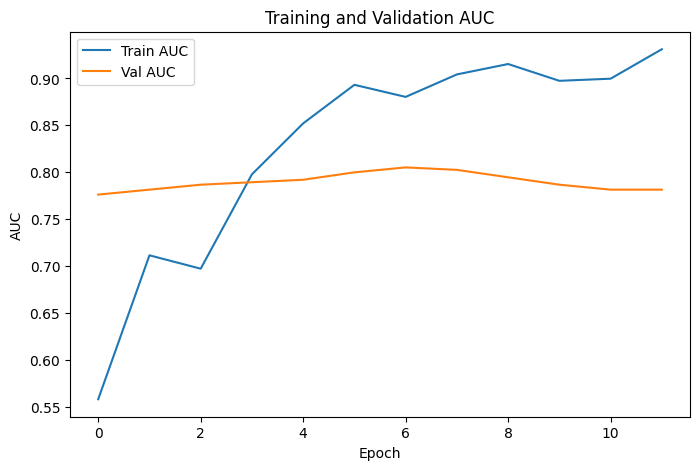

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - auc: 0.4550 - loss: 0.8937 - val_auc: 0.6417 - val_loss: 0.6609
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6196 - loss: 0.7032 - val_auc: 0.8262 - val_loss: 0.6125
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6412 - loss: 0.7090 - val_auc: 0.8289 - val_loss: 0.5706
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8572 - loss: 0.4781 - val_auc: 0.8583 - val_loss: 0.5434
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8311 - loss: 0.5165 - val_auc: 0.8877 - val_loss: 0.5228
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8021 - loss: 0.5523 - val_auc: 0.9037 - val_loss: 0.5037
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8576 - loss: 0.4987 - val_auc: 0.9064 - val_loss: 0.4917
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8295 - loss: 0.5052 - val_auc: 0.9144 - val_loss: 0.4822
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

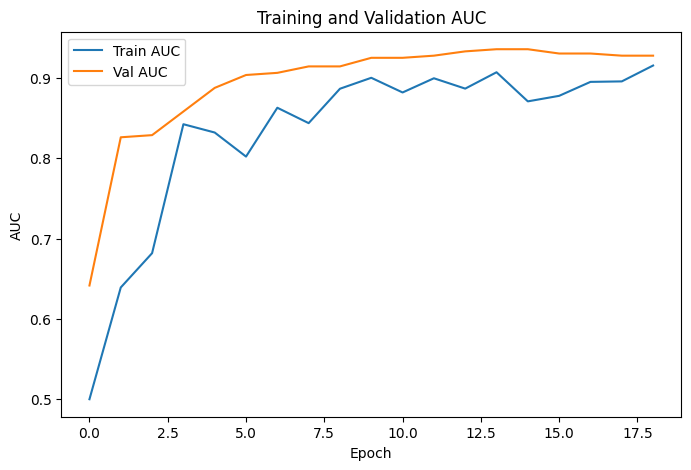

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Dataset_9: Accuracy=0.8128, Precision=0.8062, F1 Score=0.8201, Custom Score=0.8123
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step


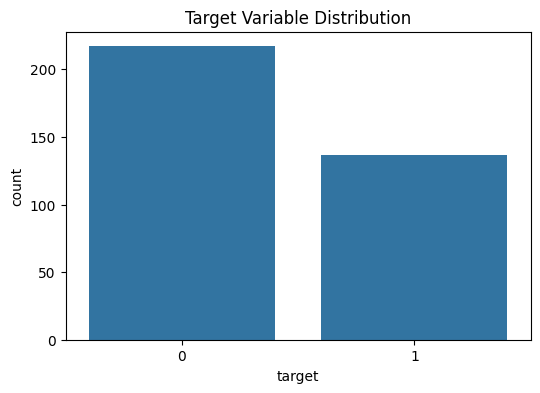

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5394 - loss: 1.3800 - val_auc: 0.8564 - val_loss: 0.6953
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6533 - loss: 1.2379 - val_auc: 0.8812 - val_loss: 0.6678
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6857 - loss: 0.9562 - val_auc: 0.8732 - val_loss: 0.6415
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7205 - loss: 0.8791 - val_auc: 0.8843 - val_loss: 0.6110
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8388 - loss: 0.6426 - val_auc: 0.8914 - val_loss: 0.5796
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8550 - loss: 0.5948 - val_auc: 0.8967 - val_loss: 0.5472
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8630 - loss: 0.5368 - val_auc: 0.8998 - val_loss: 0.5192
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9038 - loss: 0.4491 - val_auc: 0.9007 - val_loss: 0.4915
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8902 - loss: 0.4315 -

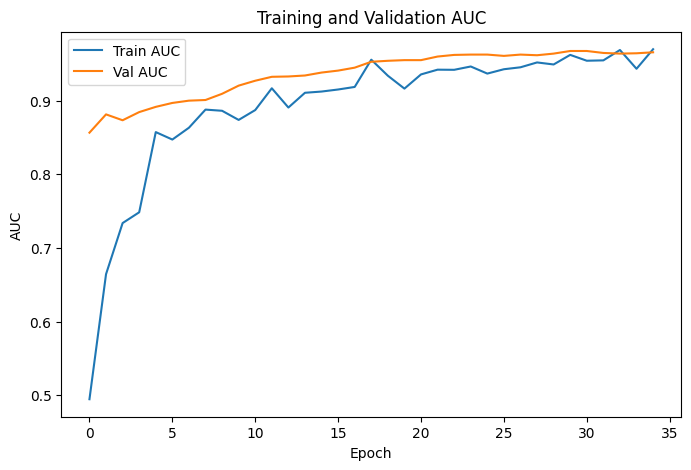

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - auc: 0.3155 - loss: 0.9876 - val_auc: 0.4676 - val_loss: 0.6990
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6000 - loss: 0.7103 - val_auc: 0.6938 - val_loss: 0.6827
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7061 - loss: 0.6219 - val_auc: 0.7525 - val_loss: 0.6661
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7874 - loss: 0.5491 - val_auc: 0.7935 - val_loss: 0.6481
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7747 - loss: 0.5650 - val_auc: 0.8132 - val_loss: 0.6309
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8295 - loss: 0.5191 - val_auc: 0.8399 - val_loss: 0.6151
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8792 - loss: 0.4174 - val_auc: 0.8604 - val_loss: 0.5972
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8710 - loss: 0.4553 - val_auc: 0.8690 - val_loss: 0.5787
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

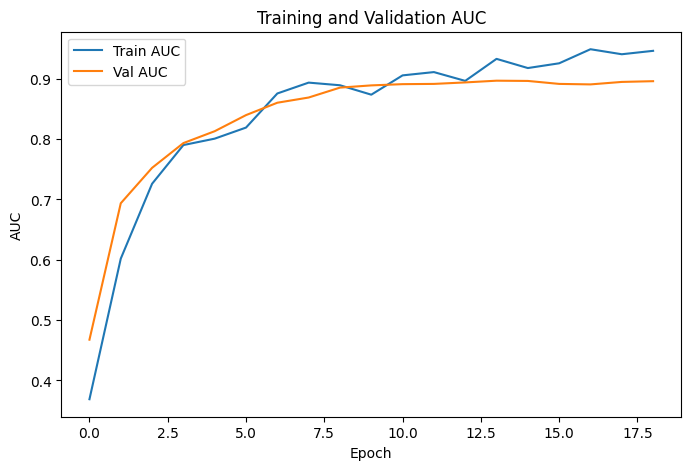

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - auc: 0.4913 - loss: 0.9592 - val_auc: 0.8628 - val_loss: 0.6831
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6737 - loss: 0.6997 - val_auc: 0.8910 - val_loss: 0.6372
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7658 - loss: 0.5967 - val_auc: 0.8981 - val_loss: 0.5978
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8262 - loss: 0.5242 - val_auc: 0.8902 - val_loss: 0.5652
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8443 - loss: 0.4825 - val_auc: 0.8876 - val_loss: 0.5366
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8423 - loss: 0.4906 - val_auc: 0.8927 - val_loss: 0.5140
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8525 - loss: 0.4548 - val_auc: 0.8969 - val_loss: 0.4932
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9059 - loss: 0.3741 - val_auc: 0.9036 - val_loss: 0.4759
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

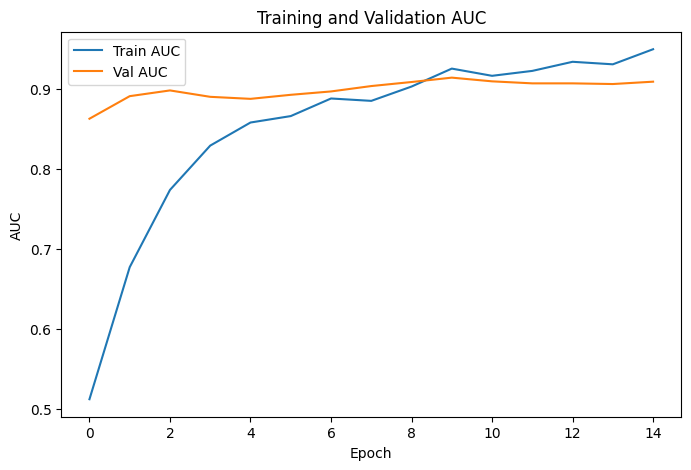

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.6502 - loss: 0.6956 - val_auc: 0.7944 - val_loss: 0.6477
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7883 - loss: 0.5532 - val_auc: 0.8684 - val_loss: 0.6253
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8206 - loss: 0.5062 - val_auc: 0.9004 - val_loss: 0.5954
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8467 - loss: 0.4752 - val_auc: 0.9197 - val_loss: 0.5722
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8327 - loss: 0.4907 - val_auc: 0.9231 - val_loss: 0.5502
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8536 - loss: 0.4593 - val_auc: 0.9286 - val_loss: 0.5300
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8609 - loss: 0.4760 - val_auc: 0.9321 - val_loss: 0.5138
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8755 - loss: 0.4248 - val_auc: 0.9359 - val_loss: 0.4949
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

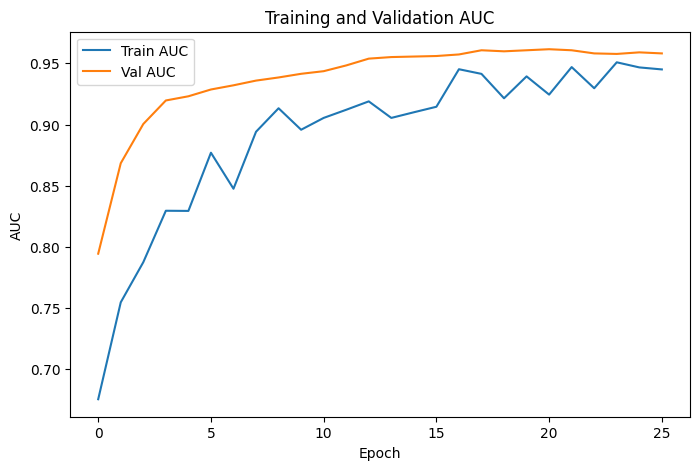

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5874 - loss: 0.7863 - val_auc: 0.7117 - val_loss: 0.6857
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6767 - loss: 0.6513 - val_auc: 0.8081 - val_loss: 0.6548
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7884 - loss: 0.5376 - val_auc: 0.8362 - val_loss: 0.6277
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8285 - loss: 0.5080 - val_auc: 0.8503 - val_loss: 0.6030
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8115 - loss: 0.5207 - val_auc: 0.8677 - val_loss: 0.5804
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8858 - loss: 0.4020 - val_auc: 0.8718 - val_loss: 0.5624
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8742 - loss: 0.4242 - val_auc: 0.8797 - val_loss: 0.5482
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8796 - loss: 0.4202 - val_auc: 0.8846 - val_loss: 0.5384
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3

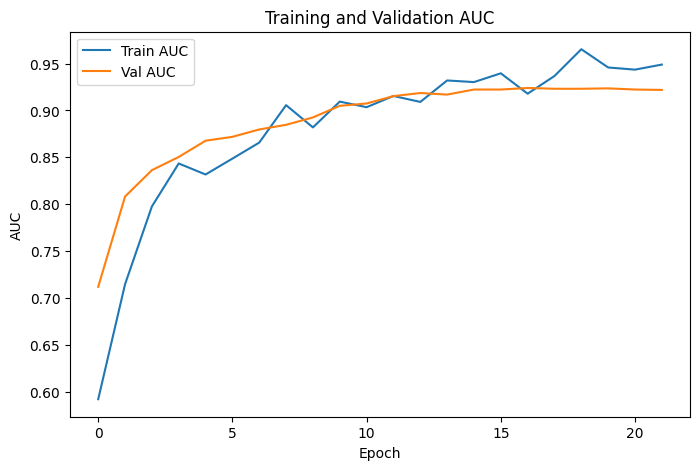

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Dataset_23: Accuracy=0.8331, Precision=0.9025, F1 Score=0.7557, Custom Score=0.8376
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step


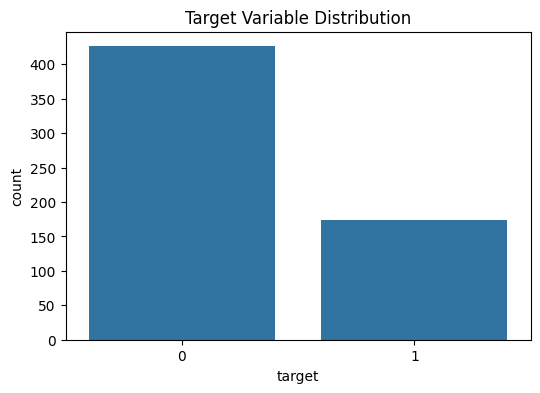

Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.4434 - loss: 0.9317 - val_auc: 0.5853 - val_loss: 0.6504
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5647 - loss: 0.7556 - val_auc: 0.5730 - val_loss: 0.6333
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5997 - loss: 0.6913 - val_auc: 0.5828 - val_loss: 0.6204
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6245 - loss: 0.6632 - val_auc: 0.5763 - val_loss: 0.6126
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6388 - loss: 0.6087 - val_auc: 0.5874 - val_loss: 0.6058
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6521 - loss: 0.5970 - val_auc: 0.5862 - val_loss: 0.6016
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6321 - loss: 0.6363 - val_auc: 0.5901 - val_loss: 0.5997
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6793 - loss: 0.5903 - val_auc: 0.5952 - val_loss: 0.5957
Epoch 9/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6371

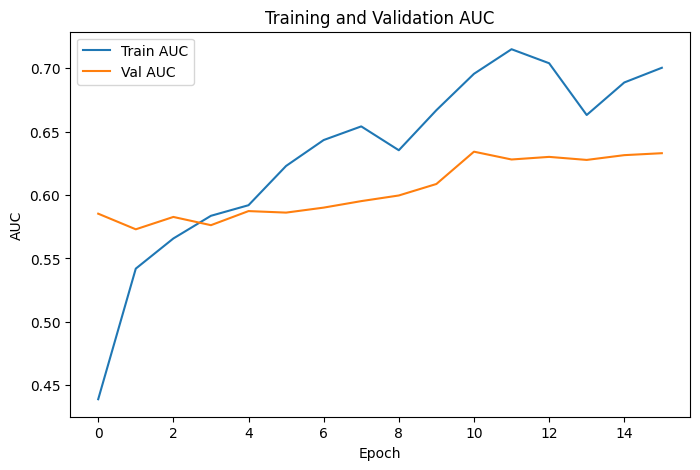

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5773 - loss: 0.7188 - val_auc: 0.6254 - val_loss: 0.6469
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5546 - loss: 0.6878 - val_auc: 0.7077 - val_loss: 0.6244
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5913 - loss: 0.6271 - val_auc: 0.7195 - val_loss: 0.6083
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6284 - loss: 0.6113 - val_auc: 0.7287 - val_loss: 0.5959
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6295 - loss: 0.6182 - val_auc: 0.7218 - val_loss: 0.5945
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5951 - loss: 0.6528 - val_auc: 0.7177 - val_loss: 0.5930
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6463 - loss: 0.5741 - val_auc: 0.7069 - val_loss: 0.5911
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6234 - loss: 0.6251 - val_auc: 0.7054 - val_loss: 0.5937
Epoch 9/100
15/15 ━━━━━━━━

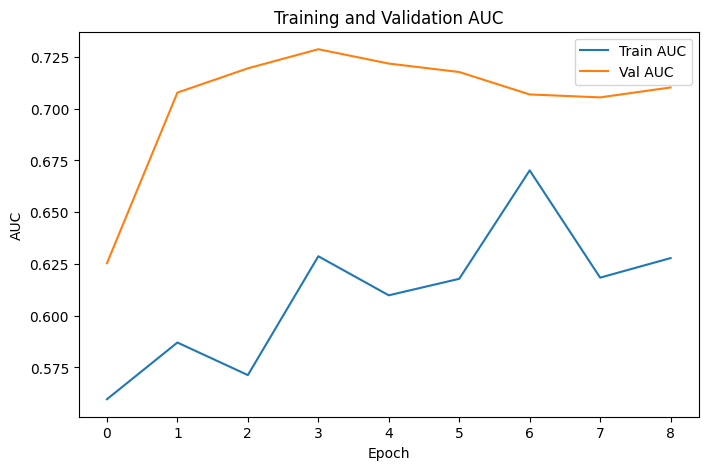

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.5095 - loss: 1.3058 - val_auc: 0.5976 - val_loss: 0.6872
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5743 - loss: 0.9746 - val_auc: 0.6691 - val_loss: 0.6635
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6305 - loss: 0.7897 - val_auc: 0.6976 - val_loss: 0.6426
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6433 - loss: 0.7085 - val_auc: 0.7054 - val_loss: 0.6240
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5795 - loss: 0.7075 - val_auc: 0.7121 - val_loss: 0.6066
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5940 - loss: 0.6585 - val_auc: 0.7235 - val_loss: 0.5918
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6349 - loss: 0.6176 - val_auc: 0.7280 - val_loss: 0.5801
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5725 - loss: 0.6613 - val_auc: 0.7315 - val_loss: 0.5724
Epoch 9/100
15/15 ━━━━━━━━

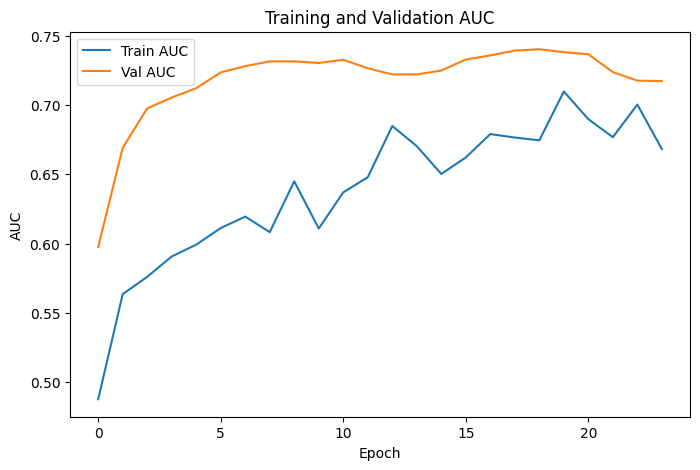

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5309 - loss: 0.8198 - val_auc: 0.4066 - val_loss: 0.6913
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5538 - loss: 0.7646 - val_auc: 0.4574 - val_loss: 0.6832
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6302 - loss: 0.6627 - val_auc: 0.4837 - val_loss: 0.6774
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5978 - loss: 0.6373 - val_auc: 0.4999 - val_loss: 0.6770
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7029 - loss: 0.5747 - val_auc: 0.5126 - val_loss: 0.6734
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6020 - loss: 0.6391 - val_auc: 0.5225 - val_loss: 0.6717
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6913 - loss: 0.5472 - val_auc: 0.5291 - val_loss: 0.6721
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6584 - loss: 0.5881 - val_auc: 0.5229 - val_loss: 0.6748
Epoch 9/100
15/15 ━━━━━━━

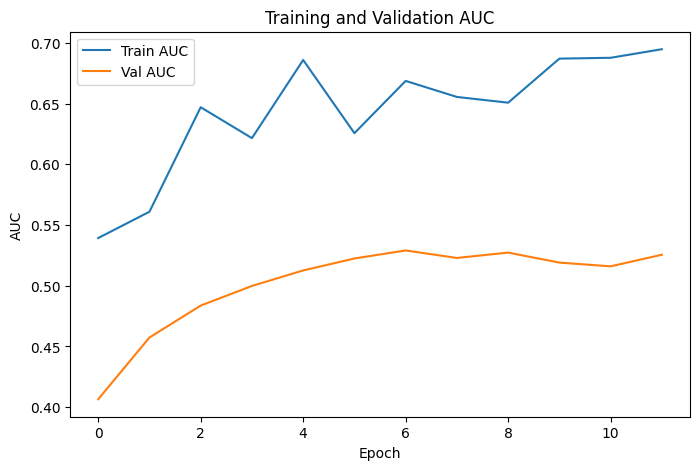

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.4287 - loss: 0.9257 - val_auc: 0.7052 - val_loss: 0.6126
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5607 - loss: 0.7092 - val_auc: 0.6657 - val_loss: 0.6025
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6153 - loss: 0.6637 - val_auc: 0.6420 - val_loss: 0.5939
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6111 - loss: 0.6431 - val_auc: 0.6156 - val_loss: 0.5802
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6478 - loss: 0.6221 - val_auc: 0.5953 - val_loss: 0.5700
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6328 - loss: 0.6455 - val_auc: 0.5753 - val_loss: 0.5598


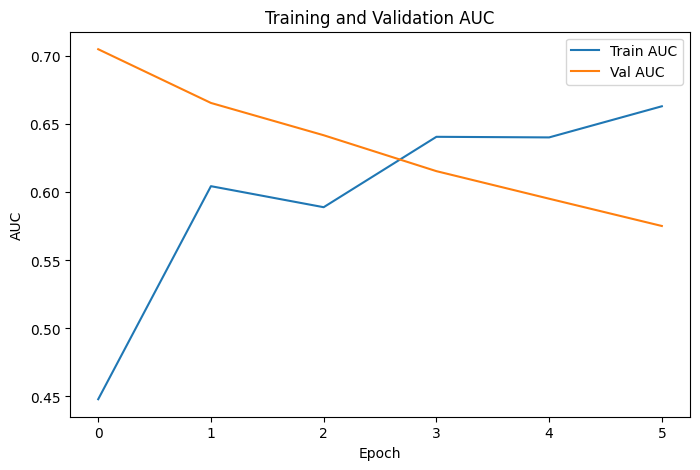

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Dataset_24: Accuracy=0.7133, Precision=0.3000, F1 Score=0.1199, Custom Score=0.3700
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step


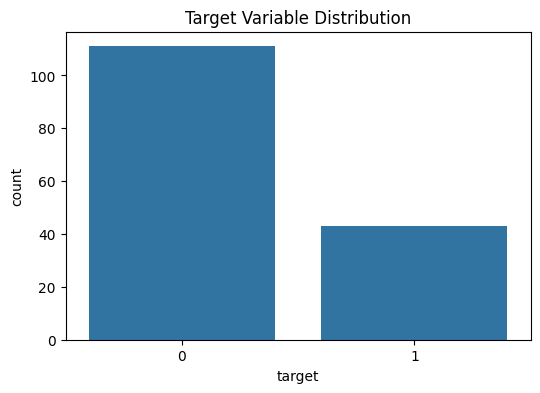

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.5073 - loss: 0.9238 - val_auc: 0.7762 - val_loss: 0.6801
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5029 - loss: 0.8405 - val_auc: 0.7357 - val_loss: 0.6754
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6464 - loss: 0.6980 - val_auc: 0.7619 - val_loss: 0.6692
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6746 - loss: 0.7088 - val_auc: 0.7762 - val_loss: 0.6650
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6434 - loss: 0.6733 - val_auc: 0.7810 - val_loss: 0.6608
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6239 - loss: 0.7014 - val_auc: 0.7690 - val_loss: 0.6581
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7115 - loss: 0.5786 - val_auc: 0.7619 - val_loss: 0.6555
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7365 - loss: 0.5728 - val_auc: 0.7357 - val_loss: 0.6532
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7507 - loss: 0.5353 -

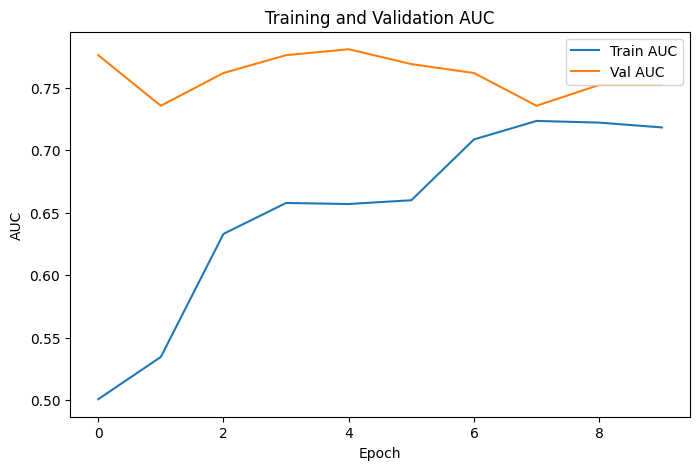

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - auc: 0.4860 - loss: 1.0247 - val_auc: 0.4185 - val_loss: 0.6973
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5698 - loss: 0.8259 - val_auc: 0.4511 - val_loss: 0.6884
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6211 - loss: 0.7868 - val_auc: 0.5543 - val_loss: 0.6802
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7397 - loss: 0.6956 - val_auc: 0.6005 - val_loss: 0.6713
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.4853 - loss: 0.8602 - val_auc: 0.5924 - val_loss: 0.6662
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6852 - loss: 0.6708 - val_auc: 0.5897 - val_loss: 0.6620
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7693 - loss: 0.5794 - val_auc: 0.5951 - val_loss: 0.6574
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7735 - loss: 0.5280 - val_auc: 0.5897 - val_loss: 0.6529
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6

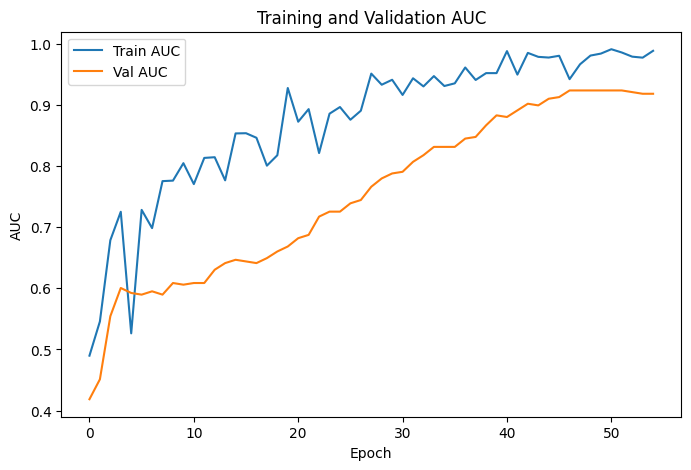

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - auc: 0.4451 - loss: 0.7417 - val_auc: 0.7955 - val_loss: 0.6565
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6881 - loss: 0.5685 - val_auc: 0.8460 - val_loss: 0.6393
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6335 - loss: 0.6119 - val_auc: 0.8561 - val_loss: 0.6257
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6137 - loss: 0.6432 - val_auc: 0.8662 - val_loss: 0.6134
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6994 - loss: 0.5563 - val_auc: 0.8813 - val_loss: 0.6035
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - auc: 0.5733 - loss: 0.6940 - val_auc: 0.8813 - val_loss: 0.5972
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6752 - loss: 0.5729 - val_auc: 0.8838 - val_loss: 0.5937
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7172 - loss: 0.5522 - val_auc: 0.8763 - val_loss: 0.5910
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 

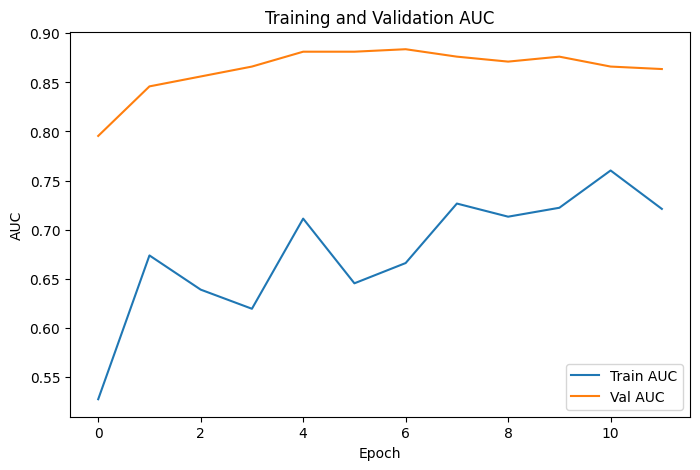

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - auc: 0.4528 - loss: 0.9893 - val_auc: 0.6386 - val_loss: 0.6687
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5827 - loss: 0.7627 - val_auc: 0.7418 - val_loss: 0.6570
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6850 - loss: 0.6694 - val_auc: 0.7636 - val_loss: 0.6472
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6332 - loss: 0.7111 - val_auc: 0.7853 - val_loss: 0.6386
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6036 - loss: 0.7241 - val_auc: 0.7935 - val_loss: 0.6297
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - auc: 0.6593 - loss: 0.6392 - val_auc: 0.7989 - val_loss: 0.6217
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - auc: 0.6901 - loss: 0.5757 - val_auc: 0.8043 - val_loss: 0.6148
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6534 - loss: 0.6373 - val_auc: 0.8207 - val_loss: 0.6085
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s

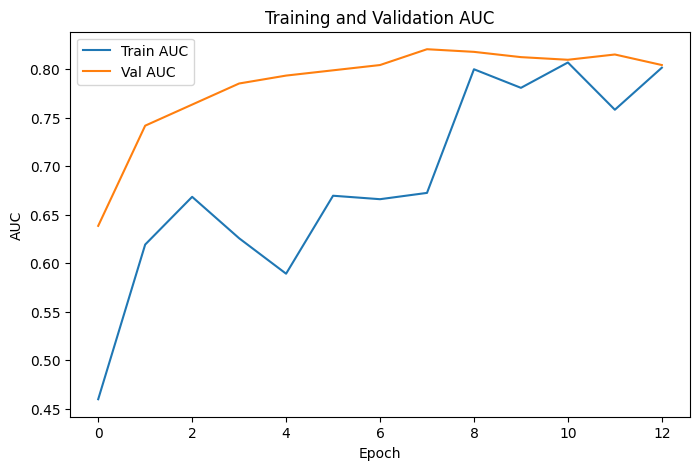

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.5329 - loss: 1.2423 - val_auc: 0.4091 - val_loss: 0.6892
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.4873 - loss: 1.1272 - val_auc: 0.4830 - val_loss: 0.6719
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.4889 - loss: 1.0302 - val_auc: 0.5625 - val_loss: 0.6589
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6300 - loss: 0.8786 - val_auc: 0.6562 - val_loss: 0.6482
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6335 - loss: 0.8498 - val_auc: 0.6903 - val_loss: 0.6382
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6363 - loss: 0.8080 - val_auc: 0.7017 - val_loss: 0.6289
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6617 - loss: 0.7399 - val_auc: 0.7273 - val_loss: 0.6201
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7117 - loss: 0.6476 - val_auc: 0.7443 - val_loss: 0.6131
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6

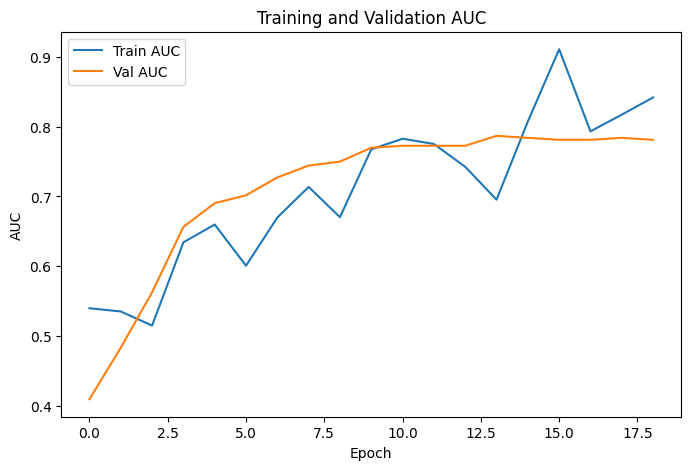

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Dataset_12: Accuracy=0.7402, Precision=0.4410, F1 Score=0.2393, Custom Score=0.4703
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 696us/step


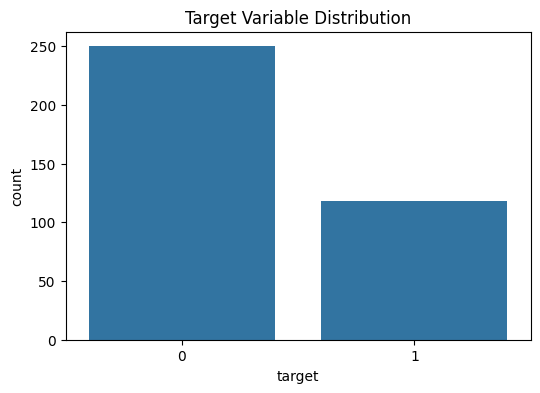

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.4620 - loss: 0.8922 - val_auc: 0.5121 - val_loss: 0.6801
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6080 - loss: 0.7431 - val_auc: 0.6450 - val_loss: 0.6614
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6388 - loss: 0.6560 - val_auc: 0.6438 - val_loss: 0.6470
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6352 - loss: 0.6550 - val_auc: 0.6513 - val_loss: 0.6325
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6816 - loss: 0.5993 - val_auc: 0.6629 - val_loss: 0.6217
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6591 - loss: 0.6502 - val_auc: 0.6542 - val_loss: 0.6144
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7705 - loss: 0.5234 - val_auc: 0.6650 - val_loss: 0.6062
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8015 - loss: 0.5064 - val_auc: 0.6650 - val_loss: 0.6012
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.789

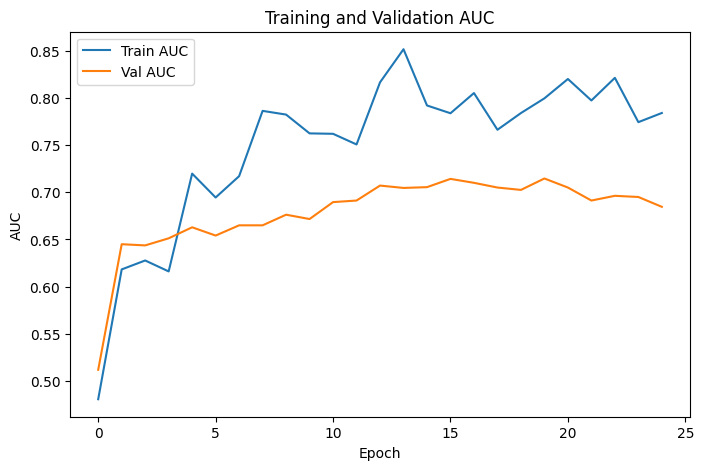

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - auc: 0.5480 - loss: 0.7309 - val_auc: 0.6078 - val_loss: 0.6877
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6111 - loss: 0.6772 - val_auc: 0.6644 - val_loss: 0.6652
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6411 - loss: 0.6327 - val_auc: 0.6909 - val_loss: 0.6374
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6741 - loss: 0.6170 - val_auc: 0.6923 - val_loss: 0.6207
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7079 - loss: 0.6104 - val_auc: 0.6797 - val_loss: 0.6034
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7466 - loss: 0.5437 - val_auc: 0.6815 - val_loss: 0.5886
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7385 - loss: 0.5670 - val_auc: 0.6936 - val_loss: 0.5761
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7879 - loss: 0.5165 - val_auc: 0.7008 - val_loss: 0.5675
Epoch 9/100
10/10 ━━━━━━━

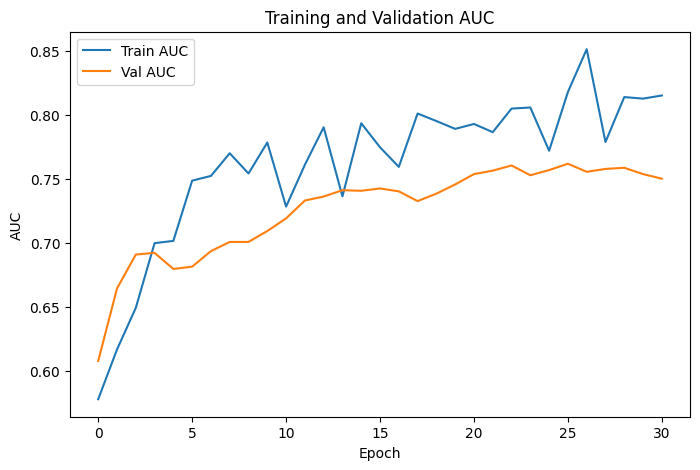

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - auc: 0.5609 - loss: 0.7380 - val_auc: 0.5542 - val_loss: 0.6805
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.5694 - loss: 0.7330 - val_auc: 0.6206 - val_loss: 0.6785
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6537 - loss: 0.6605 - val_auc: 0.6674 - val_loss: 0.6695
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6674 - loss: 0.6265 - val_auc: 0.6949 - val_loss: 0.6468
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7143 - loss: 0.5721 - val_auc: 0.7107 - val_loss: 0.6279
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7071 - loss: 0.6116 - val_auc: 0.7006 - val_loss: 0.6156
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7267 - loss: 0.5732 - val_auc: 0.6897 - val_loss: 0.6037
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7460 - loss: 0.5411 - val_auc: 0.6967 - val_loss: 0.5908
Epoch 9/100
10/10 ━━━━━━━

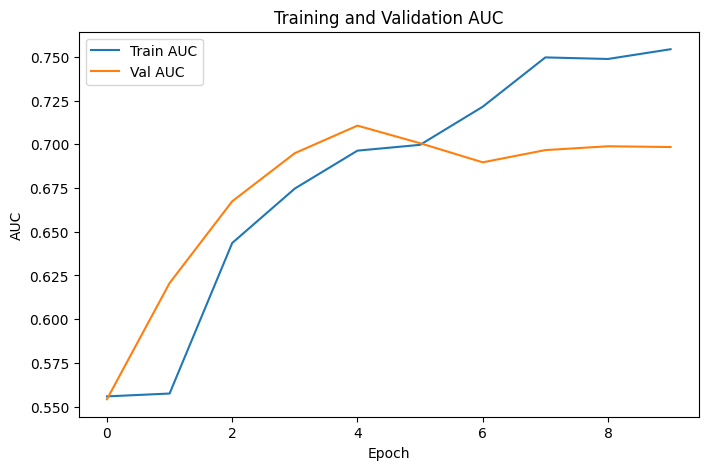

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.4693 - loss: 0.8352 - val_auc: 0.3817 - val_loss: 0.6953
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.4953 - loss: 0.7600 - val_auc: 0.4991 - val_loss: 0.6946
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5164 - loss: 0.7393 - val_auc: 0.6257 - val_loss: 0.6817
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6697 - loss: 0.6053 - val_auc: 0.6448 - val_loss: 0.6670
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6549 - loss: 0.5960 - val_auc: 0.6796 - val_loss: 0.6522
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7154 - loss: 0.5688 - val_auc: 0.6965 - val_loss: 0.6417
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7183 - loss: 0.5757 - val_auc: 0.7026 - val_loss: 0.6315
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6701 - loss: 0.6317 - val_auc: 0.6991 - val_loss: 0.6276
Epoch 9/100
10/10 ━━━━━━━

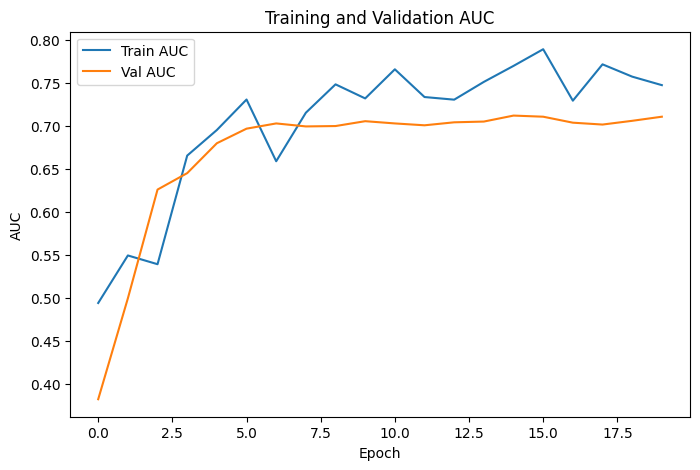

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.4987 - loss: 0.8893 - val_auc: 0.5690 - val_loss: 0.6822
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5581 - loss: 0.7995 - val_auc: 0.6115 - val_loss: 0.6736
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.5912 - loss: 0.7236 - val_auc: 0.6373 - val_loss: 0.6658
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6218 - loss: 0.6511 - val_auc: 0.6718 - val_loss: 0.6576
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7030 - loss: 0.5876 - val_auc: 0.7020 - val_loss: 0.6486
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6980 - loss: 0.6047 - val_auc: 0.7167 - val_loss: 0.6449
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7301 - loss: 0.5469 - val_auc: 0.7321 - val_loss: 0.6411
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6819 - loss: 0.6297 - val_auc: 0.7302 - val_loss: 0.6390
Epoch 9/100
10/10 ━━━━━━━

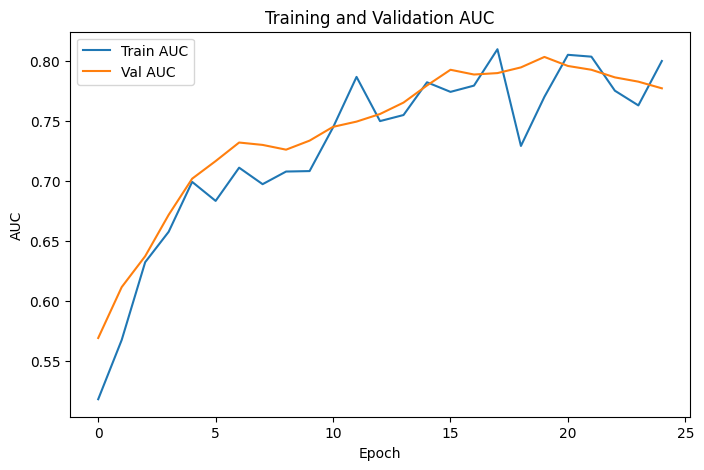

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Dataset_15: Accuracy=0.7199, Precision=0.7310, F1 Score=0.3441, Custom Score=0.6116
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


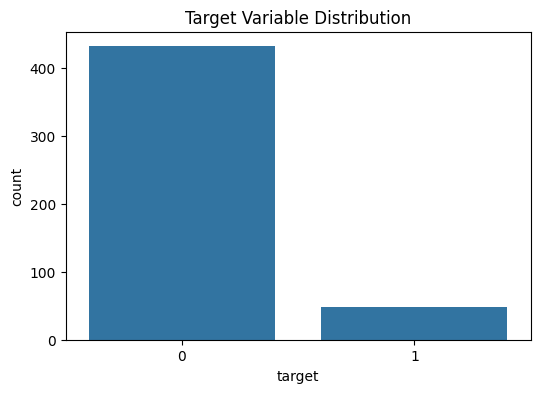

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.4168 - loss: 0.7834 - val_auc: 0.8693 - val_loss: 0.6344
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8005 - loss: 0.5361 - val_auc: 0.9171 - val_loss: 0.5646
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7767 - loss: 0.3646 - val_auc: 0.9430 - val_loss: 0.5122
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7795 - loss: 0.3445 - val_auc: 0.9643 - val_loss: 0.4565
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8607 - loss: 0.2962 - val_auc: 0.9722 - val_loss: 0.4071
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7777 - loss: 0.3263 - val_auc: 0.9643 - val_loss: 0.3685
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8709 - loss: 0.2570 - val_auc: 0.9592 - val_loss: 0.3355
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8372 - loss: 0.2455 - val_auc: 0.9634 - val_loss: 0.3076
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.901

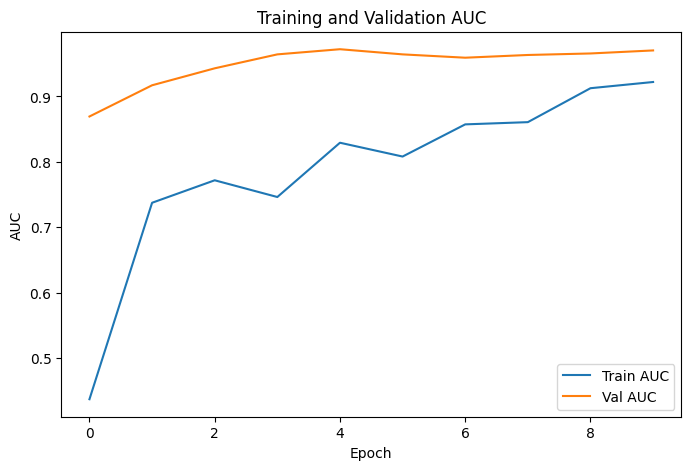

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5005 - loss: 0.4180 - val_auc: 0.6399 - val_loss: 0.5716
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8186 - loss: 0.2638 - val_auc: 0.8313 - val_loss: 0.5331
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7203 - loss: 0.3195 - val_auc: 0.9166 - val_loss: 0.4757
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8220 - loss: 0.2631 - val_auc: 0.9425 - val_loss: 0.4094
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8362 - loss: 0.2464 - val_auc: 0.9458 - val_loss: 0.3571
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8326 - loss: 0.2710 - val_auc: 0.9444 - val_loss: 0.3159
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8920 - loss: 0.1889 - val_auc: 0.9449 - val_loss: 0.2824
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8858 - loss: 0.1987 - val_auc: 0.9486 - val_loss: 0.2587
Epoch 9/100
12/12 ━━━━━━

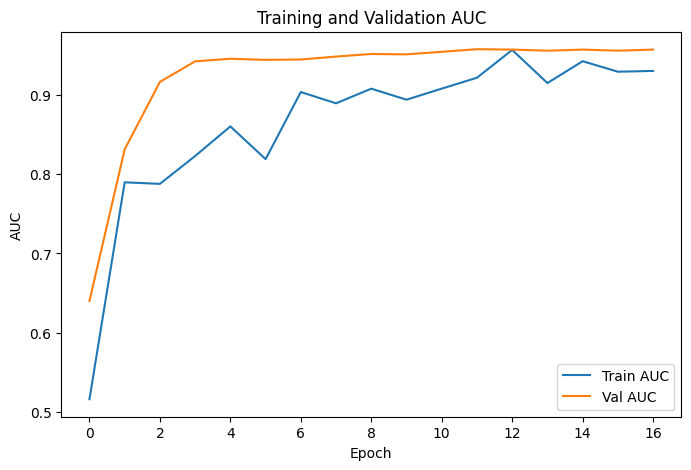

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5207 - loss: 0.7714 - val_auc: 0.6990 - val_loss: 0.5992
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6146 - loss: 0.5482 - val_auc: 0.8684 - val_loss: 0.5513
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7231 - loss: 0.4552 - val_auc: 0.9486 - val_loss: 0.4928
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8147 - loss: 0.3373 - val_auc: 0.9422 - val_loss: 0.4293
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8050 - loss: 0.3374 - val_auc: 0.9543 - val_loss: 0.3693
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8537 - loss: 0.2869 - val_auc: 0.9607 - val_loss: 0.3181
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7937 - loss: 0.3061 - val_auc: 0.9631 - val_loss: 0.2745
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8234 - loss: 0.2984 - val_auc: 0.9687 - val_loss: 0.2417
Epoch 9/100
12/12 ━━━━━━

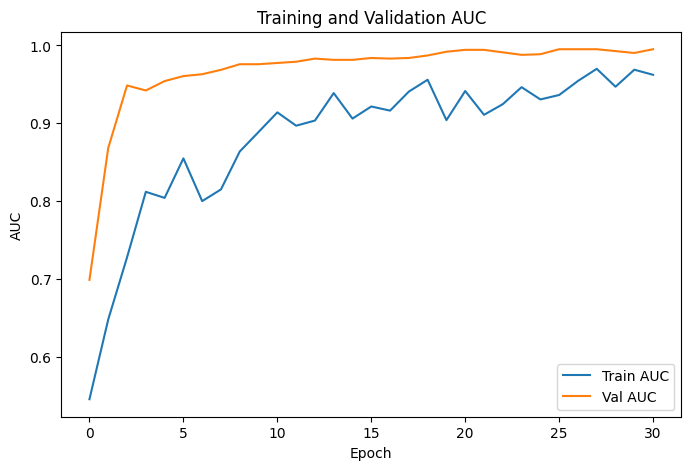

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - auc: 0.6055 - loss: 0.7500 - val_auc: 0.7299 - val_loss: 0.6371
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8413 - loss: 0.4739 - val_auc: 0.7867 - val_loss: 0.5677
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7939 - loss: 0.3942 - val_auc: 0.8193 - val_loss: 0.5000
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8486 - loss: 0.3579 - val_auc: 0.8557 - val_loss: 0.4324
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8932 - loss: 0.2697 - val_auc: 0.8563 - val_loss: 0.3710
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8757 - loss: 0.2738 - val_auc: 0.8704 - val_loss: 0.3248
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8523 - loss: 0.2492 - val_auc: 0.8819 - val_loss: 0.2872
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8484 - loss: 0.2681 - val_auc: 0.8883 - val_loss: 0.2604
Epoch 9/100
12/12 ━━━━━━

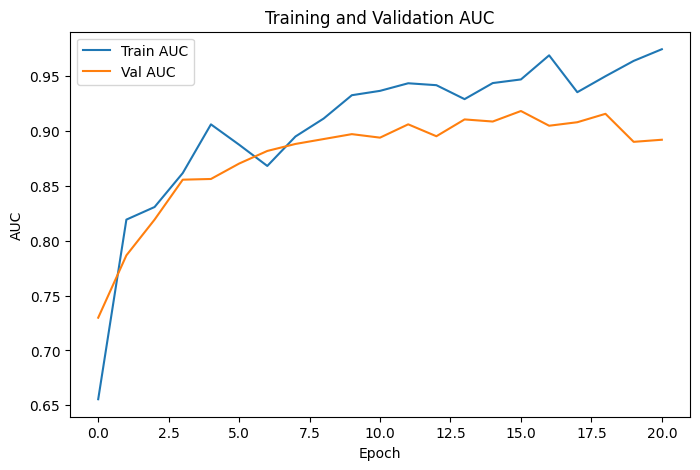

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5562 - loss: 0.8072 - val_auc: 0.9611 - val_loss: 0.6627
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7888 - loss: 0.5323 - val_auc: 0.9537 - val_loss: 0.5926
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8557 - loss: 0.4161 - val_auc: 0.9528 - val_loss: 0.5288
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8088 - loss: 0.4035 - val_auc: 0.9583 - val_loss: 0.4629
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9218 - loss: 0.2925 - val_auc: 0.9630 - val_loss: 0.3968
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8308 - loss: 0.3101 - val_auc: 0.9593 - val_loss: 0.3425
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8255 - loss: 0.2859 - val_auc: 0.9537 - val_loss: 0.2952
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8449 - loss: 0.2951 - val_auc: 0.9537 - val_loss: 0.2606
Epoch 9/100
12/12 ━━━━━━

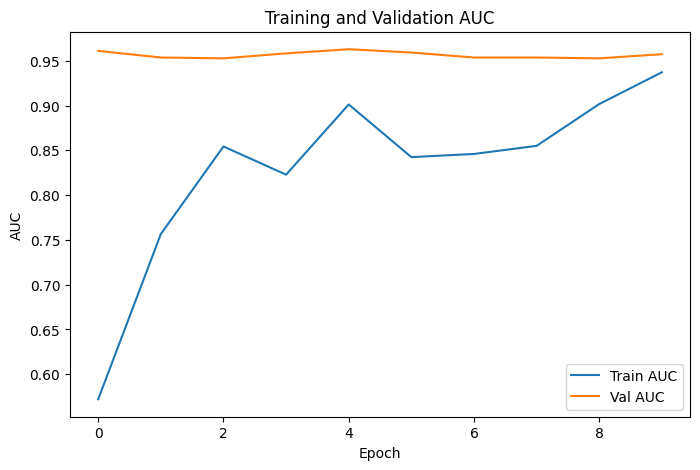

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Dataset_41: Accuracy=0.9208, Precision=0.5714, F1 Score=0.2940, Custom Score=0.5930
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  


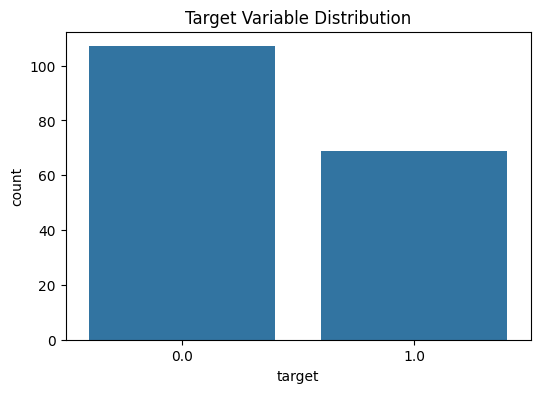

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4818 - loss: 0.9079 - val_auc: 0.5667 - val_loss: 0.6873
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6239 - loss: 0.7159 - val_auc: 0.7873 - val_loss: 0.6612
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7937 - loss: 0.5661 - val_auc: 0.8746 - val_loss: 0.6377
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8682 - loss: 0.4944 - val_auc: 0.9111 - val_loss: 0.6174
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8307 - loss: 0.5284 - val_auc: 0.9333 - val_loss: 0.5997
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8855 - loss: 0.4339 - val_auc: 0.9317 - val_loss: 0.5853
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8580 - loss: 0.4597 - val_auc: 0.9365 - val_loss: 0.5713
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8942 - loss: 0.3921 - val_auc: 0.9317 - val_loss: 0.5591
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9026 - loss: 0.3898 -

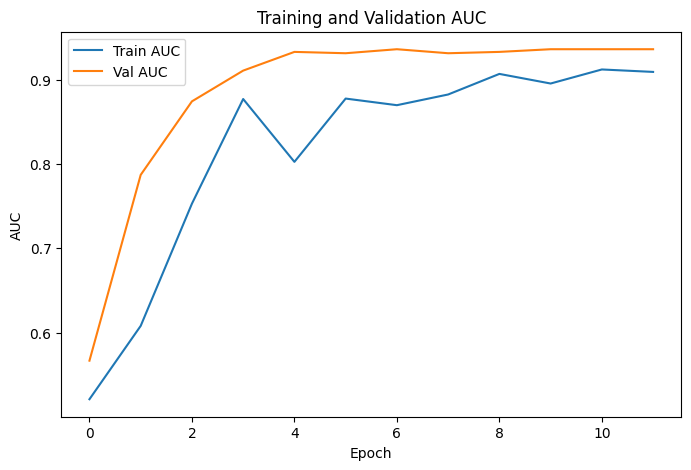

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4256 - loss: 0.9776 - val_auc: 0.7481 - val_loss: 0.6880
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6547 - loss: 0.6960 - val_auc: 0.7670 - val_loss: 0.6826
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7605 - loss: 0.5902 - val_auc: 0.7803 - val_loss: 0.6735
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7629 - loss: 0.5943 - val_auc: 0.8011 - val_loss: 0.6622
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8819 - loss: 0.4485 - val_auc: 0.8144 - val_loss: 0.6505
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8581 - loss: 0.4669 - val_auc: 0.8144 - val_loss: 0.6400
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8993 - loss: 0.4015 - val_auc: 0.8201 - val_loss: 0.6279
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9153 - loss: 0.3704 - val_auc: 0.8182 - val_loss: 0.6150
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

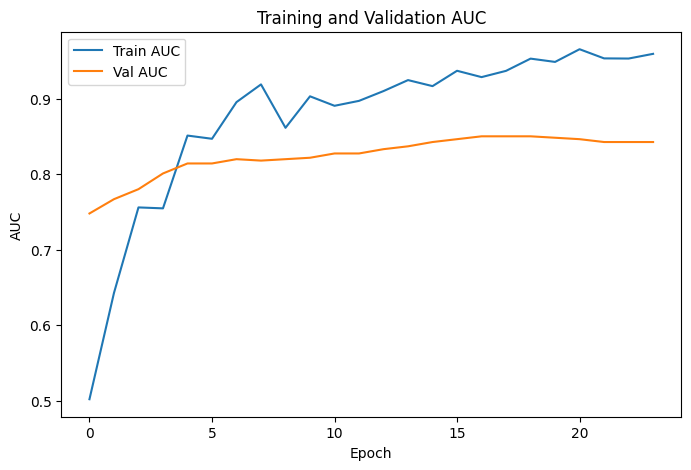

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.4831 - loss: 0.9516 - val_auc: 0.5876 - val_loss: 0.7191
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6468 - loss: 0.7934 - val_auc: 0.6474 - val_loss: 0.6975
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7512 - loss: 0.6745 - val_auc: 0.7286 - val_loss: 0.6764
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8047 - loss: 0.6243 - val_auc: 0.7799 - val_loss: 0.6555
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8958 - loss: 0.4836 - val_auc: 0.8013 - val_loss: 0.6358
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8771 - loss: 0.4763 - val_auc: 0.8333 - val_loss: 0.6169
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8833 - loss: 0.4348 - val_auc: 0.8462 - val_loss: 0.5990
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8805 - loss: 0.4373 - val_auc: 0.8568 - val_loss: 0.5819
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

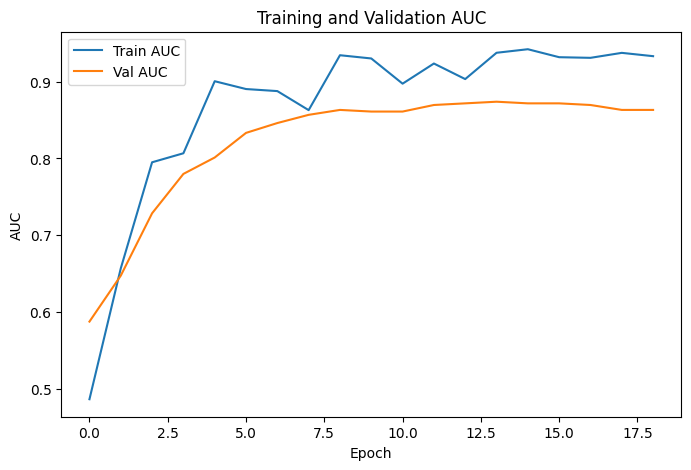

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - auc: 0.3446 - loss: 1.1808 - val_auc: 0.6536 - val_loss: 0.6826
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.5035 - loss: 0.8800 - val_auc: 0.8007 - val_loss: 0.6595
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.6881 - loss: 0.7357 - val_auc: 0.8480 - val_loss: 0.6436
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.8347 - loss: 0.5246 - val_auc: 0.8611 - val_loss: 0.6276
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8226 - loss: 0.5454 - val_auc: 0.8873 - val_loss: 0.6126
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8864 - loss: 0.4543 - val_auc: 0.8791 - val_loss: 0.6010
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8243 - loss: 0.5509 - val_auc: 0.8971 - val_loss: 0.5909
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8523 - loss: 0.4839 - val_auc: 0.8905 - val_loss: 0.5821
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

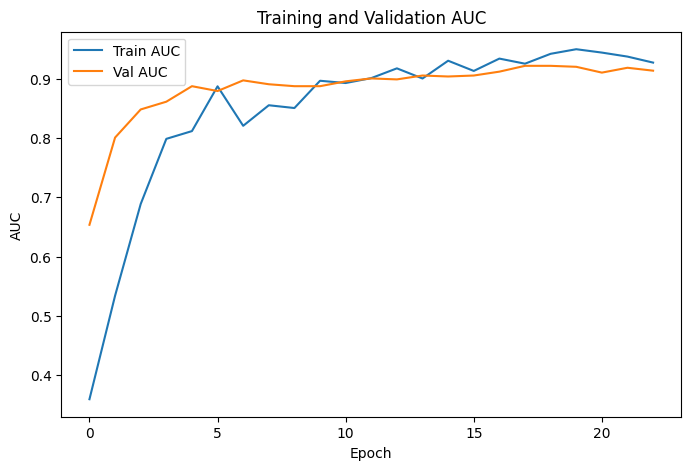

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4521 - loss: 0.9986 - val_auc: 0.5921 - val_loss: 0.6880
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6226 - loss: 0.7016 - val_auc: 0.7977 - val_loss: 0.6588
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6607 - loss: 0.7115 - val_auc: 0.8865 - val_loss: 0.6359
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7756 - loss: 0.5536 - val_auc: 0.9572 - val_loss: 0.6185
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8571 - loss: 0.4674 - val_auc: 0.9572 - val_loss: 0.6021
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8363 - loss: 0.4693 - val_auc: 0.9507 - val_loss: 0.5866
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9003 - loss: 0.3908 - val_auc: 0.9490 - val_loss: 0.5681
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8077 - loss: 0.5209 - val_auc: 0.9474 - val_loss: 0.5535
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

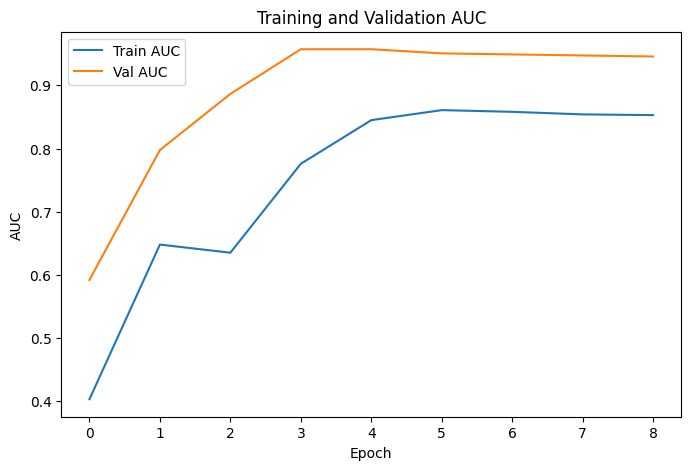

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Dataset_46: Accuracy=0.8294, Precision=0.7742, F1 Score=0.7499, Custom Score=0.7835
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


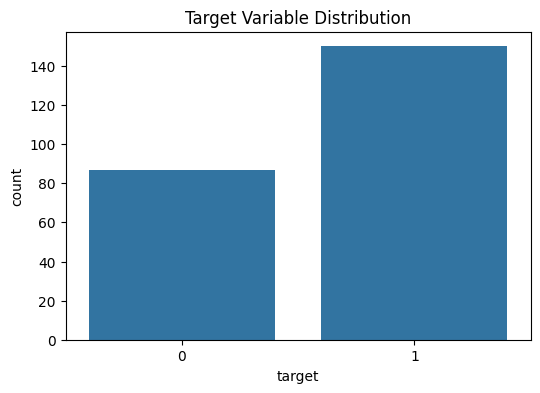

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - auc: 0.5926 - loss: 0.7728 - val_auc: 0.7220 - val_loss: 0.6788
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7045 - loss: 0.6139 - val_auc: 0.8340 - val_loss: 0.6250
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7675 - loss: 0.5377 - val_auc: 0.8928 - val_loss: 0.5793
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8574 - loss: 0.4605 - val_auc: 0.9269 - val_loss: 0.5391
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9111 - loss: 0.3955 - val_auc: 0.9469 - val_loss: 0.5040
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9259 - loss: 0.3464 - val_auc: 0.9545 - val_loss: 0.4721
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9415 - loss: 0.3273 - val_auc: 0.9583 - val_loss: 0.4430
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9429 - loss: 0.3320 - val_auc: 0.9573 - val_loss: 0.4198
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9865 - loss: 0.2104 -

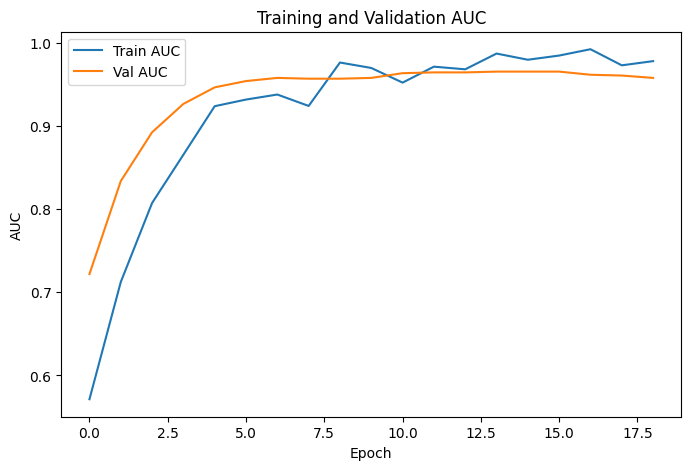

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - auc: 0.5138 - loss: 0.8143 - val_auc: 0.4880 - val_loss: 0.6828
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6904 - loss: 0.6415 - val_auc: 0.6380 - val_loss: 0.6535
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8611 - loss: 0.4612 - val_auc: 0.7787 - val_loss: 0.6215
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8629 - loss: 0.4524 - val_auc: 0.8556 - val_loss: 0.5910
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8781 - loss: 0.4434 - val_auc: 0.8898 - val_loss: 0.5634
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9406 - loss: 0.3311 - val_auc: 0.9046 - val_loss: 0.5350
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9661 - loss: 0.2533 - val_auc: 0.9176 - val_loss: 0.5071
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9503 - loss: 0.3029 - val_auc: 0.9306 - val_loss: 0.4808
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4

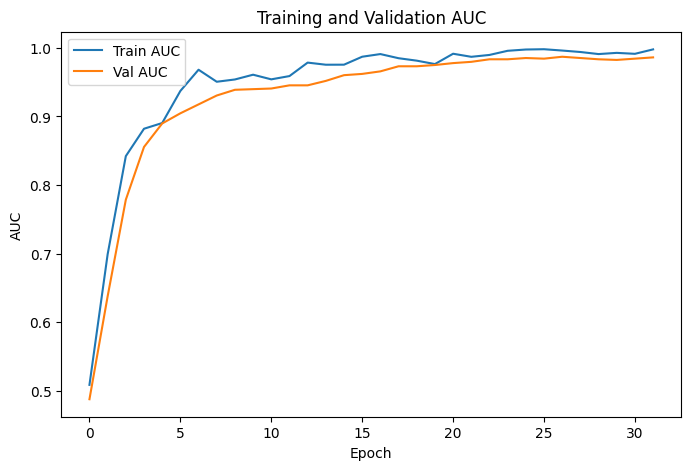

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.5585 - loss: 0.7537 - val_auc: 0.8455 - val_loss: 0.6212
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7777 - loss: 0.5216 - val_auc: 0.9364 - val_loss: 0.5759
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8080 - loss: 0.4780 - val_auc: 0.9636 - val_loss: 0.5373
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8433 - loss: 0.4660 - val_auc: 0.9745 - val_loss: 0.5063
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - auc: 0.8958 - loss: 0.4046 - val_auc: 0.9800 - val_loss: 0.4808
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8967 - loss: 0.3702 - val_auc: 0.9818 - val_loss: 0.4593
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9237 - loss: 0.3416 - val_auc: 0.9818 - val_loss: 0.4369
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9567 - loss: 0.2760 - val_auc: 0.9818 - val_loss: 0.4159
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 

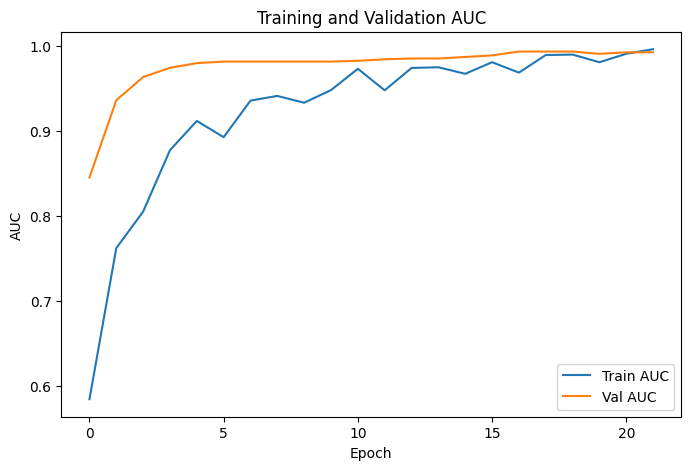

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - auc: 0.5954 - loss: 0.7902 - val_auc: 0.8310 - val_loss: 0.6742
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6238 - loss: 0.7442 - val_auc: 0.9131 - val_loss: 0.6380
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7068 - loss: 0.6427 - val_auc: 0.9393 - val_loss: 0.6052
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8619 - loss: 0.5083 - val_auc: 0.9524 - val_loss: 0.5744
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8908 - loss: 0.4340 - val_auc: 0.9571 - val_loss: 0.5451
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9228 - loss: 0.3889 - val_auc: 0.9595 - val_loss: 0.5186
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9202 - loss: 0.3565 - val_auc: 0.9619 - val_loss: 0.4910
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.9339 - loss: 0.3282 - val_auc: 0.9702 - val_loss: 0.4635
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4

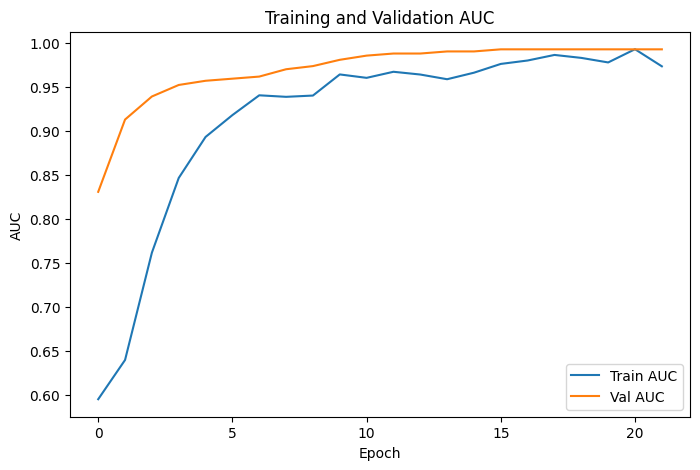

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - auc: 0.4991 - loss: 0.8672 - val_auc: 0.7739 - val_loss: 0.6451
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.7123 - loss: 0.6100 - val_auc: 0.8774 - val_loss: 0.6038
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8121 - loss: 0.4918 - val_auc: 0.9272 - val_loss: 0.5669
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.8736 - loss: 0.4330 - val_auc: 0.9502 - val_loss: 0.5337
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9101 - loss: 0.3847 - val_auc: 0.9617 - val_loss: 0.5036
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9354 - loss: 0.3338 - val_auc: 0.9626 - val_loss: 0.4765
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9467 - loss: 0.3089 - val_auc: 0.9674 - val_loss: 0.4487
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9428 - loss: 0.3041 - val_auc: 0.9722 - val_loss: 0.4222
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3

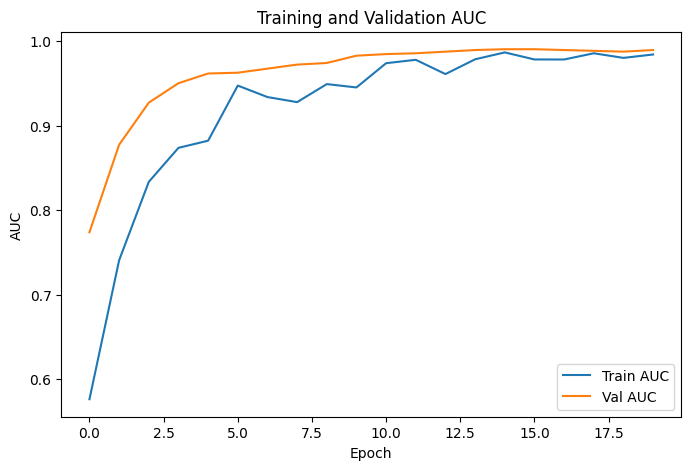

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Dataset_48: Accuracy=0.9075, Precision=0.9273, F1 Score=0.9286, Custom Score=0.9217
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step


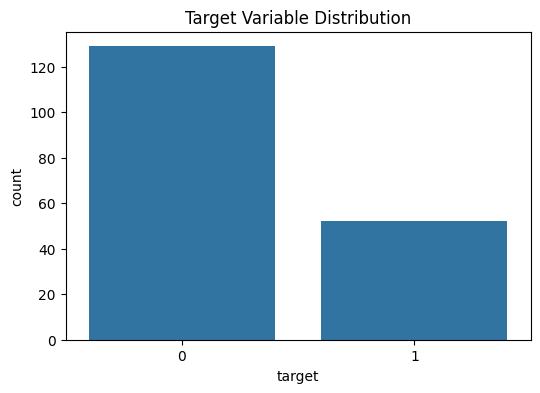

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5427 - loss: 0.8170 - val_auc: 0.8633 - val_loss: 0.5767
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5310 - loss: 0.7191 - val_auc: 0.9133 - val_loss: 0.5592
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6165 - loss: 0.6268 - val_auc: 0.9417 - val_loss: 0.5431
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6333 - loss: 0.6018 - val_auc: 0.9617 - val_loss: 0.5297
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7763 - loss: 0.4857 - val_auc: 0.9767 - val_loss: 0.5175
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7991 - loss: 0.4985 - val_auc: 0.9783 - val_loss: 0.5030
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8400 - loss: 0.4592 - val_auc: 0.9800 - val_loss: 0.4901
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8760 - loss: 0.4213 - val_auc: 0.9783 - val_loss: 0.4765
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8755 - loss: 0.3866 -

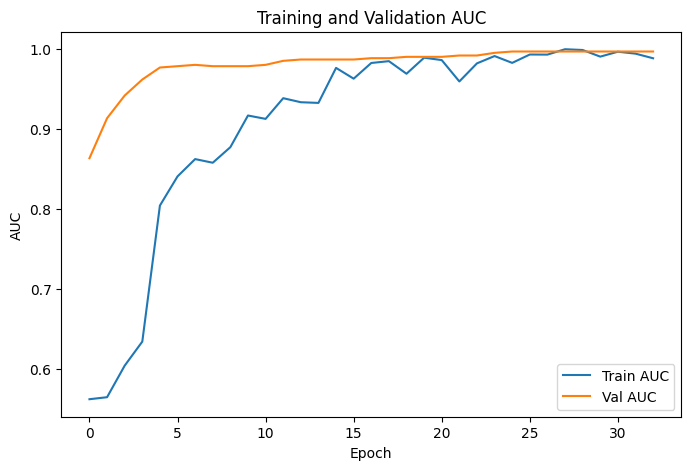

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.6598 - loss: 0.8786 - val_auc: 0.8250 - val_loss: 0.6363
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7240 - loss: 0.7733 - val_auc: 0.8731 - val_loss: 0.6114
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7904 - loss: 0.6339 - val_auc: 0.9000 - val_loss: 0.5816
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7585 - loss: 0.6518 - val_auc: 0.9077 - val_loss: 0.5556
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8552 - loss: 0.5498 - val_auc: 0.9327 - val_loss: 0.5327
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9092 - loss: 0.4590 - val_auc: 0.9385 - val_loss: 0.5111
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8284 - loss: 0.5291 - val_auc: 0.9404 - val_loss: 0.4941
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9379 - loss: 0.3741 - val_auc: 0.9442 - val_loss: 0.4781
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

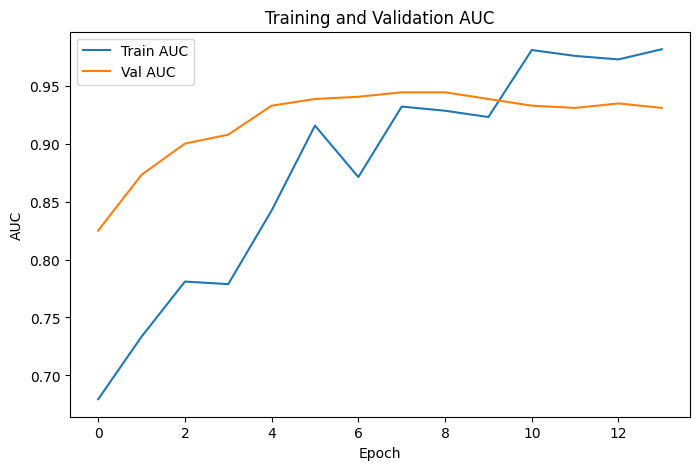

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.4510 - loss: 1.0870 - val_auc: 0.5942 - val_loss: 0.6877
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5840 - loss: 0.9193 - val_auc: 0.7077 - val_loss: 0.6600
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6738 - loss: 0.7527 - val_auc: 0.7827 - val_loss: 0.6392
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.7150 - loss: 0.6566 - val_auc: 0.8481 - val_loss: 0.6211
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.8023 - loss: 0.5714 - val_auc: 0.8750 - val_loss: 0.6051
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - auc: 0.7854 - loss: 0.6378 - val_auc: 0.9115 - val_loss: 0.5873
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.7523 - loss: 0.6318 - val_auc: 0.9212 - val_loss: 0.5693
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8703 - loss: 0.4845 - val_auc: 0.9308 - val_loss: 0.5527
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6

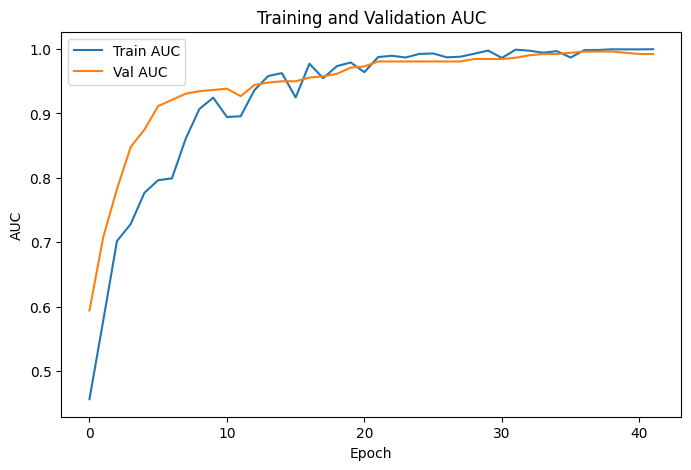

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5935 - loss: 0.8258 - val_auc: 0.7020 - val_loss: 0.6379
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6228 - loss: 0.7405 - val_auc: 0.8030 - val_loss: 0.6106
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6276 - loss: 0.7598 - val_auc: 0.8596 - val_loss: 0.5792
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8037 - loss: 0.5740 - val_auc: 0.8966 - val_loss: 0.5523
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8103 - loss: 0.5401 - val_auc: 0.9212 - val_loss: 0.5243
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8835 - loss: 0.4543 - val_auc: 0.9409 - val_loss: 0.4992
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9089 - loss: 0.4205 - val_auc: 0.9360 - val_loss: 0.4726
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9094 - loss: 0.3693 - val_auc: 0.9360 - val_loss: 0.4482
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

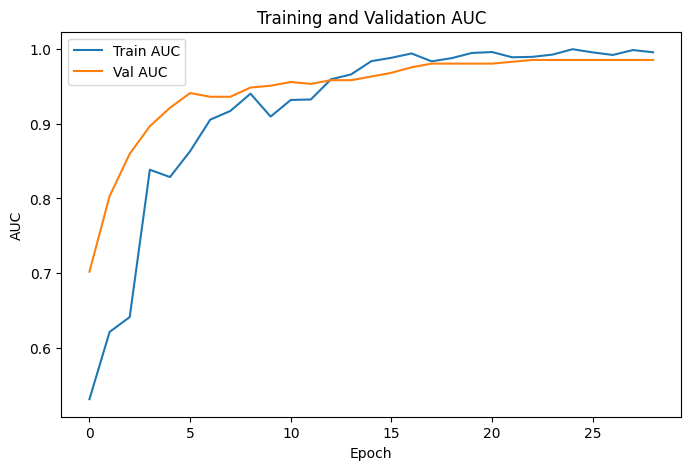

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5891 - loss: 0.6296 - val_auc: 0.5452 - val_loss: 0.6747
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6677 - loss: 0.5983 - val_auc: 0.6237 - val_loss: 0.6575
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7524 - loss: 0.4983 - val_auc: 0.7040 - val_loss: 0.6401
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7107 - loss: 0.5259 - val_auc: 0.7793 - val_loss: 0.6219
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7834 - loss: 0.4771 - val_auc: 0.8411 - val_loss: 0.6015
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8328 - loss: 0.4291 - val_auc: 0.8880 - val_loss: 0.5817
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8032 - loss: 0.4640 - val_auc: 0.9114 - val_loss: 0.5613
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.9375 - loss: 0.3462 - val_auc: 0.9381 - val_loss: 0.5410
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

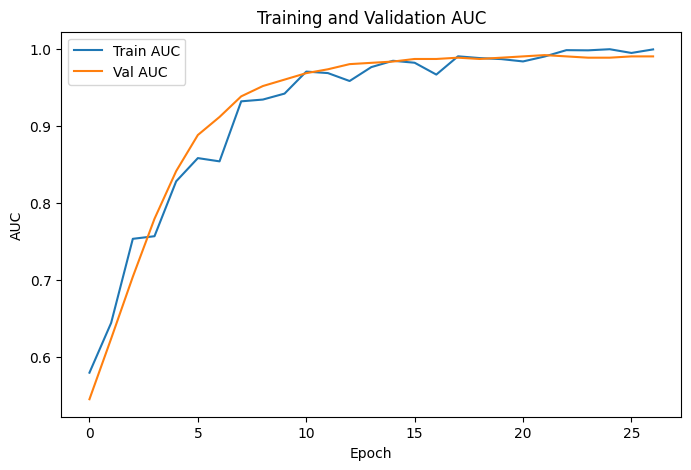

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Dataset_14: Accuracy=0.9170, Precision=0.8734, F1 Score=0.8314, Custom Score=0.8739
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 671us/step


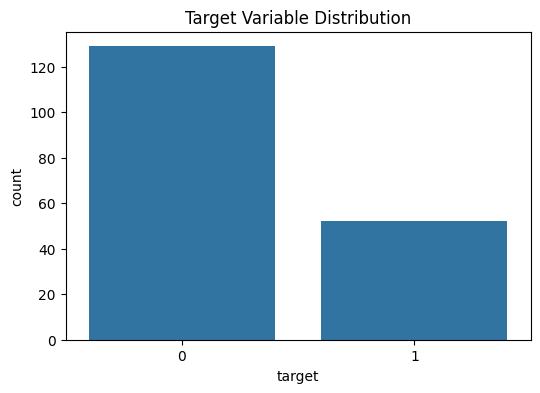

Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4898 - loss: 0.6979 - val_auc: 0.7183 - val_loss: 0.6157
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6479 - loss: 0.5783 - val_auc: 0.7883 - val_loss: 0.6013
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5620 - loss: 0.6318 - val_auc: 0.8417 - val_loss: 0.5899
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7654 - loss: 0.5009 - val_auc: 0.8667 - val_loss: 0.5788
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7348 - loss: 0.5210 - val_auc: 0.8933 - val_loss: 0.5673
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8028 - loss: 0.4780 - val_auc: 0.9133 - val_loss: 0.5569
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8838 - loss: 0.3977 - val_auc: 0.9317 - val_loss: 0.5458
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8128 - loss: 0.4589 - val_auc: 0.9700 - val_loss: 0.5343
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8509 - loss: 0.4253 -

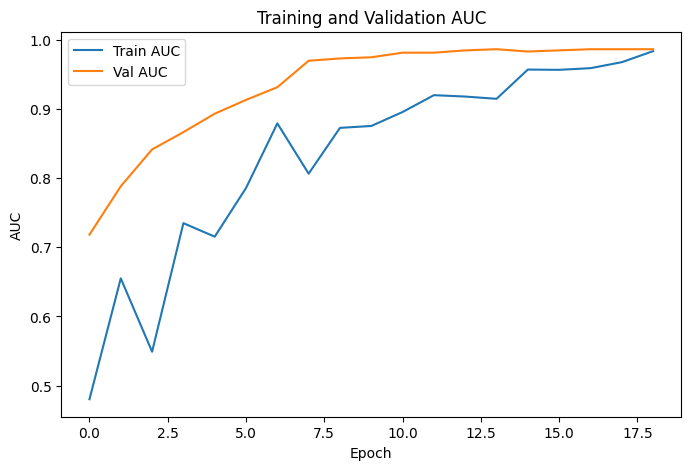

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - auc: 0.6291 - loss: 1.1123 - val_auc: 0.6865 - val_loss: 0.7297
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5733 - loss: 1.0982 - val_auc: 0.7635 - val_loss: 0.7065
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5338 - loss: 1.0753 - val_auc: 0.8269 - val_loss: 0.6838
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6563 - loss: 0.8594 - val_auc: 0.8750 - val_loss: 0.6625
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7913 - loss: 0.7045 - val_auc: 0.9000 - val_loss: 0.6429
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7494 - loss: 0.7333 - val_auc: 0.9077 - val_loss: 0.6263
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8515 - loss: 0.5522 - val_auc: 0.9115 - val_loss: 0.6081
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8731 - loss: 0.5352 - val_auc: 0.9173 - val_loss: 0.5901
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

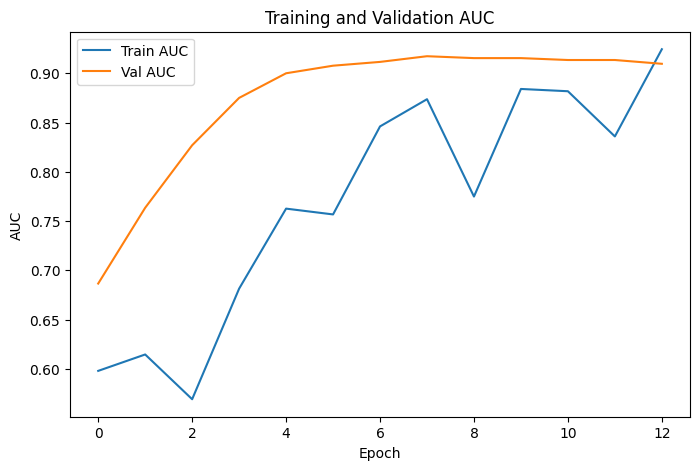

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.4988 - loss: 0.9800 - val_auc: 0.5231 - val_loss: 0.7449
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6000 - loss: 0.8170 - val_auc: 0.5346 - val_loss: 0.7202
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6561 - loss: 0.7170 - val_auc: 0.5750 - val_loss: 0.6963
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7260 - loss: 0.6046 - val_auc: 0.6308 - val_loss: 0.6767
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7780 - loss: 0.5809 - val_auc: 0.6962 - val_loss: 0.6550
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8424 - loss: 0.5072 - val_auc: 0.7385 - val_loss: 0.6365
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8435 - loss: 0.4617 - val_auc: 0.7577 - val_loss: 0.6206
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8664 - loss: 0.4207 - val_auc: 0.7673 - val_loss: 0.6061
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 5

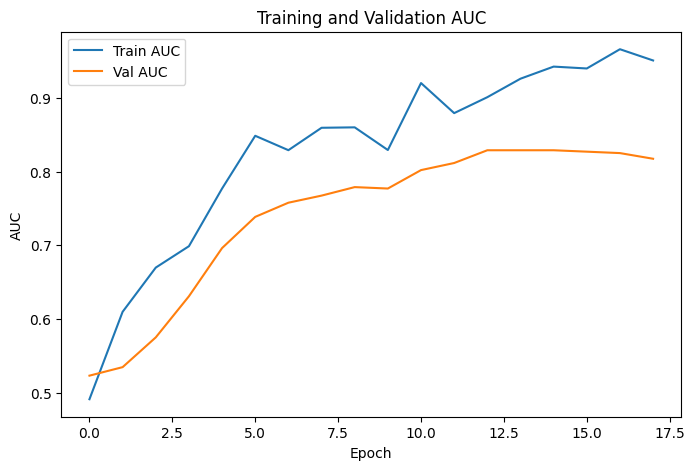

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - auc: 0.5745 - loss: 1.3323 - val_auc: 0.6921 - val_loss: 0.7485
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5232 - loss: 1.4396 - val_auc: 0.7291 - val_loss: 0.7167
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6465 - loss: 1.1181 - val_auc: 0.7537 - val_loss: 0.6906
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7524 - loss: 0.9841 - val_auc: 0.8030 - val_loss: 0.6676
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7738 - loss: 0.8275 - val_auc: 0.8448 - val_loss: 0.6490
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7884 - loss: 0.7365 - val_auc: 0.8547 - val_loss: 0.6292
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7888 - loss: 0.7709 - val_auc: 0.8498 - val_loss: 0.6116
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8043 - loss: 0.6762 - val_auc: 0.8498 - val_loss: 0.5938
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

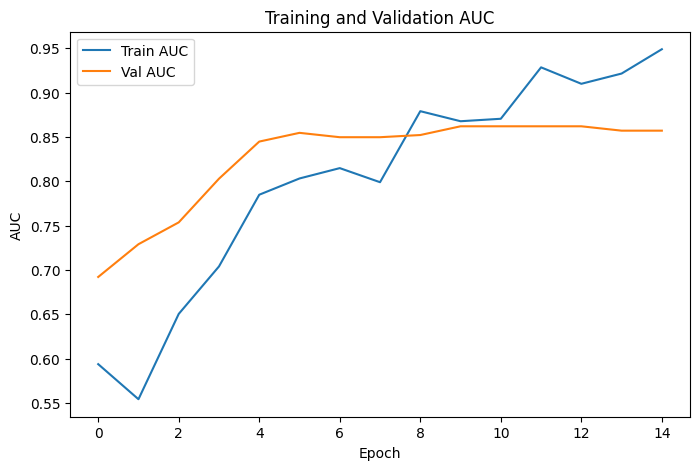

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - auc: 0.4202 - loss: 0.9667 - val_auc: 0.7074 - val_loss: 0.6843
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.5446 - loss: 0.8826 - val_auc: 0.7542 - val_loss: 0.6640
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.6421 - loss: 0.6842 - val_auc: 0.8194 - val_loss: 0.6431
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7349 - loss: 0.6151 - val_auc: 0.8495 - val_loss: 0.6249
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8310 - loss: 0.5308 - val_auc: 0.8679 - val_loss: 0.6061
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7409 - loss: 0.5646 - val_auc: 0.8779 - val_loss: 0.5895
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7584 - loss: 0.5537 - val_auc: 0.8896 - val_loss: 0.5748
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8051 - loss: 0.4846 - val_auc: 0.8963 - val_loss: 0.5601
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4

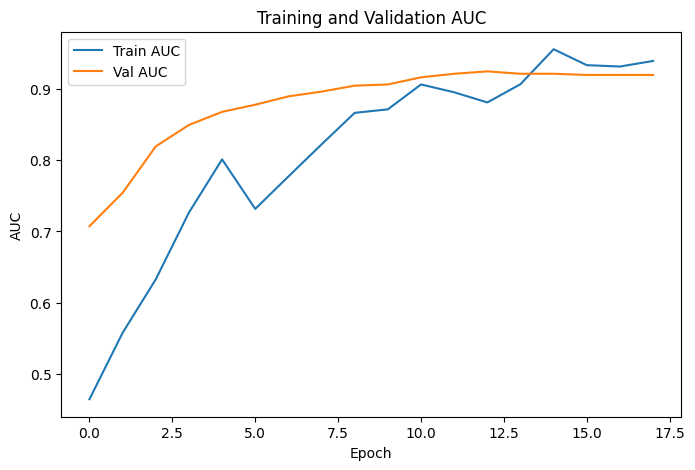

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Dataset_13: Accuracy=0.8505, Precision=0.8051, F1 Score=0.7107, Custom Score=0.7904
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step


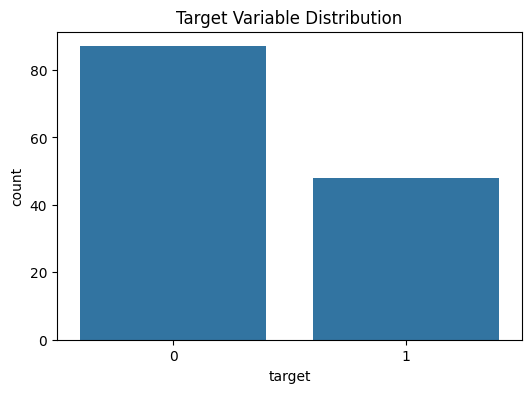

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.4471 - loss: 0.9603 - val_auc: 0.4198 - val_loss: 0.7080
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6326 - loss: 0.7443 - val_auc: 0.4846 - val_loss: 0.6907
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.4881 - loss: 0.8361 - val_auc: 0.6142 - val_loss: 0.6733
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6214 - loss: 0.6919 - val_auc: 0.7037 - val_loss: 0.6573
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6776 - loss: 0.6510 - val_auc: 0.7963 - val_loss: 0.6440
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5797 - loss: 0.7045 - val_auc: 0.8272 - val_loss: 0.6333
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8114 - loss: 0.5215 - val_auc: 0.8395 - val_loss: 0.6243
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7277 - loss: 0.5748 - val_auc: 0.8673 - val_loss: 0.6170
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - auc: 0.8315 - loss: 0.4983 

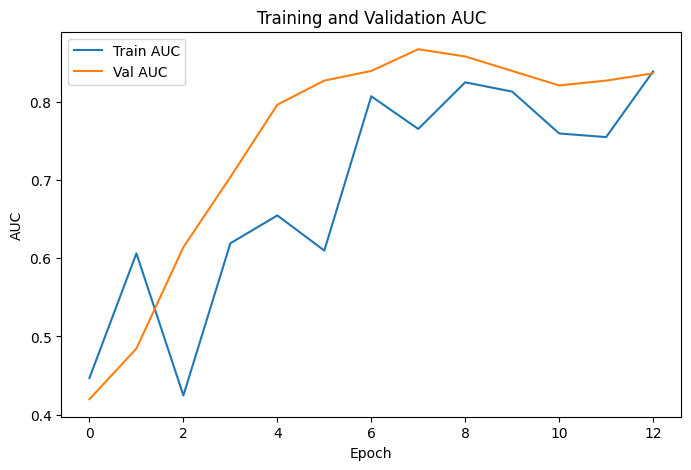

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc: 0.4443 - loss: 0.9824 - val_auc: 0.4259 - val_loss: 0.7057
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6540 - loss: 0.7834 - val_auc: 0.5494 - val_loss: 0.6921
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5559 - loss: 0.8472 - val_auc: 0.6204 - val_loss: 0.6780
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5913 - loss: 0.8176 - val_auc: 0.6667 - val_loss: 0.6677
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7264 - loss: 0.6399 - val_auc: 0.7253 - val_loss: 0.6592
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6977 - loss: 0.6186 - val_auc: 0.7377 - val_loss: 0.6526
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6883 - loss: 0.6846 - val_auc: 0.7623 - val_loss: 0.6470
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7596 - loss: 0.5798 - val_auc: 0.7716 - val_loss: 0.6426
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

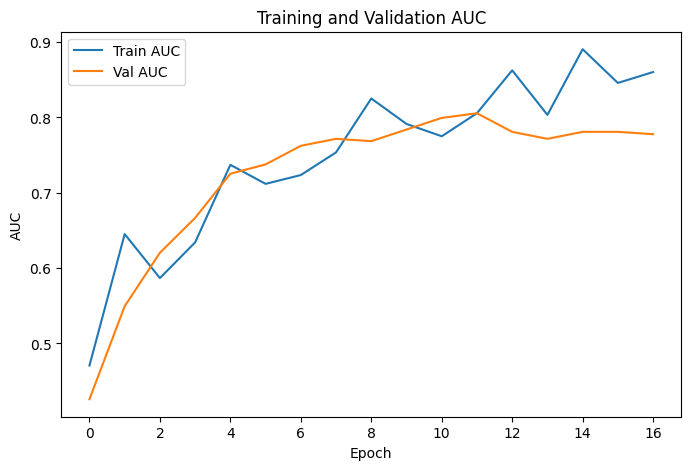

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - auc: 0.4888 - loss: 0.8194 - val_auc: 0.2830 - val_loss: 0.7142
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5358 - loss: 0.7468 - val_auc: 0.3571 - val_loss: 0.7047
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.4975 - loss: 0.7843 - val_auc: 0.4753 - val_loss: 0.6954
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6430 - loss: 0.6775 - val_auc: 0.6374 - val_loss: 0.6877
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5171 - loss: 0.6966 - val_auc: 0.7088 - val_loss: 0.6816
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7396 - loss: 0.5738 - val_auc: 0.7775 - val_loss: 0.6760
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7113 - loss: 0.5951 - val_auc: 0.8242 - val_loss: 0.6699
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7273 - loss: 0.5859 - val_auc: 0.8297 - val_loss: 0.6644
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

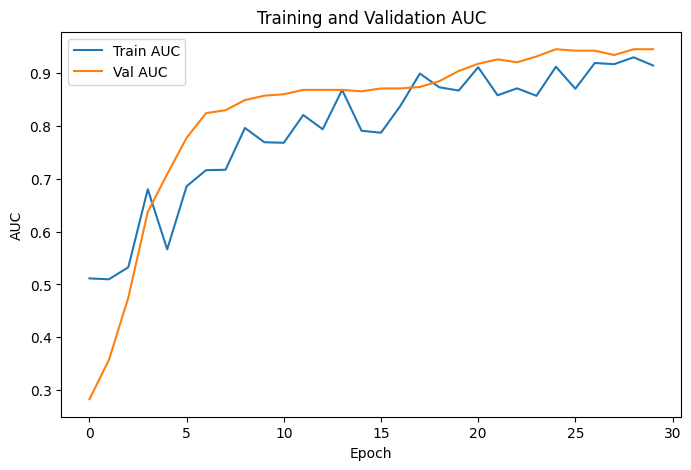

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - auc: 0.3630 - loss: 0.9978 - val_auc: 0.1786 - val_loss: 0.7068
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.3735 - loss: 0.9285 - val_auc: 0.2473 - val_loss: 0.6993
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.4101 - loss: 0.9146 - val_auc: 0.4725 - val_loss: 0.6931
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5356 - loss: 0.7929 - val_auc: 0.5852 - val_loss: 0.6901
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5127 - loss: 0.7472 - val_auc: 0.6401 - val_loss: 0.6890
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6828 - loss: 0.6577 - val_auc: 0.6456 - val_loss: 0.6894
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5737 - loss: 0.7342 - val_auc: 0.6758 - val_loss: 0.6900
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6335 - loss: 0.6572 - val_auc: 0.6758 - val_loss: 0.6899
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

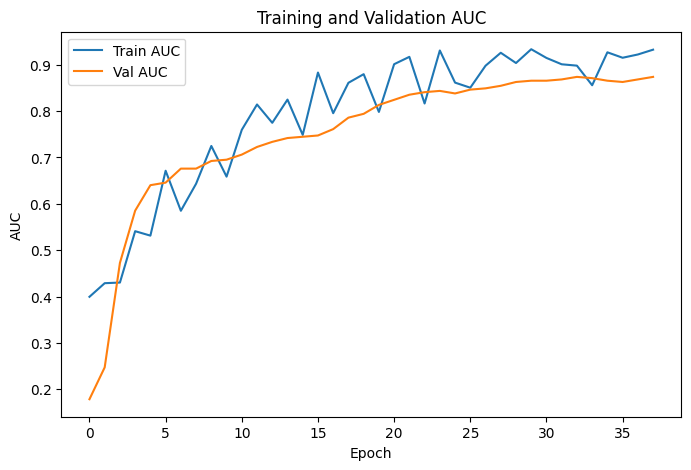

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - auc: 0.5729 - loss: 0.8099 - val_auc: 0.3913 - val_loss: 0.6259
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6218 - loss: 0.8075 - val_auc: 0.4783 - val_loss: 0.6322
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6034 - loss: 0.7843 - val_auc: 0.5217 - val_loss: 0.6382
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6945 - loss: 0.6779 - val_auc: 0.5326 - val_loss: 0.6426
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7430 - loss: 0.6204 - val_auc: 0.5380 - val_loss: 0.6469
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6544 - loss: 0.6539 - val_auc: 0.5652 - val_loss: 0.6489
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6657 - loss: 0.6865 - val_auc: 0.5652 - val_loss: 0.6498
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7745 - loss: 0.6460 - val_auc: 0.6250 - val_loss: 0.6502
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

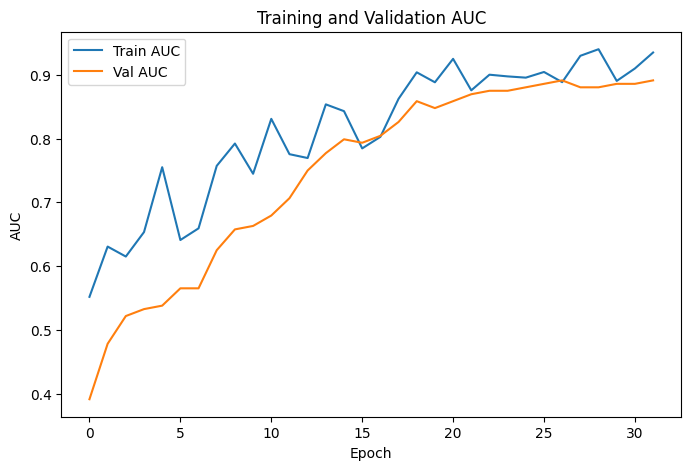

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Dataset_25: Accuracy=0.6889, Precision=0.3485, F1 Score=0.3642, Custom Score=0.4553
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step


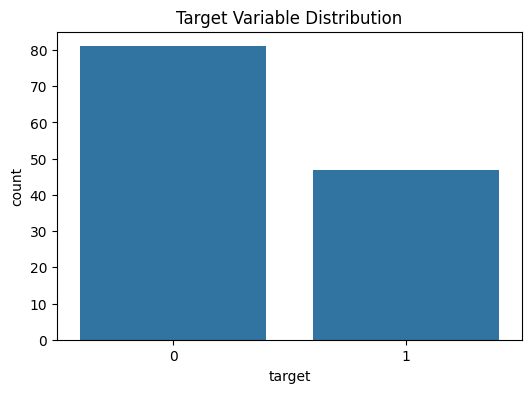

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - auc: 0.5046 - loss: 0.8350 - val_auc: 0.7222 - val_loss: 0.6731
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6284 - loss: 0.7314 - val_auc: 0.7288 - val_loss: 0.6681
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6790 - loss: 0.6442 - val_auc: 0.7451 - val_loss: 0.6648
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7281 - loss: 0.6023 - val_auc: 0.7614 - val_loss: 0.6614
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7345 - loss: 0.5874 - val_auc: 0.7647 - val_loss: 0.6582
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7812 - loss: 0.5854 - val_auc: 0.7418 - val_loss: 0.6579
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8905 - loss: 0.4548 - val_auc: 0.7353 - val_loss: 0.6581
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7032 - loss: 0.6371 - val_auc: 0.7255 - val_loss: 0.6570
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8171 - loss: 0.5078 -

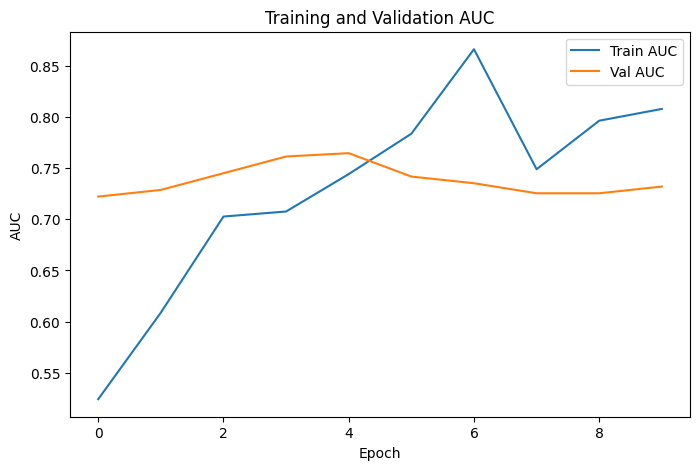

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - auc: 0.4954 - loss: 0.7803 - val_auc: 0.8346 - val_loss: 0.6555
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6801 - loss: 0.6258 - val_auc: 0.8835 - val_loss: 0.6486
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6527 - loss: 0.6419 - val_auc: 0.9060 - val_loss: 0.6413
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7870 - loss: 0.5488 - val_auc: 0.8759 - val_loss: 0.6327
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7684 - loss: 0.5532 - val_auc: 0.8947 - val_loss: 0.6236
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8690 - loss: 0.4593 - val_auc: 0.8985 - val_loss: 0.6167
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7610 - loss: 0.6070 - val_auc: 0.8835 - val_loss: 0.6080
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7604 - loss: 0.5751 - val_auc: 0.8910 - val_loss: 0.5986


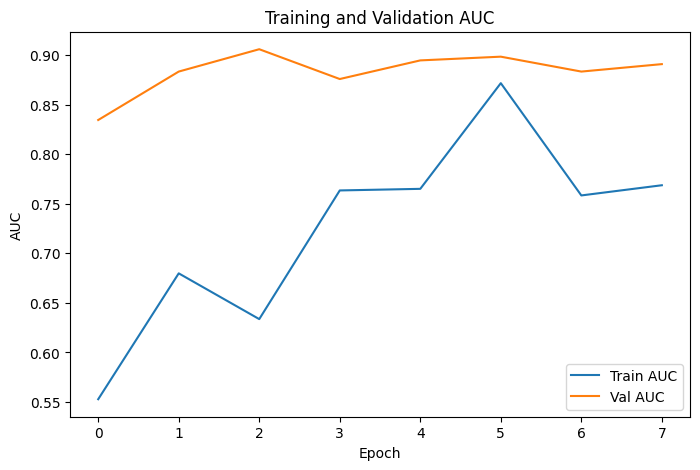

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - auc: 0.5100 - loss: 0.8799 - val_auc: 0.7875 - val_loss: 0.6553
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5472 - loss: 0.8403 - val_auc: 0.7833 - val_loss: 0.6634
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6357 - loss: 0.7862 - val_auc: 0.8083 - val_loss: 0.6700
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6269 - loss: 0.8122 - val_auc: 0.8458 - val_loss: 0.6755
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7536 - loss: 0.6011 - val_auc: 0.8750 - val_loss: 0.6775
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7298 - loss: 0.6848 - val_auc: 0.8667 - val_loss: 0.6788
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7619 - loss: 0.5858 - val_auc: 0.8583 - val_loss: 0.6808
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7119 - loss: 0.6268 - val_auc: 0.8542 - val_loss: 0.6814
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4

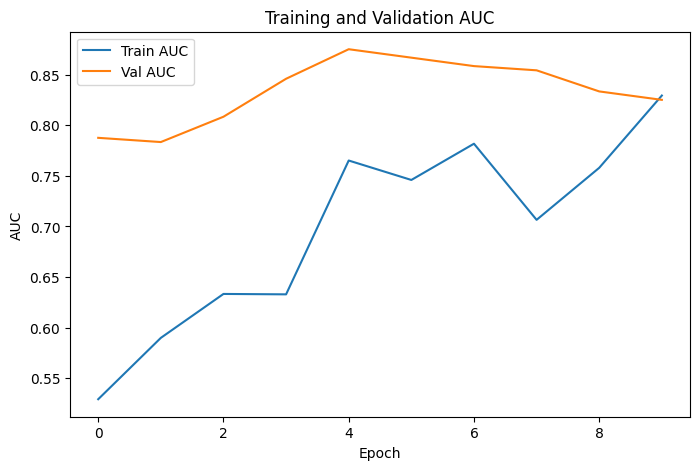

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - auc: 0.5612 - loss: 0.7772 - val_auc: 0.7372 - val_loss: 0.6685
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6382 - loss: 0.6752 - val_auc: 0.7724 - val_loss: 0.6582
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6147 - loss: 0.6741 - val_auc: 0.8077 - val_loss: 0.6489
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.5345 - loss: 0.7631 - val_auc: 0.8237 - val_loss: 0.6409
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7083 - loss: 0.5908 - val_auc: 0.8269 - val_loss: 0.6313
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.6958 - loss: 0.6514 - val_auc: 0.8526 - val_loss: 0.6230
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7754 - loss: 0.5564 - val_auc: 0.8590 - val_loss: 0.6163
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.7132 - loss: 0.5851 - val_auc: 0.8590 - val_loss: 0.6087
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4

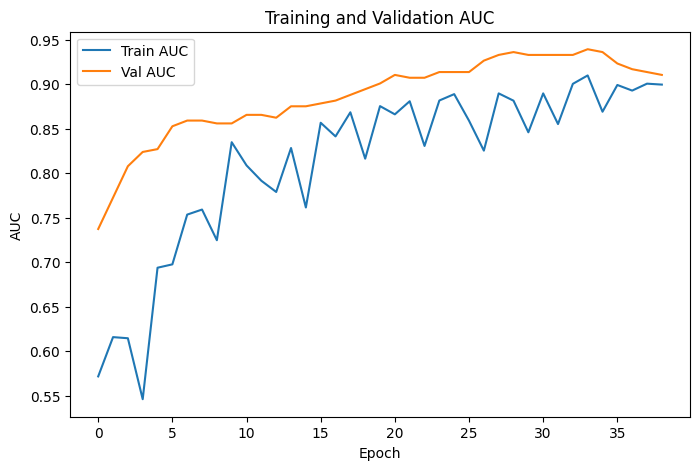

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - auc: 0.3508 - loss: 0.8906 - val_auc: 0.5641 - val_loss: 0.6890
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6300 - loss: 0.7147 - val_auc: 0.6250 - val_loss: 0.6853
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7020 - loss: 0.6530 - val_auc: 0.6635 - val_loss: 0.6810
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6069 - loss: 0.7784 - val_auc: 0.7244 - val_loss: 0.6767
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.6308 - loss: 0.6851 - val_auc: 0.7212 - val_loss: 0.6738
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.7438 - loss: 0.5917 - val_auc: 0.7372 - val_loss: 0.6705
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - auc: 0.8470 - loss: 0.4935 - val_auc: 0.7500 - val_loss: 0.6666
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - auc: 0.8123 - loss: 0.5544 - val_auc: 0.7660 - val_loss: 0.6638
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5

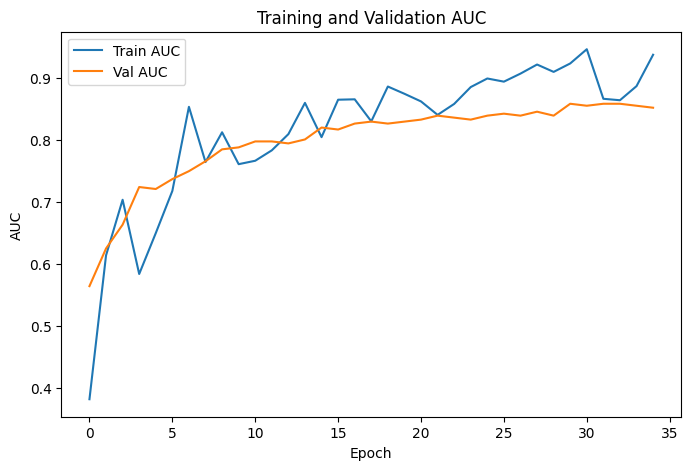

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Dataset_22: Accuracy=0.7348, Precision=0.7867, F1 Score=0.6210, Custom Score=0.7214
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step


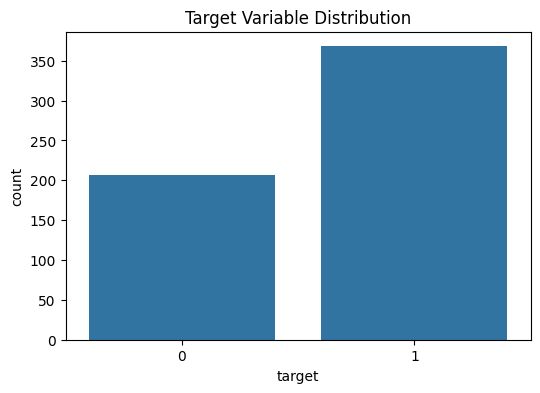

Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - auc: 0.7755 - loss: 0.7148 - val_auc: 0.9746 - val_loss: 0.5209
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9227 - loss: 0.4251 - val_auc: 0.9768 - val_loss: 0.4084
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9427 - loss: 0.3280 - val_auc: 0.9763 - val_loss: 0.3341
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9580 - loss: 0.2657 - val_auc: 0.9771 - val_loss: 0.2783
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9501 - loss: 0.2792 - val_auc: 0.9789 - val_loss: 0.2435
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9733 - loss: 0.2115 - val_auc: 0.9796 - val_loss: 0.2200
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9819 - loss: 0.1785 - val_auc: 0.9792 - val_loss: 0.2039
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9764 - loss: 0.1932 - val_auc: 0.9799 - val_loss: 0.1928
Epoch 9/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9626

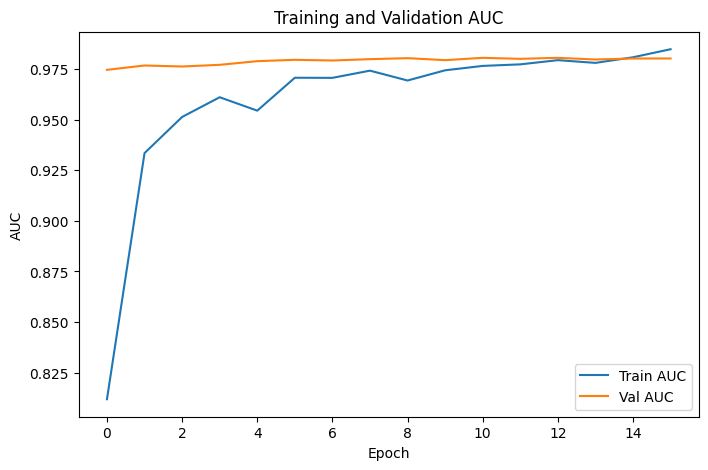

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.5991 - loss: 0.7549 - val_auc: 0.9412 - val_loss: 0.4738
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9053 - loss: 0.3837 - val_auc: 0.9535 - val_loss: 0.3921
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9452 - loss: 0.2928 - val_auc: 0.9557 - val_loss: 0.3415
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9343 - loss: 0.3185 - val_auc: 0.9605 - val_loss: 0.3035
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9637 - loss: 0.2444 - val_auc: 0.9663 - val_loss: 0.2767
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9538 - loss: 0.2637 - val_auc: 0.9710 - val_loss: 0.2563
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9755 - loss: 0.1965 - val_auc: 0.9730 - val_loss: 0.2382
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9731 - loss: 0.2036 - val_auc: 0.9720 - val_loss: 0.2257
Epoch 9/100
15/15 ━━━━━━━━

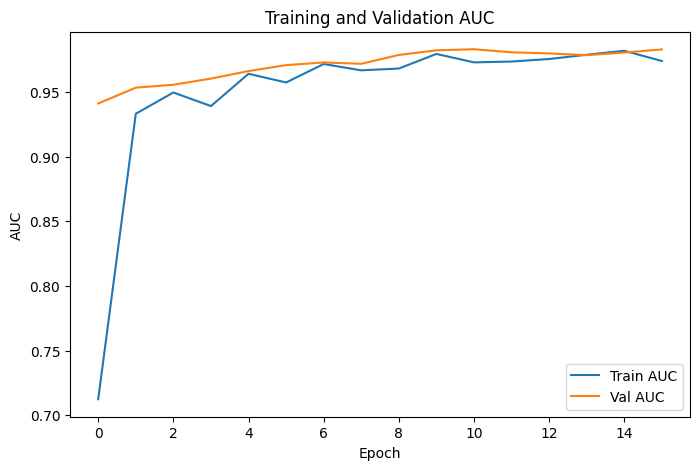

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.5804 - loss: 0.7282 - val_auc: 0.9243 - val_loss: 0.4687
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8995 - loss: 0.3954 - val_auc: 0.9413 - val_loss: 0.4269
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9266 - loss: 0.3415 - val_auc: 0.9525 - val_loss: 0.3953
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9544 - loss: 0.2738 - val_auc: 0.9603 - val_loss: 0.3651
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9588 - loss: 0.2549 - val_auc: 0.9648 - val_loss: 0.3326
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9541 - loss: 0.2730 - val_auc: 0.9678 - val_loss: 0.3025
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9598 - loss: 0.2656 - val_auc: 0.9707 - val_loss: 0.2846
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9525 - loss: 0.2685 - val_auc: 0.9727 - val_loss: 0.2649
Epoch 9/100
15/15 ━━━━━━━

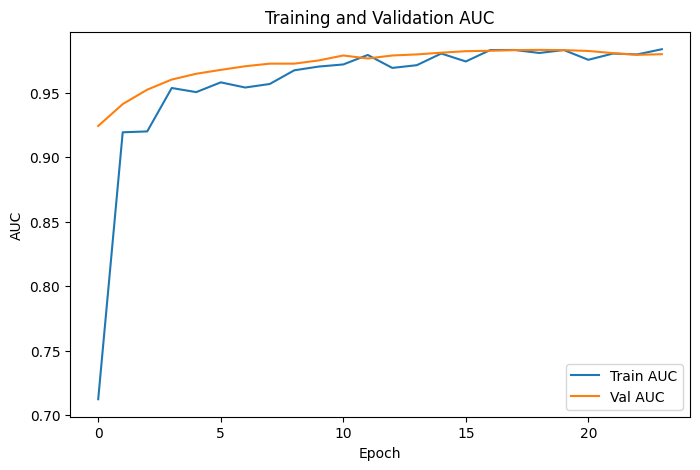

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6180 - loss: 0.8301 - val_auc: 0.9478 - val_loss: 0.5459
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9249 - loss: 0.4214 - val_auc: 0.9613 - val_loss: 0.4617
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9624 - loss: 0.2654 - val_auc: 0.9629 - val_loss: 0.3978
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9352 - loss: 0.3268 - val_auc: 0.9623 - val_loss: 0.3557
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9587 - loss: 0.2660 - val_auc: 0.9616 - val_loss: 0.3242
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9663 - loss: 0.2287 - val_auc: 0.9553 - val_loss: 0.3012
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9711 - loss: 0.2203 - val_auc: 0.9535 - val_loss: 0.2838
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.9691 - loss: 0.2233 - val_auc: 0.9519 - val_loss: 0.2741


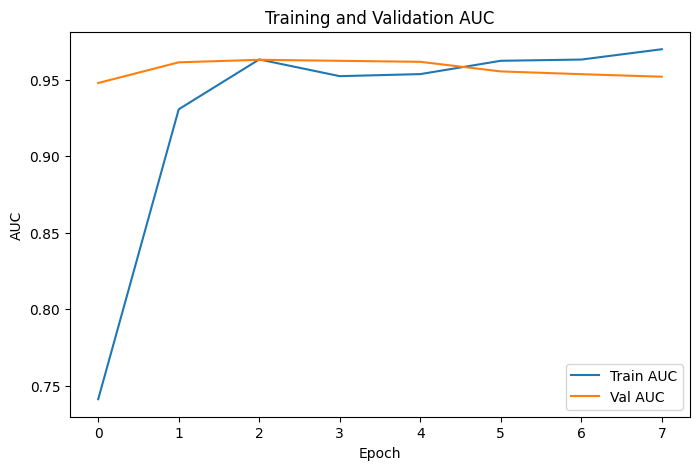

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc: 0.6392 - loss: 0.9229 - val_auc: 0.9759 - val_loss: 0.4728
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9304 - loss: 0.4425 - val_auc: 0.9758 - val_loss: 0.3778
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9429 - loss: 0.3646 - val_auc: 0.9756 - val_loss: 0.3229
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9637 - loss: 0.2452 - val_auc: 0.9775 - val_loss: 0.2827
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9680 - loss: 0.2286 - val_auc: 0.9778 - val_loss: 0.2519
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - auc: 0.9660 - loss: 0.2307 - val_auc: 0.9781 - val_loss: 0.2298
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9808 - loss: 0.1875 - val_auc: 0.9783 - val_loss: 0.2153
Epoch 8/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.9720 - loss: 0.2226 - val_auc: 0.9779 - val_loss: 0.2084
Epoch 9/100
15/15 ━━━━━━━━

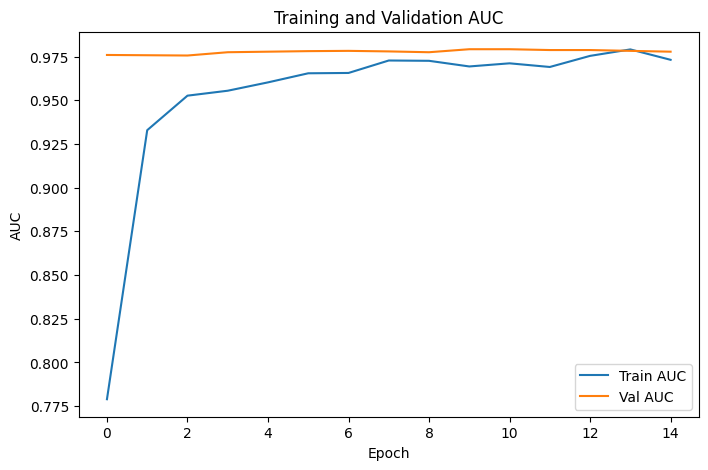

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Dataset_49: Accuracy=0.9148, Precision=0.9424, F1 Score=0.9317, Custom Score=0.9309
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step


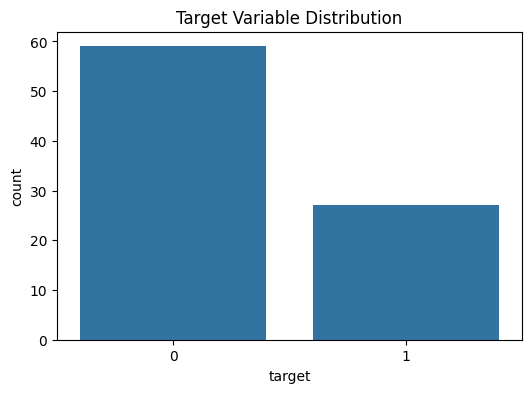

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - auc: 0.5714 - loss: 0.8801 - val_auc: 0.4643 - val_loss: 0.6696
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.3741 - loss: 1.0198 - val_auc: 0.4732 - val_loss: 0.6557
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6304 - loss: 0.7334 - val_auc: 0.4732 - val_loss: 0.6436
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5451 - loss: 0.8342 - val_auc: 0.5000 - val_loss: 0.6331
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6764 - loss: 0.6877 - val_auc: 0.5000 - val_loss: 0.6230
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6687 - loss: 0.6347 - val_auc: 0.4821 - val_loss: 0.6116
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6524 - loss: 0.6291 - val_auc: 0.5000 - val_loss: 0.6015
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7250 - loss: 0.6716 - val_auc: 0.4732 - val_loss: 0.5956
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7483 - loss: 0.6352 -

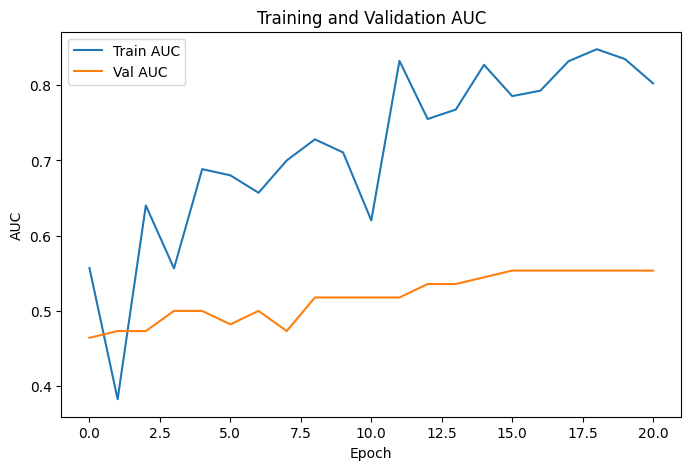

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - auc: 0.5088 - loss: 0.7512 - val_auc: 0.5903 - val_loss: 0.6640
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5467 - loss: 0.7099 - val_auc: 0.6042 - val_loss: 0.6594
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6788 - loss: 0.5829 - val_auc: 0.5972 - val_loss: 0.6591
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - auc: 0.4915 - loss: 0.7096 - val_auc: 0.6181 - val_loss: 0.6600
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5262 - loss: 0.6957 - val_auc: 0.6250 - val_loss: 0.6614
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.8246 - loss: 0.4689 - val_auc: 0.6181 - val_loss: 0.6619
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5879 - loss: 0.6320 - val_auc: 0.6250 - val_loss: 0.6608
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6027 - loss: 0.6020 - val_auc: 0.6389 - val_loss: 0.6578
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7

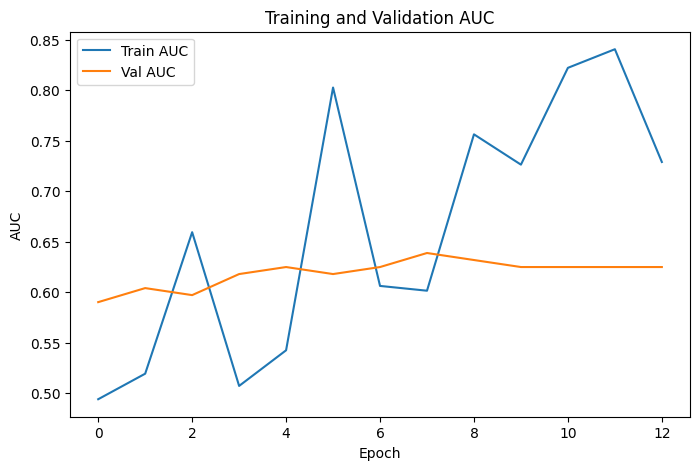

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - auc: 0.5122 - loss: 0.9440 - val_auc: 0.5083 - val_loss: 0.6467
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5681 - loss: 0.9298 - val_auc: 0.4667 - val_loss: 0.6434
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5667 - loss: 0.8244 - val_auc: 0.4583 - val_loss: 0.6428
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6119 - loss: 0.8415 - val_auc: 0.4667 - val_loss: 0.6446
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5664 - loss: 0.8406 - val_auc: 0.5000 - val_loss: 0.6443
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7360 - loss: 0.7163 - val_auc: 0.5167 - val_loss: 0.6445
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7263 - loss: 0.6692 - val_auc: 0.5167 - val_loss: 0.6443
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6642 - loss: 0.6903 - val_auc: 0.5167 - val_loss: 0.6436
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6

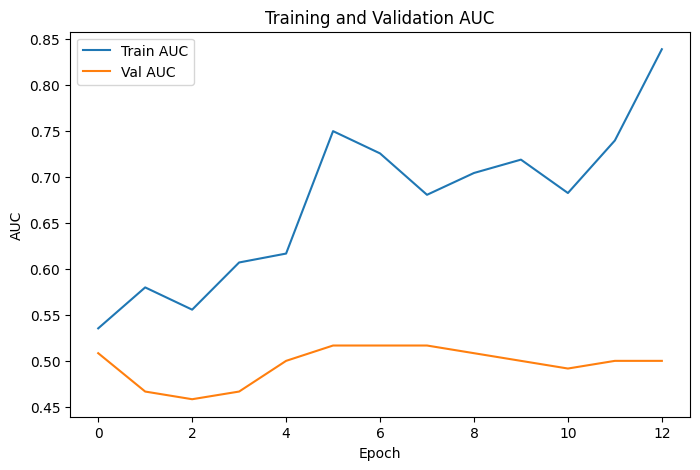

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - auc: 0.5757 - loss: 0.7308 - val_auc: 0.7727 - val_loss: 0.6251
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5217 - loss: 0.7259 - val_auc: 0.7348 - val_loss: 0.6240
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5136 - loss: 0.7831 - val_auc: 0.6970 - val_loss: 0.6240
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.4299 - loss: 0.7998 - val_auc: 0.6970 - val_loss: 0.6243
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.6330 - loss: 0.6934 - val_auc: 0.7045 - val_loss: 0.6230
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.7049 - loss: 0.5805 - val_auc: 0.7045 - val_loss: 0.6214


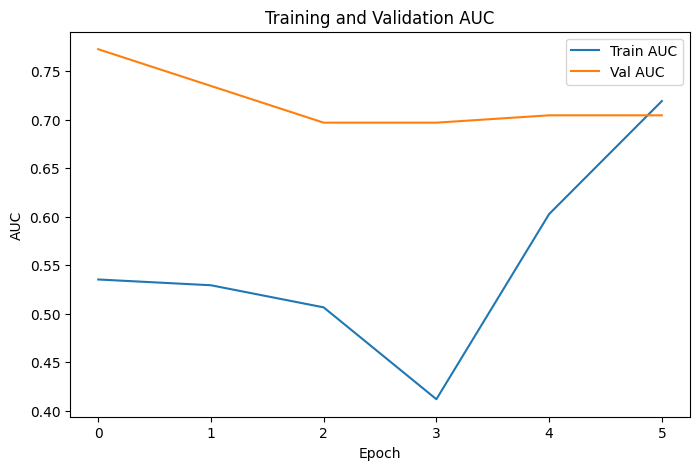

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - auc: 0.5470 - loss: 0.8760 - val_auc: 0.6154 - val_loss: 0.6659
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - auc: 0.5864 - loss: 0.7663 - val_auc: 0.6058 - val_loss: 0.6547
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5754 - loss: 0.8326 - val_auc: 0.6154 - val_loss: 0.6416
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6330 - loss: 0.6880 - val_auc: 0.6058 - val_loss: 0.6302
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6596 - loss: 0.7192 - val_auc: 0.6058 - val_loss: 0.6226
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.6832 - loss: 0.5942 - val_auc: 0.6635 - val_loss: 0.6152
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.5886 - loss: 0.7351 - val_auc: 0.7981 - val_loss: 0.6060
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - auc: 0.8513 - loss: 0.5054 - val_auc: 0.8173 - val_loss: 0.5997
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6

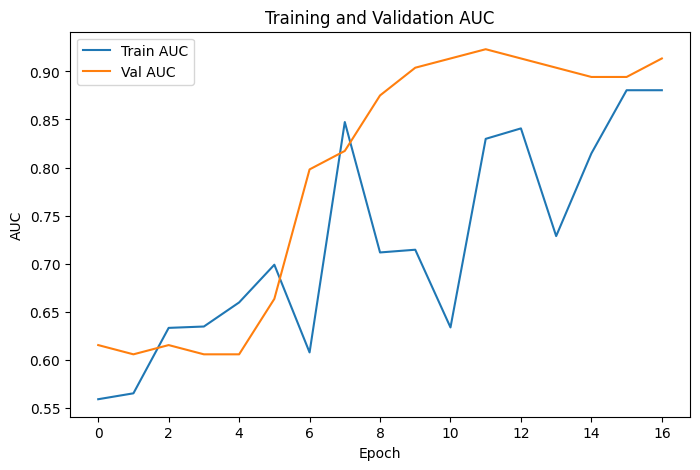

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Dataset_47: Accuracy=0.6621, Precision=0.2000, F1 Score=0.1167, Custom Score=0.3136
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step


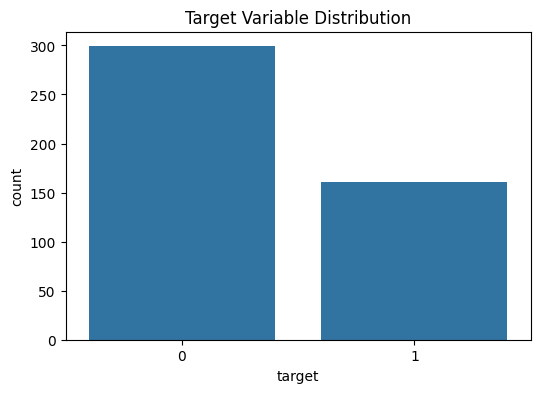

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5268 - loss: 0.7692 - val_auc: 0.6863 - val_loss: 0.6747
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6755 - loss: 0.6412 - val_auc: 0.7427 - val_loss: 0.6527
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7532 - loss: 0.5654 - val_auc: 0.7755 - val_loss: 0.6319
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8423 - loss: 0.4769 - val_auc: 0.7890 - val_loss: 0.6149
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7740 - loss: 0.5648 - val_auc: 0.7930 - val_loss: 0.6002
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8392 - loss: 0.4700 - val_auc: 0.8040 - val_loss: 0.5866
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8363 - loss: 0.4782 - val_auc: 0.8137 - val_loss: 0.5743
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7923 - loss: 0.5242 - val_auc: 0.8161 - val_loss: 0.5626
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.858

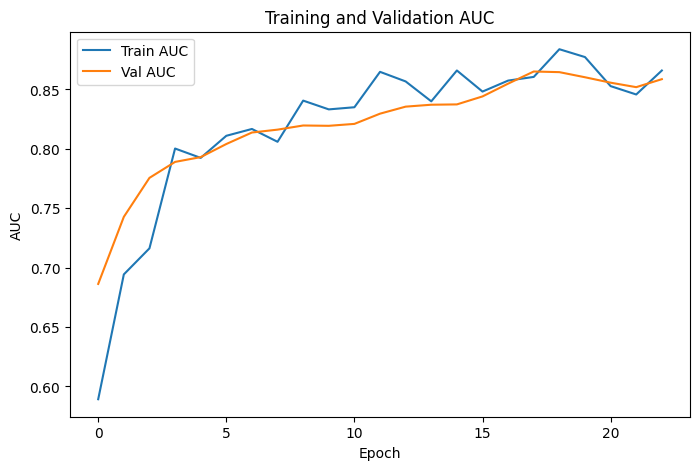

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - auc: 0.5000 - loss: 0.8865 - val_auc: 0.7912 - val_loss: 0.6652
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7069 - loss: 0.6363 - val_auc: 0.7949 - val_loss: 0.6373
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7754 - loss: 0.5587 - val_auc: 0.7840 - val_loss: 0.6186
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8045 - loss: 0.5095 - val_auc: 0.7927 - val_loss: 0.6091
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7881 - loss: 0.5729 - val_auc: 0.7795 - val_loss: 0.6057
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8347 - loss: 0.4694 - val_auc: 0.7793 - val_loss: 0.6038
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8271 - loss: 0.4763 - val_auc: 0.7793 - val_loss: 0.6022


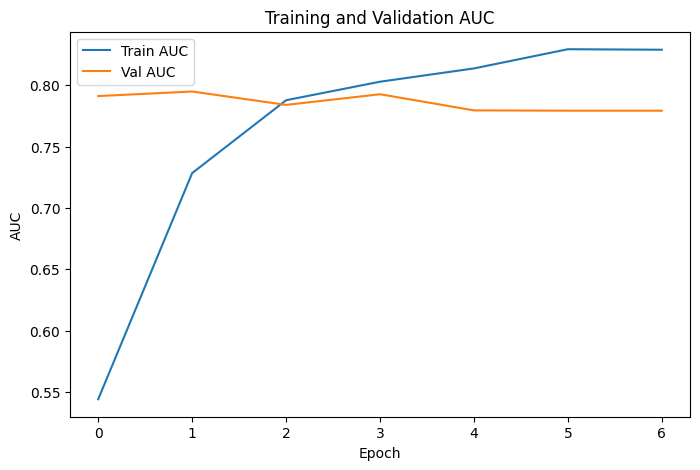

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - auc: 0.5407 - loss: 0.7868 - val_auc: 0.7989 - val_loss: 0.6655
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7538 - loss: 0.5665 - val_auc: 0.8286 - val_loss: 0.6310
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8173 - loss: 0.5059 - val_auc: 0.8251 - val_loss: 0.6010
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7779 - loss: 0.5457 - val_auc: 0.8243 - val_loss: 0.5808
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7842 - loss: 0.5266 - val_auc: 0.8258 - val_loss: 0.5675
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7870 - loss: 0.5377 - val_auc: 0.8220 - val_loss: 0.5555
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8239 - loss: 0.4929 - val_auc: 0.8195 - val_loss: 0.5467


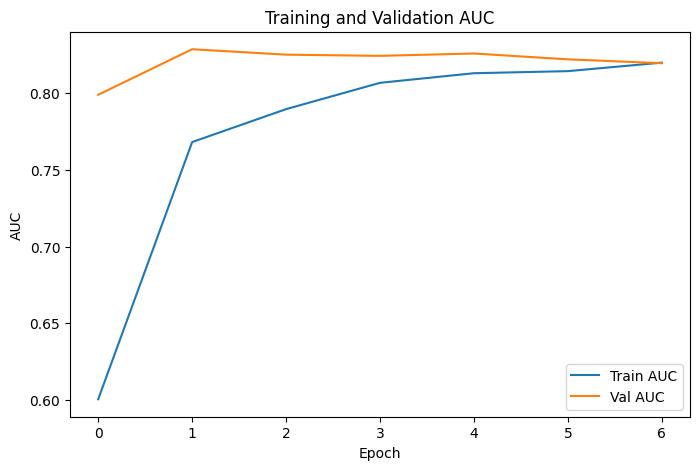

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.6020 - loss: 1.0871 - val_auc: 0.8259 - val_loss: 0.6538
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7141 - loss: 0.7854 - val_auc: 0.8485 - val_loss: 0.6283
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7700 - loss: 0.6323 - val_auc: 0.8564 - val_loss: 0.6010
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8357 - loss: 0.5544 - val_auc: 0.8654 - val_loss: 0.5743
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8125 - loss: 0.5464 - val_auc: 0.8652 - val_loss: 0.5527
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7601 - loss: 0.5858 - val_auc: 0.8724 - val_loss: 0.5341
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7504 - loss: 0.6052 - val_auc: 0.8724 - val_loss: 0.5219
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8144 - loss: 0.4917 - val_auc: 0.8752 - val_loss: 0.5098
Epoch 9/100
12/12 ━━━━━━━

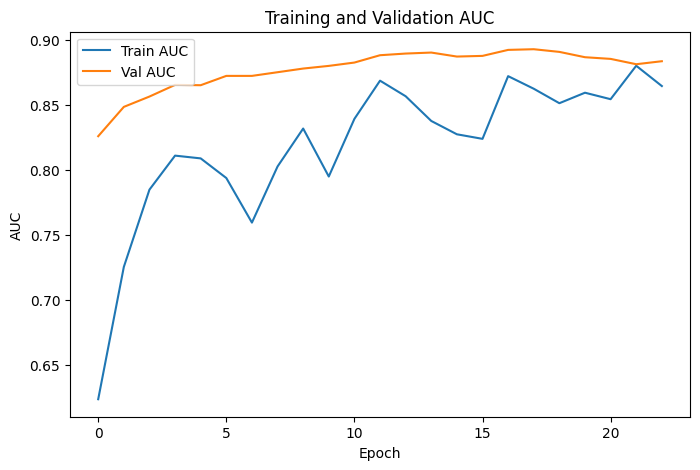

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step 
Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - auc: 0.3766 - loss: 1.1430 - val_auc: 0.7112 - val_loss: 0.6603
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7100 - loss: 0.7398 - val_auc: 0.7229 - val_loss: 0.6395
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7562 - loss: 0.6332 - val_auc: 0.7422 - val_loss: 0.6213
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.7714 - loss: 0.5930 - val_auc: 0.7734 - val_loss: 0.6054
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8172 - loss: 0.5422 - val_auc: 0.7958 - val_loss: 0.5906
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8216 - loss: 0.5023 - val_auc: 0.8181 - val_loss: 0.5737
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8107 - loss: 0.5295 - val_auc: 0.8259 - val_loss: 0.5624
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.8218 - loss: 0.4841 - val_auc: 0.8343 - val_loss: 0.5530
Epoch 9/100
12/12 ━━━━━━

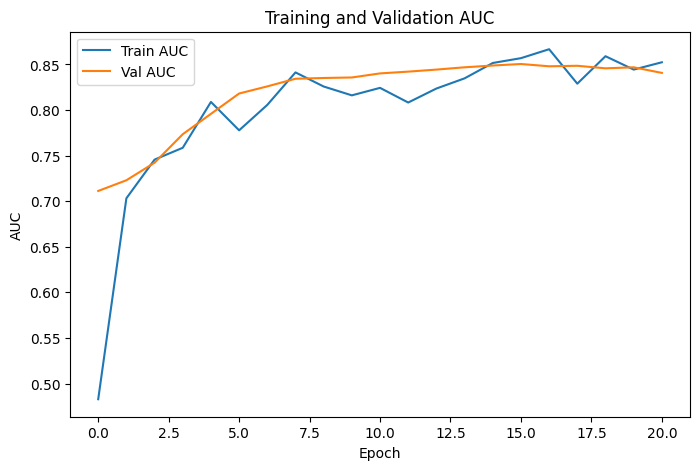

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Dataset_40: Accuracy=0.7739, Precision=0.7827, F1 Score=0.5992, Custom Score=0.7250
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step


,Dataset,Accuracy,Precision,F1 Score,Custom Score
0,Dataset_2,0.937634,0.914336,0.921390,0.923442
1,Dataset_35,0.767391,0.791867,0.570949,0.718249
2,Dataset_5,0.922981,0.033333,0.036364,0.301137
3,Dataset_32,0.853383,0.000000,0.000000,0.256015
4,Dataset_4,0.937788,0.066667,0.100000,0.338003
5,Dataset_33,0.941667,0.962838,0.918066,0.943055
6,Dataset_3,0.593407,0.580375,0.625088,0.597698
7,Dataset_34,0.770236,0.764104,0.718606,0.752294
8,Dataset_45,0.865927,0.418182,0.300000,0.517051
9,Dataset_42,0.908333,0.860595,0.913998,0.890937


In [4]:

# Dictionary to store scores for each dataset
summary_scores = {"Dataset": [], "Accuracy": [], "Precision": [], "F1 Score": [], "Custom Score": []}

for dataset_folder in dataset_folders:
    # Load data
    X_train = pd.read_csv(os.path.join(dataset_folder, 'X_train.csv'))
    y_train = pd.read_csv(os.path.join(dataset_folder, 'y_train.csv'))
    X_test = pd.read_csv(os.path.join(dataset_folder, 'X_test.csv'))
    
    # Preprocess data
    X_train_scaled = preprocess_data(X_train, y_train)
    X_test_scaled = preprocess_data(X_test)
    
    # Perform 5-fold cross-validation on training data
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    accuracies, precisions, f1_scores = [], [], []
    
    for train_index, val_index in kf.split(X_train_scaled):
        X_train_part, X_val = X_train_scaled[train_index], X_train_scaled[val_index]
        y_train_part, y_val = y_train.iloc[train_index], y_train.iloc[val_index]
        
        # Train and evaluate model
        model = create_and_train_model(X_train_part, y_train_part, X_val, y_val, X_train_scaled.shape[1])
        
        y_val_pred = (model.predict(X_val) > 0.5).astype(int)
        accuracies.append(accuracy_score(y_val, y_val_pred))
        precisions.append(precision_score(y_val, y_val_pred))
        f1_scores.append(f1_score(y_val, y_val_pred))
    
    # Calculate mean scores from cross-validation
    accuracy, precision, f1 = np.mean(accuracies), np.mean(precisions), np.mean(f1_scores)
    custom_score = accuracy * 0.3 + precision * 0.4 + f1 * 0.3
    
    # Record in summary
    dataset_name = os.path.basename(dataset_folder)
    summary_scores["Dataset"].append(dataset_name)
    summary_scores["Accuracy"].append(accuracy)
    summary_scores["Precision"].append(precision)
    summary_scores["F1 Score"].append(f1)
    summary_scores["Custom Score"].append(custom_score)
    
    print(f"{dataset_name}: Accuracy={accuracy:.4f}, Precision={precision:.4f}, F1 Score={f1:.4f}, Custom Score={custom_score:.4f}")
    
    # Inference on test set
    y_test_pred_prob = model.predict(X_test_scaled).flatten()
    output_path = os.path.join(dataset_folder, 'y_predict.csv')
    pd.DataFrame(y_test_pred_prob, columns=['Predicted']).to_csv(output_path, index=False)

# Convert summary scores to DataFrame
summary_df = pd.DataFrame(summary_scores)
summary_df


<Figure size 1600x1000 with 0 Axes>

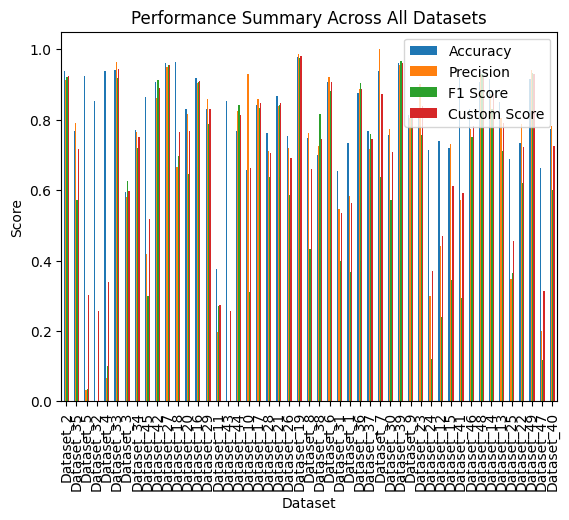

In [7]:

# Plot summary scores
#plt.figure(figsize=(12, 8))
plt.figure(figsize=(16, 10))
summary_df.set_index('Dataset')[["Accuracy", "Precision", "F1 Score", "Custom Score"]].plot(kind='bar', stacked=False)
plt.title("Performance Summary Across All Datasets")
plt.ylabel("Score")
plt.xticks(rotation=90)
plt.legend(loc='best')
plt.show()
